In [1]:
!pip install matminer
!pip install dgl -f https://data.dgl.ai/wheels/torch-2.4/repo.html
!pip install matgl

import matgl
matgl.set_backend("DGL")

Looking in links: https://data.dgl.ai/wheels/torch-2.4/repo.html


In [2]:
#from pymatgen.core import Lattice, Structure

#model = matgl.load_model("MEGNet-MP-2018.6.1-Eform")

#struct = Structure.from_spacegroup("Pm-3m", Lattice.cubic(4.1437), ["Cs", "Cl"], [[0, 0, 0], [0.5, 0.5, 0.5]])
#eform = model.predict_structure(struct)
#print(f"The predicted formation energy for CsCl is {float(eform.numpy()):.3f} eV/atom.")

In [3]:
#!pip install "numpy<2"
#!pip install dgl==2.2.0
#!pip install torch==2.3.0
#!pip install "torchdata<=0.8.0"
!pip install xgboost
!pip install catboost
#!pip install matgl

In [4]:
import torch
from pymatgen.core import Lattice, Structure

#struct = Structure.from_spacegroup("Pm-3m", Lattice.cubic(4.1437), ["Cs", "Cl"], [[0, 0, 0], [0.5, 0.5, 0.5]])
#model = matgl.load_model("MEGNet-MP-2019.4.1-BandGap-mfi")

In [5]:
# Load the pre-trained M3GNet formation energy model
#model = matgl.load_model("M3GNet-MP-2018.6.1-Eform")
#eform = model.predict_structure(struct)
#print(f"The predicted formation energy for CsCl is {float(eform):.3f} eV/atom.")

# Extract the structure features of a structure
#feat_dict = model.model.predict_structure(struct, return_features=True)
# Print out structure-wise features, it should be the dimension of node_features * 2 from set2set layer
#print(feat_dict["readout"].shape)



In [6]:
import pandas as pd
import numpy as np
import plotly as pt
import seaborn as sns
#!pip install pymatgen
!pip install mp_api
import requests
import json
import matplotlib.pyplot as plt


#Initialization

In [7]:
#Input
cif_folder = "/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/"
dataset_from_google_drive = True
merge_datasets = False

#Augmentation
do_augmentation = False

#Outliers
remove_outliers = True
remove_outliers_manually = True
remove_outliers_after_descriptors = False

#Normalization vs Standartization
normalization_type =  'Stand' #'Stand' #'Norm'
log_transform = False

#CIFs
extract_CIFs = False
update_IDs = False  #request material IDs from databases
embedding_type = 'None' #   'None',  'SiteStatsFingerprint' , 'M3GNet', 'RDF', 'CGCNN', 'electronic_RDF'

#Feature selection
do_PCA_on_embeddings_only = False
do_LASSO = False
feature_selection_type = 'RFE' #'Manual', 'Variance_treshold', 'K_best_features', 'RFE', 'PCA'

#ML
stratification = True
non_uniform_stratification = False

target_col = 'Log_rate'
finite_log_of_zero_rate = False
cross_validation = False
grid_search = False



In [8]:
sheet = 'Photocatalytic dataset'
#sheet = 'Photocatalytic dataset 2'
df = None
if(merge_datasets):
  sheet = 'Photocatalytic dataset'
  df1 = pd.read_excel("/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/Perovskite dataset export.xlsx",sheet_name=sheet)
  sheet = 'Photocatalytic dataset 2'
  df2 = pd.read_excel("/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/Perovskite dataset export.xlsx",sheet_name=sheet)
  df = pd.concat([df1, df2], ignore_index=True)
elif(dataset_from_google_drive):
  df = pd.read_excel("/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/Perovskite dataset export.xlsx",sheet_name=sheet)
else:
  df = pd.read_excel("dataset.xlsx")

In [9]:
df

,Perovskite,Class,Hill formula,Interlayer space composition,"Bandgap, eV",DOI,Materials Project ID,COD_ID,Springer_ID,MP_CIF_modifier,...,"CatW, g/L","Alcohol, %",Sac Agent 1,Sac agent 2,Light type,"Power, W","Wave length min, nm",Cell material,"Temperature, K","Rate, umol/(g*h)"
0,K4Nb6O17,K4Nb6O17,K4 Nb6 O17,NaN,3.50,10.1007/BF00765319,mp-560692,1001842,NaN,NaN,...,2.85,14.3,-,-,Hg lamp,450.0,NaN,NaN,NaN,130.000000
1,KLaNb2O7,HLaNb2O7,K1 La1 Nb2 O7,NaN,3.20,10.1007/BF00765319,mp-1223501,1545643,NaN,NaN,...,2.85,14.3,-,-,Hg lamp,450.0,NaN,NaN,NaN,28.000000
2,RbLaNb2O7,HLaNb2O7,Rb1 La1 Nb2 O7,NaN,3.35,10.1007/BF00765319,mp-553965,-1,NaN,NaN,...,2.85,14.3,-,-,Hg lamp,450.0,NaN,NaN,NaN,60.000000
3,CsLaNb2O7,HLaNb2O7,Cs1 La1 Nb2 O7,NaN,3.30,10.1007/BF00765319,mp-553248,2004917,NaN,NaN,...,2.85,14.3,-,-,Hg lamp,450.0,NaN,NaN,NaN,12.000000
4,KCa2Nb3O10,KCa2Nb3O10,K1 Ca2 Nb3 O10,NaN,3.35,10.1007/BF00765319,mp-557195,1521061,NaN,NaN,...,2.85,14.3,-,-,Hg lamp,450.0,NaN,NaN,NaN,14.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,TiO2,oxide,Ti1 O2,NaN,3.20,10.1134/S107036321404001X,mp-1245098,1010942,NaN,NaN,...,1.00,0.1,-,-,Hg lamp,125.0,220.0,quartz,288.0,38.181818
1085,TiO2,oxide,Ti1 O2,NaN,3.20,10.1134/S107036321404001X,mp-1245098,1010942,NaN,NaN,...,1.00,0.1,-,-,Hg lamp,125.0,220.0,quartz,288.0,36.363636
1086,TiO2,oxide,Ti1 O2,NaN,3.20,10.1134/S107036321404001X,mp-1245098,1010942,NaN,NaN,...,1.00,0.1,-,-,Hg lamp,125.0,220.0,quartz,288.0,9.090909
1087,TiO2,oxide,Ti1 O2,NaN,3.20,10.1134/S107036321404001X,mp-1245098,1010942,NaN,NaN,...,1.00,0.1,-,-,Hg lamp,125.0,220.0,quartz,288.0,9.090909


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1089 entries, 0 to 1088
Data columns (total 89 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Perovskite                            1089 non-null   object 
 1   Class                                 846 non-null    object 
 2   Hill formula                          1089 non-null   object 
 3   Interlayer space composition          5 non-null      object 
 4   Bandgap, eV                           1054 non-null   float64
 5   DOI                                   1084 non-null   object 
 6   Materials Project ID                  1058 non-null   object 
 7   COD_ID                                935 non-null    object 
 8   Springer_ID                           257 non-null    object 
 9   MP_CIF_modifier                       510 non-null    object 
 10  COD_CIF_modifier                      197 non-null    object 
 11  Springer_CIF_modi

In [11]:
df.describe()

,"Bandgap, eV",Z,Z_MP,Z_COD,Z_Springer,"d,A",a_MP,b_MP,c_MP,a_COD,...,Oxygen_concentration avg,Packing fraction avg,CalcT(K),Calc time (h),"CatW, g/L","Alcohol, %","Power, W","Wave length min, nm","Temperature, K","Rate, umol/(g*h)"
count,1054.000000,694.000000,832.000000,836.000000,836.000000,810.000000,827.000000,354.000000,354.000000,832.000000,...,832.000000,832.000000,1010.000000,973.000000,987.000000,966.000000,994.000000,689.000000,540.000000,989.000000
mean,3.313241,2.275216,1.260817,1.281100,0.151715,14.386401,3.084536,7.406617,14.790353,3.040421,...,inf,0.238767,1287.020792,19.338386,1.428618,5.628230,306.726358,288.388970,294.435185,6914.999659
std,0.644047,1.762830,3.460696,2.116075,0.642689,7.950408,4.236046,3.399894,8.264087,6.154639,...,NaN,0.257556,222.542464,25.264723,1.324191,8.781436,198.606250,88.814702,13.175195,21648.175384
min,0.010000,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,3.840000,3.904344,0.000000,...,0.000000,0.000000,453.000000,0.000000,0.000000,0.000000,100.000000,200.000000,288.000000,0.000000
25%,3.100000,1.000000,0.000000,0.000000,0.000000,11.185000,0.000000,3.950634,10.502783,0.000000,...,0.037279,0.000000,1223.000000,10.000000,0.500000,0.000000,125.000000,220.000000,288.000000,15.500000
50%,3.410000,2.000000,0.000000,0.000000,0.000000,14.733000,0.000000,7.415443,12.879040,0.000000,...,0.042938,0.000000,1373.000000,12.000000,1.000000,1.000000,300.000000,220.000000,288.000000,166.000000
75%,3.600000,4.000000,1.000000,2.000000,0.000000,17.850000,5.801718,7.938952,15.513552,3.899000,...,0.046684,0.533675,1423.000000,24.000000,2.000000,10.000000,450.000000,400.000000,293.000000,1680.000000
max,5.500000,16.000000,50.000000,16.000000,4.000000,38.670000,22.855297,20.551678,48.809404,41.857000,...,inf,0.657822,1873.000000,200.000000,10.000000,90.000000,1000.000000,660.000000,333.000000,156000.000000


In [12]:
df.columns

Index(['Perovskite', 'Class', 'Hill formula', 'Interlayer space composition',
       'Bandgap, eV', 'DOI', 'Materials Project ID', 'COD_ID', 'Springer_ID',
       'MP_CIF_modifier', 'COD_CIF_modifier', 'Springer_CIF_modifier',
       'Materials Project verification', 'COD verification',
       'Springer verification', 'General verification', 'MP_CIF_modified',
       'COD_CIF_modified', 'Springer_CIF_modified', 'Z', 'Z_MP', 'Z_COD',
       'Z_Springer', 'a, A', 'b, A', 'c, A', 'Symmetry group', 'd,A', 'a_MP',
       'b_MP', 'c_MP', 'a_COD', 'b_COD', 'c_COD', 'a_Springer', 'b_Springer',
       'c_Springer', 'Number of octahedrons on a layer', 'Valence electrons',
       'Volume', 'Volume_MP', 'Volume_COD', 'Volume_Springer',
       'Valence Electrons Density', 'Valence Electrons Density_MP',
       'Valence Electrons Density_COD', 'Springer_Valence Electrons Density',
       'avg s valence electrons', 'avg p valence electrons',
       'avg d valence electrons', 'avg f valence electrons'

In [13]:
#list of colums used further
init_columns = ['Perovskite', 'Hill formula','Interlayer space composition','Class',
       'Bandgap, eV', 'Materials Project ID', 'COD_ID', 'Springer_ID',
       'Z', 'a, A', 'b, A', 'c, A',
       'Symmetry group', 'd,A',
       'Number of octahedrons on a layer', 'Prep Method', 'CalcT(K)', 'Calc time (h)',
       'Nitrogen', 'Promotion method', 'Promoter', 'Promoter, w%',
       'Surface area, m2/g', 'CatW, g/L', 'Alcohol, %', 'Sac Agent 1',
       'Sac agent 2', 'Light type', 'Power, W', 'Wave length min, nm',
       'Cell material', 'Temperature, K', 'Rate, umol/(g*h)']

init_columns = init_columns + ['MP_CIF_modifier', 'COD_CIF_modifier', 'Springer_CIF_modifier',
       'Materials Project verification', 'COD verification',
       'Springer verification', 'General verification', 'MP_CIF_modified',
       'COD_CIF_modified', 'Springer_CIF_modified']
print(init_columns)

['Perovskite', 'Hill formula', 'Interlayer space composition', 'Class', 'Bandgap, eV', 'Materials Project ID', 'COD_ID', 'Springer_ID', 'Z', 'a, A', 'b, A', 'c, A', 'Symmetry group', 'd,A', 'Number of octahedrons on a layer', 'Prep Method', 'CalcT(K)', 'Calc time (h)', 'Nitrogen', 'Promotion method', 'Promoter', 'Promoter, w%', 'Surface area, m2/g', 'CatW, g/L', 'Alcohol, %', 'Sac Agent 1', 'Sac agent 2', 'Light type', 'Power, W', 'Wave length min, nm', 'Cell material', 'Temperature, K', 'Rate, umol/(g*h)', 'MP_CIF_modifier', 'COD_CIF_modifier', 'Springer_CIF_modifier', 'Materials Project verification', 'COD verification', 'Springer verification', 'General verification', 'MP_CIF_modified', 'COD_CIF_modified', 'Springer_CIF_modified']


In [14]:
df = df[init_columns]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1089 entries, 0 to 1088
Data columns (total 43 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Perovskite                        1089 non-null   object 
 1   Hill formula                      1089 non-null   object 
 2   Interlayer space composition      5 non-null      object 
 3   Class                             846 non-null    object 
 4   Bandgap, eV                       1054 non-null   float64
 5   Materials Project ID              1058 non-null   object 
 6   COD_ID                            935 non-null    object 
 7   Springer_ID                       257 non-null    object 
 8   Z                                 694 non-null    float64
 9   a, A                              735 non-null    object 
 10  b, A                              717 non-null    object 
 11  c, A                              717 non-null    object 
 12  Symmet

#Formatting


In [15]:
#replace abbreviations with chemical formulas
subs_map = {
    "Ph": "C6H5",
    "Bn": "C7H7",
    #"Pr": "C3H7",
    "Bu": "C4H9",
    "Hx": "C6H13",
    "Me": "CH3",
    "Et": "C2H5",
    "Oc": "C8H17",
    "Dc": "C10H21",
}

import re

def expand_substituents(formula):
    if pd.isna(formula):
        return formula

    for abbr, full in subs_map.items():
        formula = re.sub(rf'{abbr}', full, formula)
    return formula

In [16]:
#remove samples with undefined indexes in formulas
print(df.shape[0])
df = df[~df['Perovskite'].str.contains("Nx", na=False)]
df = df[~df['Perovskite'].str.contains("Ox", na=False)]
print(df.shape[0])

1089
1089


In [17]:
df['Perovskite'] = df['Perovskite'].apply(expand_substituents)

In [18]:
df = df.replace("-", np.nan)
df["a, A"] = df["a, A"].astype("float64")
df["b, A"] = df["b, A"].astype("float64")
df["c, A"] = df["c, A"].astype("float64")
df["Number of octahedrons on a layer"] = df["Number of octahedrons on a layer"].astype("float64")

/tmp/ipykernel_17433/3678714408.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace("-", np.nan)


In [19]:
df["Nitrogen"] = df["Nitrogen"].fillna(False)
df["Nitrogen"]
df["Nitrogen"].astype("bool")
df["Nitrogen"].value_counts()

/tmp/ipykernel_17433/1068474039.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["Nitrogen"] = df["Nitrogen"].fillna(False)


,count
Nitrogen,
False,1029
True,60


In [20]:
df["Promoter, w%"] = df["Promoter, w%"].fillna(0)
df["Promoter, w%"].value_counts()

,count
"Promoter, w%",
0.000,496
1.000,295
0.100,82
0.500,74
0.150,27
0.200,24
0.300,21
3.000,16
2.000,10


In [21]:
df["Surface area, m2/g"] = df["Surface area, m2/g"].astype("float64")
df["Surface area, m2/g"].value_counts()

#df['Materials Project ID'] = df['Materials Project ID'].astype(str)
print(df['Materials Project ID'].dtype)

object


In [22]:
df["Perovskite"].value_counts()

,count
Perovskite,
HCa2Nb3O10,33
La2Ti2O7,32
H2Nd2Ti3O10*2C4H9NH2,32
TiO2,30
K4Nb6O17,28
...,...
Na2La2Mn0.1Ti2.9O10,1
Na2La2Mn0.3Ti2.7O10,1
Na2La2Mn0.5Ti2.5O10,1


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1089 entries, 0 to 1088
Data columns (total 43 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Perovskite                        1089 non-null   object 
 1   Hill formula                      1089 non-null   object 
 2   Interlayer space composition      5 non-null      object 
 3   Class                             846 non-null    object 
 4   Bandgap, eV                       1054 non-null   float64
 5   Materials Project ID              1058 non-null   object 
 6   COD_ID                            935 non-null    object 
 7   Springer_ID                       257 non-null    object 
 8   Z                                 694 non-null    float64
 9   a, A                              731 non-null    float64
 10  b, A                              713 non-null    float64
 11  c, A                              713 non-null    float64
 12  Symmet

In [24]:
df.to_excel("checkpoint_formatting.xlsx")


#Data cleaning

##Missing data handling

In [25]:
df.isna().sum()

,0
Perovskite,0
Hill formula,0
Interlayer space composition,1084
Class,243
"Bandgap, eV",35
Materials Project ID,31
COD_ID,154
Springer_ID,832
Z,395
"a, A",358


In [26]:
df.columns

Index(['Perovskite', 'Hill formula', 'Interlayer space composition', 'Class',
       'Bandgap, eV', 'Materials Project ID', 'COD_ID', 'Springer_ID', 'Z',
       'a, A', 'b, A', 'c, A', 'Symmetry group', 'd,A',
       'Number of octahedrons on a layer', 'Prep Method', 'CalcT(K)',
       'Calc time (h)', 'Nitrogen', 'Promotion method', 'Promoter',
       'Promoter, w%', 'Surface area, m2/g', 'CatW, g/L', 'Alcohol, %',
       'Sac Agent 1', 'Sac agent 2', 'Light type', 'Power, W',
       'Wave length min, nm', 'Cell material', 'Temperature, K',
       'Rate, umol/(g*h)', 'MP_CIF_modifier', 'COD_CIF_modifier',
       'Springer_CIF_modifier', 'Materials Project verification',
       'COD verification', 'Springer verification', 'General verification',
       'MP_CIF_modified', 'COD_CIF_modified', 'Springer_CIF_modified'],
      dtype='object')

In [27]:
drop_columns = ['Perovskite', 'Bandgap, eV',
       'Prep Method', 'CalcT(K)', 'Calc time (h)',
       'CatW, g/L', 'Light type',
       'Power, W',
       'Rate, umol/(g*h)']

drop_columns=['Perovskite','Rate, umol/(g*h)'] #drop nan in these columns



df.dropna(subset=drop_columns, inplace=True)
df.shape[0]

989

In [28]:
df['Light type'] = df['Light type'].fillna(df['Light type'].mode()[0])
df['Prep Method'] = df['Prep Method'].fillna(df['Prep Method'].mode()[0])
if(df["Cell material"].notna().sum()==0):
  df["Cell material"] = df["Cell material"].fillna("quartz")
else:
  df["Cell material"] = df["Cell material"].fillna(df["Cell material"].mode()[0])
  print(df["Cell material"].mode()[0])

quartz


In [29]:
df = df[df["General verification"] == False]  #remove samples without CIF files
df.shape[0]

910

In [30]:
df.isna().sum()

,0
Perovskite,0
Hill formula,0
Interlayer space composition,906
Class,182
"Bandgap, eV",31
Materials Project ID,18
COD_ID,121
Springer_ID,688
Z,363
"a, A",331


In [31]:
def calculate_average_specific_area(dataframe):
  total=0;
  n=0;
  for index, row in df.iterrows():
    area =  row['Surface area, m2/g']
    if(np.isnan(area) or area > 55):
      continue
    total += area
    n+=1
  return total/n

In [32]:
#avr_specific_area = calculate_average_specific_area(df)
#print(avr_specific_area)
#df["Surface area, m2/g"] = df["Surface area, m2/g"].fillna(avr_specific_area)

#df["Alcohol, %"] = df["Alcohol, %"].fillna(0)
#df["Wave length min, nm"] = df["Wave length min, nm"].fillna(df["Wave length min, nm"].min())
#df["Cell material"] = df["Cell material"].fillna(df["Cell material"].mode()[0])
#print(df["Cell material"].mode()[0])
#df["Temperature, K"] = df["Temperature, K"].fillna(298.15)
df["Materials Project ID"] = df["Materials Project ID"].fillna(-1)
df["COD_ID"] = df["COD_ID"].fillna(-1)
df["Springer_ID"] = df["Springer_ID"].fillna(-1)

In [33]:
df["Promoter"] = df["Promoter"].fillna("No promoter")
df["Promotion method"] = df["Promotion method"].fillna("No promotion")

In [34]:
if(finite_log_of_zero_rate):
  df['Rate, umol/(g*h)'].replace(0, 0.1, inplace=True)

df['Log_rate'] = np.log(df['Rate, umol/(g*h)'])
df['Log_rate'].replace([np.inf, -np.inf], np.nan, inplace=True)
df = df.dropna(subset=["Log_rate"])
df['Log_rate'].value_counts()

/usr/local/lib/python3.12/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_17433/952295878.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Log_rate'].replace([np.inf, -np.inf], np.nan, inplace=True)


,count
Log_rate,
2.302585,14
2.995732,11
1.609438,10
1.791759,8
5.298317,7
...,...
6.583706,1
-1.609438,1
1.568616,1


In [35]:
#raise SystemExit("Stopping execution")
print(df.shape[0])
df = df[df["Sac Agent 1"].isna()]  #select only rows without sacrificing agents
df = df[df["Sac agent 2"].isna()]
print(df.shape[0])

821
736


In [36]:
#df["d,A"] = df["d,A"].fillna(df["d,A"].mean())
#print(df["d,A"].mean())


In [37]:
df.isna().sum()

,0
Perovskite,0
Hill formula,0
Interlayer space composition,732
Class,130
"Bandgap, eV",21
Materials Project ID,0
COD_ID,0
Springer_ID,0
Z,267
"a, A",252


## Duplicates handling

In [38]:
duplicates = df[ df.duplicated()]
duplicates

,Perovskite,Hill formula,Interlayer space composition,Class,"Bandgap, eV",Materials Project ID,COD_ID,Springer_ID,Z,"a, A",...,COD_CIF_modifier,Springer_CIF_modifier,Materials Project verification,COD verification,Springer verification,General verification,MP_CIF_modified,COD_CIF_modified,Springer_CIF_modified,Log_rate


#Featurizing





## Material Project IDs


In [39]:
from mp_api.client import MPRester

API_KEY = "GFsoU5OV3dEngGT860TOtWcn35bE4y6l"
with MPRester(API_KEY) as mpr:
    materials = mpr.materials.search(formula="KCa2Nb3O10")
for material in materials:
    print(material.material_id, material.formula_pretty)

Retrieving MaterialsDoc documents:   0%|          | 0/2 [00:00<?, ?it/s]

mp-557195 KCa2Nb3O10
mp-1223594 KCa2Nb3O10


In [40]:
#extract ID of entry from Materials Project based on chemical formula
def get_material_id_by_formula(f):
  with MPRester(API_KEY) as mpr:
    print(f"Composition: {f}")
    try:
      materials = mpr.materials.search(formula=f)
      if len(materials)>0:
        print(f"Composition: {f} ID is {materials[0].material_id}")
        return str(materials[0].material_id)
      else:
        print(f"Composition: {f} ID is not found")
        return str(-1)
    except Exception as e:
      print(f"Composition: {f} ID is not found")
      return str(-1)

In [41]:
def update_Materials_Project_IDs(_df):
  for index, row in _df.iterrows():
        if pd.isna(row['Materials Project ID']) or row['Materials Project ID']==-1 or row['Materials Project ID']==-2 :
            new_id = get_material_id_by_formula(row['Perovskite'])
            print(f"New ID fetched: {new_id}  for formula {row['Perovskite']}")
            _df.at[index, 'Materials Project ID'] = str(new_id)
  return _df

In [42]:
#update_IDs = True
if update_IDs:
  df = update_Materials_Project_IDs(df)

##HIll's formula

In [43]:
import re
from collections import Counter
def parse_formula(formula):
    #Extracts element counts from a chemical formula.
    print("Parsing formula: ",formula)
    #pattern = r"([A-Z][a-z]*)(\d*)"
    pattern = r"([A-Z][a-z]*)(\d*\.?\d*)"
    matches = re.findall(pattern, formula)

    element_counts = Counter()
    for element, count in matches:
        element_counts[element] += float(count) if count else 1  # Default to 1 if count is missing

    return element_counts

#converts chemical formula string to Hill's notation
def to_hill_notation(formula):
    #Converts a chemical formula to Hill notation
    element_counts = parse_formula(formula)

    # Hill notation rules
    if "C" in element_counts:
        elements_sorted = ["C", "H"] if "H" in element_counts else ["C"]
        remaining_elements = sorted(e for e in element_counts if e not in ["C", "H"])
        elements_sorted.extend(remaining_elements)
    else:
        elements_sorted = sorted(element_counts.keys())
    hill_formula = " ".join(f"{el}{element_counts[el] if element_counts[el] > 1 else ''}" for el in elements_sorted)
    #print(f':{hill_formula}:')
    return hill_formula


In [44]:
formulas = ["H2O", "C6H12O6", "NH3", "Fe2O3", "CH4", "CCl4", "H4C", "KCa2Nb3O10"]
for f in formulas:
    print(f"{f} -> {to_hill_notation(f)}")

Parsing formula:  H2O
H2O -> H2.0 O
Parsing formula:  C6H12O6
C6H12O6 -> C6.0 H12.0 O6.0
Parsing formula:  NH3
NH3 -> H3.0 N
Parsing formula:  Fe2O3
Fe2O3 -> Fe2.0 O3.0
Parsing formula:  CH4
CH4 -> C H4.0
Parsing formula:  CCl4
CCl4 -> C Cl4.0
Parsing formula:  H4C
H4C -> C H4.0
Parsing formula:  KCa2Nb3O10
KCa2Nb3O10 -> Ca2.0 K Nb3.0 O10.0


In [45]:
print(to_hill_notation("ZnIn1.5S3.25"))

Parsing formula:  ZnIn1.5S3.25
In1.5 S3.25 Zn


In [46]:
#df['Hill formula']=df['Perovskite'].apply(to_hill_notation)
#df

#Hill's formulas are calculated in "CIF files processing"

In [47]:
from pymatgen.core.composition import Composition
all_elements = []

def get_elements_from_formula(formula):
  comp = Composition(formula)

  for el, amt in comp.items():
    if el.symbol not in all_elements:
      all_elements.append(el.symbol)

In [48]:
df['Hill formula'].apply(get_elements_from_formula)

,Hill formula
0,None
1,None
2,None
3,None
4,None
...,...
1084,None
1085,None
1086,None
1087,None


In [49]:
all_elements

['K',
 'Nb',
 'O',
 'La',
 'Rb',
 'Cs',
 'Ca',
 'Sr',
 'Ti',
 'H',
 'Ta',
 'Pr',
 'Nd',
 'Sm',
 'Bi',
 'Ba',
 'Pb',
 'W',
 'Na',
 'Zr',
 'Fe',
 'Ni',
 'Li',
 'Mo',
 'Cl',
 'Br',
 'Ag',
 'Zn',
 'In',
 'Cr',
 'N',
 'Rh',
 'C',
 'Mn',
 'Y',
 'Eu',
 'Tb',
 'Er']

##COD_IDs


In [50]:
#extract ID of entry from Crystallography Open Database based on chemical formula
def get_COD_ID_for_formula(formula):
  print(f"Formula :{formula}:")
  url=f"https://www.crystallography.net/cod/result?formula={formula}&format=json"
  response = requests.get(url)
  if response.status_code == 200:
    data = response.json()
    #print("Len: ",len(data))
    if(len(data)>0):
      #print(data[0]['file'])
      return data[0]['file']
  print(-1)
  return -1

def update_COD_ID(_df):
  for index, row in _df.iterrows():
        if pd.isna(row['COD_ID']) or row['COD_ID']==-1 or row['COD_ID']==-2 :
            print(f"New ID fetching start for formula {row['Hill formula']}")
            new_id = get_COD_ID_for_formula(row['Hill formula'])
            print(f"New ID fetched: {new_id}  for formula {row['Hill formula']}")
            _df.at[index, 'COD_ID'] = new_id
  return _df


In [51]:
df.to_excel('checkpoint_Hill_formula.xlsx')
if update_IDs:
  df = update_COD_ID(df)

##CIF files extraction

In [52]:
#get .cif file from Materials Project based on ID
def extract_CIF_from_MP(material_id):
  if pd.isna(material_id) or material_id == "-1" or material_id == -1 or material_id == -2:
     print("Skipping invalid ID:", material_id)
     return
  print("ID: ", material_id)

  path = f'/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/{material_id}.cif'
  if os.path.exists(path):
    print(f'CIF file for {material_id} already exist')
    return

  with MPRester(API_KEY) as mpr:
    #data = mpr.materials.search(material_ids=material_id)
    structure = mpr.materials.get_structure_by_material_id(material_id )
    cif_string = structure.to("struct.cif")

  ##with open(f"{material_id}.cif", "w") as f:
  #    f.write(cif_string)
  with open(f'/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/{material_id}.cif', 'w') as f:
      f.write(cif_string)
  print("ID: ", material_id, " done!")

In [53]:
import os

#get .cif file from Crystallography Open Database based on ID
def extract_cif_from_COD(COD_ID):
  if(COD_ID==-1 or COD_ID==-2 ):
    return
  print(COD_ID)
  path = f'/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/{COD_ID}.cif'
  if os.path.exists(path):
    print(f'CIF file for {COD_ID} already exist')
    return

  url = f"https://www.crystallography.net/cod/{COD_ID}.cif"
  response = requests.get(url)

  ##with open(f"{material_id}.cif", "w") as f:
  #    f.write(cif_string)
  if response.status_code == 200:
    print("Sucess")
    with open(path, 'w') as f:
        f.write(response.text)
  else:
    print('No CIF')

In [54]:
#extract_CIFs = True
if extract_CIFs:
  for material_id in df['COD_ID'].unique():
    extract_cif_from_COD(material_id)

In [55]:
if extract_CIFs:
  for material_id in df['Materials Project ID'].unique():
    extract_CIF_from_MP(material_id)

##Valence electron discriptors

In [56]:
from matminer.featurizers.composition import ElementProperty
from matminer.featurizers.composition import ValenceOrbital
from pymatgen.core.composition import Composition


In [57]:
#calculate electron descriptors using matminer

df['composition_obj'] = df['Hill formula'].apply(Composition)
print("Null compositions",df['composition_obj'].isna().sum())
vo_feat = ValenceOrbital()
df = vo_feat.featurize_dataframe(df, col_id='composition_obj')
df = df.drop('composition_obj', axis=1)

Null compositions 0


ValenceOrbital:   0%|          | 0/736 [00:00<?, ?it/s]

##Mulliken electronegativity

In [58]:
from pymatgen.core.periodic_table import Element

#calculate malliken electronegativity of an element
def get_mulliken_en(element_symbol):
    el = Element(element_symbol)
    IE = el.ionization_energies[0]  # First ionization energy in eV
    EA = el.electron_affinity       # Electron affinity in eV

    if IE is None or EA is None:
        return None

    return (IE + EA) / 2

#calculate malliken electronegativity based on Hill formula
def calc_average_electronegativity(formula):
  # Example: For Fe2O3
  comp = Composition(formula)
  # Weighted mean electronegativity
  total_atoms = comp.num_atoms
  mean_en = sum(
    comp[el] / total_atoms * get_mulliken_en(el)
    for el in comp.elements)
  return mean_en

In [59]:
df["Average Mulliken electronegativity"] = df["Hill formula"].apply(calc_average_electronegativity)

##Valence electron density

In [60]:
#get a dictinoary with indexes of each elements in chemical formla
def split_formula(formula):
  output={}
  elements_with_indexes = formula.split()
  for el in elements_with_indexes:
    #match = re.match(r"([A-Za-z]+)(\d+)$", el)
    match = re.match(r"([A-Za-z]+)(\d+(?:\.\d+)?)$", el)
    if match:
      output[match.group(1)]=float(match.group(2))
    else:
      output[ el]=float(1)
  return output

def get_valence_electrons_number(hill_fomula):
  split = split_formula(hill_fomula)
  print(split)
  v = split.get("O")
  if v == None:
    return 0
  else:
    return 2*v

In [61]:
df["Valence electrons"] = df["Hill formula"].apply(get_valence_electrons_number)

{'K': 4.0, 'Nb': 6.0, 'O': 17.0}
{'K': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'Rb': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'Cs': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'K': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'Rb': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'Cs': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'K': 1.0, 'Sr': 2.0, 'Nb': 3.0, 'O': 10.0}
{'K': 4.0, 'Nb': 6.0, 'O': 17.0}
{'K': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'Rb': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'Cs': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'K': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'Rb': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'Cs': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'K': 1.0, 'Sr': 2.0, 'Nb': 3.0, 'O': 10.0}
{'Ti': 1.0, 'O': 2.0}
{'H': 4.0, 'Nb': 6.0, 'O': 17.0}
{'H': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'H': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'H': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
{'H': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'H': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}
{'H': 1.0, 'Ca': 2.0, 'Nb': 3.0, 'O': 10.0}


##CIF files descriptors

In [62]:
from pymatgen.core.structure import Structure

#calculates unit cell volume from cif file
def getCellVolume(ID):
  print("getCellVolume() ID:",ID)
  if(ID==-1):
    return 0
  file_path=f"/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/{ID}.cif"
  if os.path.exists(file_path):
    try:
      structure = Structure.from_file(file_path)
    except:
      print('ERROR: Invalid structure for ',ID)
      return 0
  else:
    return 0

  if(structure == None):
    return 0
  return structure.volume

In [63]:
#calculates number of formula units Z in a unit cell based on cif file ID
def getCellZValue(ID):
  if(ID==-1):
    return 0
  file_path=f"/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/{ID}.cif"
  if os.path.exists(file_path):
    try:
      structure = Structure.from_file(file_path)
    except:
      print('ERROR: Invalid structure for ',ID)
      return 0
  else:
    return 0
  if(structure == None):
    return 0
  return structure.composition.num_atoms / structure.composition.reduced_composition.num_atoms

In [64]:
#calculates a,b,c unit cell parameters based on cif file ID
def abcExtractionFromMP(ID):
  if(ID==-1):
    return 0
  file_path=f"/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/{ID}.cif"
  if os.path.exists(file_path):
    try:
      structure = Structure.from_file(file_path)
    except:
      print('ERROR: Invalid structure for ',ID)
      return [0,0,0]
  else:
    return  [0,0,0]

  if(structure == None):
    return  [0,0,0]
  a = structure.lattice.a
  b = structure.lattice.b
  c = structure.lattice.c
  return [a,b,c]

In [65]:
CIF_source = "MP_CIF_modified"
if(extract_CIFs):
  CIF_source = "Materials Project ID"   #reextract cif files if required. Otherwise use cif files modified in "CIF files processing" file

#calculate basic crystallography descriptors
df["Volume_MP"]=df[CIF_source].apply(getCellVolume)
df["Z_MP"]=df[CIF_source].apply(getCellZValue)
df['Valence Electrons Density_MP'] = (df['Valence electrons'] * df['Z_MP']) / df['Volume_MP']
df[['a_MP', 'b_MP', 'c_MP']] = df[CIF_source].apply(abcExtractionFromMP).apply(pd.Series)

getCellVolume() ID: mp-560692
getCellVolume() ID: mp-1223501
getCellVolume() ID: mp-553965
getCellVolume() ID: mp-553248
getCellVolume() ID: mp-557195
getCellVolume() ID: mp-20396
getCellVolume() ID: mp-581330
getCellVolume() ID: M_MP0
getCellVolume() ID: mp-560692
getCellVolume() ID: mp-1223501
getCellVolume() ID: mp-553965
getCellVolume() ID: mp-553248
getCellVolume() ID: mp-557195
getCellVolume() ID: mp-20396
getCellVolume() ID: mp-581330
getCellVolume() ID: M_MP1
getCellVolume() ID: mp-1245098
getCellVolume() ID: M_MP2
getCellVolume() ID: mp-1205881
getCellVolume() ID: mp-1205881
getCellVolume() ID: mp-1205881
getCellVolume() ID: M_MP3
getCellVolume() ID: M_MP4
getCellVolume() ID: M_MP5
getCellVolume() ID: M_MP6
getCellVolume() ID: M_MP7
getCellVolume() ID: mp-1205881
getCellVolume() ID: mp-1205881
getCellVolume() ID: mp-1205881
getCellVolume() ID: M_MP8
getCellVolume() ID: M_MP9
getCellVolume() ID: M_MP10
getCellVolume() ID: M_MP11
getCellVolume() ID: mp-560692
getCellVolume() ID:

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 24 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 12 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]


getCellVolume() ID: mp-13664
getCellVolume() ID: mp-15590
getCellVolume() ID: mp-13664
getCellVolume() ID: mp-15590
getCellVolume() ID: mp-560692
getCellVolume() ID: M_MP16
getCellVolume() ID: M_MP17
getCellVolume() ID: M_MP18
getCellVolume() ID: M_MP19
getCellVolume() ID: M_MP20
getCellVolume() ID: M_MP21
getCellVolume() ID: M_MP22
getCellVolume() ID: M_MP23
getCellVolume() ID: M_MP24
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: mp-3614
getCellVolume() ID: mp-10347
getCellVolume() ID: M_MP25
getCellVolume() ID: M_MP26
getCellVolume() ID: mp-10347
getCellVolume() ID: M_MP27
getCellVolume() ID: M_MP28
getCellVolume() ID: mp-1104930
getCellVolume() ID: M_MP31
getCellVolume() ID: M_MP32
getCellVolume() ID: M_MP33
getCellVolume() ID: M_MP34
getCellVolume() ID: M_MP35
getCellVolume() ID: mp-1104930
getCellVolume() ID: M_MP36
getCellVolume() ID: M_MP37
getCellVolume() ID: M_MP38
getCellVolume() ID: M_MP39
getCellVolume() 

/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1342: UserWarning: Missing elements K from PMG structure composition
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):


getCellVolume() ID: HLaTiO4_HxNH2
getCellVolume() ID: HLaTiO4_MeOH
getCellVolume() ID: HLaTiO4_EtOH
getCellVolume() ID: HLaTiO4_PrOH
getCellVolume() ID: HLaTiO4_BuOH
getCellVolume() ID: HLaTiO4_HxOH
getCellVolume() ID: M_MP223
getCellVolume() ID: M_MP224
getCellVolume() ID: M_MP225
getCellVolume() ID: M_MP226
getCellVolume() ID: M_MP227
getCellVolume() ID: M_MP228
getCellVolume() ID: M_MP229
getCellVolume() ID: M_MP230
getCellVolume() ID: M_MP231
getCellVolume() ID: M_MP232
getCellVolume() ID: M_MP233
getCellVolume() ID: M_MP235
getCellVolume() ID: HLaTiO4_MeNH2
getCellVolume() ID: HLaTiO4_EtNH2
getCellVolume() ID: HLaTiO4_PrNH2
getCellVolume() ID: HLaTiO4_BuNH2
getCellVolume() ID: HLaTiO4_HxNH2
getCellVolume() ID: HLaTiO4_MeOH
getCellVolume() ID: HLaTiO4_EtOH
getCellVolume() ID: HLaTiO4_PrOH
getCellVolume() ID: HLaTiO4_BuOH
getCellVolume() ID: HLaTiO4_HxOH
getCellVolume() ID: M_MP236
getCellVolume() ID: M_MP237
getCellVolume() ID: M_MP238
getCellVolume() ID: M_MP239
getCellVolume() ID

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 24 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 12 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1342: UserWarning: Missing elements K from PMG structure composition
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 24 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_st

In [66]:
CIF_source = "COD_CIF_modified"
if(extract_CIFs):
  CIF_source = "COD_ID"

df["Volume_COD"]=df[CIF_source].apply(getCellVolume)
df["Z_COD"]=df[CIF_source].apply(getCellZValue)
df['Valence Electrons Density_COD'] = (df['Valence electrons'] * df['Z_COD']) / df['Volume_COD']
df[['a_COD', 'b_COD', 'c_COD']] = df[CIF_source].apply(abcExtractionFromMP).apply(pd.Series)

getCellVolume() ID: 1001842
getCellVolume() ID: 1545643
getCellVolume() ID: -1
getCellVolume() ID: 2004917
getCellVolume() ID: 1521061
getCellVolume() ID: 2238958
getCellVolume() ID: 1518045
getCellVolume() ID: -1
getCellVolume() ID: 1001842
getCellVolume() ID: 1545643
getCellVolume() ID: -1
getCellVolume() ID: 2004917


/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1342: UserWarning: Incorrect stoichiometry:
  CIF={'K': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
  PMG={'K': 2.188, 'La': 1.936, 'Nb': 4.0, 'O': 14.0}
  ratios={'K': 2.188, 'La': 1.936, 'O': 2.0, 'Nb': 2.0}
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):


getCellVolume() ID: 1521061
getCellVolume() ID: 2238958
getCellVolume() ID: 1518045
getCellVolume() ID: -1
getCellVolume() ID: 1010942
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: M_COD0
getCellVolume() ID: M_COD1
getCellVolume() ID: M_COD2
getCellVolume() ID: M_COD3
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: M_COD4
getCellVolume() ID: M_COD5
getCellVolume() ID: M_COD6
getCellVolume() ID: M_COD7
getCellVolume() ID: 1001842
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: 1001842
getCellVolume() ID: 1001842
getCellVolume() ID: 1001842
getCellVolume() ID: 1001842
getCellVolume() ID: 1001842
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: -1
getCellVolume() ID: 1010942
getCellVolume() ID: 1525923
g

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 8 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 3 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 6 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]


getCellVolume() ID: 2106523
getCellVolume() ID: 2002850
getCellVolume() ID: 1001842
getCellVolume() ID: M_COD12
getCellVolume() ID: M_COD13
getCellVolume() ID: M_COD14
getCellVolume() ID: M_COD15
getCellVolume() ID: M_COD16
getCellVolume() ID: M_COD17
getCellVolume() ID: M_COD18
getCellVolume() ID: M_COD19
getCellVolume() ID: M_COD20
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: 2102087
getCellVolume() ID: 1522043
getCellVolume() ID: 7221084
getCellVolume() ID: nan
getCellVolume() ID: 1522043
getCellVolume() ID: 7221084
getCellVolume() ID: -1
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: M_COD21
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: 2229871
getCellVolume() ID: M_COD22
getCellVolume() ID: -1
getCellVolume() ID: -1

/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1342: UserWarning: Incorrect stoichiometry:
  CIF={'Ba': 1.0, 'Bi': 4.0, 'O': 15.0, 'Ti': 4.0}
  PMG={'Ti': 16.0, 'Ba': 3.76, 'Bi': 16.239999999999995, 'O': 60.0}
  ratios={'Ba': 3.76, 'O': 4.0, 'Ti': 4.0, 'Bi': 4.059999999999999}
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):


getCellVolume() ID: -1
getCellVolume() ID: 1522041
getCellVolume() ID: M_COD23
getCellVolume() ID: 1522039
getCellVolume() ID: M_COD24
getCellVolume() ID: 1522043
getCellVolume() ID: 1522041
getCellVolume() ID: M_COD25
getCellVolume() ID: M_COD26
getCellVolume() ID: -1
getCellVolume() ID: M_COD32
getCellVolume() ID: M_COD33
getCellVolume() ID: M_COD34
getCellVolume() ID: M_COD35
getCellVolume() ID: M_COD36
getCellVolume() ID: M_COD37
getCellVolume() ID: M_COD38
getCellVolume() ID: M_COD39
getCellVolume() ID: M_COD40
getCellVolume() ID: M_COD41
getCellVolume() ID: 1010942
getCellVolume() ID: 1010942
getCellVolume() ID: 1522039
getCellVolume() ID: 1522039
getCellVolume() ID: 1522039
getCellVolume() ID: 1522039
getCellVolume() ID: 1522039
getCellVolume() ID: -1
getCellVolume() ID: 1509430
getCellVolume() ID: 1509430
getCellVolume() ID: -1
getCellVolume() ID: 1509430
getCellVolume() ID: 2238958
getCellVolume() ID: M_COD42
getCellVolume() ID: 1526803
getCellVolume() ID: M_COD43
getCellVolum

/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1342: UserWarning: Incorrect stoichiometry:
  CIF={'K': 1.0, 'La': 1.0, 'Nb': 2.0, 'O': 7.0}
  PMG={'K': 2.188, 'La': 1.936, 'Nb': 4.0, 'O': 14.0}
  ratios={'K': 2.188, 'La': 1.936, 'O': 2.0, 'Nb': 2.0}
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 8 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 3 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered wh

In [67]:
CIF_source = "Springer_CIF_modified"
if(extract_CIFs):
  CIF_source = "Springer_ID"

df["Volume_Springer"]=df[CIF_source].apply(getCellVolume)
df["Z_Springer"]=df[CIF_source].apply(getCellZValue)
df['Valence Electrons Density_Springer'] = (df['Valence electrons'] * df['Z_Springer']) / df['Volume_Springer']
df[['a_Springer', 'b_Springer', 'c_Springer']] = df[CIF_source].apply(abcExtractionFromMP).apply(pd.Series)

getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_1614775
ERROR: Invalid structure for  sd_1614775
getCellVolume() ID: sd_1614775
ERROR: Invalid structure for  sd_1614775
getCellVolume() ID: sd_1614775
ERROR: Invalid structure for  sd_1614775
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() 

/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:285: UserWarning: Possible issue in CIF file at line: No transformation from published to standardized cell parameters necessary.
  block = CifBlock.from_str(f"data_{block_str}")
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:285: UserWarning: Possible issue in CIF file at line: ?
  block = CifBlock.from_str(f"data_{block_str}")
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1057: UserWarning: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  self.symmetry_operations = self.get_symops(data)  # type:ignore[assignment]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: No structure parsed for section 1 in CIF.
'_atom_site_label'
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1072: UserWarning: t parsed as T
  symbol = self._parse_symbol(label)
/usr/local/lib/python3.12/dist-packages/pym

getCellVolume() ID: M_Springer1
getCellVolume() ID: M_Springer2
getCellVolume() ID: M_Springer3
getCellVolume() ID: sd_1050391
getCellVolume() ID: M_Springer4
getCellVolume() ID: M_Springer5
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: M_Springer6
getCellVolume() ID: sd_1050391
getCellVolume() ID: M_Springer7
getCellVolume() ID: M_Springer8
getCellVolume() ID: sd_1232960
getCellVolume() ID: sd_0314261
getCellVolume() ID: sd_0551678


/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: Pauling file corrections applied.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: Pauling file corrections applied.
10 fractional coordinates rounded to ideal values to avoid issues with finite precision.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegr

getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_0306542
getCellVolume() ID: sd_0306445
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_0306542
getCellVolume() ID: sd_0306445
getCellVolume() ID: sd_0306542
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_0376709
getCellVolume() ID: M_Springer9
getCellVolume() ID: M_Springer10
getCellVolume() ID: M_Springer11
getCellVolume() ID: M_Springer12
getCellVolume() ID: M_Springer13
getCellVolume() ID: M_Springer14
getCellVolume() ID: M_Springer15
getCellVolume() ID: M_Springer16
getCellVolume() ID: M_Springer17
getCellVolume() ID: sd_0314261
getCellVolume() ID: sd_0308503
getCellVolume() ID: sd_1127671
getCellVolume() ID: sd_1232960
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVol

/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1069: UserWarning: OH parsed as 
  symbol = self._parse_symbol(data["_atom_site_type_symbol"][idx])
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
OH parsed as 
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
OH parsed as 
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: Pauling file corrections applied.
Pauling file corrections applied.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegro

getCellVolume() ID: M_Springer32
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_1200891
getCellVolume() ID: sd_1200891
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: M_Springer35
getCellVolume() ID: M_Springer36
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_1237170
getCellVolume() ID: sd_1003951
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVo

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]


ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
t parsed as T
No structure parsed for section 3 in CIF.
could not convert string to float: 't'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
t parsed as T
No structure parsed for section 4 in CIF.
could not convert string to float: 't'
  struct = parser.parse_structures(primitive=primitive)[0]


ERROR: Invalid structure for  sd_1210175
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_1614775
ERROR: Invalid structure for  sd_1614775
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
t parsed as T
No structure parsed for section 3 in CIF.
could not convert string to float: 't'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
t parsed as T
No structure parsed for section 4 in CIF.
could not convert string to float: 't'
  struct = parser.parse_structures(primitive=primitive)[0]


ERROR: Invalid structure for  sd_1241787
getCellVolume() ID: nan
getCellVolume() ID: M_Springer52
getCellVolume() ID: sd_1955780
getCellVolume() ID: sd_1955782
getCellVolume() ID: sd_1538044
getCellVolume() ID: sd_1050392
getCellVolume() ID: sd_1150217
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
get

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 4 fractional coordinates rounded to ideal values to avoid issues with finite precision.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]


getCellVolume() ID: sd_1925412
ERROR: Invalid structure for  sd_1925412
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: sd_0560284
getCellVolume() ID: M_Springer65
getCellVolume() ID: M_Springer66
getCellVolume() ID: M_Springer67
getCellVolume() ID: M_Springer68
getCellVolume() ID: M_Springer69
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getCellVolume() ID: nan
getC

/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:285: UserWarning: Possible issue in CIF file at line: No transformation from published to standardized cell parameters necessary.
  block = CifBlock.from_str(f"data_{block_str}")
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:285: UserWarning: Possible issue in CIF file at line: ?
  block = CifBlock.from_str(f"data_{block_str}")
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1057: UserWarning: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  self.symmetry_operations = self.get_symops(data)  # type:ignore[assignment]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: No structure parsed for section 1 in CIF.
'_atom_site_label'
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:1072: UserWarning: t parsed as T
  symbol = self._parse_symbol(label)
/usr/local/lib/python3.12/dist-packages/pym

ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412


/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
t parsed as T
No structure parsed for section 3 in CIF.
could not convert string to float: 't'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
t parsed as T
No structure parsed for section 4 in CIF.
could not convert string to float: 't'
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
No _symmetry_equiv_pos_as_xyz type key found. Defaultin

ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1614775
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid s

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 4 fractional coordinates rounded to ideal values to avoid issues with finite precision.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:285: UserWarning: Possible issue in CIF file at line: No transformation from published to standardized cell parameters necessary.
  block = CifBlock.from_str(f"data_{block_str}")
/usr/local/lib/python3.12/dist-packages/pymatgen/io/cif.py:285: UserWarning: Possible issue in CIF file at line: ?
  block = CifBlock.from_str(f"data_{block_str}")
/usr

ERROR: Invalid structure for  sd_1614775
ERROR: Invalid structure for  sd_1614775
ERROR: Invalid structure for  sd_1614775


/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: Pauling file corrections applied.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: Pauling file corrections applied.
10 fractional coordinates rounded to ideal values to avoid issues with finite precision.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegr

ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412


/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
t parsed as T
No structure parsed for section 3 in CIF.
could not convert string to float: 't'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
t parsed as T
No structure parsed for section 4 in CIF.
could not convert string to float: 't'
  struct = parser.parse_structures(primitive=primitive)[0]
/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
No _symmetry_equiv_pos_as_xyz type key found. Defaultin

ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1614775
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1925412
ERROR: Invalid structure for  sd_1241787
ERROR: Invalid structure for  sd_1210175
ERROR: Invalid s

/usr/local/lib/python3.12/dist-packages/pymatgen/core/structure.py:3112: UserWarning: Issues encountered while parsing CIF: 4 fractional coordinates rounded to ideal values to avoid issues with finite precision.
No structure parsed for section 1 in CIF.
'_atom_site_label'
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  struct = parser.parse_structures(primitive=primitive)[0]


In [68]:
df["Volume_manual"]=df["a, A"]*df["b, A"]*df["c, A"]
df['Valence Electrons Density_manual'] = (df['Valence electrons'] * df['Z']) / df['Volume_manual']

##Oxygen concentration

In [69]:
# get number of oxygen atoms in a chemial formula
def count_oxigen(formula):
  if formula is None:
    return 0
  print(formula)
  comp = Composition(formula)

  # Get number of oxygen atoms
  oxygen_count = comp.get_el_amt_dict().get("O", 0)
  print(oxygen_count)
  return oxygen_count

In [70]:
df['Oxygen_count']=df['Hill formula'].apply(count_oxigen)

K4 Nb6 O17
17.0
K1 La1 Nb2 O7
7.0
Rb1 La1 Nb2 O7
7.0
Cs1 La1 Nb2 O7
7.0
K1 Ca2 Nb3 O10
10.0
Rb1 Ca2 Nb3 O10
10.0
Cs1 Ca2 Nb3 O10
10.0
K1 Sr2 Nb3 O10
10.0
K4 Nb6 O17
17.0
K1 La1 Nb2 O7
7.0
Rb1 La1 Nb2 O7
7.0
Cs1 La1 Nb2 O7
7.0
K1 Ca2 Nb3 O10
10.0
Rb1 Ca2 Nb3 O10
10.0
Cs1 Ca2 Nb3 O10
10.0
K1 Sr2 Nb3 O10
10.0
Ti1 O2
2.0
H4 Nb6 O17
17.0
H1 La1 Nb2 O7
7.0
H1 La1 Nb2 O7
7.0
H1 La1 Nb2 O7
7.0
H1 Ca2 Nb3 O10
10.0
H1 Ca2 Nb3 O10
10.0
H1 Ca2 Nb3 O10
10.0
H1 Sr2 Nb3 O10
10.0
H4 Nb6 O17
17.0
H1 La1 Nb2 O7
7.0
H1 La1 Nb2 O7
7.0
H1 La1 Nb2 O7
7.0
H1 Ca2 Nb3 O10
10.0
H1 Ca2 Nb3 O10
10.0
H1 Ca2 Nb3 O10
10.0
H1 Sr2 Nb3 O10
10.0
K4 Nb6 O17
17.0
K1 Nb3 O8
8.0
K1 Nb1 O3
3.0
K4 Nb6 O17
17.0
K4 Nb6 O17
17.0
K4 Nb6 O17
17.0
K4 Nb6 O17
17.0
K4 Nb6 O17
17.0
Rb1 La1 Ta2 O7
7.0
Rb1 Pr1 Ta2 O7
7.0
Rb1 Nd1 Ta2 O7
7.0
Rb1 Sm1 Ta2 O7
7.0
Rb1 La1 Ta2 O7
7.0
Rb1 Pr1 Ta2 O7
7.0
Rb1 Nd1 Ta2 O7
7.0
Rb1 Sm1 Ta2 O7
7.0
Ti1 O2
2.0
Ca1 Bi2 Ta2 O9
9.0
Sr1 Bi2 Ta2 O9
9.0
Ba1 Bi2 Ta2 O9
9.0
Ca1 Bi2 Nb2 O9
9.0
Sr1 Bi2 Nb2 O9
9.0

In [71]:
df['Oxygen_concentration_manual']=df['Z']*df['Oxygen_count']/df['Volume_manual']
df['Oxygen_concentration_MP']=df['Z_MP']*df['Oxygen_count']/df['Volume_MP']
df['Oxygen_concentration_COD']=df['Z_COD']*df['Oxygen_count']/df['Volume_COD']
df['Oxygen_concentration_Springer']=df['Z_Springer']*df['Oxygen_count']/df['Volume_Springer']

##Packing fraction


In [72]:
elements_oxidation_states = {}
for el in all_elements:
  elements_oxidation_states[el]=0

In [328]:
elements_oxidation_states = {
"H":1,
"Li":1,
"Be":2,
"B":3,
"C":4,
"N":-3,
"O":-2,
"F":-1,
"Na":1,
"Mg":2,
"Al":3,
"Si":4,
"P":5,
"S":-2,
"Cl":-1,
"K":1,
"Ca":2,
"Sc":3,
"Ti":4,
"V":5,
"Cr":6,
"Mn":2,
"Fe":2,
"Co":2,
"Ni":2,
"Cu":2,
"Zn":2,
"Ga":3,
"Ge":4,
"As":5,
"Se":6,
"Br":-1,
"Rb":1,
"Sr":2,
"Y":3,
"Zr":4,
"Nb":5,
"Mo":6,
"Tc":7,
"Ru":4,
"Rh":3,
"Pd":2,
"Ag":1,
"Cd":2,
"In":3,
"Sn":4,
"Sb":5,
"Te":6,
"I":-1,
"Cs":1,
"Ba":2,
"La":3,
"Ce":4,
"Pr":3,
"Nd":3,
"Pm":3,
"Sm":3,
"Eu":3,
"Gd":3,
"Tb":3,
"Dy":3,
"Ho":3,
"Er":3,
"Tm":3,
"Yb":3,
"Lu":3,
"Hf":4,
"Ta":5,
"W":6,
"Re":7,
"Os":8,
"Ir":4,
"Pt":4,
"Au":3,
"Hg":2,
"Tl":1,
"Pb":2,
"Bi":3,
"Po":6,
"At":7,
"Th":4,
"Pa":5,
"U":6,
"Np":7,

}

In [74]:
ionic_radii={"H+":0.02}

#explicitly define oxidation states for several compounds
difficult_compunds_oxidation_states={
    "Ca Cs Na O10 Ta3":{"Ca":2,"Cs":1,"Na":1,"O":-2,"Ta":5},
    "Fe K2 La2 O10 Ti2":{"Fe":3, "K": 1,"La":3,"O":-2,"Ti":4},
    'Ca2 H Nb O10 Ta':{"Ca":2,"H":1,"Nb": 5,"Ta":5,"O":-2},
    'K2 O10 Sr Ta3':{"K":1,"O":-2,"Sr":2,"Ta":5},
    'H Nb O10 Sr2 Ta':{"H":1,"Nb":5,"O":-2,"Sr":2,"Ta":5},
}

In [75]:
from pymatgen.core import Structure
from pymatgen.analysis.local_env import ValenceIonicRadiusEvaluator

#calcualtes packing fraction from CIF file ID
def get_packing_fraction_from_cif(mp_id):
    print(mp_id)
    cif_folder = "/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/"
    cif_path = os.path.join(cif_folder, f"{mp_id}.cif")

    if not os.path.isfile(cif_path):
        return np.nan  # Return NaN if file doesn't exist
    try:
      structure = Structure.from_file(cif_path)
    except:
      return 0
    comp = structure.composition

    # Extract radius for each site
    site_radii = []

    try:
      print('Calculating oxidation states')
      structure.add_oxidation_state_by_guess()
    except:
      print('Error')
      return


    for site in structure:
        #el = Element(site.species_string)
        try:
          specie = site.specie
        except AttributeError:
          return 0
        print(site.specie.ionic_radii)
        print(site.specie.oxi_state)
        print('Specie ionic radii ',site.specie.ionic_radii)
        print('Site oxi satte ',site.specie.oxi_state)
        rad =site.specie.ionic_radii.get(site.specie.oxi_state)
        print('got site')
        if(rad is not None):
          site_radii.append(rad)

    # Compute atomic volume per site
    atom_volumes = [(4/3) * np.pi * r**3 for r in site_radii]
    total_atom_volume = sum(atom_volumes)

    # Compute packing fraction
    packing_fraction = total_atom_volume / structure.volume
    print('OK')
    return packing_fraction
    #except:
        #return np.nan  # Return NaN if anything fails (e.g., missing radii)

In [76]:
from pymatgen.core import Structure
from pymatgen.analysis.local_env import ValenceIonicRadiusEvaluator
from pymatgen.core.periodic_table import Species

unresolved_compunds = []

def get_packing_fraction_from_formula_and_cell_volume(hill_formula, V, Z):
    if V==0 or np.isnan(V) or Z==0 or np.isnan(Z):
        return np.nan
    print("---------------------------------------------")
    print("Enter!")
    print(hill_formula)
    print(V)
    print(Z)
    comp = Composition(hill_formula)

    #oxi_guesses = comp.oxi_state_guesses()
    #if(len(oxi_guesses)==0):
    #   oxi_guesses = difficult_compunds_oxidation_states.get(hill_formula)
    #  if(oxi_guesses==None):
    #    unresolved_compunds.append(hill_formula)
    #    return np.nan
    #else:
    #  oxi_guesses = oxi_guesses[0]

    V_ions_formula=0
    for el, amt in comp.items():
        symbol = el.symbol
        #el_oxidation_state = oxi_guesses[symbol]
        el_oxidation_state = elements_oxidation_states[symbol]
        print("Element:", symbol)
        print("Element ox state:", el_oxidation_state)
        specie = Species(symbol,el_oxidation_state)
        r = specie.ionic_radius
        if(r==np.nan or r==None):
          ion_formula = symbol
          if(el_oxidation_state!=0 and el_oxidation_state!=1 and el_oxidation_state!=-1):
             ion_formula =  ion_formula+str(el_oxidation_state)
          if(el_oxidation_state>0):
            ion_formula =  ion_formula+str("+")
          if(el_oxidation_state<0):
            ion_formula =  ion_formula+str("-")
          print("Local ionic radii table request for ",ion_formula)
          r= ionic_radii.get(ion_formula)
          if(r==None):
            r=0
        print("r: ", r)
        V_ion = (4/3) * np.pi * r**3
        V_ions_formula += (V_ion*amt)
        print(el," ",amt)

    packing_fraction= Z*V_ions_formula/V
    return packing_fraction
    print("Output!")

In [77]:
fr = get_packing_fraction_from_formula_and_cell_volume("Ca Cs Na O10 Ta3",228,1)
print("Fraction: ", fr)

---------------------------------------------
Enter!
Ca Cs Na O10 Ta3
228
1
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
Element: Ta
Element ox state: 5
r:  0.78 ang
Ta   3.0
Fraction:  0.5584979567677797


In [78]:
#df["MP_packing_fraction"] = df["Materials Project ID"].apply(get_packing_fraction_from_cif)
#df["COD_packing_fraction"] = df["COD_ID"].apply(get_packing_fraction_from_cif)
#df["Springer_packing_fraction"] = df["Springer_ID"].apply(get_packing_fraction_from_cif)

df["MP_packing_fraction"] = df.apply(lambda row: get_packing_fraction_from_formula_and_cell_volume(row["Hill formula"], row["Volume_MP"], row["Z_MP"]), axis=1)
df["COD_packing_fraction"] = df.apply(lambda row: get_packing_fraction_from_formula_and_cell_volume(row["Hill formula"], row["Volume_COD"], row["Z_COD"]), axis=1)
df["Springer_packing_fraction"] = df.apply(lambda row: get_packing_fraction_from_formula_and_cell_volume(row["Hill formula"], row["Volume_Springer"], row["Z_Springer"]), axis=1)
df["Manual_packing_fraction"] = df.apply(lambda row: get_packing_fraction_from_formula_and_cell_volume(row["Hill formula"], row["Volume_manual"], row["Z"]), axis=1)

---------------------------------------------
Enter!
K4 Nb6 O17
1767.044971879869
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K1 La1 Nb2 O7
173.54502164551985
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
---------------------------------------------
Enter!
Rb1 La1 Nb2 O7
349.00875366799966
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
---------------------------------------------
Enter!
Cs1 La1 Nb2 O7
179.6799083471451
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   1.0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius


r:  1.172 ang
La   1.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   0.3
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   0.7
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
---------------------------------------------
Enter!
K1 La1 Zr0.5 Ti0.5 O4
203.79933701026056
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   0.5
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   0.5
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
---------------------------------------------
Enter!
K1 La1 Zr0.7 Ti0.3 O4
203.79933701026056
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   0.7
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   0.3
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
---------------------------------------------
Enter!
K1 La1 Zr1 O4
203.7993370102

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius


349.00875366799966
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
---------------------------------------------
Enter!
Ag1 La1 Nb2 O7
169.7295487154349
1.0
Element: Ag
Element ox state: 1
r:  1.29 ang
Ag   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
---------------------------------------------
Enter!
Rb1 Ca2 Nb3 O10
240.4062359998148
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
---------------------------------------------
Enter!
Ag1 Ca2 Nb3 O10
240.4062359998148
1.0
Element: Ag
Element ox state: 1
r:  1.29 ang
Ag   1.0
Ele

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Cr3+. Using ls data.
  r = specie.ionic_radius


Streaming output truncated to the last 5000 lines.
Element ox state: 4
r:  0.745 ang
Ti   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
---------------------------------------------
Enter!
H22 La2 Ti3 O12 C8
733.3730846000001
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   22.0
Element: La
Element ox state: 3
r:  1.172 ang
La   2.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
---------------------------------------------
Enter!
H30 La2 Ti3 O12 C12
872.9218092
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   30.0
Element: La
Element ox state: 3
r:  1.172 ang
La   2.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
---------

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius


r:  0.78 ang
Nb   4.0
Element: Ta
Element ox state: 5
r:  0.78 ang
Ta   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Nb3 Ta3 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   3.0
Element: Ta
Element ox state: 5
r:  0.78 ang
Ta   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Nb2 Ta4 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: Ta
Element ox state: 5
r:  0.78 ang
Ta   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Ta6 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Ta
Element ox state: 5
r:  0.78 ang
Ta   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
-------------

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Cr3+. Using ls data.
  r = specie.ionic_radius


Streaming output truncated to the last 5000 lines.
r:  0.78 ang
Nb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Nb6 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Nb6 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Nb6 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K4 Nb6 O17
1679.8210721819999
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius


---------------------------------------------
Enter!
K4 Nb6 O17
1766.0148
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
---------------------------------------------
Enter!
K1 La1 Nb2 O7
1289.30702832
8.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
---------------------------------------------
Enter!
Rb1 La1 Nb2 O7
165.859449525
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
---------------------------------------------
Enter!
Cs1 La1 Nb2 O7
170.56034462499997
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   1.0
Element: La
Elem

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius


Streaming output truncated to the last 5000 lines.
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
---------------------------------------------
Enter!
H9 Ca2 Nb3 O12 C2
311.40164
1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   9.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
---------------------------------------------
Enter!
H13 Ca2 Nb3 O12 C4
266.70284
1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   13.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Nb
Element ox state: 5
r:  0.78 ang
Nb   3.0
Element: O
Element ox state: -2
r:  1.26 

In [79]:
print(unresolved_compunds)

[]


##CIF embedings

In [80]:
from pymatgen.core import Structure
from matminer.featurizers.site import CrystalNNFingerprint
from matminer.featurizers.structure import SiteStatsFingerprint
from pymatgen.transformations.standard_transformations import OrderDisorderedStructureTransformation
from matminer.featurizers.structure import JarvisCFID
from matminer.featurizers.structure import RadialDistributionFunction
from matminer.featurizers.structure.rdf import ElectronicRadialDistributionFunction


In [81]:
matgl.get_available_pretrained_models()

['CHGNet-MPtrj-2023.12.1-2.7M-PES',
 'CHGNet-MPtrj-2024.2.13-11M-PES',
 'CHGNet-MatPES-PBE-2025.2.10-2.7M-PES',
 'CHGNet-MatPES-r2SCAN-2025.2.10-2.7M-PES',
 'M3GNet-ANI-1x-Subset-PES',
 'M3GNet-MP-2018.6.1-Eform',
 'M3GNet-MP-2021.2.8-DIRECT-PES',
 'M3GNet-MP-2021.2.8-PES',
 'M3GNet-MatPES-PBE-v2025.1-PES',
 'M3GNet-MatPES-r2SCAN-v2025.1-PES',
 'M3GNet-r2SCAN-NaBH',
 'MEGNet-MP-2018.6.1-Eform',
 'MEGNet-MP-2019.4.1-BandGap-mfi',
 'QET-MatQ-PES',
 'SO3Net-ANI-1x-Subset-PES',
 'TensorNet-ANI-1x-Subset-PES',
 'TensorNet-MatPES-PBE-v2025.1-PES',
 'TensorNet-MatPES-r2SCAN-v2025.1-PES',
 'TensorNetDGL-MatPES-PBE-v2025.1-PES',
 'TensorNetDGL-MatPES-r2SCAN-v2025.1-PES']

In [82]:
#model = matgl.load_model("MEGNet-MP-2019.4.1-BandGap-mfi")
#state_attr = torch.tensor([0], dtype=torch.long)
#output = model.predict_structure(struct, state_attr=state_attr)
#print(output)

In [83]:
from matgl.ext._pymatgen_dgl import Structure2Graph

converter = Structure2Graph(
    element_types=['Cs','Cl'],   # or explicit list like ["H", "C", "O", ...]
    cutoff=4.0            # must match model cutoff!
)

#g, lattice, state_attr = converter.get_graph(struct)
#output = model.forward(g,state_attr=state_attr)

Setting the default backend to "pytorch". You can change it in the ~/.dgl/config.json file or export the DGLBACKEND environment variable.  Valid options are: pytorch, mxnet, tensorflow (all lowercase)


DGL backend not selected or invalid.  Assuming PyTorch for now.


In [84]:
#model = matgl.load_model("M3GNet-MP-2018.6.1-Eform")
#model = matgl.load_model("MEGNet-MP-2019.4.1-BandGap-mfi")
#eform = model.predict_structure(struct)
#print(f"The predicted formation energy for CsCl is {float(eform):.3f} eV/atom.")

# Extract the structure features of a structure
#feat_dict = model.model.predict_structure(struct, return_features=True)
# Print out structure-wise features, it should be the dimension of node_features * 2 from set2set layer
#print(feat_dict["readout"].shape)


In [85]:
embedding_length = {
    'M3GNet':128,
    'SiteStatsFingerprint':122,
    'RDF':200,
    'CGCNN':1000,
    'electronic_RDF':200}


model = matgl.load_model("M3GNet-MP-2018.6.1-Eform")
jarvis = JarvisCFID() #122
featurizer_rdf = RadialDistributionFunction() #200
#featurizer_CGCNNF = dc.feat.CGCNNFeaturizer()
featurizer_electronic_rdf = ElectronicRadialDistributionFunction() #401 integer values

site_fp = CrystalNNFingerprint.from_preset("ops")
structure_featurizer = SiteStatsFingerprint(site_featurizer=site_fp)  #122

def extract_embedings_from_CIF(cif_file):
  if(embedding_type=='None'):
    return None
  #cif_folder = "/content/drive/MyDrive/University/Artificial intelligence in chemistry/Perovskite project/Perovskite-liked-oxides-bandgap-prediction/Data/CIF/"
  cif_path = os.path.join(cif_folder, f"{cif_file}.cif")
  structure = Structure.from_file(cif_path)

  embedding= [None] * embedding_length[embedding_type]

  #structure.add_oxidation_state_by_guess()
  if structure.is_ordered:
        #structure.add_oxidation_state_by_guess()  # improves CrystalNN
        #embedding = structure_featurizer.featurize(structure)
        #embedding = featurizer_rdf.featurize(structure)
        #embedding = featurizer_CGCNNF.featurize(structure)
        #embedding =  featurizer_electronic_rdf.featurize(structure)
        #print(embedding)
        if(embedding_type=='M3GNet'):
          embedding = model.model.predict_structure(structure, return_features=True)
          embedding = embedding["readout"].detach().cpu().flatten().tolist()
        if(embedding_type=='SiteStatsFingerprint'):
          embedding = structure_featurizer.featurize(structure)
        if(embedding_type=='RDF'):
          embedding = featurizer_rdf.featurize(structure)
        if(embedding_type=='CGCNN'):
          embedding = None# featurizer_CGCNNF.featurize(structure)
        if(embedding_type=='electronic_RDF'):
          embedding = featurizer_rdf.featurize(structure)
  else:
       # df.at[idx, "disordered_structure"] = True
       # df.at[idx, "embedding"] = None  # cannot featurize
       print(f"Skipped structure-based features for {cif_ID} (disordered)")

  #embedding = structure_featurizer.featurize(structure)

  #embedding = jarvis.featurize(structure)
  print(len(embedding))
  print('Final: ',embedding)
  return embedding

In [86]:
extract_embedings_from_CIF("mp-1245098")
extract_embedings_from_CIF("M_MP98")
#raise SystemExit("Stopping execution")

In [87]:
if(embedding_type is not 'None'):
  df["embedding"] = [None] * len(df)

  for idx, row in df.iterrows():
      cif_ID = 0
      if(row['Materials Project verification']):
        cif_ID = row['MP_CIF_modified']
      elif(row['COD verification']):
        cif_ID = row['COD_CIF_modified']
      elif(row['Springer verification']):
        cif_ID = row['Springer_CIF_modified']
      else:
        raise SystemExit("Stopping execution")
      print('CIF: ', cif_ID)
      #cif_path = os.path.join(cif_folder, f"{cif_ID}.cif")
      #structure = Structure.from_file(cif_path)

      embedding= extract_embedings_from_CIF(cif_ID)
      print('Insert embedding: ', embedding)
      df.at[idx, "embedding"] = embedding

<>:1: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
<>:1: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
/tmp/ipykernel_17433/1239243898.py:1: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
  if(embedding_type is not 'None'):


In [88]:
df.to_excel('checkpoint_cif_embeddings.xlsx')

In [89]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 736 entries, 0 to 1088
Data columns (total 83 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Perovskite                          736 non-null    object 
 1   Hill formula                        736 non-null    object 
 2   Interlayer space composition        4 non-null      object 
 3   Class                               606 non-null    object 
 4   Bandgap, eV                         715 non-null    float64
 5   Materials Project ID                736 non-null    object 
 6   COD_ID                              736 non-null    object 
 7   Springer_ID                         736 non-null    object 
 8   Z                                   469 non-null    float64
 9   a, A                                484 non-null    float64
 10  b, A                                483 non-null    float64
 11  c, A                                483 non-null 

In [90]:
emb_df = None

#split embeddings array into columns
if(embedding_type is not 'None'):
  df = df[df["embedding"].notna()]
  emb_df = pd.DataFrame(df["embedding"].to_list(), index=df.index)
  emb_df.columns = [f"emb_{i}" for i in range(emb_df.shape[1])]
  df = pd.concat([df, emb_df], axis=1)
  df.drop(columns=["embedding"], inplace=True)
  print('!!!')
  print(emb_df.columns)


<>:4: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
<>:4: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
/tmp/ipykernel_17433/1525613625.py:4: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
  if(embedding_type is not 'None'):


In [91]:
if(embedding_type is not 'None'):
  #drop strings without embeddings
  print(df.shape[0])
  df = df.dropna(subset=["emb_0"])
  print(df.shape[0])
  print(df.isna().sum().sum())

<>:1: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
<>:1: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
/tmp/ipykernel_17433/3413168251.py:1: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
  if(embedding_type is not 'None'):


In [92]:
df.to_excel('checkpoint_cif_embeddings_split.xlsx')

##Recovery point

In [93]:
df = pd.read_excel('checkpoint_cif_embeddings_split.xlsx')

In [94]:
#df=df_checkpoint_embeddings

In [95]:
df.columns

Index(['Unnamed: 0', 'Perovskite', 'Hill formula',
       'Interlayer space composition', 'Class', 'Bandgap, eV',
       'Materials Project ID', 'COD_ID', 'Springer_ID', 'Z', 'a, A', 'b, A',
       'c, A', 'Symmetry group', 'd,A', 'Number of octahedrons on a layer',
       'Prep Method', 'CalcT(K)', 'Calc time (h)', 'Nitrogen',
       'Promotion method', 'Promoter', 'Promoter, w%', 'Surface area, m2/g',
       'CatW, g/L', 'Alcohol, %', 'Sac Agent 1', 'Sac agent 2', 'Light type',
       'Power, W', 'Wave length min, nm', 'Cell material', 'Temperature, K',
       'Rate, umol/(g*h)', 'MP_CIF_modifier', 'COD_CIF_modifier',
       'Springer_CIF_modifier', 'Materials Project verification',
       'COD verification', 'Springer verification', 'General verification',
       'MP_CIF_modified', 'COD_CIF_modified', 'Springer_CIF_modified',
       'Log_rate', 'avg s valence electrons', 'avg p valence electrons',
       'avg d valence electrons', 'avg f valence electrons',
       'frac s valence el

#Data preparation

##Averaging


In [96]:
#Average descriptors between Materials Project, Crystallography Open Database, Springer Materials and manual data

def averaging_valence_electron_density(MP,COD,Springer):
  sum=0;
  count=0;
  print(MP)
  print(COD)
  print(Springer)
  if(pd.notna(MP)):
    sum+=MP
    count+=1
  if(pd.notna(COD)):
    sum+=COD
    count+=1
  if(pd.notna(Springer)):
    sum+=Springer
    count+=1
  print('Count: ',count)
  if count==0:
    return 0
  return sum/count


def averaging_4(MP,COD,Springer,manual):
  sum=0;
  count=0;
  print(MP)
  print(COD)
  print(Springer)
  print(manual)
  if(pd.notna(MP)):
    sum+=MP
    count+=1
  if(pd.notna(COD)):
    sum+=COD
    count+=1
  if(pd.notna(Springer)):
    sum+=Springer
    count+=1
  if(pd.notna(manual)):
    sum+=manual
    count+=1
  print('Count: ',count)
  if count==0:
    print("No value")
    return np.nan
  return sum/count

In [97]:
df['Valence Electrons Density avg'] = df.apply(lambda x: averaging_4(x['Valence Electrons Density_MP'], x['Valence Electrons Density_COD'],x['Valence Electrons Density_Springer'],x['Valence Electrons Density_manual']), axis=1)
df['Oxygen_concentration avg'] = df.apply(lambda x: averaging_4(x['Oxygen_concentration_MP'], x['Oxygen_concentration_COD'],x['Oxygen_concentration_Springer'],x['Oxygen_concentration_manual']), axis=1)
df['Packing fraction avg'] = df.apply(lambda x: averaging_4(x['MP_packing_fraction'], x['COD_packing_fraction'],x['Springer_packing_fraction'],x['Manual_packing_fraction']), axis=1)

0.07696465124784942
0.08096100367603028
nan
0.07700954714535801
Count:  3
0.08067070934824143
0.04267432349671339
nan
0.08686837001574316
Count:  3
0.0802272140905539
nan
nan
0.08440881746619917
Count:  2
0.07791633538098053
0.08214000614035505
nan
0.08208238574318606
Count:  3
0.08651015304565358
0.09057669425458144
nan
0.09094461183266286
Count:  3
0.08319251751861964
0.09008620157303462
nan
0.08991755641195143
Count:  3
0.08410254452742943
0.08841182372752909
nan
0.02220120238153867
Count:  3
0.08651015304565358
nan
nan
0.08701336922366086
Count:  2
0.07696465124784942
0.08096100367603028
nan
0.07700954714535801
Count:  3
0.08067070934824143
0.04267432349671339
nan
0.08686837001574316
Count:  3
0.0802272140905539
nan
nan
0.08440881746619917
Count:  2
0.07791633538098053
0.08214000614035505
nan
0.08208238574318606
Count:  3
0.08651015304565358
0.09057669425458144
nan
0.09094461183266286
Count:  3
0.08319251751861964
0.09008620157303462
nan
0.08991755641195143
Count:  3
0.084102544527

In [98]:
df.to_excel('checkpoint_before_CIF_embeddings.xlsx')

##Categorization

In [99]:
categorical_columns = df.select_dtypes(include='object').columns.tolist()

not_categorize = ['Perovskite','Interlayer space composition','Materials Project ID','COD_ID','Springer_ID','Symmetry group','Sac Agent 1','Sac agent 2','Hill formula',
'MP_CIF_modifier',
 'COD_CIF_modifier',
 'Springer_CIF_modifier',
 'MP_CIF_modified',
 'COD_CIF_modified',
 'Springer_CIF_modified','emb_0','Class']

for c in not_categorize:
  if c in categorical_columns:
    categorical_columns.remove(c)
#categorical_columns.remove('Perovskite')
#categorical_columns.remove('Interlayer space composition')
#categorical_columns.remove('Materials Project ID')
#categorical_columns.remove('COD_ID')
#categorical_columns.remove('Springer_ID')
#categorical_columns.remove('Symmetry group')
#categorical_columns.remove('Sac Agent 1')
#categorical_columns.remove('Sac agent 2')
#categorical_columns.remove('Hill formula')


categorical_columns

['Prep Method', 'Promotion method', 'Promoter', 'Light type', 'Cell material']

In [100]:
df[categorical_columns].isna().sum()

,0
Prep Method,0
Promotion method,0
Promoter,0
Light type,0
Cell material,0


In [101]:
#One-hot encoding
df = pd.get_dummies(df, columns=categorical_columns, drop_first=True)
df.columns

Index(['Unnamed: 0', 'Perovskite', 'Hill formula',
       'Interlayer space composition', 'Class', 'Bandgap, eV',
       'Materials Project ID', 'COD_ID', 'Springer_ID', 'Z',
       ...
       'Promoter_Rh', 'Promoter_Ru', 'Promoter_RuO2', 'Promoter_ZnO',
       'Light type_LED', 'Light type_W lamp ', 'Light type_Xe lamp',
       'Light type_visible', 'Cell material_pyrex', 'Cell material_quartz'],
      dtype='object', length=108)

In [102]:
for col in df.columns:
    print(col)

Unnamed: 0
Perovskite
Hill formula
Interlayer space composition
Class
Bandgap, eV
Materials Project ID
COD_ID
Springer_ID
Z
a, A
b, A
c, A
Symmetry group
d,A
Number of octahedrons on a layer
CalcT(K)
Calc time (h)
Nitrogen
Promoter, w%
Surface area, m2/g
CatW, g/L
Alcohol, %
Sac Agent 1
Sac agent 2
Power, W
Wave length min, nm
Temperature, K
Rate, umol/(g*h)
MP_CIF_modifier
COD_CIF_modifier
Springer_CIF_modifier
Materials Project verification
COD verification
Springer verification
General verification
MP_CIF_modified
COD_CIF_modified
Springer_CIF_modified
Log_rate
avg s valence electrons
avg p valence electrons
avg d valence electrons
avg f valence electrons
frac s valence electrons
frac p valence electrons
frac d valence electrons
frac f valence electrons
Average Mulliken electronegativity
Valence electrons
Volume_MP
Z_MP
Valence Electrons Density_MP
a_MP
b_MP
c_MP
Volume_COD
Z_COD
Valence Electrons Density_COD
a_COD
b_COD
c_COD
Volume_Springer
Z_Springer
Valence Electrons Density_Spr

##Train-test split


In [103]:
from sklearn.model_selection import train_test_split

In [104]:
df['Class']=df['Class'].fillna('None')
df_test = None
df_train = None

if(non_uniform_stratification):
  df_undefined = df[df["Class"] == "None"]
  n_total = len(df)
  n_test = int(0.13 * n_total)

  if len(df_undefined) < n_test:
    raise ValueError(
        f"Not enough 'Undefined' samples: "
        f"need {n_test}, have {len(df_undefined)}"
    )
  df_test = df_undefined.sample(
    n=n_test,
    random_state=42
  )
else:
  df_test = (
    df
    .groupby("Class", group_keys=False)
    #.apply(lambda x: x.sample(frac=0.1, random_state=42))
    .apply(lambda x: x.sample(frac=0.2, random_state=42))
  )

df_train = df.drop(df_test.index)

/tmp/ipykernel_17433/2070191296.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(frac=0.2, random_state=42))


In [105]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 588 entries, 0 to 735
Columns: 108 entries, Unnamed: 0 to Cell material_quartz
dtypes: bool(31), float64(59), int64(5), object(13)
memory usage: 376.1+ KB


In [106]:
#df_train, df_test = train_test_split(
#    df,
#    test_size=0.2,
#    random_state=42,
#    shuffle=True
#)

In [107]:
print(df_train.info())
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 588 entries, 0 to 735
Columns: 108 entries, Unnamed: 0 to Cell material_quartz
dtypes: bool(31), float64(59), int64(5), object(13)
memory usage: 376.1+ KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 148 entries, 574 to 211
Columns: 108 entries, Unnamed: 0 to Cell material_quartz
dtypes: bool(31), float64(59), int64(5), object(13)
memory usage: 94.7+ KB
None


In [108]:
df_train.to_excel("train.xlsx")
df_test.to_excel("test.xlsx")

##Missing data handling

In [109]:
columns_to_fill_with_mean = [
  'Bandgap, eV','CalcT(K)','Calc time (h)','CatW, g/L','Power, W','d,A',
  #'Light type','Prep Method','Cell material'
]
for c in columns_to_fill_with_mean:
  if(df[c].dtype=='float64'):
    mean = df_train[c].mean()
    print(c," mean = ",mean)
  else:
    mean = df_train[c].mode()[0]
    print(c," mode = ",mean)
  df_train[c] = df_train[c].fillna(mean)
  df_test[c] = df_test[c].fillna(mean)


Bandgap, eV  mean =  3.400749269005848
CalcT(K)  mean =  1298.2635253054102
Calc time (h)  mean =  20.069043321299638
CatW, g/L  mean =  1.267699149659864
Power, W  mean =  300.51194539249144
d,A  mean =  14.009989631283517


In [110]:
avr_specific_area = calculate_average_specific_area(df_train)
print(avr_specific_area)
df_train["Surface area, m2/g"] = df_train["Surface area, m2/g"].fillna(avr_specific_area)
df_test["Surface area, m2/g"] = df_test["Surface area, m2/g"].fillna(avr_specific_area)

10.485339943342764


In [111]:
avr_packing_fracction = df_test["Packing fraction avg"].mean()
df_train["Packing fraction avg"] = df_train["Packing fraction avg"].fillna(avr_packing_fracction)
df_test["Packing fraction avg"] = df_test["Packing fraction avg"].fillna(avr_packing_fracction)

In [112]:
df_train["Alcohol, %"] = df_train["Alcohol, %"].fillna(0)
df_test["Alcohol, %"] = df_test["Alcohol, %"].fillna(0)

df_train["Temperature, K"] = df_train["Temperature, K"].fillna(298.15)
df_test["Temperature, K"] = df_test["Temperature, K"].fillna(298.15)

min_wavelength= df_train["Wave length min, nm"].min()
df_train["Wave length min, nm"] = df_train["Wave length min, nm"].fillna(min_wavelength)
df_test["Wave length min, nm"] = df_test["Wave length min, nm"].fillna(min_wavelength)


In [113]:
df_nan = df_train.isna().sum()
df_nan.to_excel("nan.xlsx")
df_nan

,0
Unnamed: 0,0
Perovskite,0
Hill formula,0
Interlayer space composition,585
Class,0
...,...
Light type_W lamp,0
Light type_Xe lamp,0
Light type_visible,0
Cell material_pyrex,0


##Handling outliers

In [114]:
#define colums where to look for outliers
columns_outliers_detedection = [ 'Bandgap, eV',
      'Calc time (h)', 'Promoter, w%', 'Surface area, m2/g',
       'CatW, g/L', 'Alcohol, %',
       'Power, W', 'Wave length min, nm', 'Temperature, K']

columns_outliers_detedection = [ 'Bandgap, eV',
       'Promoter, w%', 'Surface area, m2/g',
       'CatW, g/L', 'Alcohol, %',
       'Power, W', 'Wave length min, nm']
#columns_outliers_detedection=[]

In [115]:
import plotly.express as px
def plot_destribution(df,column):
  #fig = px.histogram(df, x=column,nbins=40,width=800, height=600, title=column)
  fig = px.violin(df, x=column,width=600, height=600, title=column)
  fig.update_layout(font_size=20)
  fig.show()
def plot_histogram(df,column):
  fig = px.histogram(df, x=column,nbins=20,width=600, height=600, title=column)
  fig.update_layout(font_size=20)
  fig.show()

In [116]:
for column in columns_outliers_detedection:
  plot_histogram(df,column)

In [117]:
min_boundries = {
    'Bandgap, eV':2,
    'Calc time (h)':-1,
    'Promoter, w%':-1,
    'Surface area, m2/g':-1,
    'CatW, g/L':-1,
    'Alcohol, %':-1,
    'Power, W':-1,
    'Wave length min, nm':-1,
    'Temperature, K':-1,
}
max_boundries = {
   'Bandgap, eV':4.5,
    'Calc time (h)':100,
    'Promoter, w%':6,
    'Surface area, m2/g':120,
    'CatW, g/L':6,
    'Alcohol, %':40,
    'Power, W':600,
    'Wave length min, nm':450,
    'Temperature, K':320,
}

In [118]:
def manual_column_outliers_removal(_df, _column):
  num_rows_before = _df.shape[0]

  lower_bound = min_boundries.get(_column)
  upper_bound = max_boundries.get(_column)

  if(lower_bound is None):
    return _df

  df_clean = _df[(_df[_column]>= lower_bound) & (_df[_column] <= upper_bound)]
  num_rows_after = df_clean.shape[0]
  removed = num_rows_before - num_rows_after
  print(f'Column: {_column} removed ouliers: {removed }')
  print(f'min: {lower_bound} max: {upper_bound}')
  return df_clean

In [119]:
def IQR_column_outliers_removal(_df, _column):
  num_rows_before = _df.shape[0]
  Q1 = _df[_column].quantile(0.25)
  Q3 = _df[_column].quantile(0.75)
  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  df_clean = _df[(_df[_column]>= lower_bound) & (_df[_column] <= upper_bound)]
  num_rows_after = df_clean.shape[0]
  removed = num_rows_before - num_rows_after
  print(f'Column: {_column} removed ouliers: {removed }')
  print(f'min: {lower_bound} max: {upper_bound}')
  return df_clean

In [120]:
if not remove_outliers_after_descriptors and remove_outliers:
  for column in columns_outliers_detedection:
    if(remove_outliers_manually):
      df_train = manual_column_outliers_removal(df_train,column)
    else:
      df_train= IQR_column_outliers_removal(df_train,column)
print(f'Rows left: {df_train.shape[0]}')

Column: Bandgap, eV removed ouliers: 22
min: 2 max: 4.5
Column: Promoter, w% removed ouliers: 2
min: -1 max: 6
Column: Surface area, m2/g removed ouliers: 2
min: -1 max: 120
Column: CatW, g/L removed ouliers: 3
min: -1 max: 6
Column: Alcohol, % removed ouliers: 1
min: -1 max: 40
Column: Power, W removed ouliers: 26
min: -1 max: 600
Column: Wave length min, nm removed ouliers: 2
min: -1 max: 450
Rows left: 530


In [121]:
print(df_train.info())
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 530 entries, 0 to 735
Columns: 108 entries, Unnamed: 0 to Cell material_quartz
dtypes: bool(31), float64(59), int64(5), object(13)
memory usage: 339.0+ KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 148 entries, 574 to 211
Columns: 108 entries, Unnamed: 0 to Cell material_quartz
dtypes: bool(31), float64(59), int64(5), object(13)
memory usage: 94.7+ KB
None


##Augmentation


In [122]:
#df = pd.read_excel('checkpoint_cif_embeddings_split.xlsx')

In [123]:
def proportional_augmentation(_df, x_cols, y_col, alphas):
    print('input: ', _df.shape[0])
    mask = (_df[x_cols] != 0)
    print('non-zero: ', mask.shape[0])
    to_augment = _df[mask].copy()
    print('augment: ',  to_augment.shape[0])

    for alpha in alphas:
      to_augment[x_cols] = to_augment[x_cols].multiply(alpha, axis=0)
      to_augment[y_col] = to_augment[y_col] * alpha
      _df = pd.concat([_df, to_augment], ignore_index=True)
      print('_df: ',  _df.shape[0])
    return _df

In [124]:
if(do_augmentation):
   #df_train = proportional_augmentation(df_train,'Alcohol, %','Rate, umol/(g*h)',[2,3,5])
   #df_train = proportional_augmentation(df_train,'Promoter, w%','Rate, umol/(g*h)',[2,3,5])
   #df_train = proportional_augmentation(df_train,'CatW, g/L','Rate, umol/(g*h)',[2,4])
   #df_train = proportional_augmentation(df_train,'Power, W','Rate, umol/(g*h)',[2,4])

  #Shortened augmentation
  df_train = proportional_augmentation(df_train,'Alcohol, %','Rate, umol/(g*h)',[2])
  df_train = proportional_augmentation(df_train,'Promoter, w%','Rate, umol/(g*h)',[2])
  df_train = proportional_augmentation(df_train,'CatW, g/L','Rate, umol/(g*h)',[2])
  df_train = proportional_augmentation(df_train,'Power, W','Rate, umol/(g*h)',[2])
  df_train.info()
  df_train['Log_rate'] = np.log(df_train['Rate, umol/(g*h)'])
  print('Recalculate log rate')

In [125]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 530 entries, 0 to 735
Columns: 108 entries, Unnamed: 0 to Cell material_quartz
dtypes: bool(31), float64(59), int64(5), object(13)
memory usage: 339.0+ KB


In [126]:
#df_train.to_excel('checkpoint_after_augmentation.xlsx')

In [127]:

df_train['Combined feature']=df_train['Promoter, w%']*df_train['CatW, g/L']*df_train['Alcohol, %']*df_train['Power, W']
df_test['Combined feature']=df_test['Promoter, w%']*df_test['CatW, g/L']*df_test['Alcohol, %']*df_test['Power, W']
df['Combined feature']=df['Promoter, w%']*df['CatW, g/L']*df['Alcohol, %']*df['Power, W']

#EDA

In [128]:
df.columns

Index(['Unnamed: 0', 'Perovskite', 'Hill formula',
       'Interlayer space composition', 'Class', 'Bandgap, eV',
       'Materials Project ID', 'COD_ID', 'Springer_ID', 'Z',
       ...
       'Promoter_Ru', 'Promoter_RuO2', 'Promoter_ZnO', 'Light type_LED',
       'Light type_W lamp ', 'Light type_Xe lamp', 'Light type_visible',
       'Cell material_pyrex', 'Cell material_quartz', 'Combined feature'],
      dtype='object', length=109)

In [129]:
columns_EDA = ['Perovskite','Bandgap, eV',
       'Symmetry group', 'd,A', 'Number of octahedrons on a layer',
       'Prep Method', 'CalcT(K)', 'Calc time (h)', 'Nitrogen',
       'Promotion method', 'Promoter', 'Promoter, w%', 'Surface area, m2/g',
       'CatW, g/L', 'Alcohol, %', 'Light type',
       'Power, W', 'Wave length min, nm', 'Cell material', 'Temperature, K',
       'Rate, umol/(g*h)',
       'avg s valence electrons', 'avg p valence electrons',
       'avg d valence electrons', 'avg f valence electrons',
       'frac s valence electrons', 'frac p valence electrons',
       'frac d valence electrons', 'frac f valence electrons',
       'Average Mulliken electronegativity', 'Valence electrons',
       'Valence Electrons Density avg', 'Oxygen_concentration avg',
       'Packing fraction avg','Log_rate','Combined feature']



In [130]:
#categorical_cols = [col for col in columns_EDA
#                    if df[col].dtype in ['object', 'category','bool']]
categorical_cols=[]

numerical_cols = [col for col in columns_EDA
                  if (col in df.columns) and df[col].dtype in ['int64', 'float64']]
print(categorical_cols)
print(numerical_cols)

[]
['Bandgap, eV', 'd,A', 'Number of octahedrons on a layer', 'CalcT(K)', 'Calc time (h)', 'Promoter, w%', 'Surface area, m2/g', 'CatW, g/L', 'Alcohol, %', 'Power, W', 'Wave length min, nm', 'Temperature, K', 'Rate, umol/(g*h)', 'avg s valence electrons', 'avg p valence electrons', 'avg d valence electrons', 'avg f valence electrons', 'frac s valence electrons', 'frac p valence electrons', 'frac d valence electrons', 'frac f valence electrons', 'Average Mulliken electronegativity', 'Valence electrons', 'Valence Electrons Density avg', 'Oxygen_concentration avg', 'Packing fraction avg', 'Log_rate', 'Combined feature']


In [131]:
import plotly.express as px
from scipy.stats import gaussian_kde
import plotly.graph_objects as go

def plot_smooth_distribution(df, column):
    data = df[column].dropna().values

    kde = gaussian_kde(data)
    x_vals = np.linspace(data.min(), data.max(), 500)
    y_vals = kde(x_vals)

    # Plot
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=x_vals,
        y=y_vals,
        mode='lines',
        line=dict(width=3),
        name=f'{column} KDE'
    ))

    fig.update_layout(
        title=f"Distribution of '{column}'",
        xaxis_title=column,
        yaxis_title="Density",
        #template="plotly_white"
    )

    fig.show()

In [132]:
plot_smooth_distribution(df, 'Bandgap, eV')

In [133]:
for col in numerical_cols:
    fig = px.histogram(df, x=col, nbins=20, title=f'Histogram of {col}',width=800, height=500)
    fig.show()

In [134]:
def draw_pie_chart(df, column):
  fig = px.pie(df, names=column, title=f'{column} Distribution',hole=0.3)
  fig.update_traces(textinfo='percent+label')
  fig.show()

In [135]:
for col in categorical_cols:
     draw_pie_chart(df,col)

In [136]:
from scipy.stats import pearsonr

def draw_scatter_plot(df,x_column, y_column):
  from sklearn.metrics import r2_score

  x = df[x_column]
  y = df[y_column]

  r, p_value = pearsonr(x, y)

  fig = go.Figure()

  fig.add_trace(go.Scatter(
      x=x,
      y=y,
      mode='markers',
      name='Data',
      marker=dict(size=8, color='blue', opacity=0.7)
  ))

  fig.add_annotation(
    x=np.mean(x),
    y=np.max(y),
    text=f"Pearson r = {r:.3f}",
    showarrow=False,
    font=dict(size=14, color="red")
  )

  fig.update_layout(
      xaxis_title=f'{x_column}',
      yaxis_title=f'{y_column}',
      template="plotly_white",
      width=600,
      height=600,
  )

  fig.show()

In [137]:
for col in numerical_cols:
  draw_scatter_plot(df,col,target_col)

In [138]:
for col in numerical_cols:
  draw_scatter_plot(df,col,target_col)

df_selected = df[numerical_cols]


In [139]:
def draw_corr_heatmap(_df):
  # Compute correlation matrix
  corr_matrix = _df.corr()

  # Plot heatmap
  fig = px.imshow(
      corr_matrix,
      text_auto=True,        # show correlation values
      aspect="auto",
      color_continuous_scale='RdBu_r',  # diverging color map
      title="Correlation Heatmap",
      width=1000,
      height=1000,
  )
  fig.show()

In [140]:
draw_corr_heatmap(df_selected)

In [141]:
df.to_excel('checkpoint_descriptors.xlsx')

#Preparing data for ML

##Final cleaning


In [142]:
columns_for_ML = df.columns
columns_to_exclude = ['Unnamed: 0','Perovskite', 'Interlayer space composition','Materials Project ID', 'COD_ID', 'Springer_ID', 'Z', 'a, A', 'b, A',
       'c, A', 'Symmetry group', 'Number of octahedrons on a layer','Sac Agent 1',
       'Sac agent 2','Rate, umol/(g*h)','Hill formula','Volume_MP', 'Z_MP',
       'Valence Electrons Density_MP', 'a_MP', 'b_MP', 'c_MP', 'Volume_COD',
       'Z_COD', 'Valence Electrons Density_COD', 'a_COD', 'b_COD', 'c_COD',
       'Volume_Springer', 'Z_Springer', 'Valence Electrons Density_Springer',
       'a_Springer', 'b_Springer', 'c_Springer', 'Volume_manual',
       'Valence Electrons Density_manual', 'Oxygen_count',
       'Oxygen_concentration_manual', 'Oxygen_concentration_MP',
       'Oxygen_concentration_COD', 'Oxygen_concentration_Springer',
       'MP_packing_fraction', 'COD_packing_fraction',
       'Springer_packing_fraction', 'Manual_packing_fraction']

columns_to_exclude += ['Unnamed: 0','MP_CIF_modifier',
'COD_CIF_modifier',
'Springer_CIF_modifier',
'Materials Project verification',
'COD verification',
'Springer verification',
'General verification',
'MP_CIF_modified',
'COD_CIF_modified',
'Springer_CIF_modified','Class']

columns_for_ML = [x for x in columns_for_ML if x not in columns_to_exclude]
print(columns_for_ML)

#for c in columns_for_ML:
#  print(c)


['Bandgap, eV', 'd,A', 'CalcT(K)', 'Calc time (h)', 'Nitrogen', 'Promoter, w%', 'Surface area, m2/g', 'CatW, g/L', 'Alcohol, %', 'Power, W', 'Wave length min, nm', 'Temperature, K', 'Log_rate', 'avg s valence electrons', 'avg p valence electrons', 'avg d valence electrons', 'avg f valence electrons', 'frac s valence electrons', 'frac p valence electrons', 'frac d valence electrons', 'frac f valence electrons', 'Average Mulliken electronegativity', 'Valence electrons', 'Valence Electrons Density avg', 'Oxygen_concentration avg', 'Packing fraction avg', 'Prep Method_MSS', 'Prep Method_PC', 'Prep Method_PTP', 'Prep Method_SG', 'Prep Method_SSR', 'Prep Method_co-pre', 'Prep Method_perchased', 'Prep Method_purchased', 'Promotion method_PD', 'Promotion method_impregnation', 'Promoter_CuO', 'Promoter_Fe2O3', 'Promoter_Ni', 'Promoter_NiO', 'Promoter_No promoter', 'Promoter_Pt', 'Promoter_Rh', 'Promoter_Ru', 'Promoter_RuO2', 'Promoter_ZnO', 'Light type_LED', 'Light type_W lamp ', 'Light type_Xe

In [143]:
df = df[columns_for_ML]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 53 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Bandgap, eV                         715 non-null    float64
 1   d,A                                 560 non-null    float64
 2   CalcT(K)                            716 non-null    float64
 3   Calc time (h)                       689 non-null    float64
 4   Nitrogen                            736 non-null    bool   
 5   Promoter, w%                        736 non-null    float64
 6   Surface area, m2/g                  412 non-null    float64
 7   CatW, g/L                           736 non-null    float64
 8   Alcohol, %                          730 non-null    float64
 9   Power, W                            733 non-null    float64
 10  Wave length min, nm                 489 non-null    float64
 11  Temperature, K                      409 non-n

In [144]:
df_train = df_train[columns_for_ML]
df_test = df_test[columns_for_ML]

In [145]:
#valence_el = df_train["Valence Electrons Density avg"].mean()
#oxygen = df_train["Oxygen_concentration avg"].mean()
#packing = df_train["Packing fraction avg"].mean()

#df_train["Valence Electrons Density avg"] = df_train["Valence Electrons Density avg"].fillna(valence_el)
#df_train["Oxygen_concentration avg"] = df_train["Oxygen_concentration avg"].fillna(oxygen)
#df_train["Packing fraction avg"] = df_train["Packing fraction avg"].fillna(packing)

#df_test["Valence Electrons Density avg"] = df_test["Valence Electrons Density avg"].fillna(valence_el)
#df_test["Oxygen_concentration avg"] = df_test["Oxygen_concentration avg"].fillna(oxygen)
#df_test["Packing fraction avg"] = df_test["Packing fraction avg"].fillna(packing)

In [146]:

#features_to_remove=['Oxygen_concentration avg','Valence electrons']
#df = df.drop(columns=features_to_remove)
#df_train = df_train.drop(columns=features_to_remove)
#df_test = df_test.drop(columns=features_to_remove)

In [147]:
#Stop execution if NaNs remain in dataset

print(df_train.isna().sum().sum())
if(df_train.isna().sum().sum() != 0):
  print(df_train.isna().sum())
  raise StopExecution()


0


In [148]:
print(df_train.isna().sum().sum())

0


In [149]:
print(df_test.isna().sum().sum())

0


In [150]:
features = list(df.columns)
features.remove('Log_rate')

for f in features:
  print(f)

Bandgap, eV
d,A
CalcT(K)
Calc time (h)
Nitrogen
Promoter, w%
Surface area, m2/g
CatW, g/L
Alcohol, %
Power, W
Wave length min, nm
Temperature, K
avg s valence electrons
avg p valence electrons
avg d valence electrons
avg f valence electrons
frac s valence electrons
frac p valence electrons
frac d valence electrons
frac f valence electrons
Average Mulliken electronegativity
Valence electrons
Valence Electrons Density avg
Oxygen_concentration avg
Packing fraction avg
Prep Method_MSS
Prep Method_PC
Prep Method_PTP
Prep Method_SG
Prep Method_SSR
Prep Method_co-pre
Prep Method_perchased
Prep Method_purchased
Promotion method_PD
Promotion method_impregnation
Promoter_CuO
Promoter_Fe2O3
Promoter_Ni
Promoter_NiO
Promoter_No promoter
Promoter_Pt
Promoter_Rh
Promoter_Ru
Promoter_RuO2
Promoter_ZnO
Light type_LED
Light type_W lamp 
Light type_Xe lamp
Light type_visible
Cell material_pyrex
Cell material_quartz
Combined feature


## Late outlier detection


In [151]:
if(remove_outliers_after_descriptors and remove_outliers):
  #raise SystemExit("Stopping execution")
  from sklearn.preprocessing import RobustScaler
  print(df.shape[0])
  scaler = RobustScaler()

  df_scaled = df.copy()
  df_scaled[features] = scaler.fit_transform(df[features])
  print(df.shape[0])
  df = df_scaled
else:
  print('Did nothing')

Did nothing


In [152]:
if(remove_outliers_after_descriptors and remove_outliers):
  print(df.shape[0])

  X = df_scaled[features]
  dist = np.linalg.norm(X, axis=1)
  threshold = np.percentile(dist, 80)
  print('Treshold = ',threshold)
  df_clean = df[dist < threshold]

  print(df_clean.shape[0])
  df_clean.info()
  df = df_clean
else:
  print('Did nothing')

Did nothing


##Normalization

In [153]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 53 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Bandgap, eV                         715 non-null    float64
 1   d,A                                 560 non-null    float64
 2   CalcT(K)                            716 non-null    float64
 3   Calc time (h)                       689 non-null    float64
 4   Nitrogen                            736 non-null    bool   
 5   Promoter, w%                        736 non-null    float64
 6   Surface area, m2/g                  412 non-null    float64
 7   CatW, g/L                           736 non-null    float64
 8   Alcohol, %                          730 non-null    float64
 9   Power, W                            733 non-null    float64
 10  Wave length min, nm                 489 non-null    float64
 11  Temperature, K                      409 non-n

In [154]:
X_train = df_train.drop(columns=[target_col])
y_train = df_train[target_col]

X_test = df_test.drop(columns=[target_col])
y_test = df_test[target_col]

###Log_transform

In [155]:
if(log_transform):
  log_columns=['Calc time (h)',
  'Promoter, w%',
  'Surface area, m2/g',
  'CatW, g/L',
  'Alcohol, %',
  'Power, W',
  'Wave length min, nm',]

  for c in log_columns:
    df[c] = np.log(df[c])

In [156]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

scaler = None
if(normalization_type=='Stand'):
  scaler = MinMaxScaler()
if(normalization_type=='Norm'):
  scaler = StandardScaler()

scaler.fit(X_train)

X_train_normalized = scaler.transform(X_train)
X_test_normalized = scaler.transform(X_test)


In [157]:
X_train = pd.DataFrame(X_train_normalized, columns=X_train.columns)
X_test = pd.DataFrame(X_test_normalized, columns=X_test.columns)

In [158]:
df_normalized = df.copy()
df_normalized[features] = scaler.fit_transform(df_normalized[features])
df_normalized.head()

,"Bandgap, eV","d,A",CalcT(K),Calc time (h),Nitrogen,"Promoter, w%","Surface area, m2/g","CatW, g/L","Alcohol, %","Power, W",...,Promoter_Ru,Promoter_RuO2,Promoter_ZnO,Light type_LED,Light type_W lamp,Light type_Xe lamp,Light type_visible,Cell material_pyrex,Cell material_quartz,Combined feature
0,0.573333,0.484195,0.714286,0.24,0.0,0.0,NaN,0.282611,0.158889,0.388889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.493333,0.309483,0.714286,0.24,0.0,0.0,NaN,0.282611,0.158889,0.388889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.533333,0.315776,0.714286,0.24,0.0,0.0,NaN,0.282611,0.158889,0.388889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.520000,0.321408,0.714286,0.24,0.0,0.0,NaN,0.282611,0.158889,0.388889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.533333,0.423362,0.714286,0.24,0.0,0.0,NaN,0.282611,0.158889,0.388889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [159]:
draw_corr_heatmap(df_normalized)

In [160]:
df_normalized.to_excel('checkpoint_after_normalization.xlsx')

##Feature selection


In [161]:
train_df = pd.concat([X_train, y_train], axis=1)
draw_corr_heatmap(train_df)
corr = train_df.corr()[target_col]
print(corr)

Bandgap, eV                          -0.142558
d,A                                   0.130957
CalcT(K)                             -0.073336
Calc time (h)                        -0.235356
Nitrogen                              0.016733
Promoter, w%                          0.060929
Surface area, m2/g                    0.058643
CatW, g/L                            -0.239324
Alcohol, %                            0.120283
Power, W                             -0.257206
Wave length min, nm                   0.131311
Temperature, K                       -0.070997
avg s valence electrons              -0.130742
avg p valence electrons              -0.084230
avg d valence electrons              -0.026548
avg f valence electrons              -0.145803
frac s valence electrons              0.116203
frac p valence electrons              0.121188
frac d valence electrons              0.029248
frac f valence electrons             -0.155802
Average Mulliken electronegativity    0.147424
Valence elect

In [162]:
if(feature_selection_type == 'Variance_treshold'):
  from sklearn.feature_selection import VarianceThreshold
  print(X_train.shape)
  selector = VarianceThreshold(threshold=0.02)
  selector.fit(X_train)
  X_train_transformed = selector.transform(X_train)
  X_test_transformed = selector.transform(X_test)
  _columns = selector.get_feature_names_out()
  print(_columns)
  X_train = pd.DataFrame(X_train_transformed, columns=_columns)
  X_test = pd.DataFrame(X_test_transformed, columns=_columns)
  print(X_train.shape)


In [163]:
if(feature_selection_type == 'K_best_features'):
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import mutual_info_regression
  print(X_train.shape)
  selector = SelectKBest(score_func=mutual_info_regression,k=20)
  selector.fit(X_train, y_train)
  X_train_transformed = selector.transform(X_train)
  X_test_transformed = selector.transform(X_test)
  _columns = selector.get_feature_names_out()
  print(_columns)
  X_train = pd.DataFrame(X_train_transformed, columns=_columns)
  X_test = pd.DataFrame(X_test_transformed, columns=_columns)
  print(X_train.shape)


In [164]:
if(feature_selection_type == 'RFE'):
  from sklearn.feature_selection import RFE
  from sklearn.ensemble import GradientBoostingRegressor
  #from sklearn.feature_selection import mutual_info_regression
  print(X_train.shape)
  _estimator = GradientBoostingRegressor(
    n_estimators=150,      # number of boosting stages
    learning_rate=0.1,     # shrinkage factor
    max_depth=3,           # depth of each tree
    min_samples_split=4,
    min_samples_leaf=3,
    random_state=42,
    subsample=0.8
  )
  selector = RFE(estimator=_estimator,n_features_to_select=20,step=1)
  selector.fit(X_train, y_train)
  X_train_transformed = selector.transform(X_train)
  X_test_transformed = selector.transform(X_test)
  _columns = selector.get_feature_names_out()
  print(_columns)
  X_train = pd.DataFrame(X_train_transformed, columns=_columns)
  X_test = pd.DataFrame(X_test_transformed, columns=_columns)
  print(X_train.shape)

(530, 52)
['Bandgap, eV' 'd,A' 'CalcT(K)' 'Calc time (h)' 'Promoter, w%'
 'Surface area, m2/g' 'CatW, g/L' 'Alcohol, %' 'Power, W'
 'Wave length min, nm' 'avg s valence electrons' 'avg p valence electrons'
 'avg d valence electrons' 'avg f valence electrons'
 'Average Mulliken electronegativity' 'Valence electrons'
 'Oxygen_concentration avg' 'Packing fraction avg' 'Promoter_Pt'
 'Combined feature']
(530, 20)


In [165]:
if(feature_selection_type == 'PCA'):
  from sklearn.decomposition import PCA

  n_comp = 40

  #raise SystemExit("Stopping execution")

  pca = PCA(n_components=n_comp, random_state=0)

  columns_for_PCA = X_train.columns
  if(do_PCA_on_embeddings_only):
    columns_for_PCA = []
    columns_for_PCA = X_train.filter(like="emb_").columns.tolist()
  print(columns_for_PCA)

  X_train = X_train[columns_for_PCA]
  X_test = X_test[columns_for_PCA]

  pca.fit(X_train)

  explained = np.cumsum(pca.explained_variance_ratio_)
  plt.plot(explained, marker="o")
  plt.xlabel("Number of components")
  plt.ylabel("Cumulative explained variance")
  plt.grid()

  loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)],
    index=X_train.columns
  )

  print(loadings)
  loadings.to_excel('PCA_loadings.xlsx')

  print(X_train.shape)
  columns_after_PCA = [f'PC{i+1}' for i in range(pca.n_components_)]
  X_train = pd.DataFrame(
      pca.transform(X_train),
      columns=columns_after_PCA,
      index= X_train.index
  )
  X_test = pd.DataFrame(
      pca.transform(X_test),
      columns=columns_after_PCA,
      index= X_test.index
  )
  print(X_train.shape)

In [166]:
train_df = pd.concat([X_train, y_train], axis=1)
draw_corr_heatmap(train_df)

In [167]:
X_train.describe()

,"Bandgap, eV","d,A",CalcT(K),Calc time (h),"Promoter, w%","Surface area, m2/g","CatW, g/L","Alcohol, %","Power, W","Wave length min, nm",avg s valence electrons,avg p valence electrons,avg d valence electrons,avg f valence electrons,Average Mulliken electronegativity,Valence electrons,Oxygen_concentration avg,Packing fraction avg,Promoter_Pt,Combined feature
count,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000,530.000000
mean,0.542532,0.411376,0.595190,0.092870,0.104938,0.140369,0.234387,0.140854,0.426179,0.179023,0.624539,0.492536,0.150037,0.136105,0.537892,0.359156,0.593886,0.586496,0.358491,0.017121
std,0.192494,0.196816,0.137155,0.128964,0.154185,0.197947,0.177913,0.219361,0.379819,0.296157,0.301148,0.225391,0.145486,0.234817,0.266242,0.181869,0.180329,0.162525,0.480010,0.084965
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.467708,0.368685,0.571429,0.048811,0.000000,0.042934,0.093966,0.000000,0.062500,0.000000,0.365079,0.500604,0.074964,0.000000,0.327649,0.263158,0.493239,0.511736,0.000000,0.000000
50%,0.554167,0.402586,0.642857,0.058824,0.030000,0.091998,0.194636,0.030030,0.375000,0.088889,0.710204,0.588732,0.126743,0.000000,0.504409,0.421053,0.626422,0.611862,0.000000,0.000000
75%,0.616667,0.484195,0.678571,0.118899,0.200000,0.091998,0.395977,0.300300,0.875000,0.088889,0.844156,0.607426,0.179779,0.109091,0.709357,0.421053,0.702267,0.714737,1.000000,0.001127
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [168]:
subset_cols = X_train.filter(like="emb_").columns.tolist()
print(subset_cols)

[]


In [169]:
from sklearn.decomposition import PCA

n_comp =30

#raise SystemExit("Stopping execution")

pca = PCA(n_components=n_comp, random_state=0)

do_PCA=False
if(do_PCA):
  columns_for_PCA = X.columns
  if(do_PCA_on_embeddings_only):
    columns_for_PCA = []
    columns_for_PCA = X.filter(like="emb_").columns.tolist()


  X_for_pca = X[columns_for_PCA]
  X_pca = pca.fit_transform(X_for_pca)
  explained = np.cumsum(pca.explained_variance_ratio_)
  plt.plot(explained, marker="o")
  plt.xlabel("Number of components")
  plt.ylabel("Cumulative explained variance")
  plt.grid()

  loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)],
    index=X_for_pca.columns
  )
  X_for_pca.to_excel("checkpoint_X_before_PCA.xlsx")

  print(loadings)
  loadings.to_excel('PCA_loadings.xlsx')

  columns_after_PCA = [f'PC{i+1}' for i in range(pca.n_components_)]
  X_pca = pd.DataFrame(
      pca.fit_transform(X_for_pca),
      columns=columns_after_PCA,
      index=df.index
  )

  X_pca[columns_after_PCA] = scaler.fit_transform(X_pca[columns_after_PCA])

  df_pca = pd.concat([X_pca, y], axis=1)
  X = pd.concat([X, X_pca], axis=1)
  X = X.drop(columns_for_PCA, axis=1)
  df_pca.to_excel("checkpoint_ML_input.xlsx")
  X_pca.to_excel("checkpoint_X_after_PCA.xlsx")

#X_val_pca = pca.transform(scaler.transform(X_val))
#X_pca.info()
else:
  print('Do nothing')

Do nothing


##Manual feature selection

In [170]:
#Manualy select features

columns_list=['Average Mulliken electronegativity',
'Wave length min, nm',
'd,A',
'Power, W',
'Alcohol, %',
'Valence electrons',
'Promoter, w%',
'Bandgap, eV',
'avg p valence electrons',
'CalcT(K)',
'Promoter_No promoter',
'avg s valence electrons',
'Promoter_Pt',
'Surface area, m2/g',
'Packing fraction avg',
'Calc time (h)',
'frac s valence electrons',
'CatW, g/L',
'avg d valence electrons',
'Valence Electrons Density avg'
]

#manual features 1
columns_list=[
'Average Mulliken electronegativity',
'Wave length min, nm',
'd,A',
'Promoter, w%',
'Power, W',
'Alcohol, %',
'Valence electrons',
'Bandgap, eV',
'avg d valence electrons',
'Packing fraction avg',
'Surface area, m2/g',
'CatW, g/L',
]

#manual features 2
columns_list = [
    "avg p valence electrons",
"avg s valence electrons",
"Packing fraction avg",
"Wave length min, nm",
"Average Mulliken electronegativity",
"frac d valence electrons",
"Alcohol, %",
"Surface area, m2/g",
"Promoter, w%",
"CatW, g/L",
"d,A",
"Bandgap, eV",
"Power,W",
]

f = 13

columns_list = columns_list[0:f]

if feature_selection_type!='Manual':
  columns_list=[]
if(len(columns_list)>0):
  X_columns = X_train.columns
  X_columns_new = []
  print("Before: ",X_columns)
  for c in X_columns:
    if c in columns_list:
      X_columns_new.append(c)

  print("After: ",X_columns_new)
  X_train = X_train[X_columns_new]
  X_test = X_test[X_columns_new]
else:
  print("Do nothing")

Do nothing


#ML


In [171]:
X_train.to_excel("X_train.xlsx")
X_test.to_excel("X_test.xlsx")

In [172]:
if(cross_validation):
  X = X_train
  y=y_train

In [173]:
print('Std:',y_train.std())
print(X_train.shape)


Std: 3.077378148916803
(530, 20)


In [174]:
print('Std:',y_test.std())
print(X_test.shape)

Std: 3.0812013595364864
(148, 20)


In [175]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold

In [176]:
#X_train, X_test, y_train, y_test = train_test_split(
#    X, y, test_size=0.2, shuffle=True
#)


In [177]:
res_columns =["Model", "R(train)", "R(test)", "RMSE(train)","RMSE(test)"]
res_rows=[]

In [178]:
def draw_actual_predicted(_y_test, _y_pred):
  fig = px.scatter(
    x=_y_test,
    y=_y_pred,
    labels={'x':'Actual', 'y':'Predicted'},
    title='Actual vs Predicted',
    width = 700,
    height = 700,
  )
  fig.add_shape(
      type="line",
      #x0=_y_test.min(), y0=_y_pred.min(),
      #x1=_y_test.max(), y1=_y_pred.max(),
      x0=-5, y0=-5,
      x1=12, y1=12,
      line=dict(color="red", dash="dash")
  )
  rmse = np.sqrt(mean_squared_error(_y_test, _y_pred))
  r2 = r2_score(_y_test, _y_pred)

  fig.add_annotation(
    x=0.05, y=0.95, xref="paper", yref="paper",
    text=f"R² = {r2:.4f}<br>RMSE = {rmse:.4f}",
    showarrow=False,
    font=dict(size=14)
  )
  fig.show()
  return {'r2':r2,'rmse':rmse}

##Linear regression

In [179]:
linear_model = LinearRegression()

if(cross_validation):
  cv = KFold(n_splits=5, shuffle=True)
  scores = cross_val_score(linear_model, X, y, cv=cv, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(linear_model, X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  print('No cross validation')
  linear_model.fit(X_train, y_train)
  train_score = linear_model.score(X_train, y_train)
  print('Train score: ', train_score)
  y_pred = linear_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)

  y_pred = linear_model.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)

  res_rows.append(["Linear", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

No cross validation
Train score:  0.5587227207158758


In [180]:
def estimate_performance(_y_test, _y_pred):
  raisemse = np.sqrt(mean_squared_error(_y_test, _y_pred))
  r2 = r2_score(_y_test, _y_pred)

  print("RMSE:", mse)
  print("R² Score:", r2)

##LASSO

In [181]:
#do_LASSO = True
if(do_LASSO):
  from sklearn.linear_model import Lasso
  from sklearn.linear_model import LassoCV

  lasso_cv = LassoCV(cv=5, max_iter=10000)
  lasso_cv.fit(X_train, y_train)
  print("Optimal alpha:", lasso_cv.alpha_)
  lasso_best = Lasso(alpha=lasso_cv.alpha_)

  alphas = [0,0.001,0.01,0.05,0.1,0.2, lasso_cv.alpha_]
  for alpha in alphas:
    lasso_best = Lasso(alpha)
    lasso_best.fit(X_train, y_train)
    y_pred = lasso_best.predict(X_train)
    res_train = draw_actual_predicted(y_train, y_pred)

    #lasso = Lasso(alpha=0.01, max_iter=10000)
    #lasso.fit(X_train, y_train)
    coef = pd.Series(lasso_best.coef_, index=X_train.columns)

    # Selected features (non-zero coefficients)
    selected_features = coef[coef != 0].index.tolist()
    print("alpha:", alpha)
    print("Selected features:", selected_features)
    print("Values: ",coef[coef != 0])
    print(len(selected_features))
    #X = X[selected_features]
    #X_train, X_test, y_train, y_test = train_test_split(
    #  X, y, test_size=0.2, shuffle=True
    #)
    #print(X.shape)
    y_pred = lasso_best.predict(X_test)
    res_test = draw_actual_predicted(y_test, y_pred)

    res_rows.append([f"LASSO {alpha}", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
else:
  print("Do nothing")

Do nothing


##Decision tree regression

In [182]:
from sklearn.tree import DecisionTreeRegressor

In [183]:
tree_model = DecisionTreeRegressor(
    max_depth=4,
    min_samples_leaf=5,
    min_samples_split=10
)

if(cross_validation):
  scores = cross_val_score(tree_model, X, y, cv=5, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(tree_model, X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  print('No cross validation')
  tree_model.fit(X_train, y_train)
  train_score = tree_model.score(X_train, y_train)
  y_pred = tree_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  print('Train score: ', train_score)
  y_pred = tree_model.predict(X_test)

  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["DT", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

No cross validation


Train score:  0.5921239933701548


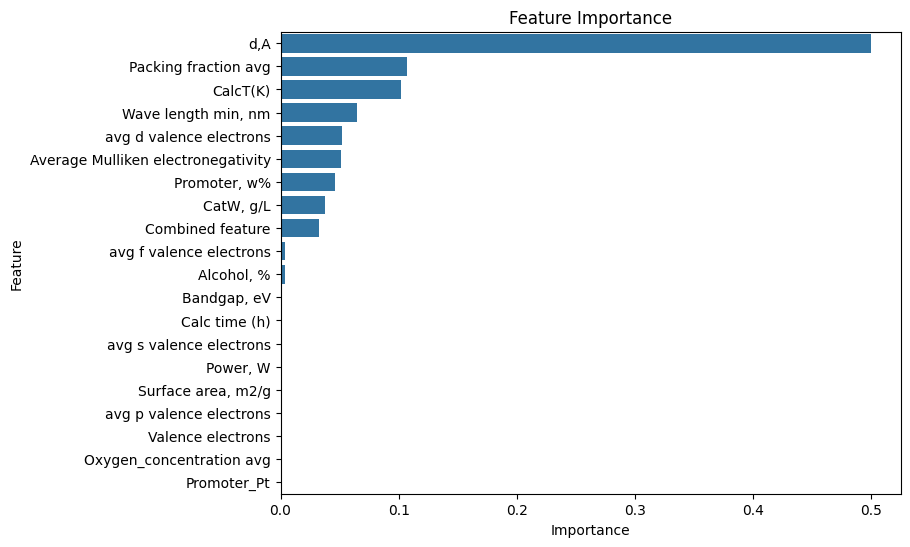

In [184]:
import matplotlib.pyplot as plt

if not(cross_validation):
  feat_imp = pd.DataFrame({
      'Feature': X_train.columns,
      'Importance': tree_model.feature_importances_
  }).sort_values(by='Importance', ascending=False)

  plt.figure(figsize=(8,6))
  sns.barplot(x='Importance', y='Feature', data=feat_imp)
  plt.title('Feature Importance')
  plt.show()

In [185]:
feat_imp

,Feature,Importance
1,"d,A",0.499666
17,Packing fraction avg,0.107058
2,CalcT(K),0.102084
9,"Wave length min, nm",0.064475
12,avg d valence electrons,0.051733
14,Average Mulliken electronegativity,0.051559
4,"Promoter, w%",0.045926
6,"CatW, g/L",0.037256
19,Combined feature,0.032241
13,avg f valence electrons,0.003972


In [186]:
from sklearn.model_selection import GridSearchCV

if(grid_search):
  param_grid = {
    "max_depth": [3, 4, 5, 6],
    "min_samples_leaf": [1, 3, 5, 10],
    "min_samples_split": [2, 5, 10]
  }
  #Best params {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
  #Best params {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
  #Best params {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}

  grid_search = GridSearchCV(DecisionTreeRegressor(random_state=42),
                            param_grid, cv=5, scoring='neg_mean_squared_error')
  grid_search.fit(X_train,y_train)
  y_pred = grid_search.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  y_pred = grid_search.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["DT regularized", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
  print('Best params',grid_search.best_params_)
  print('Best score',grid_search.best_score_)

## Random forest

In [187]:
from sklearn.ensemble import RandomForestRegressor

In [188]:
rf_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=5,
    min_samples_split = 10,
    min_samples_leaf = 1,
    max_features=2,
    random_state=42
)

if(cross_validation):
  scores = cross_val_score(rf_model , X, y, cv=5, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(rf_model , X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  print('No cross validation')
  rf_model.fit(X_train, y_train)
  train_score = rf_model.score(X_train, y_train)
  y_pred = rf_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  print('Train score: ', train_score)
  y_pred = rf_model.predict(X_test)
  draw_actual_predicted(y_test, y_pred)

  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["RF", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

No cross validation


Train score:  0.6843628397546927


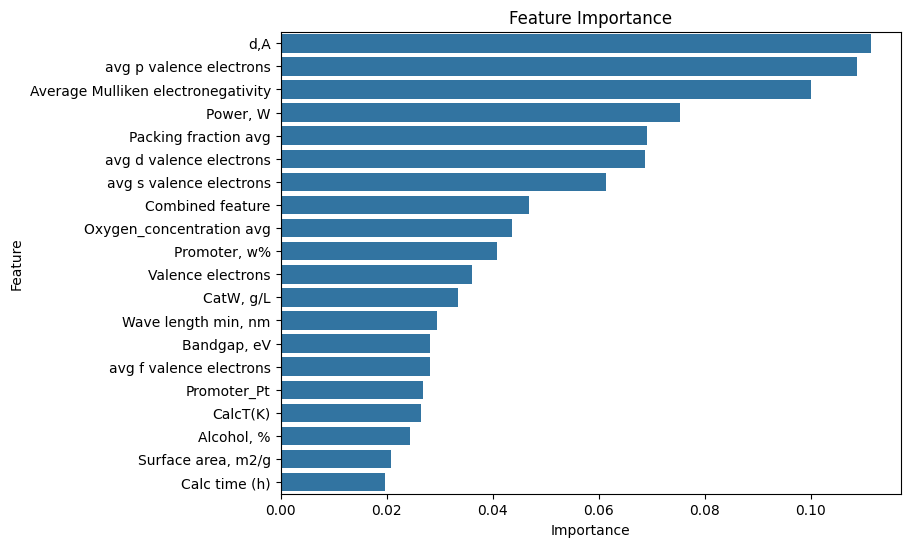

In [189]:
if not(cross_validation):
  feat_imp = pd.DataFrame({
      'Feature': X_train.columns,
      'Importance': rf_model.feature_importances_
  }).sort_values(by='Importance', ascending=False)

  plt.figure(figsize=(8,6))
  sns.barplot(x='Importance', y='Feature', data=feat_imp)
  plt.title('Feature Importance')
  plt.show()

In [190]:
from sklearn.model_selection import GridSearchCV

if(grid_search):
  param_grid = {
      'n_estimators': [50, 100, 150],
      'max_depth': [4, 5],
      'min_samples_split': [5, 10],
      'min_samples_leaf': [1, 2],
  }
  #Best params {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
  #Best params {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
  #Best params {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}

  grid_search = GridSearchCV(RandomForestRegressor(random_state=42),
                            param_grid, cv=5, scoring='neg_mean_squared_error')
  grid_search.fit(X_train,y_train)
  y_pred = grid_search.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  y_pred = grid_search.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["RF regularized", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
  print('Best params',grid_search.best_params_)
  print('Best score',grid_search.best_score_)

In [191]:
if(grid_search):
  best_model = grid_search.best_estimator_

  if(cross_validation):
    scores = cross_val_score(best_model , X, y, cv=5, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-scores)
    print("Scores: ", scores)
    print("Mean RMSE:", rmse_scores.mean())

    y_pred = cross_val_predict(best_model , X, y, cv=5)
    draw_actual_predicted(y, y_pred)
  else:
    y_pred = best_model.predict(X_test)
    draw_actual_predicted(y_test, y_pred)

##Gradient boosting

In [192]:
from sklearn.ensemble import GradientBoostingRegressor

In [193]:
gb_model = GradientBoostingRegressor(
    n_estimators=150,      # number of boosting stages
    learning_rate=0.1,     # shrinkage factor
    max_depth=3,           # depth of each tree
    min_samples_split=4,
    min_samples_leaf=3,
    random_state=42,
    subsample=0.8
)
# {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 4, 'n_estimators': 150}

if(cross_validation):
  scores = cross_val_score(gb_model , X, y, cv=5, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(gb_model , X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  gb_model.fit(X_train, y_train)
  train_score = gb_model.score(X_train, y_train)
  y_pred = gb_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  print('Train score: ', train_score)
  y_pred = gb_model.predict(X_test)
  draw_actual_predicted(y_test, y_pred)

  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["GBoost", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

Train score:  0.9373746761992193


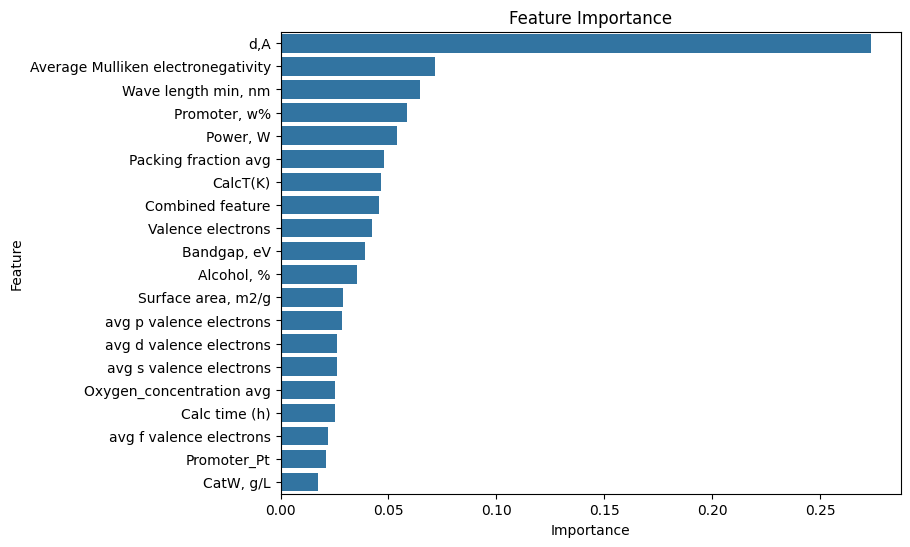

In [194]:
if not(cross_validation):
  feat_imp = pd.DataFrame({
      'Feature': X_train.columns,
      'Importance': gb_model.feature_importances_
  }).sort_values(by='Importance', ascending=False)

  plt.figure(figsize=(8,6))
  sns.barplot(x='Importance', y='Feature', data=feat_imp)
  plt.title('Feature Importance')
  plt.show()

In [195]:
if(grid_search):
  param_grid = {
      'n_estimators': [100, 150],        # number of boosting stages
      'learning_rate': [0.001,0.01, 0.1],   # shrinkage factor
      'max_depth': [2,3, 4],                # depth of each tree
      'min_samples_split': [4, 6],
      'min_samples_leaf': [1, 2, 3]
  }
  #Best parameters: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 100, 'subsample': 0.8}
  #Best parameters: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 100, 'subsample': 0.8}
  #Best parameters: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 100, 'subsample': 0.8}
  # {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 4, 'n_estimators': 150}

  # Grid search with 5-fold cross-validation
  grid_search = GridSearchCV(
      estimator=gb_model,
      param_grid=param_grid,
      cv=5,
      scoring='neg_mean_squared_error',          # or 'neg_mean_squared_error'
      n_jobs=-1,
      verbose=2
  )
  grid_search.fit(X_train,y_train)
  y_pred = grid_search.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  y_pred = grid_search.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["GBoost regularized", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
  print('Best params',grid_search.best_params_)
  print('Best score',grid_search.best_score_)

In [196]:
if(grid_search):
  best_model = grid_search.best_estimator_

  if(cross_validation):
    scores = cross_val_score(best_model , X, y, cv=5, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-scores)
    print("Scores: ", scores)
    print("Mean RMSE:", rmse_scores.mean())

    y_pred = cross_val_predict(best_model , X, y, cv=5)
    draw_actual_predicted(y, y_pred)
  else:
    y_pred = best_model.predict(X_test)
    draw_actual_predicted(y_test, y_pred)

##KNN

In [197]:
from sklearn.neighbors import KNeighborsRegressor

In [198]:
knn_model = KNeighborsRegressor(n_neighbors=20, weights='uniform',p=1)

if(cross_validation):
  scores = cross_val_score(knn_model , X, y, cv=5, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(knn_model , X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  knn_model.fit(X_train, y_train)
  train_score = knn_model.score(X_train, y_train)
  y_pred = knn_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  print('Train score: ', train_score)
  y_pred = knn_model.predict(X_test)
  draw_actual_predicted(y_test, y_pred)

  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["KNN", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

Train score:  0.59813211771726


In [199]:
if(grid_search):
  param_grid = {
      'n_neighbors': list(range(1, 21)),
      'weights': ['uniform', 'distance'],
      'p': [1, 2]
  }
  #Best parameters: {'n_neighbors': 20, 'p': 1, 'weights': 'uniform'}
  #Best parameters: {'n_neighbors': 20, 'p': 1, 'weights': 'uniform'}
  #Best parameters: {'n_neighbors': 12, 'p': 2, 'weights': 'distance'}

  grid_search = GridSearchCV(
      KNeighborsRegressor(),
      param_grid,
      cv=5,
      scoring='neg_mean_squared_error',
      n_jobs=-1,
      verbose=2
  )

  grid_search.fit(X_train,y_train)
  y_pred = grid_search.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  y_pred = grid_search.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["KNN regularized", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
  print('Best params',grid_search.best_params_)
  print('Best score',grid_search.best_score_)

In [200]:
if(grid_search):
  best_model = grid_search.best_estimator_

  if(cross_validation):
    scores = cross_val_score(best_model , X, y, cv=5, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-scores)
    print("Scores: ", scores)
    print("Mean RMSE:", rmse_scores.mean())

    y_pred = cross_val_predict(best_model , X, y, cv=5)
    draw_actual_predicted(y, y_pred)
  else:
    y_pred = best_model.predict(X_test)
    draw_actual_predicted(y_test, y_pred)

##Catboost

In [201]:
from catboost import CatBoostRegressor

In [202]:
cat_boost_model = CatBoostRegressor(
    iterations=1000,
    learning_rate=0.05,
    depth=4,
    verbose=100
)

if(cross_validation):
  scores = cross_val_score(cat_boost_model , X, y, cv=5, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(cat_boost_model , X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  cat_boost_model.fit(X_train, y_train)
  train_score = cat_boost_model.score(X_train, y_train)
  y_pred = cat_boost_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  print('Train score: ', train_score)
  y_pred = cat_boost_model.predict(X_test)
  draw_actual_predicted(y_test, y_pred)

  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["Catboost", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

0:	learn: 3.0106097	total: 48.9ms	remaining: 48.9s
100:	learn: 1.5062753	total: 132ms	remaining: 1.18s
200:	learn: 1.2053347	total: 244ms	remaining: 970ms
300:	learn: 1.0046623	total: 324ms	remaining: 752ms
400:	learn: 0.8740683	total: 409ms	remaining: 611ms
500:	learn: 0.7702686	total: 490ms	remaining: 488ms
600:	learn: 0.6880627	total: 570ms	remaining: 378ms
700:	learn: 0.6282487	total: 649ms	remaining: 277ms
800:	learn: 0.5851211	total: 736ms	remaining: 183ms
900:	learn: 0.5408014	total: 826ms	remaining: 90.8ms
999:	learn: 0.5045535	total: 907ms	remaining: 0us


Train score:  0.9730677358594196


In [203]:
if not cross_validation:
  #del len
  llen = len(cat_boost_model.feature_importances_)
  feature_dict={}
  for i in range(llen):
    #print(cat_boost_model.feature_names_[i],"   ",cat_boost_model.feature_importances_[i])
    feature_dict[cat_boost_model.feature_names_[i]]=cat_boost_model.feature_importances_[i]
  # print(cat_boost_model.feature_names_[i],"   ",cat_boost_model.feature_importances_[i])

  sorted_dict = dict(
      sorted(feature_dict.items(), key=lambda item: item[1], reverse=True)
  )

  #print(sorted_dict)
  for x,y in sorted_dict.items():
    print(x," ", y)

Average Mulliken electronegativity   10.364836359814223
Wave length min, nm   9.397749998366743
Promoter, w%   7.396169661103287
d,A   6.791652639266372
Power, W   6.619093314123493
Bandgap, eV   5.8164862254880285
Alcohol, %   5.808613280583579
Valence electrons   5.358620402396135
CalcT(K)   4.636053771749207
avg d valence electrons   4.362798378486387
avg s valence electrons   4.291393819470652
Promoter_Pt   4.194840541858665
Calc time (h)   4.045384587108462
Packing fraction avg   3.828425841154376
avg p valence electrons   3.631158477912789
Surface area, m2/g   3.2789015670282255
Combined feature   3.147478668999446
avg f valence electrons   2.4943142430273713
CatW, g/L   2.2847700907310555
Oxygen_concentration avg   2.2512581313315034


In [204]:
if(grid_search):
  param_grid = {
      'depth': [2,4],
      'learning_rate':[0.005,0.01,0.05,0.1 ]
  }
  #Best parameters: {'depth': 4, 'learning_rate': 0.05}
  #Best parameters: {'depth': 4, 'learning_rate': 0.05}
  #Best parameters: {'depth': 6, 'learning_rate': 0.05}

  grid_search = GridSearchCV(cat_boost_model, param_grid, cv=5,scoring='neg_mean_squared_error',)
  grid_search.fit(X_train,y_train)
  y_pred = grid_search.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  y_pred = grid_search.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["Catboost regularized", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
  print('Best params',grid_search.best_params_)
  print('Best score',grid_search.best_score_)

In [205]:
if(grid_search):
  est_model = grid_search.best_estimator_

  if(cross_validation):
    print("Cross validation")
    scores = cross_val_score(best_model , X, y, cv=5, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-scores)

    y_pred = cross_val_predict(best_model , X, y, cv=5)
    draw_actual_predicted(y, y_pred)
    print("Scores: ", scores)
    print("Mean RMSE:", rmse_scores.mean())
  else:
    y_pred = best_model.predict(X_test)
    draw_actual_predicted(y_test, y_pred)

##XGBoost

In [206]:
import xgboost as xgb
from xgboost import XGBRegressor

In [207]:
xgboost_model = XGBRegressor(
    n_estimators=300,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    min_child_weight=3
)
#Best params {'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 3, 'reg_alpha': 1, 'subsample': 0.6}

In [208]:
if(cross_validation):
  scores = cross_val_score(xgboost_model , X, y, cv=5, scoring='neg_mean_squared_error')
  rmse_scores = np.sqrt(-scores)
  print("Scores: ", scores)
  print("Mean RMSE:", rmse_scores.mean())

  y_pred = cross_val_predict(xgboost_model , X, y, cv=5)
  draw_actual_predicted(y, y_pred)
else:
  xgboost_model.fit(X_train, y_train)
  train_score = xgboost_model.score(X_train, y_train)
  y_pred = xgboost_model.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  print('Train score: ', train_score)
  y_pred = xgboost_model.predict(X_test)
  draw_actual_predicted(y_test, y_pred)

  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["XGBoost", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])

Train score:  0.9640678156003563


In [209]:
if(grid_search):
  param_grid = {
    "max_depth": [2, 4, 6],
    "learning_rate": [0.005,0.01, 0.05],
    "min_child_weight": [3, 7],
    "subsample": [0.6, 0.8, 1.0],
    "reg_alpha": [1,3,5]
  }
  #Best parameters: {'depth': 4, 'learning_rate': 0.05}
  #Best parameters: {'depth': 4, 'learning_rate': 0.05}
  #Best parameters: {'depth': 6, 'learning_rate': 0.05}

  grid_search = GridSearchCV(xgboost_model, param_grid, cv=5,scoring='neg_mean_squared_error',)
  grid_search.fit(X_train,y_train)
  y_pred = grid_search.predict(X_train)
  res_train = draw_actual_predicted(y_train, y_pred)
  y_pred = grid_search.predict(X_test)
  res_test = draw_actual_predicted(y_test, y_pred)
  res_rows.append(["GBoost regularized", res_train['r2'], res_test['r2'], res_train['rmse'], res_test['rmse']])
  print('Best params',grid_search.best_params_)
  print('Best score',grid_search.best_score_)

#Results

In [210]:
df_res = pd.DataFrame(res_rows, columns=res_columns)

In [211]:
print(df_res)

      Model  R(train)   R(test)  RMSE(train)  RMSE(test)
0    Linear  0.558723  0.380973     2.042333    2.416032
1        DT  0.592124  0.433014     1.963518    2.312246
2        RF  0.684363  0.588749     1.727288    1.969253
3    GBoost  0.937375  0.742248     0.769389    1.559011
4       KNN  0.598132  0.551080     1.949003    2.057465
5  Catboost  0.973068  0.776091     0.504553    1.453059
6   XGBoost  0.964068  0.765061     0.582791    1.488419


#Generative models

In [213]:
X_train.columns

Index(['Bandgap, eV', 'd,A', 'CalcT(K)', 'Calc time (h)', 'Promoter, w%',
       'Surface area, m2/g', 'CatW, g/L', 'Alcohol, %', 'Power, W',
       'Wave length min, nm', 'avg s valence electrons',
       'avg p valence electrons', 'avg d valence electrons',
       'avg f valence electrons', 'Average Mulliken electronegativity',
       'Valence electrons', 'Oxygen_concentration avg', 'Packing fraction avg',
       'Promoter_Pt', 'Combined feature'],
      dtype='object')

In [215]:
!pip install pygad

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.6/89.6 kB 3.6 MB/s eta 0:00:00


In [216]:
import pygad

In [217]:
def fitness_func(ga_instance, solution, solution_idx):
    prediction = cat_boost_model.predict([solution])[0]
    return prediction

In [219]:
solution= [0.2] *20

In [222]:
prediction = cat_boost_model.predict([solution])[0]
print(prediction)

5.825815288989001


In [223]:
gene_space = [
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
    {'low': -1.0, 'high': 1.0},
]

In [224]:
ga = pygad.GA(
    num_generations=100,
    sol_per_pop=40,
    num_genes=20,
    gene_space=gene_space,
    num_parents_mating=10,
    fitness_func=fitness_func,
    mutation_percent_genes=20
)

ga.run()

In [225]:
solution, solution_fitness, solution_idx = ga.best_solution()

print("Best descriptors:", solution)
print("Predicted activity:", solution_fitness)

Best descriptors: [ 0.76783773  0.96278742  0.87255057  0.12632305  0.93788139  0.20342208
 -0.53294736  0.35927227 -0.359214    0.32065043  0.21917831  0.07592704
  0.05462824 -0.90163986  0.72999349  0.65454358 -0.69289385  0.21555076
  0.89332558  0.69024283]
Predicted activity: 13.39401760868466


In [235]:
used_features = list(X_train.columns)
unscaled_solution={}

ind=-1
for feature in scaler.feature_names_in_:
    ind=ind+1
    if feature in used_features:
        index_in_used_features = used_features.index(feature)
        min = scaler.data_min_[ind]
        max = scaler.data_max_[ind]
        print(feature," :",min," ; ",max)
        #-1 to 1
        scaled_value = solution[index_in_used_features]
        avg = (max+min)/2.0
        half_span = (max-min)/2.0
        unscaled_value = avg + half_span*scaled_value
        print('scaled_value = ',scaled_value)
        print('unscaled_value = ',unscaled_value)
        unscaled_solution[feature] =unscaled_value



Bandgap, eV  : 1.35  ;  5.1
scaled_value =  0.767837731003878
unscaled_value =  4.664695745632271
d,A  : 0.0  ;  34.8
scaled_value =  0.9627874178088465
unscaled_value =  34.15250106987392
CalcT(K)  : 473.0  ;  1873.0
scaled_value =  0.8725505694008355
unscaled_value =  1783.785398580585
Calc time (h)  : 0.0  ;  200.0
scaled_value =  0.12632305347966089
unscaled_value =  112.63230534796608
Promoter, w%  : 0.0  ;  10.0
scaled_value =  0.9378813908590213
unscaled_value =  9.689406954295107
Surface area, m2/g  : 0.2  ;  208.0
scaled_value =  0.20342207772953924
unscaled_value =  125.23555387609912
CatW, g/L  : 0.0333  ;  10.0
scaled_value =  -0.532947357769348
unscaled_value =  2.36078678466012
Alcohol, %  : 0.0  ;  90.0
scaled_value =  0.3592722719242074
unscaled_value =  61.167252236589334
Power, W  : 100.0  ;  1000.0
scaled_value =  -0.35921399688761046
unscaled_value =  388.3537014005753
Wave length min, nm  : 200.0  ;  580.0
scaled_value =  0.3206504270641286
unscaled_value =  450.92

In [237]:
unscaled_solution

{'Bandgap, eV': np.float64(4.664695745632271),
 'd,A': np.float64(34.15250106987392),
 'CalcT(K)': np.float64(1783.785398580585),
 'Calc time (h)': np.float64(112.63230534796608),
 'Promoter, w%': np.float64(9.689406954295107),
 'Surface area, m2/g': np.float64(125.23555387609912),
 'CatW, g/L': np.float64(2.36078678466012),
 'Alcohol, %': np.float64(61.167252236589334),
 'Power, W': np.float64(388.3537014005753),
 'Wave length min, nm': np.float64(450.92358114218445),
 'avg s valence electrons': np.float64(1.7722603418652494),
 'avg p valence electrons': np.float64(2.3765551309243276),
 'avg d valence electrons': np.float64(2.066524912827467),
 'avg f valence electrons': np.float64(0.24590033985145654),
 'Average Mulliken electronegativity': np.float64(6.611621039206155),
 'Valence electrons': np.float64(35.43632802009792),
 'Oxygen_concentration avg': np.float64(0.01926391814122248),
 'Packing fraction avg': np.float64(0.46899055795179323),
 'Promoter_Pt': np.float64(0.94666279095924

In [290]:
with MPRester(API_KEY) as mpr:
    MP_candidates = mpr.materials.summary.search(band_gap=(unscaled_solution['Bandgap, eV']-0.05,unscaled_solution['Bandgap, eV']+0.05))

Retrieving SummaryDoc documents:   0%|          | 0/513 [00:00<?, ?it/s]

TypeError: 'NoneType' object is not callable

In [297]:
def ID_to_formula(ID):
  structure = mpr.get_structure_by_material_id(ID)
  return structure.composition.formula

In [329]:
vo_feat = ValenceOrbital()
vo_features = vo_feat.feature_labels()
print(vo_features)
used_vo_features_indexes=[]
for f in vo_features:
  if f in used_features:
    used_vo_features_indexes.append(vo_features.index(f))

max_distance = 10000
best_ID = -1
best_formula= ""

#count=0
for material in MP_candidates:
    #count=count+1
    print('ID: ',material.material_id)
    #if(count>1):
    #  break
    #print(material.material_id, material.formula_pretty)
    #entry = mpr.materials.summary.search(material_id=["mp-149"], fields=["band_gap","formula_pretty"])[0]
    candidate_feature_dict={}
    entry = mpr.materials.summary.search(material_ids=[material.material_id],fields=["band_gap"])[0]
    bandgap = entry['band_gap']
    candidate_feature_dict['Bandgap, eV']=bandgap

    formula = ID_to_formula(material.material_id)
    print(f"Material {material.material_id} ({formula}) has band gap = {bandgap} eV")

    comp=Composition(formula)
    el_features = vo_feat.featurize(comp)
    print(el_features)
    for el_feature_i in used_vo_features_indexes:
      feature_name = vo_features[el_feature_i]
      candidate_feature_dict[feature_name]=el_features[el_feature_i]

    electronegativity = calc_average_electronegativity(formula)
    print('electronegativity: ',electronegativity)
    candidate_feature_dict['Average Mulliken electronegativity']=electronegativity

    valence_electrons = get_valence_electrons_number(formula)
    print('valence_electrons: ',valence_electrons)
    candidate_feature_dict['Valence electrons']=valence_electrons

    oxygen_count = count_oxigen(formula)
    print('oxygen_count: ',oxygen_count)
    structure = mpr.get_structure_by_material_id(material.material_id)
    V = structure.volume
    print('V: ',V)
    Z = structure.composition.num_atoms / structure.composition.reduced_composition.num_atoms
    print('Z: ',Z)
    oxygen_conc = Z*oxygen_count/V
    print('oxygen_conc: ',oxygen_conc)
    candidate_feature_dict['Oxygen_concentration avg']=oxygen_conc

    packing_fraction = get_packing_fraction_from_formula_and_cell_volume(formula, V, Z)
    print('packing_fraction: ',packing_fraction)
    candidate_feature_dict['Packing fraction avg']=packing_fraction

    print(candidate_feature_dict)
    X_before_scaler = np.zeros(len(scaler.feature_names_in_))
    #filling vectors
    for i in range(len(scaler.feature_names_in_)):
      f= scaler.feature_names_in_[i]
      if f in candidate_feature_dict:
        X_before_scaler[i]=candidate_feature_dict[f]
    print(X_before_scaler)
    X_after_scaler = scaler.transform(X_before_scaler.reshape(1, -1))
    print(X_after_scaler)
    X_after_selector = selector.transform(X_after_scaler)
    X_after_selector=X_after_selector[0]
    print(X_after_selector)
    distance = np.linalg.norm(X_after_selector - solution)
    print(distance)
    if(distance<max_distance):
      max_distance=distance
      best_ID = material.material_id
      best_formula = formula
      print("New best! ", formula)

    #print(vo_feat.feature_labels())
    #df_candidates = vo_feat.featurize_dataframe(df_candidates, col_id='composition_obj')
    #df_candidates = df_candidates.drop('composition_obj', axis=1)

['avg s valence electrons', 'avg p valence electrons', 'avg d valence electrons', 'avg f valence electrons', 'frac s valence electrons', 'frac p valence electrons', 'frac d valence electrons', 'frac f valence electrons']
ID:  mp-625320


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-625320 (Al2 H6 O6) has band gap = 4.6615 eV
[np.float64(1.5714285714285714), np.float64(1.8571428571428572), np.float64(0.0), np.float64(0.0), np.float64(0.45833333333333337), np.float64(0.5416666666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.765285521864714
{'Al': 2.0, 'H': 6.0, 'O': 6.0}
valence_electrons:  12.0
Al2 H6 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  111.02131558936631
Z:  2.0
oxygen_conc:  0.1080873518413735
---------------------------------------------
Enter!
Al2 H6 O6
111.02131558936631
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.9520988257890183
{'Bandgap, eV': 4.6615, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(1.8571428571428572), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.765285521864714, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.1080873518413735, 'Packing fraction avg': 0.9520988257890183}
[ 4.6615      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.57142857  1.85714286  0.          0.          0.          0.
  0.          0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-626074 (Al8 H24 O24) has band gap = 4.614999999999999 eV
[np.float64(1.5714285714285714), np.float64(1.8571428571428572), np.float64(0.0), np.float64(0.0), np.float64(0.45833333333333337), np.float64(0.5416666666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.765285521864714
{'Al': 8.0, 'H': 24.0, 'O': 24.0}
valence_electrons:  48.0
Al8 H24 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  451.9571765175011
Z:  8.0
oxygen_conc:  0.4248190093571071
---------------------------------------------
Enter!
Al8 H24 O24
451.9571765175011
8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  3.742062998965374
{'Bandgap, eV': 4.614999999999999, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(1.8571428571428572), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.765285521864714, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.4248190093571071, 'Packing fraction avg': 3.742062998965374}
[ 4.615       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.57142857  1.85714286  0.          0.          0.          0.
  0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-626497 (Al2 H6 O6) has band gap = 4.697299999999999 eV
[np.float64(1.5714285714285714), np.float64(1.8571428571428572), np.float64(0.0), np.float64(0.0), np.float64(0.45833333333333337), np.float64(0.5416666666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.765285521864714
{'Al': 2.0, 'H': 6.0, 'O': 6.0}
valence_electrons:  12.0
Al2 H6 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  109.05359644216853
Z:  2.0
oxygen_conc:  0.11003763646037697
---------------------------------------------
Enter!
Al2 H6 O6
109.05359644216853
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.9692781133196509
{'Bandgap, eV': 4.697299999999999, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(1.8571428571428572), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.765285521864714, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.11003763646037697, 'Packing fraction avg': 0.9692781133196509}
[ 4.6973      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.57142857  1.85714286  0.          0.          0.          0.
  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-19516 (Al8 W12 O48) has band gap = 4.6158 eV
[np.float64(2.0), np.float64(2.9411764705882355), np.float64(0.7058823529411765), np.float64(2.4705882352941178), np.float64(0.2463768115942029), np.float64(0.3623188405797102), np.float64(0.08695652173913045), np.float64(0.30434782608695654)]
electronegativity:  6.4655534178823535
{'Al': 8.0, 'W': 12.0, 'O': 48.0}
valence_electrons:  96.0
Al8 W12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1050.033369910741
Z:  4.0
oxygen_conc:  0.1828513316832218
---------------------------------------------
Enter!
Al8 W12 O48
1050.033369910741
4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: W
Element ox state: 6
r:  0.74 ang
W   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.648992292674813
{'Bandgap, eV': 4.6158, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.9411764705882355), 'avg d valence electrons': np.float64(0.7058823529411765), 'avg f valence electrons': np.float64(2.4705882352941178), 'Average Mulliken electronegativity': 6.4655534178823535, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1828513316832218, 'Packing fraction avg': 1.648992292674813}
[ 4.6158      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.94117647  0.70588235  2.47058824  0.          0.
  0.          0.          6.4655534

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560318 (Al8 W12 O48) has band gap = 4.619 eV
[np.float64(2.0), np.float64(2.9411764705882355), np.float64(0.7058823529411765), np.float64(2.4705882352941178), np.float64(0.2463768115942029), np.float64(0.3623188405797102), np.float64(0.08695652173913045), np.float64(0.30434782608695654)]
electronegativity:  6.4655534178823535
{'Al': 8.0, 'W': 12.0, 'O': 48.0}
valence_electrons:  96.0
Al8 W12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1107.1101770947005
Z:  4.0
oxygen_conc:  0.17342447388917517
---------------------------------------------
Enter!
Al8 W12 O48
1107.1101770947005
4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: W
Element ox state: 6
r:  0.74 ang
W   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.5639788792999805
{'Bandgap, eV': 4.619, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.9411764705882355), 'avg d valence electrons': np.float64(0.7058823529411765), 'avg f valence electrons': np.float64(2.4705882352941178), 'Average Mulliken electronegativity': 6.4655534178823535, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.17342447388917517, 'Packing fraction avg': 1.5639788792999805}
[ 4.619       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.94117647  0.70588235  2.47058824  0.          0.
  0.          0.          6.46

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-740731 (Al4 H24 Se6 O30) has band gap = 4.6417 eV
[np.float64(1.625), np.float64(2.3125), np.float64(0.9375), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.47435897435897434), np.float64(0.19230769230769232), np.float64(0.0)]
electronegativity:  6.97773867652225
{'Al': 4.0, 'H': 24.0, 'Se': 6.0, 'O': 30.0}
valence_electrons:  60.0
Al4 H24 Se6 O30
30.0
oxygen_count:  30.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  777.8077691298897
Z:  2.0
oxygen_conc:  0.07713988260508146
---------------------------------------------
Enter!
Al4 H24 Se6 O30
777.8077691298897
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: Se
Element ox state: 6
r:  0.56 ang
Se   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   30.0
packing_fraction:  0.670968291340145
{'Bandgap, eV': 4.6417, 'avg s valence electrons': np.float64(1.625), 'avg p valence electrons': np.float64(2.3125), 'avg d valence electrons': np.float64(0.9375), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.97773867652225, 'Valence electrons': 60.0, 'Oxygen_concentration avg': 0.07713988260508146, 'Packing fraction avg': 0.670968291340145}
[ 4.6417      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.625       2.3125      0.9375      0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1196041 (Al4 H64 S6 O56) has band gap = 4.6645 eV
[np.float64(1.5076923076923077), np.float64(1.9384615384615385), np.float64(0.0), np.float64(0.0), np.float64(0.43749999999999994), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.166533903557416
{'Al': 4.0, 'H': 64.0, 'S': 6.0, 'O': 56.0}
valence_electrons:  112.0
Al4 H64 S6 O56
56.0
oxygen_count:  56.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1232.5565538738047
Z:  2.0
oxygen_conc:  0.0908680414281965
---------------------------------------------
Enter!
Al4 H64 S6 O56
1232.5565538738047
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   64.0
Element: S
Element ox state: -2
r:  1.7 ang
S   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   56.0
packing_fraction:  0.9701218169518069
{'Bandgap, eV': 4.6645, 'avg s valence electrons': np.float64(1.5076923076923077), 'avg p valence electrons': np.float64(1.9384615384615385), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.166533903557416, 'Valence electrons': 112.0, 'Oxygen_concentration avg': 0.0908680414281965, 'Packing fraction avg': 0.9701218169518069}
[4.66450000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195722 (Al2 H4 Pb6 O2 F18) has band gap = 4.6703 eV
[np.float64(1.875), np.float64(3.5), np.float64(1.875), np.float64(2.625), np.float64(0.189873417721519), np.float64(0.35443037974683544), np.float64(0.189873417721519), np.float64(0.26582278481012656)]
electronegativity:  8.154353852325125
{'Al': 2.0, 'H': 4.0, 'Pb': 6.0, 'O': 2.0, 'F': 18.0}
valence_electrons:  4.0
Al2 H4 Pb6 O2 F18
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  434.03069460961035
Z:  2.0
oxygen_conc:  0.009215938065389147
---------------------------------------------
Enter!
Al2 H4 Pb6 O2 F18
434.03069460961035
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: Pb
Element ox state: 2
r:  1.33 ang
Pb   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   18.0
packing_fraction:  0.9470351208473556
{'Bandgap, eV': 4.6703, 'avg s valence electrons': np.float64(1.875), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(1.875), 'avg f valence electrons': np.float64(2.625), 'Average Mulliken electronegativity': 8.154353852325125, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.009215938065389147, 'Packing fraction avg': 0.9470351208473556}
[4.6703     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1198123 (Al8 H56 C16 S8 Cl32) has band gap = 4.6652000000000005 eV
[np.float64(1.5333333333333334), np.float64(1.9333333333333333), np.float64(0.0), np.float64(0.0), np.float64(0.44230769230769235), np.float64(0.5576923076923077), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.023012704330466
{'Al': 8.0, 'H': 56.0, 'C': 16.0, 'S': 8.0, 'Cl': 32.0}
valence_electrons:  0
Al8 H56 C16 S8 Cl32
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2300.0657486377877
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Al8 H56 C16 S8 Cl32
2300.0657486377877
8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   56.0
Element: C
Element ox state: 4
r:  0.3 ang
C   16.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   32.0
packing_fraction:  2.786167210824073
{'Bandgap, eV': 4.6652000000000005, 'avg s valence electrons': np.float64(1.5333333333333334), 'avg p valence electrons': np.float64(1.9333333333333333), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.023012704330466, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.786167210824073}
[4.6652     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-625055 (Al2 H2 O4) has band gap = 4.6632 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.36619621846275
{'Al': 2.0, 'H': 2.0, 'O': 4.0}
valence_electrons:  8.0
Al2 H2 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  68.22437340610252
Z:  2.0
oxygen_conc:  0.11726014619995642
---------------------------------------------
Enter!
Al2 H2 O4
68.22437340610252
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.0580731041554507
{'Bandgap, eV': 4.6632, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.36619621846275, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.11726014619995642, 'Packing fraction avg': 1.0580731041554507}
[4.6632     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       2.25       0.         0.         0.         0.
 0.         0.         6.36619622 8.         0.         0.11726

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1215134 (Al4 P8 H48 N12 O32) has band gap = 4.6888000000000005 eV
[np.float64(1.5384615384615385), np.float64(1.8461538461538463), np.float64(0.0), np.float64(0.0), np.float64(0.4545454545454546), np.float64(0.5454545454545455), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.021970875546615
{'Al': 4.0, 'P': 8.0, 'H': 48.0, 'N': 12.0, 'O': 32.0}
valence_electrons:  64.0
Al4 P8 H48 N12 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1033.6319864244695
Z:  4.0
oxygen_conc:  0.12383517700799533
---------------------------------------------
Enter!
Al4 P8 H48 N12 O32
1033.6319864244695
4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  1.523205179819218
{'Bandgap, eV': 4.6888000000000005, 'avg s valence electrons': np.float64(1.5384615384615385), 'avg p valence electrons': np.float64(1.8461538461538463), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.021970875546615, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.12383517700799533, 'Packing fraction avg': 1.523205179819218}
[ 4.6888      0.          0.          0.          0.          0.
  0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195904 (Al2 Zn2 B10 H42 C12 N10 O20) has band gap = 4.6496 eV
[np.float64(1.5714285714285714), np.float64(1.489795918367347), np.float64(0.20408163265306123), np.float64(0.0), np.float64(0.48124999999999996), np.float64(0.45625000000000004), np.float64(0.0625), np.float64(0.0)]
electronegativity:  6.7115666458136936
{'Al': 2.0, 'Zn': 2.0, 'B': 10.0, 'H': 42.0, 'C': 12.0, 'N': 10.0, 'O': 20.0}
valence_electrons:  40.0
Al2 Zn2 B10 H42 C12 N10 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  890.613121492922
Z:  2.0
oxygen_conc:  0.04491287971700728
---------------------------------------------
Enter!
Al2 Zn2 B10 H42 C12 N10 O20
890.613121492922
2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   10.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   42.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: N
Element ox state: -3
r:  1.32 ang
N   10.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  0.6208196403762782
{'Bandgap, eV': 4.6496, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(1.489795918367347), 'avg d valence electrons': np.float64(0.20408163265306123), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7115666458136936, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.04491287971700728, 'Packin

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-561235 (As4 C4 S4 F44) has band gap = 4.6609 eV
[np.float64(2.0), np.float64(4.571428571428571), np.float64(0.7142857142857143), np.float64(0.0), np.float64(0.27450980392156865), np.float64(0.6274509803921569), np.float64(0.09803921568627451), np.float64(0.0)]
electronegativity:  9.450595329821429
{'As': 4.0, 'C': 4.0, 'S': 4.0, 'F': 44.0}
valence_electrons:  0
As4 C4 S4 F44
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  849.7350968430163
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
As4 C4 S4 F44
849.7350968430163
4.0
Element: As
Element ox state: 5
r:  0.6 ang
As   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   44.0
packing_fraction:  1.8687038876822535
{'Bandgap, eV': 4.6609, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.571428571428571), 'avg d valence electrons': np.float64(0.7142857142857143), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.450595329821429, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.8687038876822535}
[4.6609     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.57142857 0.71428571 0.         0.         0.
 0.         0.         9.45059533 0.         0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1193289 (As2 H4 S2 N2 F20) has band gap = 4.6288 eV
[np.float64(1.8666666666666667), np.float64(4.0), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.2857142857142857), np.float64(0.6122448979591837), np.float64(0.10204081632653061), np.float64(0.0)]
electronegativity:  9.147987945980134
{'As': 2.0, 'H': 4.0, 'S': 2.0, 'N': 2.0, 'F': 20.0}
valence_electrons:  0
As2 H4 S2 N2 F20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  404.3277604213647
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
As2 H4 S2 N2 F20
404.3277604213647
2.0
Element: As
Element ox state: 5
r:  0.6 ang
As   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  1.006176082807664
{'Bandgap, eV': 4.6288, 'avg s valence electrons': np.float64(1.8666666666666667), 'avg p valence electrons': np.float64(4.0), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.147987945980134, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.006176082807664}
[4.6288     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.86666667 4.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1214847 (B8 H16 O16) has band gap = 4.65 eV
[np.float64(1.6), np.float64(1.8), np.float64(0.0), np.float64(0.0), np.float64(0.4705882352941177), np.float64(0.5294117647058824), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.7441337787404
{'B': 8.0, 'H': 16.0, 'O': 16.0}
valence_electrons:  32.0
B8 H16 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  620.4786286812629
Z:  8.0
oxygen_conc:  0.20629235896818138
---------------------------------------------
Enter!
B8 H16 O16
620.4786286812629
8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.758340494629625
{'Bandgap, eV': 4.65, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(1.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7441337787404, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.20629235896818138, 'Packing fraction avg': 1.758340494629625}
[ 4.65        0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.6         1.8         0.          0.          0.          0.
  0.          0.          6.74413378 32.          0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1197013 (B8 As4 H52 C12 Br12 N4) has band gap = 4.675000000000001 eV
[np.float64(1.434782608695652), np.float64(1.2608695652173914), np.float64(1.7391304347826086), np.float64(0.0), np.float64(0.32352941176470584), np.float64(0.28431372549019607), np.float64(0.39215686274509803), np.float64(0.0)]
electronegativity:  6.7803535825896954
{'B': 8.0, 'As': 4.0, 'H': 52.0, 'C': 12.0, 'Br': 12.0, 'N': 4.0}
valence_electrons:  0
B8 As4 H52 C12 Br12 N4
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1430.3649239291124
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
B8 As4 H52 C12 Br12 N4
1430.3649239291124
4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: As
Element ox state: 5
r:  0.6 ang
As   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   52.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   12.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
packing_fraction:  0.9755630807436821
{'Bandgap, eV': 4.675000000000001, 'avg s valence electrons': np.float64(1.434782608695652), 'avg p valence electrons': np.float64(1.2608695652173914), 'avg d valence electrons': np.float64(1.7391304347826086), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7803535825896954, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.9755630807436821}
[4.675      0.         0.         0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23184 (B2 Cl6) has band gap = 4.7135 eV
[np.float64(2.0), np.float64(4.0), np.float64(0.0), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.2898521362499995
{'B': 2.0, 'Cl': 6.0}
valence_electrons:  0
B2 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  219.9937817642077
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
B2 Cl6
219.9937817642077
2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   2.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  1.0694138955874501
{'Bandgap, eV': 4.7135, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.2898521362499995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0694138955874501}
[4.7135     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.         0.         0.         0.         0.
 0.         0.         7.28985214 0.         0.         0.
 1.0694139  0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-697960 (Ba2 Na2 B10 H2 O19) has band gap = 4.6933 eV
[np.float64(1.8857142857142857), np.float64(2.4571428571428573), np.float64(0.0), np.float64(0.0), np.float64(0.4342105263157895), np.float64(0.5657894736842106), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.043906590005771
{'Ba': 2.0, 'Na': 2.0, 'B': 10.0, 'H': 2.0, 'O': 19.0}
valence_electrons:  38.0
Ba2 Na2 B10 H2 O19
19.0
oxygen_count:  19.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  368.75173396436526
Z:  1.0
oxygen_conc:  0.05152518144317685
---------------------------------------------
Enter!
Ba2 Na2 B10 H2 O19
368.75173396436526
1.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   10.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   19.0
packing_fraction:  0.5501807786092795
{'Bandgap, eV': 4.6933, 'avg s valence electrons': np.float64(1.8857142857142857), 'avg p valence electrons': np.float64(2.4571428571428573), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.043906590005771, 'Valence electrons': 38.0, 'Oxygen_concentration avg': 0.05152518144317685, 'Packing fraction avg': 0.5501807786092795}
[ 4.6933      0.          0.          0.          0.          0.
  0.          0.          0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-17612 (Ba8 Si4 O16) has band gap = 4.6319 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.755032456857142
{'Ba': 8.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ba8 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  453.05578895218787
Z:  4.0
oxygen_conc:  0.1412629560434865
---------------------------------------------
Enter!
Ba8 Si4 O16
453.05578895218787
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.18564920213348
{'Bandgap, eV': 4.6319, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.755032456857142, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.1412629560434865, 'Packing fraction avg': 2.18564920213348}
[ 4.6319      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.          0.          5.75503246 32.          0.          0.14

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-768983 (Ba8 Y4 Cl28) has band gap = 4.712300000000001 eV
[np.float64(2.0), np.float64(3.5), np.float64(0.1), np.float64(0.0), np.float64(0.35714285714285715), np.float64(0.625), np.float64(0.01785714285714286), np.float64(0.0)]
electronegativity:  6.665182067999999
{'Ba': 8.0, 'Y': 4.0, 'Cl': 28.0}
valence_electrons:  0
Ba8 Y4 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1237.8021651036133
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba8 Y4 Cl28
1237.8021651036133
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.1843668471389024
{'Bandgap, eV': 4.712300000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.665182067999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.1843668471389024}
[4.7123     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.5        0.1        0.         0.         0.
 0.         0.         6.66518207 0.         0.         0.
 2.18436685 0.         0.         0.         0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-769005 (Ba8 Y4 Cl28) has band gap = 4.6547 eV
[np.float64(2.0), np.float64(3.5), np.float64(0.1), np.float64(0.0), np.float64(0.35714285714285715), np.float64(0.625), np.float64(0.01785714285714286), np.float64(0.0)]
electronegativity:  6.665182067999999
{'Ba': 8.0, 'Y': 4.0, 'Cl': 28.0}
valence_electrons:  0
Ba8 Y4 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1312.81660243782
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba8 Y4 Cl28
1312.81660243782
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.059551964644772
{'Bandgap, eV': 4.6547, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.665182067999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.059551964644772}
[4.6547     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.5        0.1        0.         0.         0.
 0.         0.         6.66518207 0.         0.         0.
 2.05955196 0.         0.         0.         0.         0.
 0.         0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1201184 (Ba12 C4 Cl16 O12) has band gap = 4.6687 eV
[np.float64(2.0), np.float64(3.090909090909091), np.float64(0.0), np.float64(0.0), np.float64(0.39285714285714285), np.float64(0.6071428571428571), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.370464521272726
{'Ba': 12.0, 'C': 4.0, 'Cl': 16.0, 'O': 12.0}
valence_electrons:  24.0
Ba12 C4 Cl16 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1034.6904768581294
Z:  4.0
oxygen_conc:  0.04639068501505255
---------------------------------------------
Enter!
Ba12 C4 Cl16 O12
1034.6904768581294
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  2.2399899709691335
{'Bandgap, eV': 4.6687, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.090909090909091), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.370464521272726, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.04639068501505255, 'Packing fraction avg': 2.2399899709691335}
[ 4.6687      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.09090909  0.          0.          0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195167 (Ba6 In4 P12 H12 O36) has band gap = 4.711600000000001 eV
[np.float64(1.8285714285714285), np.float64(2.6285714285714286), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.36363636363636365), np.float64(0.5227272727272727), np.float64(0.11363636363636363), np.float64(0.0)]
electronegativity:  6.476428688860171
{'Ba': 6.0, 'In': 4.0, 'P': 12.0, 'H': 12.0, 'O': 36.0}
valence_electrons:  72.0
Ba6 In4 P12 H12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1032.365339297816
Z:  2.0
oxygen_conc:  0.06974275216269102
---------------------------------------------
Enter!
Ba6 In4 P12 H12 O36
1032.365339297816
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   6.0
Element: In
Element ox state: 3
r:  0.94 ang
In   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  0.7861017888777007
{'Bandgap, eV': 4.711600000000001, 'avg s valence electrons': np.float64(1.8285714285714285), 'avg p valence electrons': np.float64(2.6285714285714286), 'avg d valence electrons': np.float64(0.5714285714285714), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.476428688860171, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.06974275216269102, 'Packing fraction avg': 0.7861017888777007}
[4.71160000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-556703 (Ba9 Mg3 Si6 O24) has band gap = 4.6934000000000005 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.821816221142857
{'Ba': 9.0, 'Mg': 3.0, 'Si': 6.0, 'O': 24.0}
valence_electrons:  48.0
Ba9 Mg3 Si6 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  619.5055083638044
Z:  3.0
oxygen_conc:  0.1162217268901474
---------------------------------------------
Enter!
Ba9 Mg3 Si6 O24
619.5055083638044
3.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   9.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   3.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.6356120242375438
{'Bandgap, eV': 4.6934000000000005, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.821816221142857, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.1162217268901474, 'Packing fraction avg': 1.6356120242375438}
[ 4.6934      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-559502 (Ba6 Na2 Nd6 Si12 O40) has band gap = 4.6986 eV
[np.float64(1.9696969696969697), np.float64(2.787878787878788), np.float64(0.0), np.float64(0.36363636363636365), np.float64(0.38461538461538464), np.float64(0.5443786982248521), np.float64(0.0), np.float64(0.07100591715976332)]
electronegativity:  6.0220291237878785
{'Ba': 6.0, 'Na': 2.0, 'Nd': 6.0, 'Si': 12.0, 'O': 40.0}
valence_electrons:  80.0
Ba6 Na2 Nd6 Si12 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1037.2960764317916
Z:  2.0
oxygen_conc:  0.07712359259585079
---------------------------------------------
Enter!
Ba6 Na2 Nd6 Si12 O40
1037.2960764317916
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  0.9156301264990071
{'Bandgap, eV': 4.6986, 'avg s valence electrons': np.float64(1.9696969696969697), 'avg p valence electrons': np.float64(2.787878787878788), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.36363636363636365), 'Average Mulliken electronegativity': 6.0220291237878785, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.07712359259585079, 'Packing fraction avg': 0.9156301264990071}
[4.69860000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195058 (Ba6 Na2 Sm6 Si12 O40) has band gap = 4.63 eV
[np.float64(1.9696969696969697), np.float64(2.787878787878788), np.float64(0.0), np.float64(0.5454545454545454), np.float64(0.37142857142857144), np.float64(0.5257142857142858), np.float64(0.0), np.float64(0.10285714285714286)]
electronegativity:  6.03035715560606
{'Ba': 6.0, 'Na': 2.0, 'Sm': 6.0, 'Si': 12.0, 'O': 40.0}
valence_electrons:  80.0
Ba6 Na2 Sm6 Si12 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1018.226315851121
Z:  2.0
oxygen_conc:  0.07856799490899932
---------------------------------------------
Enter!
Ba6 Na2 Sm6 Si12 O40
1018.226315851121
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  0.9282123566277358
{'Bandgap, eV': 4.63, 'avg s valence electrons': np.float64(1.9696969696969697), 'avg p valence electrons': np.float64(2.787878787878788), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.5454545454545454), 'Average Mulliken electronegativity': 6.03035715560606, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.07856799490899932, 'Packing fraction avg': 0.9282123566277358}
[4.63000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1228136 (Ba3 Pb1 S4 O16) has band gap = 4.6277 eV
[np.float64(2.0), np.float64(3.4166666666666665), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.3116883116883117), np.float64(0.5324675324675324), np.float64(0.06493506493506493), np.float64(0.09090909090909091)]
electronegativity:  6.559529533416666
{'Ba': 3.0, 'Pb': 1.0, 'S': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ba3 Pb1 S4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  354.7286139844178
Z:  1.0
oxygen_conc:  0.04510490377498229
---------------------------------------------
Enter!
Ba3 Pb1 S4 O16
354.7286139844178
1.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   3.0
Element: Pb
Element ox state: 2
r:  1.33 ang
Pb   1.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.7549664639111396
{'Bandgap, eV': 4.6277, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.4166666666666665), 'avg d valence electrons': np.float64(0.4166666666666667), 'avg f valence electrons': np.float64(0.5833333333333334), 'Average Mulliken electronegativity': 6.559529533416666, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.04510490377498229, 'Packing fraction avg': 0.7549664639111396}
[ 4.6277      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.41666667  0.41666667  0.58

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-768957 (Ba12 Y8 Cl48) has band gap = 4.6527 eV
[np.float64(2.0), np.float64(3.5294117647058822), np.float64(0.11764705882352941), np.float64(0.0), np.float64(0.35416666666666663), np.float64(0.6249999999999999), np.float64(0.020833333333333332), np.float64(0.0)]
electronegativity:  6.708537516470589
{'Ba': 12.0, 'Y': 8.0, 'Cl': 48.0}
valence_electrons:  0
Ba12 Y8 Cl48
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2527.196351867735
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba12 Y8 Cl48
2527.196351867735
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   12.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   48.0
packing_fraction:  1.8050179677044056
{'Bandgap, eV': 4.6527, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5294117647058822), 'avg d valence electrons': np.float64(0.11764705882352941), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.708537516470589, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.8050179677044056}
[4.6527     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.52941176 0.11764706 0.         0.         0.
 0.         0.         6.70853752 0.         0.         0.
 1.80501797 0.         0.         0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1204585 (Ba8 Na2 Al4 B16 Cl6 O36) has band gap = 4.673 eV
[np.float64(1.9722222222222223), np.float64(2.6944444444444446), np.float64(0.0), np.float64(0.0), np.float64(0.4226190476190476), np.float64(0.5773809523809524), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.968575139888888
{'Ba': 8.0, 'Na': 2.0, 'Al': 4.0, 'B': 16.0, 'Cl': 6.0, 'O': 36.0}
valence_electrons:  72.0
Ba8 Na2 Al4 B16 Cl6 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1034.734161671258
Z:  2.0
oxygen_conc:  0.06958308971234572
---------------------------------------------
Enter!
Ba8 Na2 Al4 B16 Cl6 O36
1034.734161671258
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   16.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.0677206201200584
{'Bandgap, eV': 4.673, 'avg s valence electrons': np.float64(1.9722222222222223), 'avg p valence electrons': np.float64(2.6944444444444446), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.968575139888888, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.06958308971234572, 'Packing fraction avg': 1.0677206201200584}
[4.67300000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-557176 (Ba10 B8 O20 F4) has band gap = 4.6341 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.036479081857142
{'Ba': 10.0, 'B': 8.0, 'O': 20.0, 'F': 4.0}
valence_electrons:  40.0
Ba10 B8 O20 F4
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  658.3882843461643
Z:  2.0
oxygen_conc:  0.06075442250574585
---------------------------------------------
Enter!
Ba10 B8 O20 F4
658.3882843461643
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   10.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
Element: F
Element ox state: -1
r:  1.19 ang
F   4.0
packing_fraction:  1.0227728363907655
{'Bandgap, eV': 4.6341, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.036479081857142, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.06075442250574585, 'Packing fraction avg': 1.0227728363907655}
[ 4.6341      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555087 (Ba10 Si2 Cl12 O8) has band gap = 4.6525 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.0), np.float64(0.0), np.float64(0.4), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.128796121124999
{'Ba': 10.0, 'Si': 2.0, 'Cl': 12.0, 'O': 8.0}
valence_electrons:  16.0
Ba10 Si2 Cl12 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  809.736023894713
Z:  2.0
oxygen_conc:  0.019759525978654522
---------------------------------------------
Enter!
Ba10 Si2 Cl12 O8
809.736023894713
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   10.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   2.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  1.0893058129533482
{'Bandgap, eV': 4.6525, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.128796121124999, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.019759525978654522, 'Packing fraction avg': 1.0893058129533482}
[ 4.6525      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.          0.          0.          0.          0.
  0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-777883 (Ba24 Y4 Cl60) has band gap = 4.6937 eV
[np.float64(2.0), np.float64(3.409090909090909), np.float64(0.045454545454545456), np.float64(0.0), np.float64(0.3666666666666667), np.float64(0.6250000000000001), np.float64(0.008333333333333335), np.float64(0.0)]
electronegativity:  6.531174318181817
{'Ba': 24.0, 'Y': 4.0, 'Cl': 60.0}
valence_electrons:  0
Ba24 Y4 Cl60
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  3649.8525829421415
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba24 Y4 Cl60
3649.8525829421415
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   24.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   60.0
packing_fraction:  1.6679541664834259
{'Bandgap, eV': 4.6937, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.409090909090909), 'avg d valence electrons': np.float64(0.045454545454545456), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.531174318181817, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.6679541664834259}
[4.6937     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.40909091 0.04545455 0.         0.         0.
 0.         0.         6.53117432 0.         0.         0.
 1.66795417 0.         0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-9844 (Ba1 Al2 B2 O7) has band gap = 4.6477 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.8709649563749995
{'Ba': 1.0, 'Al': 2.0, 'B': 2.0, 'O': 7.0}
valence_electrons:  14.0
Ba1 Al2 B2 O7
7.0
oxygen_count:  7.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  183.86878729297558
Z:  1.0
oxygen_conc:  0.038070626902249785
---------------------------------------------
Enter!
Ba1 Al2 B2 O7
183.86878729297558
1.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
packing_fraction:  0.41151237869335505
{'Bandgap, eV': 4.6477, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.8709649563749995, 'Valence electrons': 14.0, 'Oxygen_concentration avg': 0.038070626902249785, 'Packing fraction avg': 0.41151237869335505}
[ 4.6477      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.66666667  0.          0.          0.          0.
 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1012551 (Ba4 Br4 Cl4) has band gap = 4.6793 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(3.3333333333333335), np.float64(0.0), np.float64(0.23076923076923078), np.float64(0.38461538461538464), np.float64(0.38461538461538464), np.float64(0.0)]
electronegativity:  6.185674529999999
{'Ba': 4.0, 'Br': 4.0, 'Cl': 4.0}
valence_electrons:  0
Ba4 Br4 Cl4
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  383.8441664718276
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba4 Br4 Cl4
383.8441664718276
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
packing_fraction:  2.4434018373142656
{'Bandgap, eV': 4.6793, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(3.3333333333333335), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.185674529999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.4434018373142656}
[4.6793     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.33333333 3.33333333 0.         0.         0.
 0.         0.         6.18567453 0.         0.         0.
 2.44340184 0.         0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-6568 (Ba2 Ca2 C4 O12) has band gap = 4.703 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.350691308299999
{'Ba': 2.0, 'Ca': 2.0, 'C': 4.0, 'O': 12.0}
valence_electrons:  24.0
Ba2 Ca2 C4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  279.2578997528674
Z:  2.0
oxygen_conc:  0.08594206295055247
---------------------------------------------
Enter!
Ba2 Ca2 C4 O12
279.2578997528674
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.0107260488019996
{'Bandgap, eV': 4.703, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.350691308299999, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.08594206295055247, 'Packing fraction avg': 1.0107260488019996}
[ 4.703       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1047929 (Ba4 Ca4 Mo4 F28) has band gap = 4.6469000000000005 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.5), np.float64(0.0), np.float64(0.3220338983050847), np.float64(0.5932203389830508), np.float64(0.0847457627118644), np.float64(0.0)]
electronegativity:  8.255086691899999
{'Ba': 4.0, 'Ca': 4.0, 'Mo': 4.0, 'F': 28.0}
valence_electrons:  0
Ba4 Ca4 Mo4 F28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  649.5270961062192
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba4 Ca4 Mo4 F28
649.5270961062192
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Mo
Element ox state: 6
r:  0.73 ang
Mo   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   28.0
packing_fraction:  1.7515053023306433
{'Bandgap, eV': 4.6469000000000005, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.5), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.255086691899999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.7515053023306433}
[4.6469     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.5        0.         0.         0.
 0.         0.         8.25508669 0.         0.         0.
 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-690851 (Ba4 H8 C8 O16) has band gap = 4.6763 eV
[np.float64(1.7777777777777777), np.float64(2.2222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.634613517633555
{'Ba': 4.0, 'H': 8.0, 'C': 8.0, 'O': 16.0}
valence_electrons:  32.0
Ba4 H8 C8 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  483.2120383044049
Z:  4.0
oxygen_conc:  0.13244703137897088
---------------------------------------------
Enter!
Ba4 H8 C8 O16
483.2120383044049
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.576092774728701
{'Bandgap, eV': 4.6763, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.2222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.634613517633555, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.13244703137897088, 'Packing fraction avg': 1.576092774728701}
[ 4.6763      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2.22222222  0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-698325 (Ba4 H16 C12 O24) has band gap = 4.6175999999999995 eV
[np.float64(1.7142857142857142), np.float64(2.142857142857143), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.814608909493143
{'Ba': 4.0, 'H': 16.0, 'C': 12.0, 'O': 24.0}
valence_electrons:  48.0
Ba4 H16 C12 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  728.6013378010425
Z:  4.0
oxygen_conc:  0.13175929691500854
---------------------------------------------
Enter!
Ba4 H16 C12 O24
728.6013378010425
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.4157682000359046
{'Bandgap, eV': 4.6175999999999995, 'avg s valence electrons': np.float64(1.7142857142857142), 'avg p valence electrons': np.float64(2.142857142857143), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.814608909493143, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.13175929691500854, 'Packing fraction avg': 1.4157682000359046}
[ 4.6176      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.714285

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1105495 (Ba2 Hf2 B4 O12) has band gap = 4.7103 eV
[np.float64(2.0), np.float64(2.6), np.float64(0.2), np.float64(1.4), np.float64(0.3225806451612903), np.float64(0.41935483870967744), np.float64(0.03225806451612903), np.float64(0.2258064516129032)]
electronegativity:  5.9994961487
{'Ba': 2.0, 'Hf': 2.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
Ba2 Hf2 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  267.6148879094279
Z:  2.0
oxygen_conc:  0.08968110925174912
---------------------------------------------
Enter!
Ba2 Hf2 B4 O12
267.6148879094279
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.0056401460589137
{'Bandgap, eV': 4.7103, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 5.9994961487, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.08968110925174912, 'Packing fraction avg': 1.0056401460589137}
[ 4.7103      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.6         0.2         1.4         0.          0.
  0.          0.          5

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1194160 (Ba2 Hf2 Si6 O18) has band gap = 4.6887 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.14285714285714285), np.float64(1.0), np.float64(0.3255813953488372), np.float64(0.4883720930232558), np.float64(0.02325581395348837), np.float64(0.1627906976744186)]
electronegativity:  6.31055522325
{'Ba': 2.0, 'Hf': 2.0, 'Si': 6.0, 'O': 18.0}
valence_electrons:  36.0
Ba2 Hf2 Si6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  409.14986584018436
Z:  2.0
oxygen_conc:  0.08798731957561426
---------------------------------------------
Enter!
Ba2 Hf2 Si6 O18
409.14986584018436
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  0.9172178951653016
{'Bandgap, eV': 4.6887, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.14285714285714285), 'avg f valence electrons': np.float64(1.0), 'Average Mulliken electronegativity': 6.31055522325, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.08798731957561426, 'Packing fraction avg': 0.9172178951653016}
[ 4.6887      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.          0.14285714  1.          0.          0.
  0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1214444 (Ba4 Mn4 Al4 F28) has band gap = 4.6514 eV
[np.float64(2.0), np.float64(3.6), np.float64(0.5), np.float64(0.0), np.float64(0.3278688524590164), np.float64(0.5901639344262296), np.float64(0.0819672131147541), np.float64(0.0)]
electronegativity:  8.2228500684
{'Ba': 4.0, 'Mn': 4.0, 'Al': 4.0, 'F': 28.0}
valence_electrons:  0
Ba4 Mn4 Al4 F28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  539.5673158077042
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba4 Mn4 Al4 F28
539.5673158077042
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   28.0
packing_fraction:  2.0276689121782616
{'Bandgap, eV': 4.6514, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.6), 'avg d valence electrons': np.float64(0.5), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.2228500684, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.0276689121782616}
[4.6514     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.6        0.5        0.         0.         0.
 0.         0.         8.22285007 0.         0.         0.
 2.02766891 0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-559384 (Ba8 Na8 Nd8 Si16 O56) has band gap = 4.6624 eV
[np.float64(1.9166666666666667), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.3898305084745763), np.float64(0.5423728813559321), np.float64(0.0), np.float64(0.06779661016949151)]
electronegativity:  5.887598563458333
{'Ba': 8.0, 'Na': 8.0, 'Nd': 8.0, 'Si': 16.0, 'O': 56.0}
valence_electrons:  112.0
Ba8 Na8 Nd8 Si16 O56
56.0
oxygen_count:  56.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1442.7305269503408
Z:  8.0
oxygen_conc:  0.3105222989541832
---------------------------------------------
Enter!
Ba8 Na8 Nd8 Si16 O56
1442.7305269503408
8.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   56.0
packing_fraction:  3.8283047944350854
{'Bandgap, eV': 4.6624, 'avg s valence electrons': np.float64(1.9166666666666667), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.3333333333333333), 'Average Mulliken electronegativity': 5.887598563458333, 'Valence electrons': 112.0, 'Oxygen_concentration avg': 0.3105222989541832, 'Packing fraction avg': 3.8283047944350854}
[  4.6624       0.           0.           0.           0.
   0.           0.           0.           0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555321 (Ba2 Ni2 F8) has band gap = 4.6572 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(1.3333333333333333), np.float64(0.0), np.float64(0.3), np.float64(0.5), np.float64(0.19999999999999998), np.float64(0.0)]
electronegativity:  8.120780758
{'Ba': 2.0, 'Ni': 2.0, 'F': 8.0}
valence_electrons:  0
Ba2 Ni2 F8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  174.71697296747527
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba2 Ni2 F8
174.71697296747527
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  1.01848170671018
{'Bandgap, eV': 4.6572, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(1.3333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.120780758, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.01848170671018}
[4.6572     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.33333333 1.33333333 0.         0.         0.
 0.         0.         8.12078076 0.         0.         0.
 1.01848171 0.         0.         0.         0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019557 (Ba2 S8 O26) has band gap = 4.6756 eV
[np.float64(2.0), np.float64(3.7777777777777777), np.float64(0.0), np.float64(0.0), np.float64(0.34615384615384615), np.float64(0.6538461538461539), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.975942537972222
{'Ba': 2.0, 'S': 8.0, 'O': 26.0}
valence_electrons:  52.0
Ba2 S8 O26
26.0
oxygen_count:  26.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  520.5364286460109
Z:  2.0
oxygen_conc:  0.09989694695385562
---------------------------------------------
Enter!
Ba2 S8 O26
520.5364286460109
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   26.0
packing_fraction:  1.5760928020969855
{'Bandgap, eV': 4.6756, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.7777777777777777), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.975942537972222, 'Valence electrons': 52.0, 'Oxygen_concentration avg': 0.09989694695385562, 'Packing fraction avg': 1.5760928020969855}
[ 4.6756      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.77777778  0.          0.          0.          0.
  0.          0.          6.97594254 52.          0.          0.0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-5224 (Ba6 Si12 O30) has band gap = 4.6334 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.0), np.float64(0.0), np.float64(0.4), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.2396583159375
{'Ba': 6.0, 'Si': 12.0, 'O': 30.0}
valence_electrons:  60.0
Ba6 Si12 O30
30.0
oxygen_count:  30.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  732.5987131420375
Z:  6.0
oxygen_conc:  0.24570067728893388
---------------------------------------------
Enter!
Ba6 Si12 O30
732.5987131420375
6.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   30.0
packing_fraction:  2.804488890103566
{'Bandgap, eV': 4.6334, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.2396583159375, 'Valence electrons': 60.0, 'Oxygen_concentration avg': 0.24570067728893388, 'Packing fraction avg': 2.804488890103566}
[ 4.6334      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.          0.          0.          0.          0.
  0.          0.          6.23965832 60.          0.          0.24570068
  2.80

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-776084 (Ba6 Si6 O18) has band gap = 4.6708 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0134995817
{'Ba': 6.0, 'Si': 6.0, 'O': 18.0}
valence_electrons:  36.0
Ba6 Si6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  518.5696943364607
Z:  6.0
oxygen_conc:  0.2082651593016675
---------------------------------------------
Enter!
Ba6 Si6 O18
518.5696943364607
6.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  2.7528040440753276
{'Bandgap, eV': 4.6708, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0134995817, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.2082651593016675, 'Packing fraction avg': 2.7528040440753276}
[ 4.6708      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.01349958 36.          0.          0.20826516
  2.7528040

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-768965 (Ba8 Y8 Cl40) has band gap = 4.6738 eV
[np.float64(2.0), np.float64(3.5714285714285716), np.float64(0.14285714285714285), np.float64(0.0), np.float64(0.35), np.float64(0.625), np.float64(0.024999999999999998), np.float64(0.0)]
electronegativity:  6.770473871428571
{'Ba': 8.0, 'Y': 8.0, 'Cl': 40.0}
valence_electrons:  0
Ba8 Y8 Cl40
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1716.6647006810454
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba8 Y8 Cl40
1716.6647006810454
8.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   40.0
packing_fraction:  4.328907816493583
{'Bandgap, eV': 4.6738, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5714285714285716), 'avg d valence electrons': np.float64(0.14285714285714285), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.770473871428571, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 4.328907816493583}
[4.6738     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.57142857 0.14285714 0.         0.         0.
 0.         0.         6.77047387 0.         0.         0.
 4.32890782 0.         0.         0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23373 (Ba4 Zn4 Cl16) has band gap = 4.6302 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(1.6666666666666667), np.float64(0.0), np.float64(0.2857142857142857), np.float64(0.4761904761904762), np.float64(0.2380952380952381), np.float64(0.0)]
electronegativity:  6.7043267266666655
{'Ba': 4.0, 'Zn': 4.0, 'Cl': 16.0}
valence_electrons:  0
Ba4 Zn4 Cl16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  698.7635464132511
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ba4 Zn4 Cl16
698.7635464132511
4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   16.0
packing_fraction:  2.1694867093311205
{'Bandgap, eV': 4.6302, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(1.6666666666666667), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7043267266666655, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.1694867093311205}
[4.6302     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.33333333 1.66666667 0.         0.         0.
 0.         0.         6.70432673 0.         0.         0.
 2.16948671 0.         0.         0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1214228 (Ba2 Zr2 Si6 O18) has band gap = 4.6556 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.14285714285714285), np.float64(0.0), np.float64(0.38888888888888884), np.float64(0.5833333333333333), np.float64(0.027777777777777773), np.float64(0.0)]
electronegativity:  6.312850758964285
{'Ba': 2.0, 'Zr': 2.0, 'Si': 6.0, 'O': 18.0}
valence_electrons:  36.0
Ba2 Zr2 Si6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  417.1446138781308
Z:  2.0
oxygen_conc:  0.08630100641912503
---------------------------------------------
Enter!
Ba2 Zr2 Si6 O18
417.1446138781308
2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  0.9005199244758072
{'Bandgap, eV': 4.6556, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.14285714285714285), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.312850758964285, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.08630100641912503, 'Packing fraction avg': 0.9005199244758072}
[ 4.6556      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.          0.14285714  0.          0.          0.
  0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-27135 (Bi4 P12 O36) has band gap = 4.6172 eV
[np.float64(2.0), np.float64(3.6923076923076925), np.float64(0.7692307692307693), np.float64(1.0769230769230769), np.float64(0.2653061224489796), np.float64(0.489795918367347), np.float64(0.10204081632653061), np.float64(0.14285714285714285)]
electronegativity:  6.832318279653846
{'Bi': 4.0, 'P': 12.0, 'O': 36.0}
valence_electrons:  72.0
Bi4 P12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  678.8384985204846
Z:  4.0
oxygen_conc:  0.2121270380419573
---------------------------------------------
Enter!
Bi4 P12 O36
678.8384985204846
4.0
Element: Bi
Element ox state: 3
r:  1.17 ang
Bi   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.9772161259714764
{'Bandgap, eV': 4.6172, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.6923076923076925), 'avg d valence electrons': np.float64(0.7692307692307693), 'avg f valence electrons': np.float64(1.0769230769230769), 'Average Mulliken electronegativity': 6.832318279653846, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.2121270380419573, 'Packing fraction avg': 1.9772161259714764}
[ 4.6172      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.69230769  0.76923077  1.07692308  0.          0.
  0.          0.          6.8323182

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23237 (Bi4 F12) has band gap = 4.6808 eV
[np.float64(2.0), np.float64(4.5), np.float64(2.5), np.float64(3.5), np.float64(0.16), np.float64(0.36), np.float64(0.2), np.float64(0.28)]
electronegativity:  8.83748845025
{'Bi': 4.0, 'F': 12.0}
valence_electrons:  0
Bi4 F12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  216.35545643697458
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Bi4 F12
216.35545643697458
4.0
Element: Bi
Element ox state: 3
r:  1.17 ang
Bi   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   12.0
packing_fraction:  2.062173339640603
{'Bandgap, eV': 4.6808, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.5), 'avg d valence electrons': np.float64(2.5), 'avg f valence electrons': np.float64(3.5), 'Average Mulliken electronegativity': 8.83748845025, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.062173339640603}
[4.6808     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.5        2.5        3.5        0.         0.
 0.         0.         8.83748845 0.         0.         0.
 2.06217334 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1214207 (C8 Cl24) has band gap = 4.7139 eV
[np.float64(2.0), np.float64(4.25), np.float64(0.0), np.float64(0.0), np.float64(0.32), np.float64(0.68), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.782935681374999
{'C': 8.0, 'Cl': 24.0}
valence_electrons:  0
C8 Cl24
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  757.0033436461578
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
C8 Cl24
757.0033436461578
8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   24.0
packing_fraction:  4.957695704433611
{'Bandgap, eV': 4.7139, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.782935681374999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 4.957695704433611}
[4.7139     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.25       0.         0.         0.         0.
 0.         0.         7.78293568 0.         0.         0.
 4.9576957  0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-29409 (C4 I4 F28) has band gap = 4.6791 eV
[np.float64(2.0), np.float64(4.666666666666667), np.float64(1.1111111111111112), np.float64(0.0), np.float64(0.2571428571428572), np.float64(0.6000000000000001), np.float64(0.14285714285714288), np.float64(0.0)]
electronegativity:  9.544488106444444
{'C': 4.0, 'I': 4.0, 'F': 28.0}
valence_electrons:  0
C4 I4 F28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  582.1832763074173
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
C4 I4 F28
582.1832763074173
4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: I
Element ox state: -1
r:  2.06 ang
I   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   28.0
packing_fraction:  2.367424188580529
{'Bandgap, eV': 4.6791, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.666666666666667), 'avg d valence electrons': np.float64(1.1111111111111112), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.544488106444444, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.367424188580529}
[4.6791     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.66666667 1.11111111 0.         0.         0.
 0.         0.         9.54448811 0.         0.         0.
 2.36742419 0.         0.         0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019086 (C2 N4) has band gap = 4.660499999999999 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.908445101833332
{'C': 2.0, 'N': 4.0}
valence_electrons:  0
C2 N4
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  52.113900812000004
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
C2 N4
52.113900812000004
2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
packing_fraction:  1.4876080195870274
{'Bandgap, eV': 4.660499999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.908445101833332, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.4876080195870274}
[4.6605     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         2.66666667 0.         0.         0.         0.
 0.         0.         6.9084451  0.         0.         0.
 1.48760802 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019559 (Ca8 B8 O20) has band gap = 4.6781 eV
[np.float64(2.0), np.float64(2.4444444444444446), np.float64(0.0), np.float64(0.0), np.float64(0.44999999999999996), np.float64(0.55), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.823707629722222
{'Ca': 8.0, 'B': 8.0, 'O': 20.0}
valence_electrons:  40.0
Ca8 B8 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  434.33055518334567
Z:  4.0
oxygen_conc:  0.1841915081618637
---------------------------------------------
Enter!
Ca8 B8 O20
434.33055518334567
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  2.021867318453186
{'Bandgap, eV': 4.6781, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.4444444444444446), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.823707629722222, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.1841915081618637, 'Packing fraction avg': 2.021867318453186}
[ 4.6781      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.44444444  0.          0.          0.          0.
  0.          0.          5.82370763 40.          0.          0.184

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019560 (Ca8 B8 O20) has band gap = 4.7075 eV
[np.float64(2.0), np.float64(2.4444444444444446), np.float64(0.0), np.float64(0.0), np.float64(0.44999999999999996), np.float64(0.55), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.823707629722222
{'Ca': 8.0, 'B': 8.0, 'O': 20.0}
valence_electrons:  40.0
Ca8 B8 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  434.11277009212
Z:  4.0
oxygen_conc:  0.18428391310171263
---------------------------------------------
Enter!
Ca8 B8 O20
434.11277009212
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  2.0228816460397763
{'Bandgap, eV': 4.7075, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.4444444444444446), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.823707629722222, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.18428391310171263, 'Packing fraction avg': 2.0228816460397763}
[ 4.7075      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.44444444  0.          0.          0.          0.
  0.          0.          5.82370763 40.          0.          0.18428

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-4180 (Ca8 Si4 O16) has band gap = 4.6781 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.866663295428571
{'Ca': 8.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ca8 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  355.31645449045686
Z:  4.0
oxygen_conc:  0.18012112636826652
---------------------------------------------
Enter!
Ca8 Si4 O16
355.31645449045686
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.097868922921473
{'Bandgap, eV': 4.6781, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.866663295428571, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.18012112636826652, 'Packing fraction avg': 2.097868922921473}
[ 4.6781      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.          0.          5.8666633  32.          0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560821 (Ca24 Si12 O48) has band gap = 4.619999999999999 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.866663295428571
{'Ca': 24.0, 'Si': 12.0, 'O': 48.0}
valence_electrons:  96.0
Ca24 Si12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1074.7653090309002
Z:  12.0
oxygen_conc:  0.5359309564237522
---------------------------------------------
Enter!
Ca24 Si12 O48
1074.7653090309002
12.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  6.241982386975856
{'Bandgap, eV': 4.619999999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.866663295428571, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.5359309564237522, 'Packing fraction avg': 6.241982386975856}
[ 4.62        0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.          0.          5.8666633  96.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1214144 (Ca2 Zn1 P2 H4 O10) has band gap = 4.6954 eV
[np.float64(1.7894736842105263), np.float64(2.4210526315789473), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.3777777777777778), np.float64(0.5111111111111112), np.float64(0.11111111111111112), np.float64(0.0)]
electronegativity:  6.62416839760021
{'Ca': 2.0, 'Zn': 1.0, 'P': 2.0, 'H': 4.0, 'O': 10.0}
valence_electrons:  20.0
Ca2 Zn1 P2 H4 O10
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  192.85466269484186
Z:  1.0
oxygen_conc:  0.051852518680469854
---------------------------------------------
Enter!
Ca2 Zn1 P2 H4 O10
192.85466269484186
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
packing_fraction:  0.5197485953542922
{'Bandgap, eV': 4.6954, 'avg s valence electrons': np.float64(1.7894736842105263), 'avg p valence electrons': np.float64(2.4210526315789473), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.62416839760021, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.051852518680469854, 'Packing fraction avg': 0.5197485953542922}
[ 4.6954      0.          0.          0.          0.          0.
  0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-3346429 (Ca3 Mg1 C4 O12) has band gap = 4.6439 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.41697534005
{'Ca': 3.0, 'Mg': 1.0, 'C': 4.0, 'O': 12.0}
valence_electrons:  24.0
Ca3 Mg1 C4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  241.20164144654615
Z:  1.0
oxygen_conc:  0.049750905209570796
---------------------------------------------
Enter!
Ca3 Mg1 C4 O12
241.20164144654615
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   3.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   1.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.5069790962988535
{'Bandgap, eV': 4.6439, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.41697534005, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.049750905209570796, 'Packing fraction avg': 0.5069790962988535}
[ 4.6439      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-585516 (Ca12 Si8 O28) has band gap = 4.659 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.960404075958333
{'Ca': 12.0, 'Si': 8.0, 'O': 28.0}
valence_electrons:  56.0
Ca12 Si8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  660.0820545858653
Z:  4.0
oxygen_conc:  0.16967587472177026
---------------------------------------------
Enter!
Ca12 Si8 O28
660.0820545858653
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.9049967627247049
{'Bandgap, eV': 4.659, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.960404075958333, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.16967587472177026, 'Packing fraction avg': 1.9049967627247049}
[ 4.659       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.66666667  0.          0.          0.          0.
  0.          0.          5.96040408 56.          0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019575 (Ca16 Al24 S4 O64) has band gap = 4.6874 eV
[np.float64(2.0), np.float64(2.740740740740741), np.float64(0.0), np.float64(0.0), np.float64(0.421875), np.float64(0.5781250000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.866041700074073
{'Ca': 16.0, 'Al': 24.0, 'S': 4.0, 'O': 64.0}
valence_electrons:  128.0
Ca16 Al24 S4 O64
64.0
oxygen_count:  64.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1608.0584994594358
Z:  4.0
oxygen_conc:  0.15919818842788172
---------------------------------------------
Enter!
Ca16 Al24 S4 O64
1608.0584994594358
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   16.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   64.0
packing_fraction:  1.862609019856399
{'Bandgap, eV': 4.6874, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.740740740740741), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.866041700074073, 'Valence electrons': 128.0, 'Oxygen_concentration avg': 0.15919818842788172, 'Packing fraction avg': 1.862609019856399}
[  4.6874       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           2.74074074   0.
   0.           0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-14150 (Ca4 Al6 S1 O16) has band gap = 4.6682 eV
[np.float64(2.0), np.float64(2.740740740740741), np.float64(0.0), np.float64(0.0), np.float64(0.421875), np.float64(0.5781250000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.866041700074073
{'Ca': 4.0, 'Al': 6.0, 'S': 1.0, 'O': 16.0}
valence_electrons:  32.0
Ca4 Al6 S1 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  386.27837981754766
Z:  1.0
oxygen_conc:  0.041420904808489
---------------------------------------------
Enter!
Ca4 Al6 S1 O16
386.27837981754766
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.4846220404188519
{'Bandgap, eV': 4.6682, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.740740740740741), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.866041700074073, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.041420904808489, 'Packing fraction avg': 0.4846220404188519}
[ 4.6682      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.74074074  0.          0.          0.          0.
  0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1197100 (Ca16 Si12 H8 O44) has band gap = 4.7044 eV
[np.float64(1.9), np.float64(2.5), np.float64(0.0), np.float64(0.0), np.float64(0.43181818181818177), np.float64(0.5681818181818181), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.1937634267101
{'Ca': 16.0, 'Si': 12.0, 'H': 8.0, 'O': 44.0}
valence_electrons:  88.0
Ca16 Si12 H8 O44
44.0
oxygen_count:  44.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1000.2601532079932
Z:  4.0
oxygen_conc:  0.17595422494392088
---------------------------------------------
Enter!
Ca16 Si12 H8 O44
1000.2601532079932
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   16.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   44.0
packing_fraction:  1.9030734745352014
{'Bandgap, eV': 4.7044, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.1937634267101, 'Valence electrons': 88.0, 'Oxygen_concentration avg': 0.17595422494392088, 'Packing fraction avg': 1.9030734745352014}
[ 4.7044      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9         2.5         0.          0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-6796 (Ca20 Si8 C4 O44) has band gap = 4.6831 eV
[np.float64(2.0), np.float64(2.6315789473684212), np.float64(0.0), np.float64(0.0), np.float64(0.4318181818181818), np.float64(0.5681818181818182), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.004320876052631
{'Ca': 20.0, 'Si': 8.0, 'C': 4.0, 'O': 44.0}
valence_electrons:  88.0
Ca20 Si8 C4 O44
44.0
oxygen_count:  44.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1006.5792562294888
Z:  4.0
oxygen_conc:  0.17484961955134307
---------------------------------------------
Enter!
Ca20 Si8 C4 O44
1006.5792562294888
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   20.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   44.0
packing_fraction:  1.9810836864075452
{'Bandgap, eV': 4.6831, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6315789473684212), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.004320876052631, 'Valence electrons': 88.0, 'Oxygen_concentration avg': 0.17484961955134307, 'Packing fraction avg': 1.9810836864075452}
[ 4.6831      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.63157895  0.          0.          0.          0.
  0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1203998 (Ca2 Al4 Si6 H12 O26) has band gap = 4.7048 eV
[np.float64(1.76), np.float64(2.4), np.float64(0.0), np.float64(0.0), np.float64(0.4230769230769231), np.float64(0.5769230769230769), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.59486961550424
{'Ca': 2.0, 'Al': 4.0, 'Si': 6.0, 'H': 12.0, 'O': 26.0}
valence_electrons:  52.0
Ca2 Al4 Si6 H12 O26
26.0
oxygen_count:  26.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  607.1450807211993
Z:  2.0
oxygen_conc:  0.08564674515394513
---------------------------------------------
Enter!
Ca2 Al4 Si6 H12 O26
607.1450807211993
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   26.0
packing_fraction:  0.7885452861008261
{'Bandgap, eV': 4.7048, 'avg s valence electrons': np.float64(1.76), 'avg p valence electrons': np.float64(2.4), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.59486961550424, 'Valence electrons': 52.0, 'Oxygen_concentration avg': 0.08564674515394513, 'Packing fraction avg': 0.7885452861008261}
[ 4.7048      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1236884 (Ca2 Al4 Si6 O20) has band gap = 4.6272 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.0), np.float64(0.0), np.float64(0.4), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.199693690625
{'Ca': 2.0, 'Al': 4.0, 'Si': 6.0, 'O': 20.0}
valence_electrons:  40.0
Ca2 Al4 Si6 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  719.4673475676216
Z:  2.0
oxygen_conc:  0.05559668570815921
---------------------------------------------
Enter!
Ca2 Al4 Si6 O20
719.4673475676216
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  0.5256815666154512
{'Bandgap, eV': 4.6272, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.199693690625, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.05559668570815921, 'Packing fraction avg': 0.5256815666154512}
[ 4.6272      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.          0.          0.          0.          0.
  0.          0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019573 (Ca4 Al8 Si4 O24) has band gap = 4.619100000000001 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.949556181199999
{'Ca': 4.0, 'Al': 8.0, 'Si': 4.0, 'O': 24.0}
valence_electrons:  48.0
Ca4 Al8 Si4 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  435.59741260107825
Z:  4.0
oxygen_conc:  0.2203869839968888
---------------------------------------------
Enter!
Ca4 Al8 Si4 O24
435.59741260107825
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  2.193470942540038
{'Bandgap, eV': 4.619100000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.949556181199999, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.2203869839968888, 'Packing fraction avg': 2.193470942540038}
[ 4.6191      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-559759 (Ca4 Al4 B4 O16) has band gap = 4.6961 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.817908902571428
{'Ca': 4.0, 'Al': 4.0, 'B': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ca4 Al4 B4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  373.58738639961354
Z:  4.0
oxygen_conc:  0.17131199373937483
---------------------------------------------
Enter!
Ca4 Al4 B4 O16
373.58738639961354
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.7687725024831253
{'Bandgap, eV': 4.6961, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.817908902571428, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.17131199373937483, 'Packing fraction avg': 1.7687725024831253}
[ 4.6961      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1214267 (Ca2 H32 C8 N28 O8) has band gap = 4.6188 eV
[np.float64(1.5897435897435896), np.float64(1.6923076923076923), np.float64(0.0), np.float64(0.0), np.float64(0.484375), np.float64(0.515625), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.034409198272205
{'Ca': 2.0, 'H': 32.0, 'C': 8.0, 'N': 28.0, 'O': 8.0}
valence_electrons:  16.0
Ca2 H32 C8 N28 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  793.5367951640512
Z:  2.0
oxygen_conc:  0.020162896159959733
---------------------------------------------
Enter!
Ca2 H32 C8 N28 O8
793.5367951640512
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   32.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   28.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.8823918092473733
{'Bandgap, eV': 4.6188, 'avg s valence electrons': np.float64(1.5897435897435896), 'avg p valence electrons': np.float64(1.6923076923076923), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.034409198272205, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.020162896159959733, 'Packing fraction avg': 0.8823918092473733}
[ 4.6188      0.          0.          0.          0.          0.
  0.          0.          0.  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23685 (Ca8 H16 C16 O32) has band gap = 4.679399999999999 eV
[np.float64(1.7777777777777777), np.float64(2.2222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.678025510411333
{'Ca': 8.0, 'H': 16.0, 'C': 16.0, 'O': 32.0}
valence_electrons:  64.0
Ca8 H16 C16 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  899.4513779501937
Z:  8.0
oxygen_conc:  0.2846179418651975
---------------------------------------------
Enter!
Ca8 H16 C16 O32
899.4513779501937
8.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: C
Element ox state: 4
r:  0.3 ang
C   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  2.8425334817168015
{'Bandgap, eV': 4.679399999999999, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.2222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.678025510411333, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.2846179418651975, 'Packing fraction avg': 2.8425334817168015}
[ 4.6794      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560210 (Ca4 H8 C8 O16) has band gap = 4.6966 eV
[np.float64(1.7777777777777777), np.float64(2.2222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.678025510411333
{'Ca': 4.0, 'H': 8.0, 'C': 8.0, 'O': 16.0}
valence_electrons:  32.0
Ca4 H8 C8 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  457.96088743044555
Z:  4.0
oxygen_conc:  0.13974992571766345
---------------------------------------------
Enter!
Ca4 H8 C8 O16
457.96088743044555
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.3957090699083172
{'Bandgap, eV': 4.6966, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.2222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.678025510411333, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.13974992571766345, 'Packing fraction avg': 1.3957090699083172}
[ 4.6966      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2.2222222

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560511 (Ca4 H8 C8 O16) has band gap = 4.661399999999999 eV
[np.float64(1.7777777777777777), np.float64(2.2222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.678025510411333
{'Ca': 4.0, 'H': 8.0, 'C': 8.0, 'O': 16.0}
valence_electrons:  32.0
Ca4 H8 C8 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  450.1408400167057
Z:  4.0
oxygen_conc:  0.1421777237489156
---------------------------------------------
Enter!
Ca4 H8 C8 O16
450.1408400167057
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.419955950289277
{'Bandgap, eV': 4.661399999999999, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.2222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.678025510411333, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.1421777237489156, 'Packing fraction avg': 1.419955950289277}
[ 4.6614      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2.22

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202638 (Ca1 H24 C6 Br2 O6) has band gap = 4.6551 eV
[np.float64(1.3846153846153846), np.float64(1.1794871794871795), np.float64(0.5128205128205128), np.float64(0.0), np.float64(0.44999999999999996), np.float64(0.3833333333333333), np.float64(0.16666666666666663), np.float64(0.0)]
electronegativity:  7.007244737985231
{'Ca': 1.0, 'H': 24.0, 'C': 6.0, 'Br': 2.0, 'O': 6.0}
valence_electrons:  12.0
Ca1 H24 C6 Br2 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  467.9251500666723
Z:  1.0
oxygen_conc:  0.01282256360690399
---------------------------------------------
Enter!
Ca1 H24 C6 Br2 O6
467.9251500666723
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.2300902415342073
{'Bandgap, eV': 4.6551, 'avg s valence electrons': np.float64(1.3846153846153846), 'avg p valence electrons': np.float64(1.1794871794871795), 'avg d valence electrons': np.float64(0.5128205128205128), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.007244737985231, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.01282256360690399, 'Packing fraction avg': 0.2300902415342073}
[ 4.6551      0.          0.          0.          0.          0.
  0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195960 (Ca2 H48 C12 Br4 N24 O12) has band gap = 4.6316 eV
[np.float64(1.5294117647058822), np.float64(1.607843137254902), np.float64(0.39215686274509803), np.float64(0.0), np.float64(0.4333333333333333), np.float64(0.4555555555555556), np.float64(0.11111111111111112), np.float64(0.0)]
electronegativity:  7.060143623165176
{'Ca': 2.0, 'H': 48.0, 'C': 12.0, 'Br': 4.0, 'N': 24.0, 'O': 12.0}
valence_electrons:  24.0
Ca2 H48 C12 Br4 N24 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1029.5081933960348
Z:  2.0
oxygen_conc:  0.023312101986125325
---------------------------------------------
Enter!
Ca2 H48 C12 Br4 N24 O12
1029.5081933960348
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.8674977562594173
{'Bandgap, eV': 4.6316, 'avg s valence electrons': np.float64(1.5294117647058822), 'avg p valence electrons': np.float64(1.607843137254902), 'avg d valence electrons': np.float64(0.39215686274509803), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.060143623165176, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.023312101986125325, 'Packing fraction avg': 0.8674977562594173}
[4.63160000e+00

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1227052 (Ca1 H1 F1) has band gap = 4.674 eV
[np.float64(1.6666666666666667), np.float64(1.6666666666666667), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.8857243472836664
{'Ca': 1.0, 'H': 1.0, 'F': 1.0}
valence_electrons:  0
Ca1 H1 F1
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  41.146107675530374
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ca1 H1 F1
41.146107675530374
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   1.0
packing_fraction:  0.32238014158694855
{'Bandgap, eV': 4.674, 'avg s valence electrons': np.float64(1.6666666666666667), 'avg p valence electrons': np.float64(1.6666666666666667), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.8857243472836664, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.32238014158694855}
[4.674      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.66666667 1.66666667 0.         0.         0.         0.
 0.         0.         6.88572435 0.         0.         0.
 0.322

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713912 (Ca6 Hf6 S18 O72) has band gap = 4.6781 eV
[np.float64(2.0), np.float64(3.5294117647058822), np.float64(0.11764705882352941), np.float64(0.8235294117647058), np.float64(0.3090909090909091), np.float64(0.5454545454545454), np.float64(0.01818181818181818), np.float64(0.12727272727272726)]
electronegativity:  6.8059472058235295
{'Ca': 6.0, 'Hf': 6.0, 'S': 18.0, 'O': 72.0}
valence_electrons:  144.0
Ca6 Hf6 S18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1651.460887030357
Z:  6.0
oxygen_conc:  0.2615865767047131
---------------------------------------------
Enter!
Ca6 Hf6 S18 O72
1651.460887030357
6.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   6.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  3.729064040668098
{'Bandgap, eV': 4.6781, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5294117647058822), 'avg d valence electrons': np.float64(0.11764705882352941), 'avg f valence electrons': np.float64(0.8235294117647058), 'Average Mulliken electronegativity': 6.8059472058235295, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2615865767047131, 'Packing fraction avg': 3.729064040668098}
[4.67810000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-562517 (Ca2 Mg2 Si4 O12) has band gap = 4.627000000000001 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.1460676452
{'Ca': 2.0, 'Mg': 2.0, 'Si': 4.0, 'O': 12.0}
valence_electrons:  24.0
Ca2 Mg2 Si4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  256.82064446868435
Z:  2.0
oxygen_conc:  0.09345043132981648
---------------------------------------------
Enter!
Ca2 Mg2 Si4 O12
256.82064446868435
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.9417355361364664
{'Bandgap, eV': 4.627000000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.1460676452, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.09345043132981648, 'Packing fraction avg': 0.9417355361364664}
[ 4.627       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1227106 (Ca1 Mg3 Si4 O12) has band gap = 4.7023 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.1732808834499995
{'Ca': 1.0, 'Mg': 3.0, 'Si': 4.0, 'O': 12.0}
valence_electrons:  24.0
Ca1 Mg3 Si4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  225.01691482504899
Z:  1.0
oxygen_conc:  0.05332932419471673
---------------------------------------------
Enter!
Ca1 Mg3 Si4 O12
225.01691482504899
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   3.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.5216807451716187
{'Bandgap, eV': 4.7023, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.1732808834499995, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.05332932419471673, 'Packing fraction avg': 0.5216807451716187}
[ 4.7023      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1032915 (Ca1 Mg6 Mn1 O8) has band gap = 4.655200000000001 eV
[np.float64(2.0), np.float64(2.0), np.float64(0.3125), np.float64(0.0), np.float64(0.463768115942029), np.float64(0.463768115942029), np.float64(0.07246376811594203), np.float64(0.0)]
electronegativity:  5.5325782594375
{'Ca': 1.0, 'Mg': 6.0, 'Mn': 1.0, 'O': 8.0}
valence_electrons:  16.0
Ca1 Mg6 Mn1 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  168.94667833203215
Z:  1.0
oxygen_conc:  0.04735221833883908
---------------------------------------------
Enter!
Ca1 Mg6 Mn1 O8
168.94667833203215
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5507533361937852
{'Bandgap, eV': 4.655200000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.3125), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.5325782594375, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.04735221833883908, 'Packing fraction avg': 0.5507533361937852}
[ 4.6552      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.          0.3125      0.          0.          0.
  0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1227274 (Ca1 Mg7 Si8 O24) has band gap = 4.6611 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.186887502575
{'Ca': 1.0, 'Mg': 7.0, 'Si': 8.0, 'O': 24.0}
valence_electrons:  48.0
Ca1 Mg7 Si8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  442.7773175923272
Z:  1.0
oxygen_conc:  0.0542033185676806
---------------------------------------------
Enter!
Ca1 Mg7 Si8 O24
442.7773175923272
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   7.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.5222318365561256
{'Bandgap, eV': 4.6611, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.186887502575, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.0542033185676806, 'Packing fraction avg': 0.5222318365561256}
[ 4.6611      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-6493 (Ca4 Mg4 Si4 O16) has band gap = 4.6294 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.944415404714285
{'Ca': 4.0, 'Mg': 4.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ca4 Mg4 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  351.4454325096661
Z:  4.0
oxygen_conc:  0.18210508397556072
---------------------------------------------
Enter!
Ca4 Mg4 Si4 O16
351.4454325096661
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.959741497043349
{'Bandgap, eV': 4.6294, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.944415404714285, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.18210508397556072, 'Packing fraction avg': 1.959741497043349}
[ 4.6294      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-649595 (Ca4 Mg4 Si4 O16) has band gap = 4.7126 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.944415404714285
{'Ca': 4.0, 'Mg': 4.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ca4 Mg4 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  328.8685268799193
Z:  4.0
oxygen_conc:  0.19460664298644945
---------------------------------------------
Enter!
Ca4 Mg4 Si4 O16
328.8685268799193
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.094278235043826
{'Bandgap, eV': 4.7126, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.944415404714285, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.19460664298644945, 'Packing fraction avg': 2.094278235043826}
[ 4.7126      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1045813 (Ca2 Ni2 P8 O24) has band gap = 4.6204 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(0.4444444444444444), np.float64(0.0), np.float64(0.34615384615384615), np.float64(0.576923076923077), np.float64(0.07692307692307691), np.float64(0.0)]
electronegativity:  6.689387273833333
{'Ca': 2.0, 'Ni': 2.0, 'P': 8.0, 'O': 24.0}
valence_electrons:  48.0
Ca2 Ni2 P8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  450.99995038777934
Z:  2.0
oxygen_conc:  0.10643016691848542
---------------------------------------------
Enter!
Ca2 Ni2 P8 O24
450.99995038777934
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9889734761420188
{'Bandgap, eV': 4.6204, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(0.4444444444444444), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.689387273833333, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.10643016691848542, 'Packing fraction avg': 0.9889734761420188}
[ 4.6204      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.33333333  0.44444444  0.          0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-780667 (Ca4 Sb8 H8 F56) has band gap = 4.6983999999999995 eV
[np.float64(1.894736842105263), np.float64(4.0), np.float64(1.0526315789473684), np.float64(0.0), np.float64(0.2727272727272727), np.float64(0.5757575757575757), np.float64(0.1515151515151515), np.float64(0.0)]
electronegativity:  9.097123262247473
{'Ca': 4.0, 'Sb': 8.0, 'H': 8.0, 'F': 56.0}
valence_electrons:  0
Ca4 Sb8 H8 F56
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1133.935748032984
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ca4 Sb8 H8 F56
1133.935748032984
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: F
Element ox state: -1
r:  1.19 ang
F   56.0
packing_fraction:  1.5338630763889902
{'Bandgap, eV': 4.6983999999999995, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(4.0), 'avg d valence electrons': np.float64(1.0526315789473684), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.097123262247473, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.5338630763889902}
[4.6984     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.89473684 4.         1.05263158 0.         0.         0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1227097 (Ca2 Sc2 Al2 Si2 O12) has band gap = 4.6365 eV
[np.float64(2.0), np.float64(2.7), np.float64(0.1), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5625000000000001), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  5.965669492699999
{'Ca': 2.0, 'Sc': 2.0, 'Al': 2.0, 'Si': 2.0, 'O': 12.0}
valence_electrons:  24.0
Ca2 Sc2 Al2 Si2 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  242.11372158628615
Z:  2.0
oxygen_conc:  0.09912697158490753
---------------------------------------------
Enter!
Ca2 Sc2 Al2 Si2 O12
242.11372158628615
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.0132778789898895
{'Bandgap, eV': 4.6365, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.7), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.965669492699999, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.09912697158490753, 'Packing fraction avg': 1.0132778789898895}
[ 4.6365      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.7     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-561086 (Ca12 Si12 O36) has band gap = 4.707999999999999 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0916411687
{'Ca': 12.0, 'Si': 12.0, 'O': 36.0}
valence_electrons:  72.0
Ca12 Si12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  819.3157372160957
Z:  12.0
oxygen_conc:  0.5272692569873821
---------------------------------------------
Enter!
Ca12 Si12 O36
819.3157372160957
12.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  5.624719818789088
{'Bandgap, eV': 4.707999999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0916411687, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.5272692569873821, 'Packing fraction avg': 5.624719818789088}
[ 4.708       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.09164117 72.          0.          0.52726

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1390902 (Ca1 Ti1 F6) has band gap = 4.7085 eV
[np.float64(2.0), np.float64(3.75), np.float64(0.25), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.625), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  8.624089400875
{'Ca': 1.0, 'Ti': 1.0, 'F': 6.0}
valence_electrons:  0
Ca1 Ti1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  128.18523739631743
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ca1 Ti1 F6
128.18523739631743
1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.3923273938484917
{'Bandgap, eV': 4.7085, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.75), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.624089400875, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.3923273938484917}
[4.7085     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.75       0.25       0.         0.         0.
 0.         0.         8.6240894  0.         0.         0.
 0.39232739 0.         0.         0.         0.         0.
 0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-998615 (Ca2 Tl2 F6) has band gap = 4.6281 eV
[np.float64(2.0), np.float64(3.2), np.float64(2.0), np.float64(2.8), np.float64(0.2), np.float64(0.32), np.float64(0.2), np.float64(0.27999999999999997)]
electronegativity:  7.5038076432
{'Ca': 2.0, 'Tl': 2.0, 'F': 6.0}
valence_electrons:  0
Ca2 Tl2 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  174.91206828325392
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ca2 Tl2 F6
174.91206828325392
2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  1.0487264602023973
{'Bandgap, eV': 4.6281, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.2), 'avg d valence electrons': np.float64(2.0), 'avg f valence electrons': np.float64(2.8), 'Average Mulliken electronegativity': 7.5038076432, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0487264602023973}
[4.6281     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.2        2.         2.8        0.         0.
 0.         0.         7.50380764 0.         0.         0.
 1.04872646 0.         0.         0.         0.         0.
 0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1227600 (Ca4 Zr4 Si12 H16 O44) has band gap = 4.6716999999999995 eV
[np.float64(1.8), np.float64(2.5), np.float64(0.1), np.float64(0.0), np.float64(0.40909090909090906), np.float64(0.5681818181818181), np.float64(0.022727272727272728), np.float64(0.0)]
electronegativity:  6.6277523059452
{'Ca': 4.0, 'Zr': 4.0, 'Si': 12.0, 'H': 16.0, 'O': 44.0}
valence_electrons:  88.0
Ca4 Zr4 Si12 H16 O44
44.0
oxygen_count:  44.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  988.1686968382355
Z:  4.0
oxygen_conc:  0.17810724076074577
---------------------------------------------
Enter!
Ca4 Zr4 Si12 H16 O44
988.1686968382355
4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   44.0
packing_fraction:  1.668051648793546
{'Bandgap, eV': 4.6716999999999995, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(2.5), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.6277523059452, 'Valence electrons': 88.0, 'Oxygen_concentration avg': 0.17810724076074577, 'Packing fraction avg': 1.668051648793546}
[ 4.6717      0.          0.          0.          0.          0.
  0.          0.          0.          0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-542656 (Cs8 Al4 P12 O40) has band gap = 4.6788 eV
[np.float64(1.875), np.float64(3.125), np.float64(0.0), np.float64(0.0), np.float64(0.375), np.float64(0.625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.2387867890893745
{'Cs': 8.0, 'Al': 4.0, 'P': 12.0, 'O': 40.0}
valence_electrons:  80.0
Cs8 Al4 P12 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1083.3385616999533
Z:  4.0
oxygen_conc:  0.1476915949054109
---------------------------------------------
Enter!
Cs8 Al4 P12 O40
1083.3385616999533
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  2.0163390819573848
{'Bandgap, eV': 4.6788, 'avg s valence electrons': np.float64(1.875), 'avg p valence electrons': np.float64(3.125), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.2387867890893745, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.1476915949054109, 'Packing fraction avg': 2.0163390819573848}
[ 4.6788      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.875       3.125       0.          0.          0.          0.
  0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195142 (Cs16 Er8 Si48 O112 F8) has band gap = 4.6876999999999995 eV
[np.float64(1.9166666666666667), np.float64(3.0416666666666665), np.float64(0.0), np.float64(0.5), np.float64(0.35114503816793896), np.float64(0.5572519083969466), np.float64(0.0), np.float64(0.0916030534351145)]
electronegativity:  6.340214111267916
{'Cs': 16.0, 'Er': 8.0, 'Si': 48.0, 'O': 112.0, 'F': 8.0}
valence_electrons:  224.0
Cs16 Er8 Si48 O112 F8
112.0
oxygen_count:  112.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  3224.7798700999606
Z:  8.0
oxygen_conc:  0.2778484225567391
---------------------------------------------
Enter!
Cs16 Er8 Si48 O112 F8
3224.7798700999606
8.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   16.0
Element: Er
Element ox state: 3
r:  1.03 ang
Er   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   48.0
Element: O
Element ox state: -2
r:  1.26 ang
O   112.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  3.623511404508292
{'Bandgap, eV': 4.6876999999999995, 'avg s valence electrons': np.float64(1.9166666666666667), 'avg p valence electrons': np.float64(3.0416666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.5), 'Average Mulliken electronegativity': 6.340214111267916, 'Valence electrons': 224.0, 'Oxygen_concentration avg': 0.2778484225567391, 'Packing fraction avg': 3.623511404508292}
[  4.6877       0.           0.           0.           0.
   0.           0.           0.           0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1200330 (Cs4 K4 B20 O34) has band gap = 4.6216 eV
[np.float64(1.8709677419354838), np.float64(2.5161290322580645), np.float64(0.0), np.float64(0.0), np.float64(0.4264705882352941), np.float64(0.573529411764706), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.815137612804193
{'Cs': 4.0, 'K': 4.0, 'B': 20.0, 'O': 34.0}
valence_electrons:  68.0
Cs4 K4 B20 O34
34.0
oxygen_count:  34.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  859.970269227555
Z:  2.0
oxygen_conc:  0.07907250103085442
---------------------------------------------
Enter!
Cs4 K4 B20 O34
859.970269227555
2.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   20.0
Element: O
Element ox state: -2
r:  1.26 ang
O   34.0
packing_fraction:  1.0438962451424127
{'Bandgap, eV': 4.6216, 'avg s valence electrons': np.float64(1.8709677419354838), 'avg p valence electrons': np.float64(2.5161290322580645), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.815137612804193, 'Valence electrons': 68.0, 'Oxygen_concentration avg': 0.07907250103085442, 'Packing fraction avg': 1.0438962451424127}
[ 4.6216      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.87096774  2.51612903  0.          0.          0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1113059 (Cs2 K1 Al1 Cl6) has band gap = 4.6198 eV
[np.float64(1.7), np.float64(3.1), np.float64(0.0), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.6458333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.973694233542999
{'Cs': 2.0, 'K': 1.0, 'Al': 1.0, 'Cl': 6.0}
valence_electrons:  0
Cs2 K1 Al1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  315.5397058656762
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs2 K1 Al1 Cl6
315.5397058656762
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.5791035717183601
{'Bandgap, eV': 4.6198, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.973694233542999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5791035717183601}
[4.6198     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.1        0.         0.         0.         0.
 0.         0.         5.97369423 0.         0.         0.
 0.57910357 0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1113137 (Cs2 K1 As1 F6) has band gap = 4.6474 eV
[np.float64(1.7), np.float64(3.3), np.float64(1.0), np.float64(0.0), np.float64(0.2833333333333333), np.float64(0.5499999999999999), np.float64(0.16666666666666666), np.float64(0.0)]
electronegativity:  7.455511311743
{'Cs': 2.0, 'K': 1.0, 'As': 1.0, 'F': 6.0}
valence_electrons:  0
Cs2 K1 As1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  208.3853887565786
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs2 K1 As1 F6
208.3853887565786
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: As
Element ox state: 5
r:  0.6 ang
As   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.5165647811956411
{'Bandgap, eV': 4.6474, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.3), 'avg d valence electrons': np.float64(1.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.455511311743, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5165647811956411}
[4.6474     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.3        1.         0.         0.         0.
 0.         0.         7.45551131 0.         0.         0.
 0.51656478 0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195571 (Cs8 Mg8 W12 O48) has band gap = 4.659 eV
[np.float64(1.894736842105263), np.float64(2.526315789473684), np.float64(0.631578947368421), np.float64(2.210526315789474), np.float64(0.2608695652173913), np.float64(0.34782608695652173), np.float64(0.08695652173913043), np.float64(0.30434782608695654)]
electronegativity:  6.057239166812105
{'Cs': 8.0, 'Mg': 8.0, 'W': 12.0, 'O': 48.0}
valence_electrons:  96.0
Cs8 Mg8 W12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1378.482756377579
Z:  4.0
oxygen_conc:  0.13928357036873187
---------------------------------------------
Enter!
Cs8 Mg8 W12 O48
1378.482756377579
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   8.0
Element: W
Element ox state: 6
r:  0.74 ang
W   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.8646303847246892
{'Bandgap, eV': 4.659, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(2.526315789473684), 'avg d valence electrons': np.float64(0.631578947368421), 'avg f valence electrons': np.float64(2.210526315789474), 'Average Mulliken electronegativity': 6.057239166812105, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.13928357036873187, 'Packing fraction avg': 1.8646303847246892}
[ 4.659       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.89473684  2.52631579  0.63

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-572790 (Cs8 Mn4 P16 O48) has band gap = 4.6555 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.2631578947368421), np.float64(0.0), np.float64(0.3564356435643564), np.float64(0.594059405940594), np.float64(0.0495049504950495), np.float64(0.0)]
electronegativity:  6.356006376812105
{'Cs': 8.0, 'Mn': 4.0, 'P': 16.0, 'O': 48.0}
valence_electrons:  96.0
Cs8 Mn4 P16 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1253.7064461151988
Z:  4.0
oxygen_conc:  0.15314589838390108
---------------------------------------------
Enter!
Cs8 Mn4 P16 O48
1253.7064461151988
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.9960736758611546
{'Bandgap, eV': 4.6555, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.2631578947368421), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.356006376812105, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.15314589838390108, 'Packing fraction avg': 1.9960736758611546}
[ 4.6555      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.89473684  3.15789474  0.26315789  0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1183981 (Cs8 Mo4 O16) has band gap = 4.6528 eV
[np.float64(1.5714285714285714), np.float64(2.2857142857142856), np.float64(0.7142857142857143), np.float64(0.0), np.float64(0.34375), np.float64(0.5), np.float64(0.15625), np.float64(0.0)]
electronegativity:  5.491953431918571
{'Cs': 8.0, 'Mo': 4.0, 'O': 16.0}
valence_electrons:  32.0
Cs8 Mo4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  743.8974158730057
Z:  4.0
oxygen_conc:  0.08603336781979862
---------------------------------------------
Enter!
Cs8 Mo4 O16
743.8974158730057
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: Mo
Element ox state: 6
r:  0.73 ang
Mo   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.8244023953491046
{'Bandgap, eV': 4.6528, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(2.2857142857142856), 'avg d valence electrons': np.float64(0.7142857142857143), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.491953431918571, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.08603336781979862, 'Packing fraction avg': 1.8244023953491046}
[ 4.6528      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.57142857  2.28571429  0.71428571  0.          0.          0.
  0.          0.          5.4919

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1080017 (Cs2 Na1 La1 Cl6) has band gap = 4.6183 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.1), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.625), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.001730361042999
{'Cs': 2.0, 'Na': 1.0, 'La': 1.0, 'Cl': 6.0}
valence_electrons:  0
Cs2 Na1 La1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  347.3970417711077
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs2 Na1 La1 Cl6
347.3970417711077
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.518177251177398
{'Bandgap, eV': 4.6183, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.001730361042999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.518177251177398}
[4.6183     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.1        0.         0.         0.
 0.         0.         6.00173036 0.         0.         0.
 0.51817725 0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1203821 (Cs8 P4 H20 O24) has band gap = 4.6676 eV
[np.float64(1.5), np.float64(1.9285714285714286), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.5072307165489285
{'Cs': 8.0, 'P': 4.0, 'H': 20.0, 'O': 24.0}
valence_electrons:  48.0
Cs8 P4 H20 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  803.3081742380447
Z:  4.0
oxygen_conc:  0.11950581741690615
---------------------------------------------
Enter!
Cs8 P4 H20 O24
803.3081742380447
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  2.00253825553148
{'Bandgap, eV': 4.6676, 'avg s valence electrons': np.float64(1.5), 'avg p valence electrons': np.float64(1.9285714285714286), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.5072307165489285, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.11950581741690615, 'Packing fraction avg': 2.00253825553148}
[ 4.6676      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.5         1.92857143  0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1112525 (Cs2 Rb1 Al1 Cl6) has band gap = 4.6551 eV
[np.float64(1.7), np.float64(3.1), np.float64(0.0), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.6458333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.964740306042999
{'Cs': 2.0, 'Rb': 1.0, 'Al': 1.0, 'Cl': 6.0}
valence_electrons:  0
Cs2 Rb1 Al1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  332.4640379567791
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs2 Rb1 Al1 Cl6
332.4640379567791
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.5630103970439375
{'Bandgap, eV': 4.6551, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.964740306042999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5630103970439375}
[4.6551     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.1        0.         0.         0.         0.
 0.         0.         5.96474031 0.         0.         0.
 0.5630104 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-42022 (Cs2 Rb1 Zr1 O1 F5) has band gap = 4.7097999999999995 eV
[np.float64(1.7), np.float64(2.9), np.float64(0.2), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.6041666666666666), np.float64(0.04166666666666667), np.float64(0.0)]
electronegativity:  6.983034226993
{'Cs': 2.0, 'Rb': 1.0, 'Zr': 1.0, 'O': 1.0, 'F': 5.0}
valence_electrons:  2.0
Cs2 Rb1 Zr1 O1 F5
1.0
oxygen_count:  1.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  225.06259901055344
Z:  1.0
oxygen_conc:  0.004443208264706429
---------------------------------------------
Enter!
Cs2 Rb1 Zr1 O1 F5
225.06259901055344
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   5.0
packing_fraction:  0.5117464959575843
{'Bandgap, eV': 4.7097999999999995, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(2.9), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.983034226993, 'Valence electrons': 2.0, 'Oxygen_concentration avg': 0.004443208264706429, 'Packing fraction avg': 0.5117464959575843}
[4.70980000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-866617 (Cs4 Sr4 C6 O18) has band gap = 4.6235 eV
[np.float64(1.875), np.float64(2.625), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0470193335893745
{'Cs': 4.0, 'Sr': 4.0, 'C': 6.0, 'O': 18.0}
valence_electrons:  36.0
Cs4 Sr4 C6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  526.6334788508095
Z:  2.0
oxygen_conc:  0.06835873799470024
---------------------------------------------
Enter!
Cs4 Sr4 C6 O18
526.6334788508095
2.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  1.0990318334446172
{'Bandgap, eV': 4.6235, 'avg s valence electrons': np.float64(1.875), 'avg p valence electrons': np.float64(2.625), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0470193335893745, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.06835873799470024, 'Packing fraction avg': 1.0990318334446172}
[ 4.6235      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.875       2.625       0.          0.          0.          0.
  0.          0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-27501 (Cs2 Th1 Cl6) has band gap = 4.6873000000000005 eV
[np.float64(1.7777777777777777), np.float64(3.3333333333333335), np.float64(0.2222222222222222), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.6250000000000001), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  6.395975211714443
{'Cs': 2.0, 'Th': 1.0, 'Cl': 6.0}
valence_electrons:  0
Cs2 Th1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  307.3878134009379
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs2 Th1 Cl6
307.3878134009379
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: Th
Element ox state: 4
r:  1.08 ang
Th   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.5595809468831003
{'Bandgap, eV': 4.6873000000000005, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(0.2222222222222222), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.395975211714443, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5595809468831003}
[4.6873     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.77777778 3.33333333 0.22222222 0.         0.         0.
 0.         0.         6.39597521 0.         0.         0.
 0.55958095 0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-752508 (Cs4 W2 O8) has band gap = 4.6562 eV
[np.float64(1.7142857142857142), np.float64(2.2857142857142856), np.float64(0.5714285714285714), np.float64(2.0), np.float64(0.2608695652173913), np.float64(0.34782608695652173), np.float64(0.08695652173913043), np.float64(0.30434782608695654)]
electronegativity:  5.552015061918571
{'Cs': 4.0, 'W': 2.0, 'O': 8.0}
valence_electrons:  16.0
Cs4 W2 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  328.48162246196836
Z:  2.0
oxygen_conc:  0.04870896545164405
---------------------------------------------
Enter!
Cs4 W2 O8
328.48162246196836
2.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: W
Element ox state: 6
r:  0.74 ang
W   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  1.0337370023916355
{'Bandgap, eV': 4.6562, 'avg s valence electrons': np.float64(1.7142857142857142), 'avg p valence electrons': np.float64(2.2857142857142856), 'avg d valence electrons': np.float64(0.5714285714285714), 'avg f valence electrons': np.float64(2.0), 'Average Mulliken electronegativity': 5.552015061918571, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.04870896545164405, 'Packing fraction avg': 1.0337370023916355}
[ 4.6562      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.71428571  2.28571429  0.57142857  2.          0.          0.
  0.          0.          5.5520150

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1213783 (Cs8 Y4 Cl20) has band gap = 4.701499999999999 eV
[np.float64(1.75), np.float64(3.125), np.float64(0.125), np.float64(0.0), np.float64(0.35), np.float64(0.625), np.float64(0.025), np.float64(0.0)]
electronegativity:  6.135084483178749
{'Cs': 8.0, 'Y': 4.0, 'Cl': 20.0}
valence_electrons:  0
Cs8 Y4 Cl20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1097.5722018767704
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs8 Y4 Cl20
1097.5722018767704
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   20.0
packing_fraction:  2.21484294953295
{'Bandgap, eV': 4.701499999999999, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.125), 'avg d valence electrons': np.float64(0.125), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.135084483178749, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.21484294953295}
[4.7015     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.125      0.125      0.         0.         0.
 0.         0.         6.13508448 0.         0.         0.
 2.21484295 0.         0.         0.         0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1112482 (Cs2 Y1 Tl1 F6) has band gap = 4.705399999999999 eV
[np.float64(1.8), np.float64(3.1), np.float64(1.1), np.float64(1.4), np.float64(0.24324324324324323), np.float64(0.4189189189189189), np.float64(0.14864864864864866), np.float64(0.18918918918918917)]
electronegativity:  7.331597988243
{'Cs': 2.0, 'Y': 1.0, 'Tl': 1.0, 'F': 6.0}
valence_electrons:  0
Cs2 Y1 Tl1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  222.9208575807647
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs2 Y1 Tl1 F6
222.9208575807647
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   1.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.5168555633961741
{'Bandgap, eV': 4.705399999999999, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(1.1), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 7.331597988243, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5168555633961741}
[4.7054     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.1        1.1        1.4        0.         0.
 0.         0.         7.33159799 0.         0.         0.
 0.5168555

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1113233 (Cs3 Al1 Cl6) has band gap = 4.6735 eV
[np.float64(1.7), np.float64(3.1), np.float64(0.0), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.6458333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.9498632938144995
{'Cs': 3.0, 'Al': 1.0, 'Cl': 6.0}
valence_electrons:  0
Cs3 Al1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  355.73116497750465
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs3 Al1 Cl6
355.73116497750465
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   3.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.5421464401754045
{'Bandgap, eV': 4.6735, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.9498632938144995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5421464401754045}
[4.6735     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.1        0.         0.         0.         0.
 0.         0.         5.94986329 0.         0.         0.
 0.54214644 0.         0.         0.         0.         0.
 0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-720658 (Cs3 Mg3 In1 P12 O36) has band gap = 4.665699999999999 eV
[np.float64(1.9454545454545455), np.float64(3.290909090909091), np.float64(0.18181818181818182), np.float64(0.0), np.float64(0.3590604026845638), np.float64(0.6073825503355705), np.float64(0.03355704697986577), np.float64(0.0)]
electronegativity:  6.5326826405480904
{'Cs': 3.0, 'Mg': 3.0, 'In': 1.0, 'P': 12.0, 'O': 36.0}
valence_electrons:  72.0
Cs3 Mg3 In1 P12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  830.158887659543
Z:  1.0
oxygen_conc:  0.04336519253741217
---------------------------------------------
Enter!
Cs3 Mg3 In1 P12 O36
830.158887659543
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   3.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   3.0
Element: In
Element ox state: 3
r:  0.94 ang
In   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  0.4754568187339337
{'Bandgap, eV': 4.665699999999999, 'avg s valence electrons': np.float64(1.9454545454545455), 'avg p valence electrons': np.float64(3.290909090909091), 'avg d valence electrons': np.float64(0.18181818181818182), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.5326826405480904, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.04336519253741217, 'Packing fraction avg': 0.4754568187339337}
[4.66570000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-17951 (Cs8 Zn6 F20) has band gap = 4.6800999999999995 eV
[np.float64(1.7647058823529411), np.float64(2.9411764705882355), np.float64(1.7647058823529411), np.float64(0.0), np.float64(0.2727272727272727), np.float64(0.4545454545454546), np.float64(0.2727272727272727), np.float64(0.0)]
electronegativity:  7.412491338285883
{'Cs': 8.0, 'Zn': 6.0, 'F': 20.0}
valence_electrons:  0
Cs8 Zn6 F20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  619.8332599036485
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs8 Zn6 F20
619.8332599036485
2.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  1.151956053090885
{'Bandgap, eV': 4.6800999999999995, 'avg s valence electrons': np.float64(1.7647058823529411), 'avg p valence electrons': np.float64(2.9411764705882355), 'avg d valence electrons': np.float64(1.7647058823529411), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.412491338285883, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.151956053090885}
[4.6801     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.76470588 2.94117647 1.76470588 0.         0.         0.
 0.         0.         7.41249134 0.         0.         0.
 1.15195605 0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-541722 (Cs4 Ba8 Br20) has band gap = 4.668500000000001 eV
[np.float64(1.875), np.float64(3.125), np.float64(6.25), np.float64(0.0), np.float64(0.16666666666666666), np.float64(0.2777777777777778), np.float64(0.5555555555555556), np.float64(0.0)]
electronegativity:  5.685317297839375
{'Cs': 4.0, 'Ba': 8.0, 'Br': 20.0}
valence_electrons:  0
Cs4 Ba8 Br20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1235.0869920211999
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs4 Ba8 Br20
1235.0869920211999
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   8.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   20.0
packing_fraction:  2.316443571636098
{'Bandgap, eV': 4.668500000000001, 'avg s valence electrons': np.float64(1.875), 'avg p valence electrons': np.float64(3.125), 'avg d valence electrons': np.float64(6.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.685317297839375, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.316443571636098}
[4.6685     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.875      3.125      6.25       0.         0.         0.
 0.         0.         5.6853173  0.         0.         0.
 2.31644357 0.         0.         0.         0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1192997 (Cs1 Fe1 P1 H12 O10) has band gap = 4.6479 eV
[np.float64(1.48), np.float64(1.72), np.float64(0.24), np.float64(0.0), np.float64(0.43023255813953487), np.float64(0.5), np.float64(0.06976744186046512), np.float64(0.0)]
electronegativity:  6.933554817837081
{'Cs': 1.0, 'Fe': 1.0, 'P': 1.0, 'H': 12.0, 'O': 10.0}
valence_electrons:  20.0
Cs1 Fe1 P1 H12 O10
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  262.34495367468827
Z:  1.0
oxygen_conc:  0.038117752447413764
---------------------------------------------
Enter!
Cs1 Fe1 P1 H12 O10
262.34495367468827
1.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   1.0
Element: Fe
Element ox state: 2
r:  0.92 ang
Fe   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
packing_fraction:  0.4287528065359907
{'Bandgap, eV': 4.6479, 'avg s valence electrons': np.float64(1.48), 'avg p valence electrons': np.float64(1.72), 'avg d valence electrons': np.float64(0.24), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.933554817837081, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.038117752447413764, 'Packing fraction avg': 0.4287528065359907}
[ 4.6479      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1201408 (Cs4 Ga4 B4 P8 H4 O36) has band gap = 4.6544 eV
[np.float64(1.8666666666666667), np.float64(2.933333333333333), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.34146341463414637), np.float64(0.5365853658536585), np.float64(0.12195121951219512), np.float64(0.0)]
electronegativity:  6.392514876204399
{'Cs': 4.0, 'Ga': 4.0, 'B': 4.0, 'P': 8.0, 'H': 4.0, 'O': 36.0}
valence_electrons:  72.0
Cs4 Ga4 B4 P8 H4 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  796.3651187820082
Z:  4.0
oxygen_conc:  0.18082158121169245
---------------------------------------------
Enter!
Cs4 Ga4 B4 P8 H4 O36
796.3651187820082
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  2.080579361255854
{'Bandgap, eV': 4.6544, 'avg s valence electrons': np.float64(1.8666666666666667), 'avg p valence electrons': np.float64(2.933333333333333), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.392514876204399, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.18082158121169245, 'Packing fraction avg': 2.080579361255854}
[ 4.6544      0.          0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558804 (Cs4 Ge4 B12 O28) has band gap = 4.667599999999999 eV
[np.float64(1.9166666666666667), np.float64(2.75), np.float64(0.8333333333333334), np.float64(0.0), np.float64(0.3484848484848485), np.float64(0.5), np.float64(0.15151515151515152), np.float64(0.0)]
electronegativity:  6.03270908672625
{'Cs': 4.0, 'Ge': 4.0, 'B': 12.0, 'O': 28.0}
valence_electrons:  56.0
Cs4 Ge4 B12 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  692.3260433453454
Z:  4.0
oxygen_conc:  0.1617734896390894
---------------------------------------------
Enter!
Cs4 Ge4 B12 O28
692.3260433453454
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Ge
Element ox state: 4
r:  0.67 ang
Ge   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.9786850323714325
{'Bandgap, eV': 4.667599999999999, 'avg s valence electrons': np.float64(1.9166666666666667), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.8333333333333334), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.03270908672625, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.1617734896390894, 'Packing fraction avg': 1.9786850323714325}
[ 4.6676      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.91666667  2.75        0.83333333  0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-30089 (Cs2 H6 O4) has band gap = 4.7105 eV
[np.float64(1.3333333333333333), np.float64(1.3333333333333333), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.465144116044667
{'Cs': 2.0, 'H': 6.0, 'O': 4.0}
valence_electrons:  8.0
Cs2 H6 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  138.45780248262926
Z:  2.0
oxygen_conc:  0.05777933678388164
---------------------------------------------
Enter!
Cs2 H6 O4
138.45780248262926
2.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.2017192701952184
{'Bandgap, eV': 4.7105, 'avg s valence electrons': np.float64(1.3333333333333333), 'avg p valence electrons': np.float64(1.3333333333333333), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.465144116044667, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.05777933678388164, 'Packing fraction avg': 1.2017192701952184}
[4.7105     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.33333333 1.33333333 0.         0.         0.         0.
 0.         0.         6.46514412

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019716 (Cs4 Li16 B20 O40) has band gap = 4.6613 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.5521237992357495
{'Cs': 4.0, 'Li': 16.0, 'B': 20.0, 'O': 40.0}
valence_electrons:  80.0
Cs4 Li16 B20 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1075.3797729726361
Z:  4.0
oxygen_conc:  0.14878464708120498
---------------------------------------------
Enter!
Cs4 Li16 B20 O40
1075.3797729726361
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   16.0
Element: B
Element ox state: 3
r:  0.41 ang
B   20.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  1.8194574727736832
{'Bandgap, eV': 4.6613, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.5521237992357495, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.14878464708120498, 'Packing fraction avg': 1.8194574727736832}
[ 4.6613      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.75        2.25        0.          0.          0.          0.
  0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1213268 (Cs4 Lu8 Cl28) has band gap = 4.6579999999999995 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.2), np.float64(2.8), np.float64(0.22619047619047616), np.float64(0.41666666666666663), np.float64(0.023809523809523808), np.float64(0.3333333333333333)]
electronegativity:  6.587874701271499
{'Cs': 4.0, 'Lu': 8.0, 'Cl': 28.0}
valence_electrons:  0
Cs4 Lu8 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1163.3409763126858
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs4 Lu8 Cl28
1163.3409763126858
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.3354133382663225
{'Bandgap, eV': 4.6579999999999995, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(2.8), 'Average Mulliken electronegativity': 6.587874701271499, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.3354133382663225}
[4.658      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.2        2.8        0.         0.
 0.         0.         6.5878747  0.         0.         0.
 2.33541334 0.         0.         0.         0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1213195 (Cs4 Sb4 S4 O16 F8) has band gap = 4.6564 eV
[np.float64(1.8888888888888888), np.float64(3.6666666666666665), np.float64(1.1111111111111112), np.float64(0.0), np.float64(0.2833333333333333), np.float64(0.5499999999999999), np.float64(0.16666666666666666), np.float64(0.0)]
electronegativity:  7.134616671079444
{'Cs': 4.0, 'Sb': 4.0, 'S': 4.0, 'O': 16.0, 'F': 8.0}
valence_electrons:  32.0
Cs4 Sb4 S4 O16 F8
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  648.1283546206555
Z:  4.0
oxygen_conc:  0.09874587270211115
---------------------------------------------
Enter!
Cs4 Sb4 S4 O16 F8
648.1283546206555
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  2.3425217326894554
{'Bandgap, eV': 4.6564, 'avg s valence electrons': np.float64(1.8888888888888888), 'avg p valence electrons': np.float64(3.6666666666666665), 'avg d valence electrons': np.float64(1.1111111111111112), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.134616671079444, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.09874587270211115, 'Packing fraction avg': 2.3425217326894554}
[ 4.6564      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1226125 (Cs4 Si8 H4 O20) has band gap = 4.7013 eV
[np.float64(1.7777777777777777), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.39999999999999997), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.288687572785111
{'Cs': 4.0, 'Si': 8.0, 'H': 4.0, 'O': 20.0}
valence_electrons:  40.0
Cs4 Si8 H4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  604.6784794023113
Z:  4.0
oxygen_conc:  0.13230171525051668
---------------------------------------------
Enter!
Cs4 Si8 H4 O20
604.6784794023113
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  1.8007168077916857
{'Bandgap, eV': 4.7013, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.288687572785111, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.13230171525051668, 'Packing fraction avg': 1.8007168077916857}
[ 4.7013      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2.66666

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-541628 (Cs4 Te4 F20) has band gap = 4.6339 eV
[np.float64(1.8571428571428572), np.float64(4.142857142857143), np.float64(1.4285714285714286), np.float64(0.0), np.float64(0.25), np.float64(0.5576923076923077), np.float64(0.19230769230769232), np.float64(0.0)]
electronegativity:  8.533302634673571
{'Cs': 4.0, 'Te': 4.0, 'F': 20.0}
valence_electrons:  0
Cs4 Te4 F20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  549.271127079772
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs4 Te4 F20
549.271127079772
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Te
Element ox state: 6
r:  0.7 ang
Te   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  1.793477372789218
{'Bandgap, eV': 4.6339, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(4.142857142857143), 'avg d valence electrons': np.float64(1.4285714285714286), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.533302634673571, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.793477372789218}
[4.6339     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.85714286 4.14285714 1.42857143 0.         0.         0.
 0.         0.         8.53330263 0.         0.         0.
 1.79347737 0.         0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1213262 (Cs4 Tm8 Cl28) has band gap = 4.6387 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.0), np.float64(2.6), np.float64(0.2375), np.float64(0.4375), np.float64(0.0), np.float64(0.325)]
electronegativity:  6.742753601271499
{'Cs': 4.0, 'Tm': 8.0, 'Cl': 28.0}
valence_electrons:  0
Cs4 Tm8 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1176.2154775349577
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs4 Tm8 Cl28
1176.2154775349577
4.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   4.0
Element: Tm
Element ox state: 3
r:  1.02 ang
Tm   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.316483635883136
{'Bandgap, eV': 4.6387, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.6), 'Average Mulliken electronegativity': 6.742753601271499, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.316483635883136}
[4.6387     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.         2.6        0.         0.
 0.         0.         6.7427536  0.         0.         0.
 2.31648364 0.         0.         0.         0.         0.
 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-561687 (Cs8 W8 F56) has band gap = 4.630599999999999 eV
[np.float64(1.8888888888888888), np.float64(3.888888888888889), np.float64(0.4444444444444444), np.float64(1.5555555555555556), np.float64(0.24285714285714285), np.float64(0.5), np.float64(0.05714285714285714), np.float64(0.2)]
electronegativity:  8.82300575852389
{'Cs': 8.0, 'W': 8.0, 'F': 56.0}
valence_electrons:  0
Cs8 W8 F56
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1180.4229917099185
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Cs8 W8 F56
1180.4229917099185
8.0
Element: Cs
Element ox state: 1
r:  1.81 ang
Cs   8.0
Element: W
Element ox state: 6
r:  0.74 ang
W   8.0
Element: F
Element ox state: -1
r:  1.19 ang
F   56.0
packing_fraction:  4.117698551762894
{'Bandgap, eV': 4.630599999999999, 'avg s valence electrons': np.float64(1.8888888888888888), 'avg p valence electrons': np.float64(3.888888888888889), 'avg d valence electrons': np.float64(0.4444444444444444), 'avg f valence electrons': np.float64(1.5555555555555556), 'Average Mulliken electronegativity': 8.82300575852389, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 4.117698551762894}
[4.6306     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.88888889 3.88888889 0.44444444 1.55555556 0.         0.
 0.         0.         8.82300576 0.         0.         0.
 4.11

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-768317 (Dy8 Si4 O20) has band gap = 4.6662 eV
[np.float64(2.0), np.float64(2.75), np.float64(0.0), np.float64(2.5), np.float64(0.27586206896551724), np.float64(0.3793103448275862), np.float64(0.0), np.float64(0.3448275862068966)]
electronegativity:  6.0528588234375
{'Dy': 8.0, 'Si': 4.0, 'O': 20.0}
valence_electrons:  40.0
Dy8 Si4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  425.20608053526036
Z:  4.0
oxygen_conc:  0.18814406393082136
---------------------------------------------
Enter!
Dy8 Si4 O20
425.20608053526036
4.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  1.9683248333225085
{'Bandgap, eV': 4.6662, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.5), 'Average Mulliken electronegativity': 6.0528588234375, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.18814406393082136, 'Packing fraction avg': 1.9683248333225085}
[ 4.6662      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.75        0.          2.5         0.          0.
  0.          0.          6.05285882 40.          0.          0.18814406
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-772195 (Dy12 Al20 O48) has band gap = 4.6542 eV
[np.float64(2.0), np.float64(2.65), np.float64(0.0), np.float64(1.5), np.float64(0.3252032520325203), np.float64(0.4308943089430894), np.float64(0.0), np.float64(0.24390243902439024)]
electronegativity:  5.772652143699999
{'Dy': 12.0, 'Al': 20.0, 'O': 48.0}
valence_electrons:  96.0
Dy12 Al20 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  862.222732181438
Z:  4.0
oxygen_conc:  0.2226802806674289
---------------------------------------------
Enter!
Dy12 Al20 O48
862.222732181438
4.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   12.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   20.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.256893243851243
{'Bandgap, eV': 4.6542, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.65), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.5), 'Average Mulliken electronegativity': 5.772652143699999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.2226802806674289, 'Packing fraction avg': 2.256893243851243}
[ 4.6542      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.65        0.          1.5         0.          0.
  0.          0.          5.77265214 96.          0.          0.22268028
  2

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1213138 (Dy12 Sc8 Al12 O48) has band gap = 4.7071000000000005 eV
[np.float64(2.0), np.float64(2.55), np.float64(0.1), np.float64(1.5), np.float64(0.3252032520325203), np.float64(0.41463414634146334), np.float64(0.016260162601626015), np.float64(0.24390243902439024)]
electronegativity:  5.788765455199999
{'Dy': 12.0, 'Sc': 8.0, 'Al': 12.0, 'O': 48.0}
valence_electrons:  96.0
Dy12 Sc8 Al12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  963.0289409861356
Z:  4.0
oxygen_conc:  0.1993709553561217
---------------------------------------------
Enter!
Dy12 Sc8 Al12 O48
963.0289409861356
4.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   12.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.0743218254727758
{'Bandgap, eV': 4.7071000000000005, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.55), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(1.5), 'Average Mulliken electronegativity': 5.788765455199999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1993709553561217, 'Packing fraction avg': 2.0743218254727758}
[ 4.7071      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.55        0.1         1.5         0.          0.
 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1200680 (Dy2 H18 C10 N4 O16) has band gap = 4.6355 eV
[np.float64(1.64), np.float64(1.92), np.float64(0.0), np.float64(0.4), np.float64(0.41414141414141414), np.float64(0.48484848484848486), np.float64(0.0), np.float64(0.10101010101010102)]
electronegativity:  6.94603349988636
{'Dy': 2.0, 'H': 18.0, 'C': 10.0, 'N': 4.0, 'O': 16.0}
valence_electrons:  32.0
Dy2 H18 C10 N4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  544.3495590687246
Z:  2.0
oxygen_conc:  0.05878575534211092
---------------------------------------------
Enter!
Dy2 H18 C10 N4 O16
544.3495590687246
2.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   10.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.6741551025759762
{'Bandgap, eV': 4.6355, 'avg s valence electrons': np.float64(1.64), 'avg p valence electrons': np.float64(1.92), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.4), 'Average Mulliken electronegativity': 6.94603349988636, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.05878575534211092, 'Packing fraction avg': 0.6741551025759762}
[ 4.6355      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-16993 (Er8 Si4 O20) has band gap = 4.650399999999999 eV
[np.float64(2.0), np.float64(2.75), np.float64(0.0), np.float64(3.0), np.float64(0.25806451612903225), np.float64(0.3548387096774194), np.float64(0.0), np.float64(0.3870967741935484)]
electronegativity:  6.1110275734375
{'Er': 8.0, 'Si': 4.0, 'O': 20.0}
valence_electrons:  40.0
Er8 Si4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  388.0287113559867
Z:  4.0
oxygen_conc:  0.2061703107495211
---------------------------------------------
Enter!
Er8 Si4 O20
388.0287113559867
4.0
Element: Er
Element ox state: 3
r:  1.03 ang
Er   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  2.1322038263308563
{'Bandgap, eV': 4.650399999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(3.0), 'Average Mulliken electronegativity': 6.1110275734375, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.2061703107495211, 'Packing fraction avg': 2.1322038263308563}
[ 4.6504      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.75        0.          3.          0.          0.
  0.          0.          6.11102757 40.          0.          0.20617

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1577282 (Fe4 H40 S8 N16 O32) has band gap = 4.6322 eV
[np.float64(1.6), np.float64(2.08), np.float64(0.24), np.float64(0.0), np.float64(0.40816326530612246), np.float64(0.5306122448979592), np.float64(0.061224489795918366), np.float64(0.0)]
electronegativity:  7.0989218939804
{'Fe': 4.0, 'H': 40.0, 'S': 8.0, 'N': 16.0, 'O': 32.0}
valence_electrons:  64.0
Fe4 H40 S8 N16 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  927.7702771377661
Z:  4.0
oxygen_conc:  0.1379651872389021
---------------------------------------------
Enter!
Fe4 H40 S8 N16 O32
927.7702771377661
4.0
Element: Fe
Element ox state: 2
r:  0.92 ang
Fe   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  2.5866873107695665
{'Bandgap, eV': 4.6322, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.08), 'avg d valence electrons': np.float64(0.24), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.0989218939804, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.1379651872389021, 'Packing fraction avg': 2.5866873107695665}
[ 4.6322      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-19466 (Fe2 Sb4 C12 O12 F24) has band gap = 4.6192 eV
[np.float64(2.0), np.float64(3.7777777777777777), np.float64(0.9629629629629629), np.float64(0.0), np.float64(0.2967032967032967), np.float64(0.5604395604395604), np.float64(0.14285714285714285), np.float64(0.0)]
electronegativity:  8.201201375148148
{'Fe': 2.0, 'Sb': 4.0, 'C': 12.0, 'O': 12.0, 'F': 24.0}
valence_electrons:  24.0
Fe2 Sb4 C12 O12 F24
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  887.2965510641459
Z:  2.0
oxygen_conc:  0.027048454061065038
---------------------------------------------
Enter!
Fe2 Sb4 C12 O12 F24
887.2965510641459
2.0
Element: Fe
Element ox state: 2
r:  0.92 ang
Fe   2.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   24.0
packing_fraction:  0.6428433144145245
{'Bandgap, eV': 4.6192, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.7777777777777777), 'avg d valence electrons': np.float64(0.9629629629629629), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.201201375148148, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.027048454061065038, 'Packing fraction avg': 0.6428433144145245}
[ 4.6192      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1198425 (Ga4 B4 P8 H20 N4 O36) has band gap = 4.6499 eV
[np.float64(1.736842105263158), np.float64(2.473684210526316), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.3666666666666667), np.float64(0.5222222222222223), np.float64(0.11111111111111112), np.float64(0.0)]
electronegativity:  6.823278720513421
{'Ga': 4.0, 'B': 4.0, 'P': 8.0, 'H': 20.0, 'N': 4.0, 'O': 36.0}
valence_electrons:  72.0
Ga4 B4 P8 H20 N4 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  765.0269232813257
Z:  4.0
oxygen_conc:  0.1882286696295085
---------------------------------------------
Enter!
Ga4 B4 P8 H20 N4 O36
765.0269232813257
4.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.847821573848961
{'Bandgap, eV': 4.6499, 'avg s valence electrons': np.float64(1.736842105263158), 'avg p valence electrons': np.float64(2.473684210526316), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.823278720513421, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.1882286696295085, 'Packing fraction avg': 1.847821573848961}
[ 4.6499      0.          0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-588 (Ga2 F6) has band gap = 4.7051 eV
[np.float64(2.0), np.float64(4.0), np.float64(2.5), np.float64(0.0), np.float64(0.23529411764705882), np.float64(0.47058823529411764), np.float64(0.29411764705882354), np.float64(0.0)]
electronegativity:  8.59656220275
{'Ga': 2.0, 'F': 6.0}
valence_electrons:  0
Ga2 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  91.53311636032312
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ga2 F6
91.53311636032312
2.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  1.0057610544563764
{'Bandgap, eV': 4.7051, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.0), 'avg d valence electrons': np.float64(2.5), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.59656220275, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0057610544563764}
[4.7051     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.         2.5        0.         0.         0.
 0.         0.         8.5965622  0.         0.         0.
 1.00576105 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-556589 (Ga2 H40 C4 S4 N2 O28) has band gap = 4.713999999999999 eV
[np.float64(1.5), np.float64(1.8), np.float64(0.25), np.float64(0.0), np.float64(0.4225352112676057), np.float64(0.5070422535211268), np.float64(0.07042253521126761), np.float64(0.0)]
electronegativity:  7.1105574424005
{'Ga': 2.0, 'H': 40.0, 'C': 4.0, 'S': 4.0, 'N': 2.0, 'O': 28.0}
valence_electrons:  56.0
Ga2 H40 C4 S4 N2 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  771.3120404865924
Z:  2.0
oxygen_conc:  0.07260355998678779
---------------------------------------------
Enter!
Ga2 H40 C4 S4 N2 O28
771.3120404865924
2.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  0.8824804790895556
{'Bandgap, eV': 4.713999999999999, 'avg s valence electrons': np.float64(1.5), 'avg p valence electrons': np.float64(1.8), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.1105574424005, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.07260355998678779, 'Packing fraction avg': 0.8824804790895556}
[ 4.714       0.          0.          0.          0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-677335 (Ga1 P1 O4) has band gap = 4.698 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(1.6666666666666667), np.float64(0.0), np.float64(0.2857142857142857), np.float64(0.4761904761904762), np.float64(0.2380952380952381), np.float64(0.0)]
electronegativity:  6.487536264666666
{'Ga': 1.0, 'P': 1.0, 'O': 4.0}
valence_electrons:  8.0
Ga1 P1 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  88.97074517981943
Z:  1.0
oxygen_conc:  0.04495859837877687
---------------------------------------------
Enter!
Ga1 P1 O4
88.97074517981943
1.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  0.40400220643496465
{'Bandgap, eV': 4.698, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(1.6666666666666667), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.487536264666666, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.04495859837877687, 'Packing fraction avg': 0.40400220643496465}
[4.698      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.33333333 1.66666667 0.         0.         0.
 0.         0.         6.48753626 8.         0.         0.0449586
 0.4

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1224622 (Gd2 Zr6 F30) has band gap = 4.6922999999999995 eV
[np.float64(2.0), np.float64(3.9473684210526314), np.float64(0.3684210526315789), np.float64(0.3684210526315789), np.float64(0.2992125984251969), np.float64(0.5905511811023622), np.float64(0.05511811023622047), np.float64(0.05511811023622047)]
electronegativity:  8.945381377894737
{'Gd': 2.0, 'Zr': 6.0, 'F': 30.0}
valence_electrons:  0
Gd2 Zr6 F30
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  509.06472701300004
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Gd2 Zr6 F30
509.06472701300004
2.0
Element: Gd
Element ox state: 3
r:  1.075 ang
Gd   2.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   30.0
packing_fraction:  0.9356633275162834
{'Bandgap, eV': 4.6922999999999995, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.9473684210526314), 'avg d valence electrons': np.float64(0.3684210526315789), 'avg f valence electrons': np.float64(0.3684210526315789), 'Average Mulliken electronegativity': 8.945381377894737, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.9356633275162834}
[4.6923     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.94736842 0.36842105 0.36842105 0.         0.
 0.         0.         8.94538138 0.         0.         0.
 0.93566333

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195695 (H24 C8 I2 N2 O4 F4) has band gap = 4.6425 eV
[np.float64(1.4545454545454546), np.float64(1.5454545454545454), np.float64(0.45454545454545453), np.float64(0.0), np.float64(0.4210526315789474), np.float64(0.4473684210526316), np.float64(0.13157894736842105), np.float64(0.0)]
electronegativity:  7.320499819623272
{'H': 24.0, 'C': 8.0, 'I': 2.0, 'N': 2.0, 'O': 4.0, 'F': 4.0}
valence_electrons:  8.0
H24 C8 I2 N2 O4 F4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  486.07582018890383
Z:  2.0
oxygen_conc:  0.01645833770725513
---------------------------------------------
Enter!
H24 C8 I2 N2 O4 F4
486.07582018890383
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: I
Element ox state: -1
r:  2.06 ang
I   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   4.0
packing_fraction:  0.6384219969073007
{'Bandgap, eV': 4.6425, 'avg s valence electrons': np.float64(1.4545454545454546), 'avg p valence electrons': np.float64(1.5454545454545454), 'avg d valence electrons': np.float64(0.45454545454545453), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.320499819623272, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.01645833770725513, 'Packing fraction avg': 0.6384219969073007}
[4.6425     0.         0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554659 (H24 C10 N4 O2) has band gap = 4.6234 eV
[np.float64(1.4), np.float64(1.0), np.float64(0.0), np.float64(0.0), np.float64(0.5833333333333334), np.float64(0.4166666666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.9712759627606
{'H': 24.0, 'C': 10.0, 'N': 4.0, 'O': 2.0}
valence_electrons:  4.0
H24 C10 N4 O2
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  351.00373526212474
Z:  2.0
oxygen_conc:  0.011395890123542005
---------------------------------------------
Enter!
H24 C10 N4 O2
351.00373526212474
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   10.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
packing_fraction:  0.3215146532223728
{'Bandgap, eV': 4.6234, 'avg s valence electrons': np.float64(1.4), 'avg p valence electrons': np.float64(1.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.9712759627606, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.011395890123542005, 'Packing fraction avg': 0.3215146532223728}
[4.6234     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.4        1.         0.         0.         0.         0.
 0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-557822 (H48 Pb4 C16 S16 N8 O32) has band gap = 4.6782 eV
[np.float64(1.6129032258064515), np.float64(2.064516129032258), np.float64(0.3225806451612903), np.float64(0.45161290322580644), np.float64(0.36231884057971014), np.float64(0.463768115942029), np.float64(0.07246376811594203), np.float64(0.10144927536231885)]
electronegativity:  6.925881643426194
{'H': 48.0, 'Pb': 4.0, 'C': 16.0, 'S': 16.0, 'N': 8.0, 'O': 32.0}
valence_electrons:  64.0
H48 Pb4 C16 S16 N8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1474.2319167429687
Z:  4.0
oxygen_conc:  0.08682487371647152
---------------------------------------------
Enter!
H48 Pb4 C16 S16 N8 O32
1474.2319167429687
4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: Pb
Element ox state: 2
r:  1.33 ang
Pb   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   16.0
Element: S
Element ox state: -2
r:  1.7 ang
S   16.0
Element: N
Element ox state: -3
r:  1.32 ang
N   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  1.94191437454399
{'Bandgap, eV': 4.6782, 'avg s valence electrons': np.float64(1.6129032258064515), 'avg p valence electrons': np.float64(2.064516129032258), 'avg d valence electrons': np.float64(0.3225806451612903), 'avg f valence electrons': np.float64(0.45161290322580644), 'Average Mulliken electronegativity': 6.925881643426194, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.08682487371647152, 'Packing fraction avg': 1.94191437454399}
[ 4.6782  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-766262 (H20 C3 N4 O10) has band gap = 4.7128 eV
[np.float64(1.4594594594594594), np.float64(1.5675675675675675), np.float64(0.0), np.float64(0.0), np.float64(0.4821428571428571), np.float64(0.5178571428571428), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.206324694824866
{'H': 20.0, 'C': 3.0, 'N': 4.0, 'O': 10.0}
valence_electrons:  20.0
H20 C3 N4 O10
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  290.91740519709793
Z:  1.0
oxygen_conc:  0.034374017578030276
---------------------------------------------
Enter!
H20 C3 N4 O10
290.91740519709793
1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: C
Element ox state: 4
r:  0.3 ang
C   3.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
packing_fraction:  0.42165868279932855
{'Bandgap, eV': 4.7128, 'avg s valence electrons': np.float64(1.4594594594594594), 'avg p valence electrons': np.float64(1.5675675675675675), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.206324694824866, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.034374017578030276, 'Packing fraction avg': 0.42165868279932855}
[ 4.7128      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.45945946  1.567

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199286 (H50 C16 I2 N4 O4 F8) has band gap = 4.616 eV
[np.float64(1.4047619047619047), np.float64(1.3095238095238095), np.float64(0.23809523809523808), np.float64(0.0), np.float64(0.47580645161290314), np.float64(0.4435483870967742), np.float64(0.08064516129032258), np.float64(0.0)]
electronegativity:  7.320094897875594
{'H': 50.0, 'C': 16.0, 'I': 2.0, 'N': 4.0, 'O': 4.0, 'F': 8.0}
valence_electrons:  8.0
H50 C16 I2 N4 O4 F8
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  808.7866272927948
Z:  2.0
oxygen_conc:  0.009891360378667413
---------------------------------------------
Enter!
H50 C16 I2 N4 O4 F8
808.7866272927948
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   50.0
Element: C
Element ox state: 4
r:  0.3 ang
C   16.0
Element: I
Element ox state: -1
r:  2.06 ang
I   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  0.5033952537789735
{'Bandgap, eV': 4.616, 'avg s valence electrons': np.float64(1.4047619047619047), 'avg p valence electrons': np.float64(1.3095238095238095), 'avg d valence electrons': np.float64(0.23809523809523808), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.320094897875594, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.009891360378667413, 'Packing fraction avg': 0.5033952537789735}
[4.616      0.         0.  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1224462 (H8 C4 Br4 Cl4) has band gap = 4.662599999999999 eV
[np.float64(1.6), np.float64(2.4), np.float64(2.0), np.float64(0.0), np.float64(0.26666666666666666), np.float64(0.39999999999999997), np.float64(0.3333333333333333), np.float64(0.0)]
electronegativity:  7.2985426770404
{'H': 8.0, 'C': 4.0, 'Br': 4.0, 'Cl': 4.0}
valence_electrons:  0
H8 C4 Br4 Cl4
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  489.86303057732835
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
H8 C4 Br4 Cl4
489.86303057732835
4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
packing_fraction:  1.4657062414897197
{'Bandgap, eV': 4.662599999999999, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.4), 'avg d valence electrons': np.float64(2.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.2985426770404, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.4657062414897197}
[4.6626     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.6        2.4        2.         0.         0.         0.
 0.         0.         7.29854

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-30094 (H16 C8 N16) has band gap = 4.709899999999999 eV
[np.float64(1.6), np.float64(1.6), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.0155930190404
{'H': 16.0, 'C': 8.0, 'N': 16.0}
valence_electrons:  0
H16 C8 N16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  450.07178795402626
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
H16 C8 N16
450.07178795402626
8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
packing_fraction:  2.756016331168439
{'Bandgap, eV': 4.709899999999999, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(1.6), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.0155930190404, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.756016331168439}
[4.7099     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.6        1.6        0.         0.         0.         0.
 0.         0.         7.01559302 0.         0.         0.
 2.75601633 0.         0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-557825 (H8 C2 N4 O2) has band gap = 4.7048 eV
[np.float64(1.5), np.float64(1.5), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.1212723593005
{'H': 8.0, 'C': 2.0, 'N': 4.0, 'O': 2.0}
valence_electrons:  4.0
H8 C2 N4 O2
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  150.92148053901093
Z:  2.0
oxygen_conc:  0.026503848131585617
---------------------------------------------
Enter!
H8 C2 N4 O2
150.92148053901093
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
packing_fraction:  0.7357614974834328
{'Bandgap, eV': 4.7048, 'avg s valence electrons': np.float64(1.5), 'avg p valence electrons': np.float64(1.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.1212723593005, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.026503848131585617, 'Packing fraction avg': 0.7357614974834328}
[4.7048     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.5        1.5        0.         0.         0.         0.
 0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-626222 (H20 Cl4 O24) has band gap = 4.6427 eV
[np.float64(1.5833333333333333), np.float64(2.4166666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.3958333333333333), np.float64(0.6041666666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.450771462604584
{'H': 20.0, 'Cl': 4.0, 'O': 24.0}
valence_electrons:  48.0
H20 Cl4 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  532.2551403852704
Z:  4.0
oxygen_conc:  0.18036462725472385
---------------------------------------------
Enter!
H20 Cl4 O24
532.2551403852704
4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  2.0977679317566063
{'Bandgap, eV': 4.6427, 'avg s valence electrons': np.float64(1.5833333333333333), 'avg p valence electrons': np.float64(2.4166666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.450771462604584, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.18036462725472385, 'Packing fraction avg': 2.0977679317566063}
[ 4.6427      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.58333333  2.41666667  0.          0.          0.          0.
  0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1181559 (H80 N16 O16) has band gap = 4.7019 eV
[np.float64(1.2857142857142858), np.float64(1.0), np.float64(0.0), np.float64(0.0), np.float64(0.5625000000000001), np.float64(0.4375), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.2361747805364285
{'H': 80.0, 'N': 16.0, 'O': 16.0}
valence_electrons:  32.0
H80 N16 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  865.7720829712949
Z:  16.0
oxygen_conc:  0.2956898299624288
---------------------------------------------
Enter!
H80 N16 O16
865.7720829712949
16.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   80.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  5.32638106836952
{'Bandgap, eV': 4.7019, 'avg s valence electrons': np.float64(1.2857142857142858), 'avg p valence electrons': np.float64(1.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.2361747805364285, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.2956898299624288, 'Packing fraction avg': 5.32638106836952}
[ 4.7019      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.28571429  1.          0.          0.          0.          0.
  0.          0.          7.23

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-625927 (H20 N4 O4) has band gap = 4.7064 eV
[np.float64(1.2857142857142858), np.float64(1.0), np.float64(0.0), np.float64(0.0), np.float64(0.5625000000000001), np.float64(0.4375), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.2361747805364285
{'H': 20.0, 'N': 4.0, 'O': 4.0}
valence_electrons:  8.0
H20 N4 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  246.85963134140184
Z:  4.0
oxygen_conc:  0.06481416144494004
---------------------------------------------
Enter!
H20 N4 O4
246.85963134140184
4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.1675238290286805
{'Bandgap, eV': 4.7064, 'avg s valence electrons': np.float64(1.2857142857142858), 'avg p valence electrons': np.float64(1.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.2361747805364285, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.06481416144494004, 'Packing fraction avg': 1.1675238290286805}
[4.7064     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.28571429 1.         0.         0.         0.         0.
 0.         0.         7.23617478 8.         0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-625661 (H36 Br4 O16) has band gap = 4.683 eV
[np.float64(1.3571428571428572), np.float64(1.5), np.float64(0.7142857142857143), np.float64(0.0), np.float64(0.38), np.float64(0.42), np.float64(0.19999999999999998), np.float64(0.0)]
electronegativity:  7.309562082975643
{'H': 36.0, 'Br': 4.0, 'O': 16.0}
valence_electrons:  32.0
H36 Br4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  559.3978675021806
Z:  4.0
oxygen_conc:  0.11440873074073798
---------------------------------------------
Enter!
H36 Br4 O16
559.3978675021806
4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   36.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.6809311060511247
{'Bandgap, eV': 4.683, 'avg s valence electrons': np.float64(1.3571428571428572), 'avg p valence electrons': np.float64(1.5), 'avg d valence electrons': np.float64(0.7142857142857143), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.309562082975643, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.11440873074073798, 'Packing fraction avg': 1.6809311060511247}
[ 4.683       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.35714286  1.5         0.71428571  0.          0.          0.
  0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1200524 (H18 C2 N12 Cl2) has band gap = 4.6841 eV
[np.float64(1.4705882352941178), np.float64(1.4705882352941178), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.207682852891706
{'H': 18.0, 'C': 2.0, 'N': 12.0, 'Cl': 2.0}
valence_electrons:  0
H18 C2 N12 Cl2
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  359.00362866399024
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
H18 C2 N12 Cl2
359.00362866399024
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
packing_fraction:  0.8626880479002599
{'Bandgap, eV': 4.6841, 'avg s valence electrons': np.float64(1.4705882352941178), 'avg p valence electrons': np.float64(1.4705882352941178), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.207682852891706, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.8626880479002599}
[4.6841     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.47058824 1.47058824 0.         0.         0.         0.
 0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-632229 (H2 Br2) has band gap = 4.681 eV
[np.float64(1.5), np.float64(2.5), np.float64(5.0), np.float64(0.0), np.float64(0.16666666666666666), np.float64(0.2777777777777778), np.float64(0.5555555555555556), np.float64(0.0)]
electronegativity:  7.3825070224255
{'H': 2.0, 'Br': 2.0}
valence_electrons:  0
H2 Br2
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  95.96073360911575
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
H2 Br2
95.96073360911575
2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   2.0
packing_fraction:  1.0526155500425012
{'Bandgap, eV': 4.681, 'avg s valence electrons': np.float64(1.5), 'avg p valence electrons': np.float64(2.5), 'avg d valence electrons': np.float64(5.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.3825070224255, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0526155500425012}
[4.681      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.5        2.5        5.         0.         0.         0.
 0.         0.         7.38250702 0.         0.         0.
 1.05261555 0.         0.         0.         0.         0.
 0.         0.         0.         0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1190216 (H6 C6 N6 O6) has band gap = 4.6665 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.05229229746275
{'H': 6.0, 'C': 6.0, 'N': 6.0, 'O': 6.0}
valence_electrons:  12.0
H6 C6 N6 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  294.76077225043696
Z:  6.0
oxygen_conc:  0.12213294097836533
---------------------------------------------
Enter!
H6 C6 N6 O6
294.76077225043696
6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   6.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: N
Element ox state: -3
r:  1.32 ang
N   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  2.2138268370902376
{'Bandgap, eV': 4.6665, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.05229229746275, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.12213294097836533, 'Packing fraction avg': 2.2138268370902376}
[ 4.6665      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.75        2.25        0.          0.          0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1194675 (Hf2 H16 S4 O24) has band gap = 4.6357 eV
[np.float64(1.6521739130434783), np.float64(2.4347826086956523), np.float64(0.08695652173913043), np.float64(0.6086956521739131), np.float64(0.34545454545454546), np.float64(0.5090909090909091), np.float64(0.01818181818181818), np.float64(0.1272727272727273)]
electronegativity:  7.122791795339478
{'Hf': 2.0, 'H': 16.0, 'S': 4.0, 'O': 24.0}
valence_electrons:  48.0
Hf2 H16 S4 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  426.6426429343966
Z:  2.0
oxygen_conc:  0.11250633473921359
---------------------------------------------
Enter!
Hf2 H16 S4 O24
426.6426429343966
2.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.3527164107482965
{'Bandgap, eV': 4.6357, 'avg s valence electrons': np.float64(1.6521739130434783), 'avg p valence electrons': np.float64(2.4347826086956523), 'avg d valence electrons': np.float64(0.08695652173913043), 'avg f valence electrons': np.float64(0.6086956521739131), 'Average Mulliken electronegativity': 7.122791795339478, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.11250633473921359, 'Packing fraction avg': 1.3527164107482965}
[ 4.6357      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1018721 (Hf2 O4) has band gap = 4.6678000000000015 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.6666666666666666), np.float64(4.666666666666667), np.float64(0.2), np.float64(0.26666666666666666), np.float64(0.06666666666666667), np.float64(0.4666666666666667)]
electronegativity:  6.1935793263333325
{'Hf': 2.0, 'O': 4.0}
valence_electrons:  8.0
Hf2 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  65.47318501810419
Z:  2.0
oxygen_conc:  0.12218742677308116
---------------------------------------------
Enter!
Hf2 O4
65.47318501810419
2.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.1809873962018986
{'Bandgap, eV': 4.6678000000000015, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(4.666666666666667), 'Average Mulliken electronegativity': 6.1935793263333325, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.12218742677308116, 'Packing fraction avg': 1.1809873962018986}
[4.6678     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         2.66666667 0.66666667 4.66666667 0.         0.
 0.         0.         6.19357933 8.         0.         0.12218743
 1.1809874  0.         0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-17065 (Ho8 Si4 O20) has band gap = 4.702 eV
[np.float64(2.0), np.float64(2.75), np.float64(0.0), np.float64(2.75), np.float64(0.26666666666666666), np.float64(0.36666666666666664), np.float64(0.0), np.float64(0.36666666666666664)]
electronegativity:  6.1035025734375
{'Ho': 8.0, 'Si': 4.0, 'O': 20.0}
valence_electrons:  40.0
Ho8 Si4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  393.3517542712843
Z:  4.0
oxygen_conc:  0.20338030562036372
---------------------------------------------
Enter!
Ho8 Si4 O20
393.3517542712843
4.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  2.115407734627799
{'Bandgap, eV': 4.702, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.75), 'Average Mulliken electronegativity': 6.1035025734375, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.20338030562036372, 'Packing fraction avg': 2.115407734627799}
[ 4.702       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.75        0.          2.75        0.          0.
  0.          0.          6.10350257 40.          0.          0.20338031
  2.11

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-976713 (Ho2 H4 Cl2 O4) has band gap = 4.7027 eV
[np.float64(1.6666666666666667), np.float64(2.1666666666666665), np.float64(0.0), np.float64(1.8333333333333333), np.float64(0.29411764705882354), np.float64(0.38235294117647056), np.float64(0.0), np.float64(0.32352941176470584)]
electronegativity:  6.8169544847836665
{'Ho': 2.0, 'H': 4.0, 'Cl': 2.0, 'O': 4.0}
valence_electrons:  8.0
Ho2 H4 Cl2 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  142.0844553817852
Z:  2.0
oxygen_conc:  0.056304540693799046
---------------------------------------------
Enter!
Ho2 H4 Cl2 O4
142.0844553817852
2.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.154044255102113
{'Bandgap, eV': 4.7027, 'avg s valence electrons': np.float64(1.6666666666666667), 'avg p valence electrons': np.float64(2.1666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.8333333333333333), 'Average Mulliken electronegativity': 6.8169544847836665, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.056304540693799046, 'Packing fraction avg': 1.154044255102113}
[4.7027     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.66666667 2.1666

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195209 (Ho2 H18 C10 N4 O16) has band gap = 4.6205 eV
[np.float64(1.64), np.float64(1.92), np.float64(0.0), np.float64(0.44), np.float64(0.41), np.float64(0.48), np.float64(0.0), np.float64(0.11)]
electronegativity:  6.95413649988636
{'Ho': 2.0, 'H': 18.0, 'C': 10.0, 'N': 4.0, 'O': 16.0}
valence_electrons:  32.0
Ho2 H18 C10 N4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  536.1959842379929
Z:  2.0
oxygen_conc:  0.059679671128974106
---------------------------------------------
Enter!
Ho2 H18 C10 N4 O16
536.1959842379929
2.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   10.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.6832771982226352
{'Bandgap, eV': 4.6205, 'avg s valence electrons': np.float64(1.64), 'avg p valence electrons': np.float64(1.92), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.44), 'Average Mulliken electronegativity': 6.95413649988636, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.059679671128974106, 'Packing fraction avg': 0.6832771982226352}
[ 4.6205      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23257 (I10 F50) has band gap = 4.6921 eV
[np.float64(2.0), np.float64(5.0), np.float64(1.6666666666666667), np.float64(0.0), np.float64(0.23076923076923078), np.float64(0.576923076923077), np.float64(0.19230769230769232), np.float64(0.0)]
electronegativity:  9.802529638083334
{'I': 10.0, 'F': 50.0}
valence_electrons:  0
I10 F50
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  911.5383610917252
Z:  10.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
I10 F50
911.5383610917252
10.0
Element: I
Element ox state: -1
r:  2.06 ang
I   10.0
Element: F
Element ox state: -1
r:  1.19 ang
F   50.0
packing_fraction:  7.889028467244821
{'Bandgap, eV': 4.6921, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(5.0), 'avg d valence electrons': np.float64(1.6666666666666667), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.802529638083334, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 7.889028467244821}
[4.6921     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         5.         1.66666667 0.         0.         0.
 0.         0.         9.80252964 0.         0.         0.
 7.88902847 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1111379 (K2 Al1 Tl1 F6) has band gap = 4.7049 eV
[np.float64(1.8), np.float64(3.2), np.float64(1.0), np.float64(1.4), np.float64(0.24324324324324323), np.float64(0.43243243243243246), np.float64(0.13513513513513511), np.float64(0.18918918918918917)]
electronegativity:  7.3737624577
{'K': 2.0, 'Al': 1.0, 'Tl': 1.0, 'F': 6.0}
valence_electrons:  0
K2 Al1 Tl1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  179.37128278137732
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K2 Al1 Tl1 F6
179.37128278137732
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.5103263238038477
{'Bandgap, eV': 4.7049, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.2), 'avg d valence electrons': np.float64(1.0), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 7.3737624577, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5103263238038477}
[4.7049     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.2        1.         1.4        0.         0.
 0.         0.         7.37376246 0.         0.         0.
 0.51032632 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1223764 (K2 Ba5 Si12 O30) has band gap = 4.71 eV
[np.float64(1.9591836734693877), np.float64(2.938775510204082), np.float64(0.0), np.float64(0.0), np.float64(0.39999999999999997), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.156481157653061
{'K': 2.0, 'Ba': 5.0, 'Si': 12.0, 'O': 30.0}
valence_electrons:  60.0
K2 Ba5 Si12 O30
30.0
oxygen_count:  30.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  793.5866529917431
Z:  1.0
oxygen_conc:  0.03780305513821707
---------------------------------------------
Enter!
K2 Ba5 Si12 O30
793.5866529917431
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   5.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   30.0
packing_fraction:  0.4511059254454745
{'Bandgap, eV': 4.71, 'avg s valence electrons': np.float64(1.9591836734693877), 'avg p valence electrons': np.float64(2.938775510204082), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.156481157653061, 'Valence electrons': 60.0, 'Oxygen_concentration avg': 0.03780305513821707, 'Packing fraction avg': 0.4511059254454745}
[4.71000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.95

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-767414 (K4 Ho2 P2 C2 O14) has band gap = 4.6175999999999995 eV
[np.float64(1.8333333333333333), np.float64(2.75), np.float64(0.0), np.float64(0.9166666666666666), np.float64(0.3333333333333333), np.float64(0.5), np.float64(0.0), np.float64(0.16666666666666666)]
electronegativity:  6.05640113725
{'K': 4.0, 'Ho': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
K4 Ho2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  410.36796611144416
Z:  2.0
oxygen_conc:  0.06823144668264872
---------------------------------------------
Enter!
K4 Ho2 P2 C2 O14
410.36796611144416
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  0.9113970709268118
{'Bandgap, eV': 4.6175999999999995, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.9166666666666666), 'Average Mulliken electronegativity': 6.05640113725, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.06823144668264872, 'Packing fraction avg': 0.9113970709268118}
[ 4.6176      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-772832 (K4 Lu2 P2 C2 O14) has band gap = 4.6732 eV
[np.float64(1.8333333333333333), np.float64(2.75), np.float64(0.08333333333333333), np.float64(1.1666666666666667), np.float64(0.3142857142857143), np.float64(0.4714285714285715), np.float64(0.014285714285714285), np.float64(0.2)]
electronegativity:  6.027452845583333
{'K': 4.0, 'Lu': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
K4 Lu2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  402.812824505966
Z:  2.0
oxygen_conc:  0.06951119303200164
---------------------------------------------
Enter!
K4 Lu2 P2 C2 O14
402.812824505966
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  0.9232872431452227
{'Bandgap, eV': 4.6732, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.08333333333333333), 'avg f valence electrons': np.float64(1.1666666666666667), 'Average Mulliken electronegativity': 6.027452845583333, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.06951119303200164, 'Packing fraction avg': 0.9232872431452227}
[ 4.6732      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-15266 (K8 Mn8 Be12 F48) has band gap = 4.6454 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.33962264150943394), np.float64(0.5660377358490567), np.float64(0.09433962264150944), np.float64(0.0)]
electronegativity:  7.889698331789473
{'K': 8.0, 'Mn': 8.0, 'Be': 12.0, 'F': 48.0}
valence_electrons:  0
K8 Mn8 Be12 F48
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1096.7730577436298
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K8 Mn8 Be12 F48
1096.7730577436298
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   8.0
Element: Be
Element ox state: 2
r:  0.59 ang
Be   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   48.0
packing_fraction:  1.814087510673952
{'Bandgap, eV': 4.6454, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.889698331789473, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.814087510673952}
[4.6454     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.89473684 3.15789474 0.52631579 0.         0.         0.
 0.         0.         7.8896

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-542145 (K8 Mn4 H32 S8 O48) has band gap = 4.6359 eV
[np.float64(1.6), np.float64(2.24), np.float64(0.2), np.float64(0.0), np.float64(0.39603960396039606), np.float64(0.5544554455445545), np.float64(0.04950495049504951), np.float64(0.0)]
electronegativity:  6.74487132611232
{'K': 8.0, 'Mn': 4.0, 'H': 32.0, 'S': 8.0, 'O': 48.0}
valence_electrons:  96.0
K8 Mn4 H32 S8 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1178.9645721265038
Z:  4.0
oxygen_conc:  0.16285476641057053
---------------------------------------------
Enter!
K8 Mn4 H32 S8 O48
1178.9645721265038
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   32.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.3743225421075738
{'Bandgap, eV': 4.6359, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.24), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.74487132611232, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.16285476641057053, 'Packing fraction avg': 2.3743225421075738}
[ 4.6359      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-727702 (K8 Mn4 H32 S8 O48) has band gap = 4.6398 eV
[np.float64(1.6), np.float64(2.24), np.float64(0.2), np.float64(0.0), np.float64(0.39603960396039606), np.float64(0.5544554455445545), np.float64(0.04950495049504951), np.float64(0.0)]
electronegativity:  6.74487132611232
{'K': 8.0, 'Mn': 4.0, 'H': 32.0, 'S': 8.0, 'O': 48.0}
valence_electrons:  96.0
K8 Mn4 H32 S8 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1161.5630864151249
Z:  4.0
oxygen_conc:  0.1652945089642614
---------------------------------------------
Enter!
K8 Mn4 H32 S8 O48
1161.5630864151249
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   32.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.4098924911477106
{'Bandgap, eV': 4.6398, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.24), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.74487132611232, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1652945089642614, 'Packing fraction avg': 2.4098924911477106}
[ 4.6398      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-698134 (K4 Na4 Sb4 H12 O6 F20) has band gap = 4.6516 eV
[np.float64(1.6), np.float64(2.72), np.float64(0.8), np.float64(0.0), np.float64(0.3125), np.float64(0.53125), np.float64(0.15625), np.float64(0.0)]
electronegativity:  7.599264268704241
{'K': 4.0, 'Na': 4.0, 'Sb': 4.0, 'H': 12.0, 'O': 6.0, 'F': 20.0}
valence_electrons:  12.0
K4 Na4 Sb4 H12 O6 F20
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  678.0909956879017
Z:  2.0
oxygen_conc:  0.01769673993064365
---------------------------------------------
Enter!
K4 Na4 Sb4 H12 O6 F20
678.0909956879017
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  0.8370557088489669
{'Bandgap, eV': 4.6516, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.72), 'avg d valence electrons': np.float64(0.8), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.599264268704241, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.01769673993064365, 'Packing fraction avg': 0.8370557088489669}
[ 4.6516      0.          0.          0.          0.          0.
  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-733468 (K24 P12 H12 O48) has band gap = 4.6712 eV
[np.float64(1.625), np.float64(2.375), np.float64(0.0), np.float64(0.0), np.float64(0.40625), np.float64(0.59375), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.974177658481375
{'K': 24.0, 'P': 12.0, 'H': 12.0, 'O': 48.0}
valence_electrons:  96.0
K24 P12 H12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1445.8165237539783
Z:  12.0
oxygen_conc:  0.398390798926858
---------------------------------------------
Enter!
K24 P12 H12 O48
1445.8165237539783
12.0
Element: K
Element ox state: 1
r:  1.52 ang
K   24.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  6.327052078913705
{'Bandgap, eV': 4.6712, 'avg s valence electrons': np.float64(1.625), 'avg p valence electrons': np.float64(2.375), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.974177658481375, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.398390798926858, 'Packing fraction avg': 6.327052078913705}
[ 4.6712      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.625       2.375       0.          0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-27792 (K8 S20 O64) has band gap = 4.636699999999999 eV
[np.float64(1.9130434782608696), np.float64(3.652173913043478), np.float64(0.0), np.float64(0.0), np.float64(0.34375), np.float64(0.65625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.807315319217391
{'K': 8.0, 'S': 20.0, 'O': 64.0}
valence_electrons:  128.0
K8 S20 O64
64.0
oxygen_count:  64.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1435.9594858297808
Z:  4.0
oxygen_conc:  0.1782780102964175
---------------------------------------------
Enter!
K8 S20 O64
1435.9594858297808
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   20.0
Element: O
Element ox state: -2
r:  1.26 ang
O   64.0
packing_fraction:  2.9681569623913187
{'Bandgap, eV': 4.636699999999999, 'avg s valence electrons': np.float64(1.9130434782608696), 'avg p valence electrons': np.float64(3.652173913043478), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.807315319217391, 'Valence electrons': 128.0, 'Oxygen_concentration avg': 0.1782780102964175, 'Packing fraction avg': 2.9681569623913187}
[  4.6367       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.91304348   3.65217391   0.
   0.           0.           0.           0.           0.
   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1205394 (K8 Sb4 F20) has band gap = 4.6217 eV
[np.float64(1.75), np.float64(3.5), np.float64(1.25), np.float64(0.0), np.float64(0.2692307692307692), np.float64(0.5384615384615384), np.float64(0.19230769230769232), np.float64(0.0)]
electronegativity:  7.716255314375
{'K': 8.0, 'Sb': 4.0, 'F': 20.0}
valence_electrons:  0
K8 Sb4 F20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  548.5698958097109
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K8 Sb4 F20
548.5698958097109
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  1.9411380855953204
{'Bandgap, eV': 4.6217, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(1.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.716255314375, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.9411380855953204}
[4.6217     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.5        1.25       0.         0.         0.
 0.         0.         7.71625531 0.         0.         0.
 1.94113809 0.         0.         0.         0.         0.
 0.         0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-3379 (K4 Sb2 F10) has band gap = 4.6778 eV
[np.float64(1.75), np.float64(3.5), np.float64(1.25), np.float64(0.0), np.float64(0.2692307692307692), np.float64(0.5384615384615384), np.float64(0.19230769230769232), np.float64(0.0)]
electronegativity:  7.716255314375
{'K': 4.0, 'Sb': 2.0, 'F': 10.0}
valence_electrons:  0
K4 Sb2 F10
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  266.68267810033444
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 Sb2 F10
266.68267810033444
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   10.0
packing_fraction:  0.9982368605195427
{'Bandgap, eV': 4.6778, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(1.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.716255314375, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.9982368605195427}
[4.6778     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.5        1.25       0.         0.         0.
 0.         0.         7.71625531 0.         0.         0.
 0.99823686 0.         0.         0.         0.         0.
 0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-613569 (K24 Sb12 F60) has band gap = 4.6868 eV
[np.float64(1.75), np.float64(3.5), np.float64(1.25), np.float64(0.0), np.float64(0.2692307692307692), np.float64(0.5384615384615384), np.float64(0.19230769230769232), np.float64(0.0)]
electronegativity:  7.716255314375
{'K': 24.0, 'Sb': 12.0, 'F': 60.0}
valence_electrons:  0
K24 Sb12 F60
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1784.9379324961783
Z:  12.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K24 Sb12 F60
1784.9379324961783
12.0
Element: K
Element ox state: 1
r:  1.52 ang
K   24.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   60.0
packing_fraction:  5.3691778755035795
{'Bandgap, eV': 4.6868, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(1.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.716255314375, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 5.3691778755035795}
[4.6868     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.5        1.25       0.         0.         0.
 0.         0.         7.71625531 0.         0.         0.
 5.36917788 0.         0.         0.         0.         0.
 0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1111416 (K2 Sc1 Tl1 F6) has band gap = 4.6328 eV
[np.float64(1.8), np.float64(3.1), np.float64(1.1), np.float64(1.4), np.float64(0.24324324324324323), np.float64(0.4189189189189189), np.float64(0.14864864864864866), np.float64(0.18918918918918917)]
electronegativity:  7.3898757692
{'K': 2.0, 'Sc': 1.0, 'Tl': 1.0, 'F': 6.0}
valence_electrons:  0
K2 Sc1 Tl1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  204.17193478374222
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K2 Sc1 Tl1 F6
204.17193478374222
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   1.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.45624838354087494
{'Bandgap, eV': 4.6328, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(1.1), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 7.3898757692, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.45624838354087494}
[4.6328     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.1        1.1        1.4        0.         0.
 0.         0.         7.38987577 0.         0.         0.
 0.45624838 0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-8380 (K4 Si8 O18) has band gap = 4.6302 eV
[np.float64(1.8666666666666667), np.float64(2.933333333333333), np.float64(0.0), np.float64(0.0), np.float64(0.3888888888888889), np.float64(0.611111111111111), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.118718755033333
{'K': 4.0, 'Si': 8.0, 'O': 18.0}
valence_electrons:  36.0
K4 Si8 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  358.78096486255737
Z:  2.0
oxygen_conc:  0.10033977140841617
---------------------------------------------
Enter!
K4 Si8 O18
358.78096486255737
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  1.1981815940495644
{'Bandgap, eV': 4.6302, 'avg s valence electrons': np.float64(1.8666666666666667), 'avg p valence electrons': np.float64(2.933333333333333), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.118718755033333, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.10033977140841617, 'Packing fraction avg': 1.1981815940495644}
[ 4.6302      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.86666667  2.93333333  0.          0.          0.          0.
  0.          0.          6.11871876 36.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-772802 (K4 Tm2 P2 C2 O14) has band gap = 4.6173 eV
[np.float64(1.8333333333333333), np.float64(2.75), np.float64(0.0), np.float64(1.0833333333333333), np.float64(0.32352941176470584), np.float64(0.4852941176470588), np.float64(0.0), np.float64(0.19117647058823528)]
electronegativity:  6.091985720583333
{'K': 4.0, 'Tm': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
K4 Tm2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  409.5347950654176
Z:  2.0
oxygen_conc:  0.06837025898013717
---------------------------------------------
Enter!
K4 Tm2 P2 C2 O14
409.5347950654176
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Tm
Element ox state: 3
r:  1.02 ang
Tm   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  0.9105140292189663
{'Bandgap, eV': 4.6173, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.0833333333333333), 'Average Mulliken electronegativity': 6.091985720583333, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.06837025898013717, 'Packing fraction avg': 0.9105140292189663}
[ 4.6173      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.8

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-771961 (K8 W4 O16) has band gap = 4.6729 eV
[np.float64(1.7142857142857142), np.float64(2.2857142857142856), np.float64(0.5714285714285714), np.float64(2.0), np.float64(0.2608695652173913), np.float64(0.34782608695652173), np.float64(0.08695652173913043), np.float64(0.30434782608695654)]
electronegativity:  5.620103461142857
{'K': 8.0, 'W': 4.0, 'O': 16.0}
valence_electrons:  32.0
K8 W4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  544.1523481048685
Z:  4.0
oxygen_conc:  0.11761412079336647
---------------------------------------------
Enter!
K8 W4 O16
544.1523481048685
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: W
Element ox state: 6
r:  0.74 ang
W   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.9004817023405562
{'Bandgap, eV': 4.6729, 'avg s valence electrons': np.float64(1.7142857142857142), 'avg p valence electrons': np.float64(2.2857142857142856), 'avg d valence electrons': np.float64(0.5714285714285714), 'avg f valence electrons': np.float64(2.0), 'Average Mulliken electronegativity': 5.620103461142857, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.11761412079336647, 'Packing fraction avg': 1.9004817023405562}
[ 4.6729      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.71428571  2.28571429  0.57142857  2.          0.          0.
  0.          0.          5.62010346 3

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-24240 (K3 B12 H12 I1) has band gap = 4.6690000000000005 eV
[np.float64(1.4642857142857142), np.float64(0.6071428571428571), np.float64(0.35714285714285715), np.float64(0.0), np.float64(0.6029411764705882), np.float64(0.25), np.float64(0.14705882352941177), np.float64(0.0)]
electronegativity:  5.414306064168286
{'K': 3.0, 'B': 12.0, 'H': 12.0, 'I': 1.0}
valence_electrons:  0
K3 B12 H12 I1
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  350.358909960377
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 B12 H12 I1
350.358909960377
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: I
Element ox state: -1
r:  2.06 ang
I   1.0
packing_fraction:  0.2403622717548383
{'Bandgap, eV': 4.6690000000000005, 'avg s valence electrons': np.float64(1.4642857142857142), 'avg p valence electrons': np.float64(0.6071428571428571), 'avg d valence electrons': np.float64(0.35714285714285715), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.414306064168286, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.2403622717548383}
[4.669      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.46428571 0.60714286 0.35714286 0.         0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202397 (K12 Be8 H28 C12 O52) has band gap = 4.6287 eV
[np.float64(1.6428571428571428), np.float64(2.0714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4423076923076923), np.float64(0.5576923076923077), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.539224833355607
{'K': 12.0, 'Be': 8.0, 'H': 28.0, 'C': 12.0, 'O': 52.0}
valence_electrons:  104.0
K12 Be8 H28 C12 O52
52.0
oxygen_count:  52.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1324.250002022846
Z:  4.0
oxygen_conc:  0.1570700394051512
---------------------------------------------
Enter!
K12 Be8 H28 C12 O52
1324.250002022846
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   12.0
Element: Be
Element ox state: 2
r:  0.59 ang
Be   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   28.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   52.0
packing_fraction:  1.8742057033250648
{'Bandgap, eV': 4.6287, 'avg s valence electrons': np.float64(1.6428571428571428), 'avg p valence electrons': np.float64(2.0714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.539224833355607, 'Valence electrons': 104.0, 'Oxygen_concentration avg': 0.1570700394051512, 'Packing fraction avg': 1.8742057033250648}
[  4.6287       0.           0.           0.           0.
   0.           0.           0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1111175 (K3 Dy1 Cl6) has band gap = 4.6582 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.0), np.float64(0.2982456140350877), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.17543859649122806)]
electronegativity:  5.998143412999999
{'K': 3.0, 'Dy': 1.0, 'Cl': 6.0}
valence_electrons:  0
K3 Dy1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  352.5930220494992
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 Dy1 Cl6
352.5930220494992
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.47097444575286057
{'Bandgap, eV': 4.6582, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.0), 'Average Mulliken electronegativity': 5.998143412999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.47097444575286057}
[4.6582     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.         0.         0.
 0.         0.         5.99814341 0.         0.         0.
 0.47097445 0.         0.         0.         0.         0.
 0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1111493 (K3 Er1 Cl6) has band gap = 4.6701 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.2), np.float64(0.28813559322033894), np.float64(0.5084745762711864), np.float64(0.0), np.float64(0.20338983050847456)]
electronegativity:  6.0214109129999995
{'K': 3.0, 'Er': 1.0, 'Cl': 6.0}
valence_electrons:  0
K3 Er1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  348.00576505307254
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 Er1 Cl6
348.00576505307254
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: Er
Element ox state: 3
r:  1.03 ang
Er   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.47632169928169915
{'Bandgap, eV': 4.6701, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.2), 'Average Mulliken electronegativity': 6.0214109129999995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.47632169928169915}
[4.6701     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.2        0.         0.
 0.         0.         6.02141091 0.         0.         0.
 0.4763217  0.         0.         0.         0.         0.
 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-13229 (K6 Gd2 F12) has band gap = 4.6378 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.1), np.float64(0.7), np.float64(0.3090909090909091), np.float64(0.5454545454545454), np.float64(0.018181818181818184), np.float64(0.12727272727272726)]
electronegativity:  7.2916263762
{'K': 6.0, 'Gd': 2.0, 'F': 12.0}
valence_electrons:  0
K6 Gd2 F12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  375.2917958106111
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K6 Gd2 F12
375.2917958106111
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   6.0
Element: Gd
Element ox state: 3
r:  1.075 ang
Gd   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   12.0
packing_fraction:  0.9772349722073149
{'Bandgap, eV': 4.6378, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.7), 'Average Mulliken electronegativity': 7.2916263762, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.9772349722073149}
[4.6378     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.1        0.7        0.         0.
 0.         0.         7.29162638 0.         0.         0.
 0.97723497 0.         0.         0.         0.         0.
 0.         0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-720710 (K6 H4 S4 N2 O14) has band gap = 4.6422 eV
[np.float64(1.6666666666666667), np.float64(2.6), np.float64(0.0), np.float64(0.0), np.float64(0.390625), np.float64(0.609375), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.2708054177468
{'K': 6.0, 'H': 4.0, 'S': 4.0, 'N': 2.0, 'O': 14.0}
valence_electrons:  28.0
K6 H4 S4 N2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  435.0140649960852
Z:  2.0
oxygen_conc:  0.06436573493377043
---------------------------------------------
Enter!
K6 H4 S4 N2 O14
435.0140649960852
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  1.41216557327891
{'Bandgap, eV': 4.6422, 'avg s valence electrons': np.float64(1.6666666666666667), 'avg p valence electrons': np.float64(2.6), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.2708054177468, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.06436573493377043, 'Packing fraction avg': 1.41216557327891}
[ 4.6422      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1206199 (K3 Ho1 Cl6) has band gap = 4.6876999999999995 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.1), np.float64(0.29310344827586204), np.float64(0.5172413793103449), np.float64(0.0), np.float64(0.18965517241379312)]
electronegativity:  6.018400912999999
{'K': 3.0, 'Ho': 1.0, 'Cl': 6.0}
valence_electrons:  0
K3 Ho1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  347.4590590331846
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 Ho1 Cl6
347.4590590331846
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.47749774561078184
{'Bandgap, eV': 4.6876999999999995, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.1), 'Average Mulliken electronegativity': 6.018400912999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.47749774561078184}
[4.6877     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.1        0.         0.
 0.         0.         6.01840091 0.         0.         0.
 0.47749775 0.         0.         0.         0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1211964 (K3 In1 C12 O12 F18) has band gap = 4.6186 eV
[np.float64(1.934782608695652), np.float64(3.5434782608695654), np.float64(0.21739130434782608), np.float64(0.0), np.float64(0.3396946564885496), np.float64(0.6221374045801527), np.float64(0.038167938931297704), np.float64(0.0)]
electronegativity:  7.899432284695652
{'K': 3.0, 'In': 1.0, 'C': 12.0, 'O': 12.0, 'F': 18.0}
valence_electrons:  24.0
K3 In1 C12 O12 F18
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  677.6695441132673
Z:  1.0
oxygen_conc:  0.01770774576523435
---------------------------------------------
Enter!
K3 In1 C12 O12 F18
677.6695441132673
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: In
Element ox state: 3
r:  0.94 ang
In   1.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   18.0
packing_fraction:  0.408126428835146
{'Bandgap, eV': 4.6186, 'avg s valence electrons': np.float64(1.934782608695652), 'avg p valence electrons': np.float64(3.5434782608695654), 'avg d valence electrons': np.float64(0.21739130434782608), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.899432284695652, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.01770774576523435, 'Packing fraction avg': 0.408126428835146}
[4.61860000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019793 (K6 La2 P4 O16) has band gap = 4.662000000000001 eV
[np.float64(1.7857142857142858), np.float64(2.7142857142857144), np.float64(0.07142857142857142), np.float64(0.0), np.float64(0.39062500000000006), np.float64(0.5937500000000001), np.float64(0.015625), np.float64(0.0)]
electronegativity:  5.848598172571428
{'K': 6.0, 'La': 2.0, 'P': 4.0, 'O': 16.0}
valence_electrons:  32.0
K6 La2 P4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  425.4766245961533
Z:  2.0
oxygen_conc:  0.07520977217108747
---------------------------------------------
Enter!
K6 La2 P4 O16
425.4766245961533
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   6.0
Element: La
Element ox state: 3
r:  1.172 ang
La   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.1195459948108926
{'Bandgap, eV': 4.662000000000001, 'avg s valence electrons': np.float64(1.7857142857142858), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.07142857142857142), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.848598172571428, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.07520977217108747, 'Packing fraction avg': 1.1195459948108926}
[ 4.662       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.78571429  2.71428571  0.0714

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1111421 (K3 Lu1 Cl6) has band gap = 4.6928 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.1), np.float64(1.4), np.float64(0.27419354838709675), np.float64(0.48387096774193544), np.float64(0.016129032258064516), np.float64(0.2258064516129032)]
electronegativity:  5.983662963
{'K': 3.0, 'Lu': 1.0, 'Cl': 6.0}
valence_electrons:  0
K3 Lu1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  329.27557024551703
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 Lu1 Cl6
329.27557024551703
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.5022749250375446
{'Bandgap, eV': 4.6928, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 5.983662963, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5022749250375446}
[4.6928     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.1        1.4        0.         0.
 0.         0.         5.98366296 0.         0.         0.
 0.50227493 0.         0.         0.         0.         0.
 0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-768670 (K6 Mg2 P2 C2 O14) has band gap = 4.6361 eV
[np.float64(1.7692307692307692), np.float64(2.5384615384615383), np.float64(0.0), np.float64(0.0), np.float64(0.4107142857142857), np.float64(0.5892857142857143), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.810095621307692
{'K': 6.0, 'Mg': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
K6 Mg2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  376.9364296148299
Z:  2.0
oxygen_conc:  0.07428308276971696
---------------------------------------------
Enter!
K6 Mg2 P2 C2 O14
376.9364296148299
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   6.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  1.1264620786789885
{'Bandgap, eV': 4.6361, 'avg s valence electrons': np.float64(1.7692307692307692), 'avg p valence electrons': np.float64(2.5384615384615383), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.810095621307692, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.07428308276971696, 'Packing fraction avg': 1.1264620786789885}
[ 4.6361      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.76

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2716365 (K18 Na6 Hf12 Si18 O72) has band gap = 4.6992 eV
[np.float64(1.8095238095238095), np.float64(2.5714285714285716), np.float64(0.19047619047619047), np.float64(1.3333333333333333), np.float64(0.3064516129032258), np.float64(0.43548387096774194), np.float64(0.03225806451612903), np.float64(0.2258064516129032)]
electronegativity:  5.80460169947619
{'K': 18.0, 'Na': 6.0, 'Hf': 12.0, 'Si': 18.0, 'O': 72.0}
valence_electrons:  144.0
K18 Na6 Hf12 Si18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1728.990695658558
Z:  6.0
oxygen_conc:  0.24985675231494223
---------------------------------------------
Enter!
K18 Na6 Hf12 Si18 O72
1728.990695658558
6.0
Element: K
Element ox state: 1
r:  1.52 ang
K   18.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  3.296910734655828
{'Bandgap, eV': 4.6992, 'avg s valence electrons': np.float64(1.8095238095238095), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.19047619047619047), 'avg f valence electrons': np.float64(1.3333333333333333), 'Average Mulliken electronegativity': 5.80460169947619, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.24985675231494223, 'Packing fraction avg': 3.296910734655828}
[  4.6992       0.           0.           0.           0.
   0.           0.           0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-720379 (K6 Na2 P8 H8 O28) has band gap = 4.6176 eV
[np.float64(1.6923076923076923), np.float64(2.6153846153846154), np.float64(0.0), np.float64(0.0), np.float64(0.39285714285714285), np.float64(0.6071428571428572), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.41664275182323
{'K': 6.0, 'Na': 2.0, 'P': 8.0, 'H': 8.0, 'O': 28.0}
valence_electrons:  56.0
K6 Na2 P8 H8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  714.990901129505
Z:  2.0
oxygen_conc:  0.07832267503199572
---------------------------------------------
Enter!
K6 Na2 P8 H8 O28
714.990901129505
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  0.9529249431302147
{'Bandgap, eV': 4.6176, 'avg s valence electrons': np.float64(1.6923076923076923), 'avg p valence electrons': np.float64(2.6153846153846154), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.41664275182323, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.07832267503199572, 'Packing fraction avg': 0.9529249431302147}
[ 4.6176      0.          0.          0.          0.          0.
  0.          0.          0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1223624 (K6 P2 O6 F4) has band gap = 4.6692 eV
[np.float64(1.6666666666666667), np.float64(2.7777777777777777), np.float64(0.0), np.float64(0.0), np.float64(0.375), np.float64(0.625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.258065959722222
{'K': 6.0, 'P': 2.0, 'O': 6.0, 'F': 4.0}
valence_electrons:  12.0
K6 P2 O6 F4
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  306.9152332690863
Z:  2.0
oxygen_conc:  0.03909874355919983
---------------------------------------------
Enter!
K6 P2 O6 F4
306.9152332690863
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   4.0
packing_fraction:  1.0944348194466622
{'Bandgap, eV': 4.6692, 'avg s valence electrons': np.float64(1.6666666666666667), 'avg p valence electrons': np.float64(2.7777777777777777), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.258065959722222, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.03909874355919983, 'Packing fraction avg': 1.0944348194466622}
[ 4.6692      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.66666667  2.77777778  0.          0.          0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110877 (K3 Tb1 Cl6) has band gap = 4.6505 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(0.9), np.float64(0.3035714285714286), np.float64(0.5357142857142857), np.float64(0.0), np.float64(0.16071428571428573)]
electronegativity:  6.000181812999999
{'K': 3.0, 'Tb': 1.0, 'Cl': 6.0}
valence_electrons:  0
K3 Tb1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  355.5761507742352
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 Tb1 Cl6
355.5761507742352
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.4674579206922708
{'Bandgap, eV': 4.6505, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.9), 'Average Mulliken electronegativity': 6.000181812999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4674579206922708}
[4.6505     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         0.9        0.         0.
 0.         0.         6.00018181 0.         0.         0.
 0.46745792 0.         0.         0.         0.         0.
 0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110876 (K3 Tm1 Cl6) has band gap = 4.6853 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.3), np.float64(0.2833333333333333), np.float64(0.5), np.float64(0.0), np.float64(0.21666666666666667)]
electronegativity:  6.0611024129999995
{'K': 3.0, 'Tm': 1.0, 'Cl': 6.0}
valence_electrons:  0
K3 Tm1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  345.74677597636685
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K3 Tm1 Cl6
345.74677597636685
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   3.0
Element: Tm
Element ox state: 3
r:  1.02 ang
Tm   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.4790519605677078
{'Bandgap, eV': 4.6853, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.3), 'Average Mulliken electronegativity': 6.0611024129999995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4790519605677078}
[4.6853     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.3        0.         0.
 0.         0.         6.06110241 0.         0.         0.
 0.47905196 0.         0.         0.         0.         0.
 0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-976307 (K8 Ba2 Si6 O18) has band gap = 4.6722 eV
[np.float64(1.7647058823529411), np.float64(2.4705882352941178), np.float64(0.0), np.float64(0.0), np.float64(0.41666666666666663), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.5606146379705885
{'K': 8.0, 'Ba': 2.0, 'Si': 6.0, 'O': 18.0}
valence_electrons:  36.0
K8 Ba2 Si6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  549.8389945105718
Z:  2.0
oxygen_conc:  0.06547371204918757
---------------------------------------------
Enter!
K8 Ba2 Si6 O18
549.8389945105718
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   8.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  1.091871352946297
{'Bandgap, eV': 4.6722, 'avg s valence electrons': np.float64(1.7647058823529411), 'avg p valence electrons': np.float64(2.4705882352941178), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.5606146379705885, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.06547371204918757, 'Packing fraction avg': 1.091871352946297}
[ 4.6722      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.76470588  2.47058824  0.          0.          0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-746688 (K16 Mn4 H24 S16 O72) has band gap = 4.6259 eV
[np.float64(1.696969696969697), np.float64(2.6666666666666665), np.float64(0.15151515151515152), np.float64(0.0), np.float64(0.3758389261744966), np.float64(0.5906040268456375), np.float64(0.03355704697986577), np.float64(0.0)]
electronegativity:  6.569269527882
{'K': 16.0, 'Mn': 4.0, 'H': 24.0, 'S': 16.0, 'O': 72.0}
valence_electrons:  144.0
K16 Mn4 H24 S16 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1761.3475636913101
Z:  4.0
oxygen_conc:  0.16351116948004832
---------------------------------------------
Enter!
K16 Mn4 H24 S16 O72
1761.3475636913101
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   16.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.6870972012307317
{'Bandgap, eV': 4.6259, 'avg s valence electrons': np.float64(1.696969696969697), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.15151515151515152), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.569269527882, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.16351116948004832, 'Packing fraction avg': 2.6870972012307317}
[  4.6259       0.           0.           0.           0.
   0.           0.  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1196816 (K10 In6 F28) has band gap = 4.6571 eV
[np.float64(1.7727272727272727), np.float64(3.3181818181818183), np.float64(1.3636363636363635), np.float64(0.0), np.float64(0.2746478873239437), np.float64(0.5140845070422536), np.float64(0.2112676056338028), np.float64(0.0)]
electronegativity:  7.596763566727272
{'K': 10.0, 'In': 6.0, 'F': 28.0}
valence_electrons:  0
K10 In6 F28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  738.5941780993874
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K10 In6 F28
738.5941780993874
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   10.0
Element: In
Element ox state: 3
r:  0.94 ang
In   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   28.0
packing_fraction:  0.9900508383434156
{'Bandgap, eV': 4.6571, 'avg s valence electrons': np.float64(1.7727272727272727), 'avg p valence electrons': np.float64(3.3181818181818183), 'avg d valence electrons': np.float64(1.3636363636363635), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.596763566727272, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.9900508383434156}
[4.6571     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.77272727 3.31818182 1.36363636 0.         0.         0.
 0.         0.         7.59676357 0.         0.         0.
 0.99005084 0.         0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-866662 (K5 La4 Si4 O16 F1) has band gap = 4.6591000000000005 eV
[np.float64(1.8333333333333333), np.float64(2.566666666666667), np.float64(0.13333333333333333), np.float64(0.0), np.float64(0.40441176470588236), np.float64(0.5661764705882354), np.float64(0.029411764705882353), np.float64(0.0)]
electronegativity:  5.816731695133333
{'K': 5.0, 'La': 4.0, 'Si': 4.0, 'O': 16.0, 'F': 1.0}
valence_electrons:  32.0
K5 La4 Si4 O16 F1
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  442.04383152828416
Z:  1.0
oxygen_conc:  0.03619550564631336
---------------------------------------------
Enter!
K5 La4 Si4 O16 F1
442.04383152828416
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   5.0
Element: La
Element ox state: 3
r:  1.172 ang
La   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   1.0
packing_fraction:  0.5526326834677188
{'Bandgap, eV': 4.6591000000000005, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.566666666666667), 'avg d valence electrons': np.float64(0.13333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.816731695133333, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.03619550564631336, 'Packing fraction avg': 0.5526326834677188}
[ 4.6591      0.          0.          0.          0.          0.
  0.          0.          0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1252068 (K2 Al22 O34) has band gap = 4.6859 eV
[np.float64(1.9655172413793103), np.float64(2.7241379310344827), np.float64(0.0), np.float64(0.0), np.float64(0.41911764705882354), np.float64(0.5808823529411765), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.720562456948276
{'K': 2.0, 'Al': 22.0, 'O': 34.0}
valence_electrons:  68.0
K2 Al22 O34
34.0
oxygen_count:  34.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  615.1267220570385
Z:  2.0
oxygen_conc:  0.11054632738535883
---------------------------------------------
Enter!
K2 Al22 O34
615.1267220570385
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   22.0
Element: O
Element ox state: -2
r:  1.26 ang
O   34.0
packing_fraction:  1.1140898629857903
{'Bandgap, eV': 4.6859, 'avg s valence electrons': np.float64(1.9655172413793103), 'avg p valence electrons': np.float64(2.7241379310344827), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.720562456948276, 'Valence electrons': 68.0, 'Oxygen_concentration avg': 0.11054632738535883, 'Packing fraction avg': 1.1140898629857903}
[ 4.6859      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.96551724  2.72413793  0.          0.          0.          0.
  0.          0.          5.72056246 68.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-760755 (K1 Al11 O17) has band gap = 4.6602 eV
[np.float64(1.9655172413793103), np.float64(2.7241379310344827), np.float64(0.0), np.float64(0.0), np.float64(0.41911764705882354), np.float64(0.5808823529411765), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.720562456948276
{'K': 1.0, 'Al': 11.0, 'O': 17.0}
valence_electrons:  34.0
K1 Al11 O17
17.0
oxygen_count:  17.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  308.287028172921
Z:  1.0
oxygen_conc:  0.05514341651269396
---------------------------------------------
Enter!
K1 Al11 O17
308.287028172921
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   11.0
Element: O
Element ox state: -2
r:  1.26 ang
O   17.0
packing_fraction:  0.5557373347468821
{'Bandgap, eV': 4.6602, 'avg s valence electrons': np.float64(1.9655172413793103), 'avg p valence electrons': np.float64(2.7241379310344827), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.720562456948276, 'Valence electrons': 34.0, 'Oxygen_concentration avg': 0.05514341651269396, 'Packing fraction avg': 0.5557373347468821}
[ 4.6602      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.96551724  2.72413793  0.          0.          0.          0.
  0.          0.          5.72056246 34.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-863358 (K2 Al22 O34) has band gap = 4.675599999999999 eV
[np.float64(1.9655172413793103), np.float64(2.7241379310344827), np.float64(0.0), np.float64(0.0), np.float64(0.41911764705882354), np.float64(0.5808823529411765), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.720562456948276
{'K': 2.0, 'Al': 22.0, 'O': 34.0}
valence_electrons:  68.0
K2 Al22 O34
34.0
oxygen_count:  34.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  633.6437488921376
Z:  2.0
oxygen_conc:  0.10731582236689174
---------------------------------------------
Enter!
K2 Al22 O34
633.6437488921376
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   22.0
Element: O
Element ox state: -2
r:  1.26 ang
O   34.0
packing_fraction:  1.0815327172304843
{'Bandgap, eV': 4.675599999999999, 'avg s valence electrons': np.float64(1.9655172413793103), 'avg p valence electrons': np.float64(2.7241379310344827), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.720562456948276, 'Valence electrons': 68.0, 'Oxygen_concentration avg': 0.10731582236689174, 'Packing fraction avg': 1.0815327172304843}
[ 4.6756      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.96551724  2.72413793  0.          0.          0.          0.
  0.          0.          5.72056246

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-680374 (K24 Al24 Si24 O96) has band gap = 4.7001 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.794185718285714
{'K': 24.0, 'Al': 24.0, 'Si': 24.0, 'O': 96.0}
valence_electrons:  192.0
K24 Al24 Si24 O96
96.0
oxygen_count:  96.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2480.4501041039334
Z:  24.0
oxygen_conc:  0.9288636752611977
---------------------------------------------
Enter!
K24 Al24 Si24 O96
2480.4501041039334
24.0
Element: K
Element ox state: 1
r:  1.52 ang
K   24.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   96.0
packing_fraction:  11.651359772421628
{'Bandgap, eV': 4.7001, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.794185718285714, 'Valence electrons': 192.0, 'Oxygen_concentration avg': 0.9288636752611977, 'Packing fraction avg': 11.651359772421628}
[  4.7001       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.85714286   2.71428571   0.
   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560423 (K2 B2 S8 Cl8 O24) has band gap = 4.6462 eV
[np.float64(1.9545454545454546), np.float64(3.8636363636363638), np.float64(0.0), np.float64(0.0), np.float64(0.3359375), np.float64(0.6640625), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.055449341318182
{'K': 2.0, 'B': 2.0, 'S': 8.0, 'Cl': 8.0, 'O': 24.0}
valence_electrons:  48.0
K2 B2 S8 Cl8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  884.7155065200132
Z:  2.0
oxygen_conc:  0.054254728945359786
---------------------------------------------
Enter!
K2 B2 S8 Cl8 O24
884.7155065200132
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   2.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.2474221687891849
{'Bandgap, eV': 4.6462, 'avg s valence electrons': np.float64(1.9545454545454546), 'avg p valence electrons': np.float64(3.8636363636363638), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.055449341318182, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.054254728945359786, 'Packing fraction avg': 1.2474221687891849}
[ 4.6462      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-677121 (K1 Ba1 Al3 Si5 O16) has band gap = 4.7146 eV
[np.float64(1.9615384615384615), np.float64(2.9615384615384617), np.float64(0.0), np.float64(0.0), np.float64(0.39843749999999994), np.float64(0.6015625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.123594606230769
{'K': 1.0, 'Ba': 1.0, 'Al': 3.0, 'Si': 5.0, 'O': 16.0}
valence_electrons:  32.0
K1 Ba1 Al3 Si5 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  379.02397510297266
Z:  1.0
oxygen_conc:  0.04221368844979567
---------------------------------------------
Enter!
K1 Ba1 Al3 Si5 O16
379.02397510297266
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   3.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   5.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.4479813814049639
{'Bandgap, eV': 4.7146, 'avg s valence electrons': np.float64(1.9615384615384615), 'avg p valence electrons': np.float64(2.9615384615384617), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.123594606230769, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.04221368844979567, 'Packing fraction avg': 0.4479813814049639}
[ 4.7146      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-559670 (K4 Ba4 Y4 Si8 O28) has band gap = 4.6841 eV
[np.float64(1.9166666666666667), np.float64(2.6666666666666665), np.float64(0.08333333333333333), np.float64(0.0), np.float64(0.4107142857142857), np.float64(0.5714285714285714), np.float64(0.017857142857142856), np.float64(0.0)]
electronegativity:  5.890147669708333
{'K': 4.0, 'Ba': 4.0, 'Y': 4.0, 'Si': 8.0, 'O': 28.0}
valence_electrons:  56.0
K4 Ba4 Y4 Si8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  734.3219802538091
Z:  4.0
oxygen_conc:  0.15252164991886613
---------------------------------------------
Enter!
K4 Ba4 Y4 Si8 O28
734.3219802538091
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Ba
Element ox state: 2
r:  1.49 ang
Ba   4.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  2.0318412514957096
{'Bandgap, eV': 4.6841, 'avg s valence electrons': np.float64(1.9166666666666667), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.08333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.890147669708333, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.15252164991886613, 'Packing fraction avg': 2.0318412514957096}
[ 4.6841      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-675634 (K1 Bi2 F7) has band gap = 4.6761 eV
[np.float64(1.9), np.float64(4.1), np.float64(2.0), np.float64(2.8), np.float64(0.1759259259259259), np.float64(0.3796296296296296), np.float64(0.18518518518518517), np.float64(0.25925925925925924)]
electronegativity:  8.3532973944
{'K': 1.0, 'Bi': 2.0, 'F': 7.0}
valence_electrons:  0
K1 Bi2 F7
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  165.3968309287773
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K1 Bi2 F7
165.3968309287773
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Bi
Element ox state: 3
r:  1.17 ang
Bi   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   7.0
packing_fraction:  0.4688077201814751
{'Bandgap, eV': 4.6761, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(4.1), 'avg d valence electrons': np.float64(2.0), 'avg f valence electrons': np.float64(2.8), 'Average Mulliken electronegativity': 8.3532973944, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4688077201814751}
[4.6761     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        4.1        2.         2.8        0.         0.
 0.         0.         8.35329739 0.         0.         0.
 0.46880772 0.         0.         0.         0.         0.
 0.         0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-571394 (K4 C8 N12) has band gap = 4.6487 eV
[np.float64(1.8333333333333333), np.float64(2.1666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.4583333333333333), np.float64(0.5416666666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.106611173499999
{'K': 4.0, 'C': 8.0, 'N': 12.0}
valence_electrons:  0
K4 C8 N12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  416.2078783238093
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 C8 N12
416.2078783238093
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
packing_fraction:  1.6852606284442868
{'Bandgap, eV': 4.6487, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.1666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.106611173499999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.6852606284442868}
[4.6487     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.83333333 2.16666667 0.         0.         0.         0.
 0.         0.         6.10661117 0.         0.         0.
 1.68526063 0.         0.         0.         0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1223463 (K2 C2 N2 O2) has band gap = 4.689599999999999 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.8634789312499995
{'K': 2.0, 'C': 2.0, 'N': 2.0, 'O': 2.0}
valence_electrons:  4.0
K2 C2 N2 O2
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  127.32433643383378
Z:  2.0
oxygen_conc:  0.03141583229124989
---------------------------------------------
Enter!
K2 C2 N2 O2
127.32433643383378
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
packing_fraction:  1.0315879597297792
{'Bandgap, eV': 4.689599999999999, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.8634789312499995, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.03141583229124989, 'Packing fraction avg': 1.0315879597297792}
[4.6896     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       2.25       0.         0.         0.         0.
 0.         0.         5.86347893

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202104 (K2 Ca14 Si6 O24 F6) has band gap = 4.7135 eV
[np.float64(1.9615384615384615), np.float64(2.6538461538461537), np.float64(0.0), np.float64(0.0), np.float64(0.42500000000000004), np.float64(0.5750000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.150994561730769
{'K': 2.0, 'Ca': 14.0, 'Si': 6.0, 'O': 24.0, 'F': 6.0}
valence_electrons:  48.0
K2 Ca14 Si6 O24 F6
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  693.1157044152991
Z:  2.0
oxygen_conc:  0.06925250675208983
---------------------------------------------
Enter!
K2 Ca14 Si6 O24 F6
693.1157044152991
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   14.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  1.0495004687729101
{'Bandgap, eV': 4.7135, 'avg s valence electrons': np.float64(1.9615384615384615), 'avg p valence electrons': np.float64(2.6538461538461537), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.150994561730769, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.06925250675208983, 'Packing fraction avg': 1.0495004687729101}
[ 4.7135      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-734377 (K4 Cd4 P12 H32 O52) has band gap = 4.6299 eV
[np.float64(1.6538461538461537), np.float64(2.3461538461538463), np.float64(0.38461538461538464), np.float64(0.0), np.float64(0.3771929824561403), np.float64(0.5350877192982456), np.float64(0.08771929824561403), np.float64(0.0)]
electronegativity:  6.878193273742616
{'K': 4.0, 'Cd': 4.0, 'P': 12.0, 'H': 32.0, 'O': 52.0}
valence_electrons:  104.0
K4 Cd4 P12 H32 O52
52.0
oxygen_count:  52.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1244.5918943005674
Z:  4.0
oxygen_conc:  0.16712305531837912
---------------------------------------------
Enter!
K4 Cd4 P12 H32 O52
1244.5918943005674
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Cd
Element ox state: 2
r:  1.09 ang
Cd   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   32.0
Element: O
Element ox state: -2
r:  1.26 ang
O   52.0
packing_fraction:  1.6819142440970238
{'Bandgap, eV': 4.6299, 'avg s valence electrons': np.float64(1.6538461538461537), 'avg p valence electrons': np.float64(2.3461538461538463), 'avg d valence electrons': np.float64(0.38461538461538464), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.878193273742616, 'Valence electrons': 104.0, 'Oxygen_concentration avg': 0.16712305531837912, 'Packing fraction avg': 1.6819142440970238}
[  4.6299       0.           0.           0.           0.
   0.           0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-540942 (K4 Dy8 Cl28) has band gap = 4.6729 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.0), np.float64(2.0), np.float64(0.25675675675675674), np.float64(0.47297297297297297), np.float64(0.0), np.float64(0.27027027027027023)]
electronegativity:  6.640666540999999
{'K': 4.0, 'Dy': 8.0, 'Cl': 28.0}
valence_electrons:  0
K4 Dy8 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1113.7701949315208
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 Dy8 Cl28
1113.7701949315208
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.3132641944235353
{'Bandgap, eV': 4.6729, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.0), 'Average Mulliken electronegativity': 6.640666540999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.3132641944235353}
[4.6729     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.         2.         0.         0.
 0.         0.         6.64066654 0.         0.         0.
 2.31326419 0.         0.         0.         0.         0.
 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1197219 (K4 Dy4 P8 H16 O36) has band gap = 4.6561 eV
[np.float64(1.7058823529411764), np.float64(2.4705882352941178), np.float64(0.0), np.float64(0.5882352941176471), np.float64(0.35802469135802467), np.float64(0.5185185185185186), np.float64(0.0), np.float64(0.1234567901234568)]
electronegativity:  6.658414530876706
{'K': 4.0, 'Dy': 4.0, 'P': 8.0, 'H': 16.0, 'O': 36.0}
valence_electrons:  72.0
K4 Dy4 P8 H16 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  864.5729896169831
Z:  4.0
oxygen_conc:  0.1665562095153977
---------------------------------------------
Enter!
K4 Dy4 P8 H16 O36
864.5729896169831
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.7798848762852897
{'Bandgap, eV': 4.6561, 'avg s valence electrons': np.float64(1.7058823529411764), 'avg p valence electrons': np.float64(2.4705882352941178), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.5882352941176471), 'Average Mulliken electronegativity': 6.658414530876706, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.1665562095153977, 'Packing fraction avg': 1.7798848762852897}
[ 4.6561      0.          0.          0.          0.          0.
  0.          0.  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1211594 (K4 Ho8 Cl28) has band gap = 4.7006 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.0), np.float64(2.2), np.float64(0.25), np.float64(0.46052631578947373), np.float64(0.0), np.float64(0.2894736842105263)]
electronegativity:  6.681181540999999
{'K': 4.0, 'Ho': 8.0, 'Cl': 28.0}
valence_electrons:  0
K4 Ho8 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1104.4864436297273
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 Ho8 Cl28
1104.4864436297273
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.3283222563761288
{'Bandgap, eV': 4.7006, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.2), 'Average Mulliken electronegativity': 6.681181540999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.3283222563761288}
[4.7006     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.         2.2        0.         0.
 0.         0.         6.68118154 0.         0.         0.
 2.32832226 0.         0.         0.         0.         0.
 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1211546 (K4 Li12 Ti4 O16) has band gap = 4.6824 eV
[np.float64(1.5555555555555556), np.float64(1.7777777777777777), np.float64(0.2222222222222222), np.float64(0.0), np.float64(0.43750000000000006), np.float64(0.5), np.float64(0.0625), np.float64(0.0)]
electronegativity:  5.005097356888888
{'K': 4.0, 'Li': 12.0, 'Ti': 4.0, 'O': 16.0}
valence_electrons:  32.0
K4 Li12 Ti4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  443.576527267041
Z:  4.0
oxygen_conc:  0.14428175538123292
---------------------------------------------
Enter!
K4 Li12 Ti4 O16
443.576527267041
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   12.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.1324760755401435
{'Bandgap, eV': 4.6824, 'avg s valence electrons': np.float64(1.5555555555555556), 'avg p valence electrons': np.float64(1.7777777777777777), 'avg d valence electrons': np.float64(0.2222222222222222), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.005097356888888, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.14428175538123292, 'Packing fraction avg': 2.1324760755401435}
[ 4.6824      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.55555556  1.77777778  0.22222222  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558102 (K2 Li2 Si4 O10) has band gap = 4.7068 eV
[np.float64(1.7777777777777777), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.39999999999999997), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.851673862833334
{'K': 2.0, 'Li': 2.0, 'Si': 4.0, 'O': 10.0}
valence_electrons:  20.0
K2 Li2 Si4 O10
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  245.84364329697678
Z:  2.0
oxygen_conc:  0.08135252037344806
---------------------------------------------
Enter!
K2 Li2 Si4 O10
245.84364329697678
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
packing_fraction:  0.9921558025753766
{'Bandgap, eV': 4.7068, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.851673862833334, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.08135252037344806, 'Packing fraction avg': 0.9921558025753766}
[ 4.7068      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2.66666667  0.          0.          0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195089 (K4 Mg4 As12 F72) has band gap = 4.6981 eV
[np.float64(1.9565217391304348), np.float64(4.304347826086956), np.float64(1.3043478260869565), np.float64(0.0), np.float64(0.25862068965517243), np.float64(0.5689655172413792), np.float64(0.1724137931034483), np.float64(0.0)]
electronegativity:  9.101731404173913
{'K': 4.0, 'Mg': 4.0, 'As': 12.0, 'F': 72.0}
valence_electrons:  0
K4 Mg4 As12 F72
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1475.4765647233817
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 Mg4 As12 F72
1475.4765647233817
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: As
Element ox state: 5
r:  0.6 ang
As   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   72.0
packing_fraction:  1.5956538180924529
{'Bandgap, eV': 4.6981, 'avg s valence electrons': np.float64(1.9565217391304348), 'avg p valence electrons': np.float64(4.304347826086956), 'avg d valence electrons': np.float64(1.3043478260869565), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.101731404173913, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.5956538180924529}
[4.6981     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.95652174 4.30434783 1.30434783 0.         0.         0.
 0.         0.         9.101

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1191101 (K4 Mg4 B4 O12) has band gap = 4.6163 eV
[np.float64(1.8333333333333333), np.float64(2.1666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.4583333333333333), np.float64(0.5416666666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.490300420583333
{'K': 4.0, 'Mg': 4.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
K4 Mg4 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  329.71753531516606
Z:  4.0
oxygen_conc:  0.14557915445448902
---------------------------------------------
Enter!
K4 Mg4 B4 O12
329.71753531516606
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  2.076962942081816
{'Bandgap, eV': 4.6163, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.1666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.490300420583333, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.14557915445448902, 'Packing fraction avg': 2.076962942081816}
[ 4.6163      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.83333333  2.16666667  0.          0.          0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1205072 (K2 Na6 Al24 Si24 H16 O96) has band gap = 4.7097999999999995 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.262154149759619
{'K': 2.0, 'Na': 6.0, 'Al': 24.0, 'Si': 24.0, 'H': 16.0, 'O': 96.0}
valence_electrons:  192.0
K2 Na6 Al24 Si24 H16 O96
96.0
oxygen_count:  96.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1830.2430988911865
Z:  2.0
oxygen_conc:  0.1049040972296626
---------------------------------------------
Enter!
K2 Na6 Al24 Si24 H16 O96
1830.2430988911865
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   24.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   96.0
packing_fraction:  1.0051096444272205
{'Bandgap, eV': 4.7097999999999995, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.262154149759619, 'Valence electrons': 192.0, 'Oxygen_concentration avg': 0.1049040972296626, 'Packing fraction avg': 1.0051096444272205}
[4.70980000e+00 0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1223435 (K1 Na1 Ca1 Mg5 Si8 O22 F2) has band gap = 4.6631 eV
[np.float64(1.95), np.float64(2.85), np.float64(0.0), np.float64(0.0), np.float64(0.40625), np.float64(0.59375), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.281466724575
{'K': 1.0, 'Na': 1.0, 'Ca': 1.0, 'Mg': 5.0, 'Si': 8.0, 'O': 22.0, 'F': 2.0}
valence_electrons:  44.0
K1 Na1 Ca1 Mg5 Si8 O22 F2
22.0
oxygen_count:  22.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  472.46391617557174
Z:  1.0
oxygen_conc:  0.04656440258566669
---------------------------------------------
Enter!
K1 Na1 Ca1 Mg5 Si8 O22 F2
472.46391617557174
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   5.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   22.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.5175242598607225
{'Bandgap, eV': 4.6631, 'avg s valence electrons': np.float64(1.95), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.281466724575, 'Valence electrons': 44.0, 'Oxygen_concentration avg': 0.04656440258566669, 'Packing fraction avg': 0.5175242598607225}
[ 4.6631      0.          0.          0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558932 (K4 Ni4 As12 F72) has band gap = 4.6169 eV
[np.float64(1.9565217391304348), np.float64(4.304347826086956), np.float64(1.6521739130434783), np.float64(0.0), np.float64(0.24725274725274726), np.float64(0.5439560439560439), np.float64(0.2087912087912088), np.float64(0.0)]
electronegativity:  9.135879299826087
{'K': 4.0, 'Ni': 4.0, 'As': 12.0, 'F': 72.0}
valence_electrons:  0
K4 Ni4 As12 F72
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1428.974840145036
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 Ni4 As12 F72
1428.974840145036
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   4.0
Element: As
Element ox state: 5
r:  0.6 ang
As   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   72.0
packing_fraction:  1.6445653193204828
{'Bandgap, eV': 4.6169, 'avg s valence electrons': np.float64(1.9565217391304348), 'avg p valence electrons': np.float64(4.304347826086956), 'avg d valence electrons': np.float64(1.6521739130434783), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.135879299826087, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.6445653193204828}
[4.6169     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.95652174 4.30434783 1.65217391 0.         0.         0.
 0.         0.         9.1358793  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-697458 (K2 Ni2 H18 C4 O20) has band gap = 4.707800000000001 eV
[np.float64(1.565217391304348), np.float64(1.9130434782608696), np.float64(0.34782608695652173), np.float64(0.0), np.float64(0.4090909090909091), np.float64(0.5), np.float64(0.0909090909090909), np.float64(0.0)]
electronegativity:  6.927159373463435
{'K': 2.0, 'Ni': 2.0, 'H': 18.0, 'C': 4.0, 'O': 20.0}
valence_electrons:  40.0
K2 Ni2 H18 C4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  433.83051544604405
Z:  2.0
oxygen_conc:  0.09220190506625356
---------------------------------------------
Enter!
K2 Ni2 H18 C4 O20
433.83051544604405
2.0
Element: K
Element ox state: 1
r:  1.52 ang
K   2.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  0.9323767632453925
{'Bandgap, eV': 4.707800000000001, 'avg s valence electrons': np.float64(1.565217391304348), 'avg p valence electrons': np.float64(1.9130434782608696), 'avg d valence electrons': np.float64(0.34782608695652173), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.927159373463435, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.09220190506625356, 'Packing fraction avg': 0.9323767632453925}
[ 4.7078      0.          0.          0.          0.          0.
  0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1113984 (K1 Rb2 Al1 Cl6) has band gap = 4.6491 eV
[np.float64(1.7), np.float64(3.1), np.float64(0.0), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.6458333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.003448258
{'K': 1.0, 'Rb': 2.0, 'Al': 1.0, 'Cl': 6.0}
valence_electrons:  0
K1 Rb2 Al1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  304.2373754937824
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K1 Rb2 Al1 Cl6
304.2373754937824
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.5632931224487993
{'Bandgap, eV': 4.6491, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.003448258, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5632931224487993}
[4.6491     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.1        0.         0.         0.         0.
 0.         0.         6.00344826 0.         0.         0.
 0.56329312 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1205684 (K1 Sc1 Tl2 F6) has band gap = 4.6231 eV
[np.float64(1.9), np.float64(3.2), np.float64(2.1), np.float64(2.8), np.float64(0.19), np.float64(0.32), np.float64(0.21000000000000002), np.float64(0.27999999999999997)]
electronegativity:  7.4691866507
{'K': 1.0, 'Sc': 1.0, 'Tl': 2.0, 'F': 6.0}
valence_electrons:  0
K1 Sc1 Tl2 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  192.77027153776774
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K1 Sc1 Tl2 F6
192.77027153776774
1.0
Element: K
Element ox state: 1
r:  1.52 ang
K   1.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   1.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.5027715451450074
{'Bandgap, eV': 4.6231, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.2), 'avg d valence electrons': np.float64(2.1), 'avg f valence electrons': np.float64(2.8), 'Average Mulliken electronegativity': 7.4691866507, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5027715451450074}
[4.6231     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.2        2.1        2.8        0.         0.
 0.         0.         7.46918665 0.         0.         0.
 0.50277155 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1211526 (K4 Tb8 Cl28) has band gap = 4.6587 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.0), np.float64(1.8), np.float64(0.2638888888888889), np.float64(0.4861111111111111), np.float64(0.0), np.float64(0.25)]
electronegativity:  6.644743340999999
{'K': 4.0, 'Tb': 8.0, 'Cl': 28.0}
valence_electrons:  0
K4 Tb8 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1128.2591129316313
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
K4 Tb8 Cl28
1128.2591129316313
4.0
Element: K
Element ox state: 1
r:  1.52 ang
K   4.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.287942017615873
{'Bandgap, eV': 4.6587, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.8), 'Average Mulliken electronegativity': 6.644743340999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.287942017615873}
[4.6587     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.         1.8        0.         0.
 0.         0.         6.64474334 0.         0.         0.
 2.28794202 0.         0.         0.         0.         0.
 0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-9646 (La2 P6 O18) has band gap = 4.6293 eV
[np.float64(2.0), np.float64(3.4615384615384617), np.float64(0.07692307692307693), np.float64(0.0), np.float64(0.3611111111111111), np.float64(0.625), np.float64(0.01388888888888889), np.float64(0.0)]
electronegativity:  6.751801666961538
{'La': 2.0, 'P': 6.0, 'O': 18.0}
valence_electrons:  36.0
La2 P6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  361.95836695422014
Z:  2.0
oxygen_conc:  0.09945895242850739
---------------------------------------------
Enter!
La2 P6 O18
361.95836695422014
2.0
Element: La
Element ox state: 3
r:  1.172 ang
La   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  0.927428371363136
{'Bandgap, eV': 4.6293, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.4615384615384617), 'avg d valence electrons': np.float64(0.07692307692307693), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.751801666961538, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.09945895242850739, 'Packing fraction avg': 0.927428371363136}
[ 4.6293      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.46153846  0.07692308  0.          0.          0.
  0.          0.          6.75180167 36.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-771338 (La4 P8 O26) has band gap = 4.6377 eV
[np.float64(2.0), np.float64(3.3684210526315788), np.float64(0.10526315789473684), np.float64(0.0), np.float64(0.36538461538461536), np.float64(0.6153846153846153), np.float64(0.01923076923076923), np.float64(0.0)]
electronegativity:  6.663980435973684
{'La': 4.0, 'P': 8.0, 'O': 26.0}
valence_electrons:  52.0
La4 P8 O26
26.0
oxygen_count:  26.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  545.6189313756689
Z:  2.0
oxygen_conc:  0.0953046109835163
---------------------------------------------
Enter!
La4 P8 O26
545.6189313756689
2.0
Element: La
Element ox state: 3
r:  1.172 ang
La   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   26.0
packing_fraction:  0.9147153106915986
{'Bandgap, eV': 4.6377, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3684210526315788), 'avg d valence electrons': np.float64(0.10526315789473684), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.663980435973684, 'Valence electrons': 52.0, 'Oxygen_concentration avg': 0.0953046109835163, 'Packing fraction avg': 0.9147153106915986}
[ 4.6377      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.36842105  0.10526316  0.          0.          0.
  0.          0.          6.66398044 52.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-4078 (La4 S2 O12) has band gap = 4.688 eV
[np.float64(2.0), np.float64(3.111111111111111), np.float64(0.2222222222222222), np.float64(0.0), np.float64(0.375), np.float64(0.5833333333333334), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  6.398945251888888
{'La': 4.0, 'S': 2.0, 'O': 12.0}
valence_electrons:  24.0
La4 S2 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  246.17681023416395
Z:  2.0
oxygen_conc:  0.09749090491980598
---------------------------------------------
Enter!
La4 S2 O12
246.17681023416395
2.0
Element: La
Element ox state: 3
r:  1.172 ang
La   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.370413831647774
{'Bandgap, eV': 4.688, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.111111111111111), 'avg d valence electrons': np.float64(0.2222222222222222), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.398945251888888, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.09749090491980598, 'Packing fraction avg': 1.370413831647774}
[ 4.688       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.11111111  0.22222222  0.          0.          0.
  0.          0.          6.39894525 24.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-5974 (La16 Si16 O56) has band gap = 4.673799999999999 eV
[np.float64(2.0), np.float64(2.909090909090909), np.float64(0.18181818181818182), np.float64(0.0), np.float64(0.39285714285714285), np.float64(0.5714285714285715), np.float64(0.03571428571428572), np.float64(0.0)]
electronegativity:  6.222975946045454
{'La': 16.0, 'Si': 16.0, 'O': 56.0}
valence_electrons:  112.0
La16 Si16 O56
56.0
oxygen_count:  56.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1160.3652892893851
Z:  8.0
oxygen_conc:  0.3860853165250729
---------------------------------------------
Enter!
La16 Si16 O56
1160.3652892893851
8.0
Element: La
Element ox state: 3
r:  1.172 ang
La   16.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   56.0
packing_fraction:  4.0516798528715094
{'Bandgap, eV': 4.673799999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.909090909090909), 'avg d valence electrons': np.float64(0.18181818181818182), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.222975946045454, 'Valence electrons': 112.0, 'Oxygen_concentration avg': 0.3860853165250729, 'Packing fraction avg': 4.0516798528715094}
[  4.6738       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           2.90909091   0.18181818
   0.           0.           0.           0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1223146 (La3 Tb1 P4 O16) has band gap = 4.7001 eV
[np.float64(2.0), np.float64(3.1666666666666665), np.float64(0.125), np.float64(0.375), np.float64(0.3529411764705882), np.float64(0.5588235294117646), np.float64(0.022058823529411763), np.float64(0.0661764705882353)]
electronegativity:  6.470798431333333
{'La': 3.0, 'Tb': 1.0, 'P': 4.0, 'O': 16.0}
valence_electrons:  32.0
La3 Tb1 P4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  306.578077068552
Z:  1.0
oxygen_conc:  0.052188989353019986
---------------------------------------------
Enter!
La3 Tb1 P4 O16
306.578077068552
1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   3.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.5273816186921273
{'Bandgap, eV': 4.7001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.1666666666666665), 'avg d valence electrons': np.float64(0.125), 'avg f valence electrons': np.float64(0.375), 'Average Mulliken electronegativity': 6.470798431333333, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.052188989353019986, 'Packing fraction avg': 0.5273816186921273}
[ 4.7001      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.16666667  0.125       0.375       0.          0.
 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1019898 (La2 P2 O8) has band gap = 4.6503 eV
[np.float64(2.0), np.float64(3.1666666666666665), np.float64(0.16666666666666666), np.float64(0.0), np.float64(0.375), np.float64(0.59375), np.float64(0.03125), np.float64(0.0)]
electronegativity:  6.473701102166666
{'La': 2.0, 'P': 2.0, 'O': 8.0}
valence_electrons:  16.0
La2 P2 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  168.5980422790207
Z:  2.0
oxygen_conc:  0.09490027157919699
---------------------------------------------
Enter!
La2 P2 O8
168.5980422790207
2.0
Element: La
Element ox state: 3
r:  1.172 ang
La   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.9691425200328807
{'Bandgap, eV': 4.6503, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.1666666666666665), 'avg d valence electrons': np.float64(0.16666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.473701102166666, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.09490027157919699, 'Packing fraction avg': 0.9691425200328807}
[ 4.6503      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.16666667  0.16666667  0.          0.          0.
  0.          0.          6.4737011  16.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713819 (La6 Y6 S18 O72) has band gap = 4.6238 eV
[np.float64(2.0), np.float64(3.5294117647058822), np.float64(0.11764705882352941), np.float64(0.0), np.float64(0.35416666666666663), np.float64(0.6249999999999999), np.float64(0.020833333333333332), np.float64(0.0)]
electronegativity:  6.79189285082353
{'La': 6.0, 'Y': 6.0, 'S': 18.0, 'O': 72.0}
valence_electrons:  144.0
La6 Y6 S18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1891.085322820464
Z:  6.0
oxygen_conc:  0.2284402479290001
---------------------------------------------
Enter!
La6 Y6 S18 O72
1891.085322820464
6.0
Element: La
Element ox state: 3
r:  1.172 ang
La   6.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  3.307501575005314
{'Bandgap, eV': 4.6238, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5294117647058822), 'avg d valence electrons': np.float64(0.11764705882352941), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.79189285082353, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2284402479290001, 'Packing fraction avg': 3.307501575005314}
[4.62380000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.0000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222720 (Li2 Al2 Si1 O6) has band gap = 4.6259000000000015 eV
[np.float64(1.8181818181818181), np.float64(2.5454545454545454), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.676042981181818
{'Li': 2.0, 'Al': 2.0, 'Si': 1.0, 'O': 6.0}
valence_electrons:  12.0
Li2 Al2 Si1 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  141.50761469941745
Z:  1.0
oxygen_conc:  0.04240054510667051
---------------------------------------------
Enter!
Li2 Al2 Si1 O6
141.50761469941745
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.4213078635321983
{'Bandgap, eV': 4.6259000000000015, 'avg s valence electrons': np.float64(1.8181818181818181), 'avg p valence electrons': np.float64(2.5454545454545454), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.676042981181818, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.04240054510667051, 'Packing fraction avg': 0.4213078635321983}
[ 4.6259      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.81818182  2.54545455  0.          0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1200773 (Li16 B16 H72 N8) has band gap = 4.6523 eV
[np.float64(1.2142857142857142), np.float64(0.35714285714285715), np.float64(0.0), np.float64(0.0), np.float64(0.7727272727272727), np.float64(0.2272727272727273), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.1718861085470715
{'Li': 16.0, 'B': 16.0, 'H': 72.0, 'N': 8.0}
valence_electrons:  0
Li16 B16 H72 N8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  963.8341734860476
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li16 B16 H72 N8
963.8341734860476
8.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   16.0
Element: B
Element ox state: 3
r:  0.41 ang
B   16.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   72.0
Element: N
Element ox state: -3
r:  1.32 ang
N   8.0
packing_fraction:  1.0836076368833485
{'Bandgap, eV': 4.6523, 'avg s valence electrons': np.float64(1.2142857142857142), 'avg p valence electrons': np.float64(0.35714285714285715), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.1718861085470715, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0836076368833485}
[4.6523     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.21428571 0.35714286 0.         0.         0.         0.
 0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-556137 (Li4 Ca8 Si8 O26) has band gap = 4.6645 eV
[np.float64(1.9130434782608696), np.float64(2.608695652173913), np.float64(0.0), np.float64(0.0), np.float64(0.42307692307692313), np.float64(0.576923076923077), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.8861813730217385
{'Li': 4.0, 'Ca': 8.0, 'Si': 8.0, 'O': 26.0}
valence_electrons:  52.0
Li4 Ca8 Si8 O26
26.0
oxygen_count:  26.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  584.6861955741302
Z:  2.0
oxygen_conc:  0.08893659606404562
---------------------------------------------
Enter!
Li4 Ca8 Si8 O26
584.6861955741302
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   26.0
packing_fraction:  0.9748690490869988
{'Bandgap, eV': 4.6645, 'avg s valence electrons': np.float64(1.9130434782608696), 'avg p valence electrons': np.float64(2.608695652173913), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.8861813730217385, 'Valence electrons': 52.0, 'Oxygen_concentration avg': 0.08893659606404562, 'Packing fraction avg': 0.9748690490869988}
[ 4.6645      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.91304348  2.60869565  0.          0.          0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-777817 (Li8 Mn8 S12 O48) has band gap = 4.6747 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.33962264150943394), np.float64(0.5660377358490567), np.float64(0.09433962264150944), np.float64(0.0)]
electronegativity:  6.423920077894737
{'Li': 8.0, 'Mn': 8.0, 'S': 12.0, 'O': 48.0}
valence_electrons:  96.0
Li8 Mn8 S12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  997.6472137086668
Z:  4.0
oxygen_conc:  0.19245280031029877
---------------------------------------------
Enter!
Li8 Mn8 S12 O48
997.6472137086668
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.8233097024176135
{'Bandgap, eV': 4.6747, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.423920077894737, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.19245280031029877, 'Packing fraction avg': 2.8233097024176135}
[ 4.6747      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.89473684  3.15789474  0.52631579  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-774430 (Li4 Mn2 F8) has band gap = 4.6864 eV
[np.float64(1.7142857142857142), np.float64(2.857142857142857), np.float64(0.7142857142857143), np.float64(0.0), np.float64(0.3243243243243243), np.float64(0.5405405405405406), np.float64(0.13513513513513514), np.float64(0.0)]
electronegativity:  7.302114694857143
{'Li': 4.0, 'Mn': 2.0, 'F': 8.0}
valence_electrons:  0
Li4 Mn2 F8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  142.30625967793063
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li4 Mn2 F8
142.30625967793063
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  1.0727669177268357
{'Bandgap, eV': 4.6864, 'avg s valence electrons': np.float64(1.7142857142857142), 'avg p valence electrons': np.float64(2.857142857142857), 'avg d valence electrons': np.float64(0.7142857142857143), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.302114694857143, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0727669177268357}
[4.6864     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.71428571 2.85714286 0.71428571 0.         0.         0.
 0.         0.         7.30211469 0.         0.         0.
 1.07276692 0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-26165 (Li4 Ni2 P8 O24) has band gap = 4.6885 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.42105263157894735), np.float64(0.0), np.float64(0.34615384615384615), np.float64(0.5769230769230769), np.float64(0.07692307692307691), np.float64(0.0)]
electronegativity:  6.492099047894736
{'Li': 4.0, 'Ni': 2.0, 'P': 8.0, 'O': 24.0}
valence_electrons:  48.0
Li4 Ni2 P8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  490.5016903432226
Z:  2.0
oxygen_conc:  0.09785898997904081
---------------------------------------------
Enter!
Li4 Ni2 P8 O24
490.5016903432226
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.908523892867175
{'Bandgap, eV': 4.6885, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.42105263157894735), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.492099047894736, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.09785898997904081, 'Packing fraction avg': 0.908523892867175}
[ 4.6885      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.89473684  3.15789474  0.42105263  0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-860968 (Li4 Ni2 P8 O24) has band gap = 4.6402 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.42105263157894735), np.float64(0.0), np.float64(0.34615384615384615), np.float64(0.5769230769230769), np.float64(0.07692307692307691), np.float64(0.0)]
electronegativity:  6.492099047894736
{'Li': 4.0, 'Ni': 2.0, 'P': 8.0, 'O': 24.0}
valence_electrons:  48.0
Li4 Ni2 P8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  483.6243358223425
Z:  2.0
oxygen_conc:  0.09925058861726224
---------------------------------------------
Enter!
Li4 Ni2 P8 O24
483.6243358223425
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9214435092700868
{'Bandgap, eV': 4.6402, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.42105263157894735), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.492099047894736, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.09925058861726224, 'Packing fraction avg': 0.9214435092700868}
[ 4.6402      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.89473684  3.15789474  0.42105263  0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-765592 (Li4 Ni2 P4 O14) has band gap = 4.6702 eV
[np.float64(1.8333333333333333), np.float64(2.8333333333333335), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.34375), np.float64(0.5312500000000001), np.float64(0.125), np.float64(0.0)]
electronegativity:  6.201555571041666
{'Li': 4.0, 'Ni': 2.0, 'P': 4.0, 'O': 14.0}
valence_electrons:  28.0
Li4 Ni2 P4 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  260.5573252963861
Z:  2.0
oxygen_conc:  0.10746195666596503
---------------------------------------------
Enter!
Li4 Ni2 P4 O14
260.5573252963861
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  1.049049677106249
{'Bandgap, eV': 4.6702, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.8333333333333335), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.201555571041666, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.10746195666596503, 'Packing fraction avg': 1.049049677106249}
[ 4.6702      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.83333333  2.83333333  0.66666667  0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554344 (Li6 Al2 B4 O12) has band gap = 4.6992 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.5032662092499995
{'Li': 6.0, 'Al': 2.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
Li6 Al2 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  276.6255357318734
Z:  2.0
oxygen_conc:  0.08675988619959739
---------------------------------------------
Enter!
Li6 Al2 B4 O12
276.6255357318734
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.8864179070199132
{'Bandgap, eV': 4.6992, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.5032662092499995, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.08675988619959739, 'Packing fraction avg': 0.8864179070199132}
[ 4.6992      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.75        2.25        0.          0.          0.          0.
  0.          0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-774742 (Li12 Sc8 P12 O48) has band gap = 4.6701 eV
[np.float64(1.85), np.float64(2.85), np.float64(0.1), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.59375), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.15402335465
{'Li': 12.0, 'Sc': 8.0, 'P': 12.0, 'O': 48.0}
valence_electrons:  96.0
Li12 Sc8 P12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  992.0768430129164
Z:  4.0
oxygen_conc:  0.1935333954745885
---------------------------------------------
Enter!
Li12 Sc8 P12 O48
992.0768430129164
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   12.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.8915411466025176
{'Bandgap, eV': 4.6701, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.15402335465, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1935333954745885, 'Packing fraction avg': 1.8915411466025176}
[ 4.6701      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85        2.85        0.1         0.          0.          0.
  0.          0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-758649 (Li4 Fe1 P6 O18) has band gap = 4.6312 eV
[np.float64(1.8620689655172413), np.float64(3.103448275862069), np.float64(0.20689655172413793), np.float64(0.0), np.float64(0.36), np.float64(0.6), np.float64(0.04), np.float64(0.0)]
electronegativity:  6.395164751655172
{'Li': 4.0, 'Fe': 1.0, 'P': 6.0, 'O': 18.0}
valence_electrons:  36.0
Li4 Fe1 P6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  351.2128432077729
Z:  1.0
oxygen_conc:  0.051250973158038636
---------------------------------------------
Enter!
Li4 Fe1 P6 O18
351.2128432077729
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Fe
Element ox state: 2
r:  0.92 ang
Fe   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  0.483566981594615
{'Bandgap, eV': 4.6312, 'avg s valence electrons': np.float64(1.8620689655172413), 'avg p valence electrons': np.float64(3.103448275862069), 'avg d valence electrons': np.float64(0.20689655172413793), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.395164751655172, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.051250973158038636, 'Packing fraction avg': 0.483566981594615}
[ 4.6312      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.86206897  3.10344828  0.20689655  0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-754890 (Li4 Mn1 P6 O18) has band gap = 4.698 eV
[np.float64(1.8620689655172413), np.float64(3.103448275862069), np.float64(0.1724137931034483), np.float64(0.0), np.float64(0.3624161073825503), np.float64(0.6040268456375839), np.float64(0.03355704697986577), np.float64(0.0)]
electronegativity:  6.375480847344828
{'Li': 4.0, 'Mn': 1.0, 'P': 6.0, 'O': 18.0}
valence_electrons:  36.0
Li4 Mn1 P6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  342.0336243157597
Z:  1.0
oxygen_conc:  0.05262640489223569
---------------------------------------------
Enter!
Li4 Mn1 P6 O18
342.0336243157597
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  0.498185433913734
{'Bandgap, eV': 4.698, 'avg s valence electrons': np.float64(1.8620689655172413), 'avg p valence electrons': np.float64(3.103448275862069), 'avg d valence electrons': np.float64(0.1724137931034483), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.375480847344828, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.05262640489223569, 'Packing fraction avg': 0.498185433913734}
[ 4.698       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.86206897  3.10344828  0.17241379  0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-777769 (Li16 Mn4 H24 S16 O72) has band gap = 4.6607 eV
[np.float64(1.696969696969697), np.float64(2.6666666666666665), np.float64(0.15151515151515152), np.float64(0.0), np.float64(0.3758389261744966), np.float64(0.5906040268456375), np.float64(0.03355704697986577), np.float64(0.0)]
electronegativity:  6.640035670669879
{'Li': 16.0, 'Mn': 4.0, 'H': 24.0, 'S': 16.0, 'O': 72.0}
valence_electrons:  144.0
Li16 Mn4 H24 S16 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1520.2812923750437
Z:  4.0
oxygen_conc:  0.18943862655185015
---------------------------------------------
Enter!
Li16 Mn4 H24 S16 O72
1520.2812923750437
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   16.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.6224684863813152
{'Bandgap, eV': 4.6607, 'avg s valence electrons': np.float64(1.696969696969697), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.15151515151515152), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.640035670669879, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.18943862655185015, 'Packing fraction avg': 2.6224684863813152}
[  4.6607       0.           0.           0.           0.
   0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-863422 (Li8 Ni2 P12 O36) has band gap = 4.6439 eV
[np.float64(1.8620689655172413), np.float64(3.103448275862069), np.float64(0.27586206896551724), np.float64(0.0), np.float64(0.35526315789473684), np.float64(0.5921052631578948), np.float64(0.052631578947368425), np.float64(0.0)]
electronegativity:  6.407946385275862
{'Li': 8.0, 'Ni': 2.0, 'P': 12.0, 'O': 36.0}
valence_electrons:  72.0
Li8 Ni2 P12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  666.0739750912812
Z:  2.0
oxygen_conc:  0.1080961014730126
---------------------------------------------
Enter!
Li8 Ni2 P12 O36
666.0739750912812
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   8.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.0147117342750342
{'Bandgap, eV': 4.6439, 'avg s valence electrons': np.float64(1.8620689655172413), 'avg p valence electrons': np.float64(3.103448275862069), 'avg d valence electrons': np.float64(0.27586206896551724), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.407946385275862, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.1080961014730126, 'Packing fraction avg': 1.0147117342750342}
[ 4.6439      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.86206897  3.10344828  0.27586207  0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-769122 (Li8 Sb4 H12 O6 F20) has band gap = 4.6480000000000015 eV
[np.float64(1.6), np.float64(2.72), np.float64(0.8), np.float64(0.0), np.float64(0.3125), np.float64(0.53125), np.float64(0.15625), np.float64(0.0)]
electronegativity:  7.658880363184241
{'Li': 8.0, 'Sb': 4.0, 'H': 12.0, 'O': 6.0, 'F': 20.0}
valence_electrons:  12.0
Li8 Sb4 H12 O6 F20
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  537.9949344765485
Z:  2.0
oxygen_conc:  0.02230504272623981
---------------------------------------------
Enter!
Li8 Sb4 H12 O6 F20
537.9949344765485
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   8.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  0.829877786538681
{'Bandgap, eV': 4.6480000000000015, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.72), 'avg d valence electrons': np.float64(0.8), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.658880363184241, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.02230504272623981, 'Packing fraction avg': 0.829877786538681}
[ 4.648       0.          0.          0.          0.          0.
  0.          0.          0.          0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222563 (Li4 Sc3 In1 Si8 O24) has band gap = 4.7120999999999995 eV
[np.float64(1.9), np.float64(2.825), np.float64(0.325), np.float64(0.0), np.float64(0.37623762376237624), np.float64(0.5594059405940595), np.float64(0.06435643564356436), np.float64(0.0)]
electronegativity:  6.108269887374999
{'Li': 4.0, 'Sc': 3.0, 'In': 1.0, 'Si': 8.0, 'O': 24.0}
valence_electrons:  48.0
Li4 Sc3 In1 Si8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  459.6818041703889
Z:  1.0
oxygen_conc:  0.052210028289707965
---------------------------------------------
Enter!
Li4 Sc3 In1 Si8 O24
459.6818041703889
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   3.0
Element: In
Element ox state: 3
r:  0.94 ang
In   1.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.5020439848902419
{'Bandgap, eV': 4.7120999999999995, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.825), 'avg d valence electrons': np.float64(0.325), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.108269887374999, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.052210028289707965, 'Packing fraction avg': 0.5020439848902419}
[ 4.7121      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-685863 (Li24 Si6 O24) has band gap = 4.6647 eV
[np.float64(1.5555555555555556), np.float64(2.0), np.float64(0.0), np.float64(0.0), np.float64(0.43750000000000006), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.216496114444444
{'Li': 24.0, 'Si': 6.0, 'O': 24.0}
valence_electrons:  48.0
Li24 Si6 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  533.3184313166247
Z:  6.0
oxygen_conc:  0.2700075443567577
---------------------------------------------
Enter!
Li24 Si6 O24
533.3184313166247
6.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  3.131460926709507
{'Bandgap, eV': 4.6647, 'avg s valence electrons': np.float64(1.5555555555555556), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.216496114444444, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.2700075443567577, 'Packing fraction avg': 3.131460926709507}
[ 4.6647      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.55555556  2.          0.          0.          0.          0.
  0.          0.          5.21649611 48.          0.          0.2

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1200615 (Li16 Zn4 P8 O32) has band gap = 4.658799999999999 eV
[np.float64(1.7333333333333334), np.float64(2.533333333333333), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.35135135135135137), np.float64(0.5135135135135135), np.float64(0.13513513513513511), np.float64(0.0)]
electronegativity:  5.863772930533333
{'Li': 16.0, 'Zn': 4.0, 'P': 8.0, 'O': 32.0}
valence_electrons:  64.0
Li16 Zn4 P8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  678.0723956281859
Z:  4.0
oxygen_conc:  0.1887704039056436
---------------------------------------------
Enter!
Li16 Zn4 P8 O32
678.0723956281859
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   16.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  1.9651058853605161
{'Bandgap, eV': 4.658799999999999, 'avg s valence electrons': np.float64(1.7333333333333334), 'avg p valence electrons': np.float64(2.533333333333333), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.863772930533333, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.1887704039056436, 'Packing fraction avg': 1.9651058853605161}
[ 4.6588      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.73333333  2.53333333  0.66666

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-15960 (Li40 Al8 O32) has band gap = 4.662000000000001 eV
[np.float64(1.5), np.float64(1.7), np.float64(0.0), np.float64(0.0), np.float64(0.46875), np.float64(0.53125), np.float64(0.0), np.float64(0.0)]
electronegativity:  4.8392048498
{'Li': 40.0, 'Al': 8.0, 'O': 32.0}
valence_electrons:  64.0
Li40 Al8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  722.9102622621566
Z:  8.0
oxygen_conc:  0.35412417469205054
---------------------------------------------
Enter!
Li40 Al8 O32
722.9102622621566
8.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   40.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  4.433015942512405
{'Bandgap, eV': 4.662000000000001, 'avg s valence electrons': np.float64(1.5), 'avg p valence electrons': np.float64(1.7), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 4.8392048498, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.35412417469205054, 'Packing fraction avg': 4.433015942512405}
[ 4.662       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.5         1.7         0.          0.          0.          0.
  0.          0.          4.83920485 64.          0.          0.3541241

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-766468 (Li6 Ca3 Mn1 C6 O18 F2) has band gap = 4.701300000000001 eV
[np.float64(1.8333333333333333), np.float64(2.611111111111111), np.float64(0.1388888888888889), np.float64(0.0), np.float64(0.4), np.float64(0.5696969696969697), np.float64(0.030303030303030307), np.float64(0.0)]
electronegativity:  6.244350689472222
{'Li': 6.0, 'Ca': 3.0, 'Mn': 1.0, 'C': 6.0, 'O': 18.0, 'F': 2.0}
valence_electrons:  36.0
Li6 Ca3 Mn1 C6 O18 F2
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  396.2011126001657
Z:  1.0
oxygen_conc:  0.04543147262225147
---------------------------------------------
Enter!
Li6 Ca3 Mn1 C6 O18 F2
396.2011126001657
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   6.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   3.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   1.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.5209054811894772
{'Bandgap, eV': 4.701300000000001, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.611111111111111), 'avg d valence electrons': np.float64(0.1388888888888889), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.244350689472222, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.04543147262225147, 'Packing fraction avg': 0.5209054811894772}
[ 4.7013      0.          0.          0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-29008 (Li6 Mg1 Br8) has band gap = 4.6843 eV
[np.float64(1.6), np.float64(2.6666666666666665), np.float64(5.333333333333333), np.float64(0.0), np.float64(0.16666666666666669), np.float64(0.2777777777777778), np.float64(0.5555555555555556), np.float64(0.0)]
electronegativity:  5.490133589866667
{'Li': 6.0, 'Mg': 1.0, 'Br': 8.0}
valence_electrons:  0
Li6 Mg1 Br8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  325.40221338784494
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li6 Mg1 Br8
325.40221338784494
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   6.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   1.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   8.0
packing_fraction:  0.6853220937705856
{'Bandgap, eV': 4.6843, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(5.333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.490133589866667, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.6853220937705856}
[4.6843     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.6        2.66666667 5.33333333 0.         0.         0.
 0.         0.         5.49013359 0.         0.         0.
 0.68532209 0.         0.         0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1211541 (Li24 Sm4 B12 O36) has band gap = 4.6432 eV
[np.float64(1.6842105263157894), np.float64(2.0526315789473686), np.float64(0.0), np.float64(0.3157894736842105), np.float64(0.4155844155844156), np.float64(0.5064935064935066), np.float64(0.0), np.float64(0.07792207792207792)]
electronegativity:  5.3502640488684206
{'Li': 24.0, 'Sm': 4.0, 'B': 12.0, 'O': 36.0}
valence_electrons:  72.0
Li24 Sm4 B12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  794.2055553291593
Z:  4.0
oxygen_conc:  0.1813132620815263
---------------------------------------------
Enter!
Li24 Sm4 B12 O36
794.2055553291593
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   24.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  2.017516547836385
{'Bandgap, eV': 4.6432, 'avg s valence electrons': np.float64(1.6842105263157894), 'avg p valence electrons': np.float64(2.0526315789473686), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.3157894736842105), 'Average Mulliken electronegativity': 5.3502640488684206, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.1813132620815263, 'Packing fraction avg': 2.017516547836385}
[ 4.6432      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.68421053  2.05263158  0.          0.3

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195533 (Li2 Al2 C32 Cl24 O8 F48) has band gap = 4.679 eV
[np.float64(1.9827586206896552), np.float64(3.9482758620689653), np.float64(0.0), np.float64(0.0), np.float64(0.33430232558139533), np.float64(0.6656976744186046), np.float64(0.0), np.float64(0.0)]
electronegativity:  8.37796676762069
{'Li': 2.0, 'Al': 2.0, 'C': 32.0, 'Cl': 24.0, 'O': 8.0, 'F': 48.0}
valence_electrons:  16.0
Li2 Al2 C32 Cl24 O8 F48
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1804.451933873969
Z:  2.0
oxygen_conc:  0.00886695827117416
---------------------------------------------
Enter!
Li2 Al2 C32 Cl24 O8 F48
1804.451933873969
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   32.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
Element: F
Element ox state: -1
r:  1.19 ang
F   48.0
packing_fraction:  0.9824331323033768
{'Bandgap, eV': 4.679, 'avg s valence electrons': np.float64(1.9827586206896552), 'avg p valence electrons': np.float64(3.9482758620689653), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.37796676762069, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.00886695827117416, 'Packing fraction avg': 0.9824331323033768}
[4.67900000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222553 (Li3 Al3 Si3 O12) has band gap = 4.6982 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.877588672285714
{'Li': 3.0, 'Al': 3.0, 'Si': 3.0, 'O': 12.0}
valence_electrons:  24.0
Li3 Al3 Si3 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  275.40816829392884
Z:  3.0
oxygen_conc:  0.13071507727243248
---------------------------------------------
Enter!
Li3 Al3 Si3 O12
275.40816829392884
3.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   3.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   3.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.2587235370496812
{'Bandgap, eV': 4.6982, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.877588672285714, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.13071507727243248, 'Packing fraction avg': 1.2587235370496812}
[ 4.6982      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85714286  2.71428571  0.          0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558713 (Li3 Al3 Si3 O12) has band gap = 4.6935 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.877588672285714
{'Li': 3.0, 'Al': 3.0, 'Si': 3.0, 'O': 12.0}
valence_electrons:  24.0
Li3 Al3 Si3 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  275.08519081617396
Z:  3.0
oxygen_conc:  0.13086854982337834
---------------------------------------------
Enter!
Li3 Al3 Si3 O12
275.08519081617396
3.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   3.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   3.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.260201404149618
{'Bandgap, eV': 4.6935, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.877588672285714, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.13086854982337834, 'Packing fraction avg': 1.260201404149618}
[ 4.6935      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85714286  2.71428571  0.          0.          0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555090 (Li4 B4 S16 Cl16 O48) has band gap = 4.650399999999999 eV
[np.float64(1.9545454545454546), np.float64(3.8636363636363638), np.float64(0.0), np.float64(0.0), np.float64(0.3359375), np.float64(0.6640625), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.081986644863636
{'Li': 4.0, 'B': 4.0, 'S': 16.0, 'Cl': 16.0, 'O': 48.0}
valence_electrons:  96.0
Li4 B4 S16 Cl16 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1664.0615471730832
Z:  4.0
oxygen_conc:  0.11538034775586915
---------------------------------------------
Enter!
Li4 B4 S16 Cl16 O48
1664.0615471730832
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   16.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.540740977114525
{'Bandgap, eV': 4.650399999999999, 'avg s valence electrons': np.float64(1.9545454545454546), 'avg p valence electrons': np.float64(3.8636363636363638), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.081986644863636, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.11538034775586915, 'Packing fraction avg': 2.540740977114525}
[ 4.6504      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1079676 (Li2 Be2 H6) has band gap = 4.6523 eV
[np.float64(1.2), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(1.0), np.float64(0.0), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.787035258510599
{'Li': 2.0, 'Be': 2.0, 'H': 6.0}
valence_electrons:  0
Li2 Be2 H6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  90.21956436586642
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li2 Be2 H6
90.21956436586642
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Be
Element ox state: 2
r:  0.59 ang
Be   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   6.0
packing_fraction:  0.17353300966298366
{'Bandgap, eV': 4.6523, 'avg s valence electrons': np.float64(1.2), 'avg p valence electrons': np.float64(0.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.787035258510599, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.17353300966298366}
[4.6523     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.2        0.         0.         0.         0.         0.
 0.         0.         5.78703526 0.         0.         0.
 0.17353301 0.         0.         0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-759289 (Li2 Bi2 P8 O24) has band gap = 4.6484 eV
[np.float64(1.9444444444444444), np.float64(3.5), np.float64(0.5555555555555556), np.float64(0.7777777777777778), np.float64(0.28688524590163933), np.float64(0.5163934426229508), np.float64(0.0819672131147541), np.float64(0.11475409836065574)]
electronegativity:  6.670023292611111
{'Li': 2.0, 'Bi': 2.0, 'P': 8.0, 'O': 24.0}
valence_electrons:  48.0
Li2 Bi2 P8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  488.7507252980788
Z:  2.0
oxygen_conc:  0.09820957292846125
---------------------------------------------
Enter!
Li2 Bi2 P8 O24
488.7507252980788
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Bi
Element ox state: 3
r:  1.17 ang
Bi   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9220915076950086
{'Bandgap, eV': 4.6484, 'avg s valence electrons': np.float64(1.9444444444444444), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.5555555555555556), 'avg f valence electrons': np.float64(0.7777777777777778), 'Average Mulliken electronegativity': 6.670023292611111, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.09820957292846125, 'Packing fraction avg': 0.9220915076950086}
[ 4.6484      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.94444444  3.5         0.55555556  0.777

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1190940 (Li4 C8 N12) has band gap = 4.6716 eV
[np.float64(1.8333333333333333), np.float64(2.1666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.4583333333333333), np.float64(0.5416666666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.203914619833333
{'Li': 4.0, 'C': 8.0, 'N': 12.0}
valence_electrons:  0
Li4 C8 N12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  334.29780348315205
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li4 C8 N12
334.29780348315205
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
packing_fraction:  1.5402828344882546
{'Bandgap, eV': 4.6716, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.1666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.203914619833333, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.5402828344882546}
[4.6716     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.83333333 2.16666667 0.         0.         0.         0.
 0.         0.         6.20391462 0.         0.         0.
 1.54028283 0.         0.         0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-686484 (Li4 Ca36 Mg4 P28 O112) has band gap = 4.7063 eV
[np.float64(1.9782608695652173), np.float64(2.891304347826087), np.float64(0.0), np.float64(0.0), np.float64(0.40624999999999994), np.float64(0.59375), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.188316604652174
{'Li': 4.0, 'Ca': 36.0, 'Mg': 4.0, 'P': 28.0, 'O': 112.0}
valence_electrons:  224.0
Li4 Ca36 Mg4 P28 O112
112.0
oxygen_count:  112.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2343.9642377675013
Z:  4.0
oxygen_conc:  0.19112919590731284
---------------------------------------------
Enter!
Li4 Ca36 Mg4 P28 O112
2343.9642377675013
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   36.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   28.0
Element: O
Element ox state: -2
r:  1.26 ang
O   112.0
packing_fraction:  2.0499290169196125
{'Bandgap, eV': 4.7063, 'avg s valence electrons': np.float64(1.9782608695652173), 'avg p valence electrons': np.float64(2.891304347826087), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.188316604652174, 'Valence electrons': 224.0, 'Oxygen_concentration avg': 0.19112919590731284, 'Packing fraction avg': 2.0499290169196125}
[4.70630000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1192145 (Li4 Ga4 H16) has band gap = 4.6818 eV
[np.float64(1.1666666666666667), np.float64(0.16666666666666666), np.float64(1.6666666666666667), np.float64(0.0), np.float64(0.3888888888888889), np.float64(0.05555555555555555), np.float64(0.5555555555555556), np.float64(0.0)]
electronegativity:  5.8100626270673335
{'Li': 4.0, 'Ga': 4.0, 'H': 16.0}
valence_electrons:  0
Li4 Ga4 H16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  283.276291117227
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li4 Ga4 H16
283.276291117227
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
packing_fraction:  0.2763402726132126
{'Bandgap, eV': 4.6818, 'avg s valence electrons': np.float64(1.1666666666666667), 'avg p valence electrons': np.float64(0.16666666666666666), 'avg d valence electrons': np.float64(1.6666666666666667), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.8100626270673335, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.2763402726132126}
[4.6818     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.16666667 0.16666667 1.66666667 0.         0.         0.
 0.         0.         5.81006263 0.         0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-754605 (Li2 Lu2 O4) has band gap = 4.6174 eV
[np.float64(1.75), np.float64(2.0), np.float64(0.25), np.float64(3.5), np.float64(0.23333333333333334), np.float64(0.26666666666666666), np.float64(0.03333333333333333), np.float64(0.4666666666666667)]
electronegativity:  5.229105146749999
{'Li': 2.0, 'Lu': 2.0, 'O': 4.0}
valence_electrons:  8.0
Li2 Lu2 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  92.45560133069944
Z:  2.0
oxygen_conc:  0.08652801869067113
---------------------------------------------
Enter!
Li2 Lu2 O4
92.45560133069944
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.0389119814920502
{'Bandgap, eV': 4.6174, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(3.5), 'Average Mulliken electronegativity': 5.229105146749999, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.08652801869067113, 'Packing fraction avg': 1.0389119814920502}
[4.6174     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       2.         0.25       3.5        0.         0.
 0.         0.         5.22910515 8.         0.         0.08652802
 1.03891198 0.         0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1035324 (Li1 Mg14 W1 O16) has band gap = 4.620299999999999 eV
[np.float64(1.96875), np.float64(2.0), np.float64(0.125), np.float64(0.4375), np.float64(0.43448275862068964), np.float64(0.4413793103448276), np.float64(0.027586206896551724), np.float64(0.09655172413793103)]
electronegativity:  5.5800669796874995
{'Li': 1.0, 'Mg': 14.0, 'W': 1.0, 'O': 16.0}
valence_electrons:  32.0
Li1 Mg14 W1 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  315.20385503365185
Z:  1.0
oxygen_conc:  0.050760800493039035
---------------------------------------------
Enter!
Li1 Mg14 W1 O16
315.20385503365185
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   14.0
Element: W
Element ox state: 6
r:  0.74 ang
W   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.5587424832491532
{'Bandgap, eV': 4.620299999999999, 'avg s valence electrons': np.float64(1.96875), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.125), 'avg f valence electrons': np.float64(0.4375), 'Average Mulliken electronegativity': 5.5800669796874995, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.050760800493039035, 'Packing fraction avg': 0.5587424832491532}
[ 4.6203      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.96875     2.          0.125       0.4375      0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1031076 (Li1 Mg6 Bi1 O8) has band gap = 4.6418 eV
[np.float64(1.9375), np.float64(2.1875), np.float64(0.625), np.float64(0.875), np.float64(0.34444444444444444), np.float64(0.3888888888888889), np.float64(0.1111111111111111), np.float64(0.15555555555555556)]
electronegativity:  5.569637568062499
{'Li': 1.0, 'Mg': 6.0, 'Bi': 1.0, 'O': 8.0}
valence_electrons:  16.0
Li1 Mg6 Bi1 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  173.63024825938297
Z:  1.0
oxygen_conc:  0.046074921162636076
---------------------------------------------
Enter!
Li1 Mg6 Bi1 O8
173.63024825938297
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: Bi
Element ox state: 3
r:  1.17 ang
Bi   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5343626692247493
{'Bandgap, eV': 4.6418, 'avg s valence electrons': np.float64(1.9375), 'avg p valence electrons': np.float64(2.1875), 'avg d valence electrons': np.float64(0.625), 'avg f valence electrons': np.float64(0.875), 'Average Mulliken electronegativity': 5.569637568062499, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.046074921162636076, 'Packing fraction avg': 0.5343626692247493}
[ 4.6418      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9375      2.1875      0.625       0.875       0.          0.
  0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1031101 (Li1 Mg6 Bi1 O8) has band gap = 4.6275 eV
[np.float64(1.9375), np.float64(2.1875), np.float64(0.625), np.float64(0.875), np.float64(0.34444444444444444), np.float64(0.3888888888888889), np.float64(0.1111111111111111), np.float64(0.15555555555555556)]
electronegativity:  5.569637568062499
{'Li': 1.0, 'Mg': 6.0, 'Bi': 1.0, 'O': 8.0}
valence_electrons:  16.0
Li1 Mg6 Bi1 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  175.07904672340692
Z:  1.0
oxygen_conc:  0.04569364609711719
---------------------------------------------
Enter!
Li1 Mg6 Bi1 O8
175.07904672340692
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: Bi
Element ox state: 3
r:  1.17 ang
Bi   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5299407590710595
{'Bandgap, eV': 4.6275, 'avg s valence electrons': np.float64(1.9375), 'avg p valence electrons': np.float64(2.1875), 'avg d valence electrons': np.float64(0.625), 'avg f valence electrons': np.float64(0.875), 'Average Mulliken electronegativity': 5.569637568062499, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.04569364609711719, 'Packing fraction avg': 0.5299407590710595}
[ 4.6275      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9375      2.1875      0.625       0.875       0.          0.
  0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1031114 (Li1 Mg6 Ga1 O8) has band gap = 4.706900000000001 eV
[np.float64(1.9375), np.float64(2.0625), np.float64(0.625), np.float64(0.0), np.float64(0.4189189189189189), np.float64(0.44594594594594594), np.float64(0.13513513513513514), np.float64(0.0)]
electronegativity:  5.5094060061875
{'Li': 1.0, 'Mg': 6.0, 'Ga': 1.0, 'O': 8.0}
valence_electrons:  16.0
Li1 Mg6 Ga1 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  150.9100733931919
Z:  1.0
oxygen_conc:  0.053011703063427895
---------------------------------------------
Enter!
Li1 Mg6 Ga1 O8
150.9100733931919
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5825421621237084
{'Bandgap, eV': 4.706900000000001, 'avg s valence electrons': np.float64(1.9375), 'avg p valence electrons': np.float64(2.0625), 'avg d valence electrons': np.float64(0.625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.5094060061875, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.053011703063427895, 'Packing fraction avg': 0.5825421621237084}
[ 4.7069      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9375      2.0625      0.625       0.          0.          0.
  0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1031055 (Li1 Mg6 W1 O8) has band gap = 4.684499999999999 eV
[np.float64(1.9375), np.float64(2.0), np.float64(0.25), np.float64(0.875), np.float64(0.38271604938271603), np.float64(0.3950617283950617), np.float64(0.04938271604938271), np.float64(0.1728395061728395)]
electronegativity:  5.583782964625
{'Li': 1.0, 'Mg': 6.0, 'W': 1.0, 'O': 8.0}
valence_electrons:  16.0
Li1 Mg6 W1 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  161.169650202486
Z:  1.0
oxygen_conc:  0.04963713695444009
---------------------------------------------
Enter!
Li1 Mg6 W1 O8
161.169650202486
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: W
Element ox state: 6
r:  0.74 ang
W   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.544582061718539
{'Bandgap, eV': 4.684499999999999, 'avg s valence electrons': np.float64(1.9375), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(0.875), 'Average Mulliken electronegativity': 5.583782964625, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.04963713695444009, 'Packing fraction avg': 0.544582061718539}
[ 4.6845      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9375      2.          0.25        0.875       0.          0.
  0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-759103 (Li4 Mn4 P12 O36) has band gap = 4.6595 eV
[np.float64(1.9285714285714286), np.float64(3.2142857142857144), np.float64(0.35714285714285715), np.float64(0.0), np.float64(0.35064935064935066), np.float64(0.5844155844155844), np.float64(0.06493506493506494), np.float64(0.0)]
electronegativity:  6.512007119892857
{'Li': 4.0, 'Mn': 4.0, 'P': 12.0, 'O': 36.0}
valence_electrons:  72.0
Li4 Mn4 P12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  747.6831393726328
Z:  4.0
oxygen_conc:  0.19259495422195524
---------------------------------------------
Enter!
Li4 Mn4 P12 O36
747.6831393726328
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.7987503025721607
{'Bandgap, eV': 4.6595, 'avg s valence electrons': np.float64(1.9285714285714286), 'avg p valence electrons': np.float64(3.2142857142857144), 'avg d valence electrons': np.float64(0.35714285714285715), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.512007119892857, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.19259495422195524, 'Packing fraction avg': 1.7987503025721607}
[ 4.6595      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.92857143  3.21428571  0.35714286  0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-859104 (Li4 Ni4 P12 O36) has band gap = 4.6494 eV
[np.float64(1.9285714285714286), np.float64(3.2142857142857144), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.3375), np.float64(0.5625), np.float64(0.09999999999999999), np.float64(0.0)]
electronegativity:  6.579257162749999
{'Li': 4.0, 'Ni': 4.0, 'P': 12.0, 'O': 36.0}
valence_electrons:  72.0
Li4 Ni4 P12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  769.9044389905971
Z:  4.0
oxygen_conc:  0.18703619917920578
---------------------------------------------
Enter!
Li4 Ni4 P12 O36
769.9044389905971
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.717159698291844
{'Bandgap, eV': 4.6494, 'avg s valence electrons': np.float64(1.9285714285714286), 'avg p valence electrons': np.float64(3.2142857142857144), 'avg d valence electrons': np.float64(0.5714285714285714), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.579257162749999, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.18703619917920578, 'Packing fraction avg': 1.717159698291844}
[ 4.6494      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.92857143  3.21428571  0.57142857  0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222447 (Li2 P10 Pb4 O30) has band gap = 4.6531 eV
[np.float64(1.9565217391304348), np.float64(3.4347826086956523), np.float64(0.8695652173913043), np.float64(1.2173913043478262), np.float64(0.26162790697674415), np.float64(0.45930232558139533), np.float64(0.11627906976744184), np.float64(0.16279069767441862)]
electronegativity:  6.60675134023913
{'Li': 2.0, 'P': 10.0, 'Pb': 4.0, 'O': 30.0}
valence_electrons:  60.0
Li2 P10 Pb4 O30
30.0
oxygen_count:  30.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  685.758160693903
Z:  2.0
oxygen_conc:  0.08749440172799018
---------------------------------------------
Enter!
Li2 P10 Pb4 O30
685.758160693903
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   10.0
Element: Pb
Element ox state: 2
r:  1.33 ang
Pb   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   30.0
packing_fraction:  0.8830824647222673
{'Bandgap, eV': 4.6531, 'avg s valence electrons': np.float64(1.9565217391304348), 'avg p valence electrons': np.float64(3.4347826086956523), 'avg d valence electrons': np.float64(0.8695652173913043), 'avg f valence electrons': np.float64(1.2173913043478262), 'Average Mulliken electronegativity': 6.60675134023913, 'Valence electrons': 60.0, 'Oxygen_concentration avg': 0.08749440172799018, 'Packing fraction avg': 0.8830824647222673}
[ 4.6531      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.95652174  3.43478261  0.8

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-504353 (Li2 Sb2 P8 O24) has band gap = 4.6713000000000005 eV
[np.float64(1.9444444444444444), np.float64(3.5), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.32407407407407407), np.float64(0.5833333333333334), np.float64(0.0925925925925926), np.float64(0.0)]
electronegativity:  6.7096875165
{'Li': 2.0, 'Sb': 2.0, 'P': 8.0, 'O': 24.0}
valence_electrons:  48.0
Li2 Sb2 P8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  467.578649753289
Z:  2.0
oxygen_conc:  0.10265652639470706
---------------------------------------------
Enter!
Li2 Sb2 P8 O24
467.578649753289
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9221822328614834
{'Bandgap, eV': 4.6713000000000005, 'avg s valence electrons': np.float64(1.9444444444444444), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.5555555555555556), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7096875165, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.10265652639470706, 'Packing fraction avg': 0.9221822328614834}
[ 4.6713      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.94444444  3.5         0.55555556  0.          0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222578 (Li2 Sc2 B8 H32) has band gap = 4.6661 eV
[np.float64(1.2272727272727273), np.float64(0.18181818181818182), np.float64(0.045454545454545456), np.float64(0.0), np.float64(0.84375), np.float64(0.125), np.float64(0.03125), np.float64(0.0)]
electronegativity:  6.2887200018461815
{'Li': 2.0, 'Sc': 2.0, 'B': 8.0, 'H': 32.0}
valence_electrons:  0
Li2 Sc2 B8 H32
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  435.2800637372264
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Li2 Sc2 B8 H32
435.2800637372264
2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   32.0
packing_fraction:  0.06535951875574796
{'Bandgap, eV': 4.6661, 'avg s valence electrons': np.float64(1.2272727272727273), 'avg p valence electrons': np.float64(0.18181818181818182), 'avg d valence electrons': np.float64(0.045454545454545456), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.2887200018461815, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.06535951875574796}
[4.6661     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.22727273 0.18181818 0.04545455 0.         0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1211079 (Li4 Tb24 B12 O56) has band gap = 4.7094000000000005 eV
[np.float64(1.9583333333333333), np.float64(2.4583333333333335), np.float64(0.0), np.float64(2.25), np.float64(0.29374999999999996), np.float64(0.36875), np.float64(0.0), np.float64(0.33749999999999997)]
electronegativity:  5.808792722333333
{'Li': 4.0, 'Tb': 24.0, 'B': 12.0, 'O': 56.0}
valence_electrons:  112.0
Li4 Tb24 B12 O56
56.0
oxygen_count:  56.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1182.1100060452604
Z:  4.0
oxygen_conc:  0.18949167070278866
---------------------------------------------
Enter!
Li4 Tb24 B12 O56
1182.1100060452604
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   24.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   56.0
packing_fraction:  2.049437143778831
{'Bandgap, eV': 4.7094000000000005, 'avg s valence electrons': np.float64(1.9583333333333333), 'avg p valence electrons': np.float64(2.4583333333333335), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.25), 'Average Mulliken electronegativity': 5.808792722333333, 'Valence electrons': 112.0, 'Oxygen_concentration avg': 0.18949167070278866, 'Packing fraction avg': 2.049437143778831}
[  4.7094       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.95833333   2.45833333 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-777047 (Li1 Tm1 O2) has band gap = 4.6558 eV
[np.float64(1.75), np.float64(2.0), np.float64(0.0), np.float64(3.25), np.float64(0.25), np.float64(0.2857142857142857), np.float64(0.0), np.float64(0.4642857142857143)]
electronegativity:  5.42270377175
{'Li': 1.0, 'Tm': 1.0, 'O': 2.0}
valence_electrons:  4.0
Li1 Tm1 O2
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  47.96729553914389
Z:  1.0
oxygen_conc:  0.041695075311633786
---------------------------------------------
Enter!
Li1 Tm1 O2
47.96729553914389
1.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Tm
Element ox state: 3
r:  1.02 ang
Tm   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
packing_fraction:  0.5057011501620868
{'Bandgap, eV': 4.6558, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(3.25), 'Average Mulliken electronegativity': 5.42270377175, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.041695075311633786, 'Packing fraction avg': 0.5057011501620868}
[4.6558     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       2.         0.         3.25       0.         0.
 0.         0.         5.42270377 4.         0.         0.04169508
 0.50570115 0.         0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555489 (Li4 Y24 B12 O56) has band gap = 4.6908 eV
[np.float64(1.9583333333333333), np.float64(2.4583333333333335), np.float64(0.25), np.float64(0.0), np.float64(0.4196428571428571), np.float64(0.5267857142857143), np.float64(0.05357142857142857), np.float64(0.0)]
electronegativity:  5.875471997333333
{'Li': 4.0, 'Y': 24.0, 'B': 12.0, 'O': 56.0}
valence_electrons:  112.0
Li4 Y24 B12 O56
56.0
oxygen_count:  56.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1173.3496326924019
Z:  4.0
oxygen_conc:  0.19090643893244602
---------------------------------------------
Enter!
Li4 Y24 B12 O56
1173.3496326924019
4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   24.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   56.0
packing_fraction:  2.038591766043548
{'Bandgap, eV': 4.6908, 'avg s valence electrons': np.float64(1.9583333333333333), 'avg p valence electrons': np.float64(2.4583333333333335), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.875471997333333, 'Valence electrons': 112.0, 'Oxygen_concentration avg': 0.19090643893244602, 'Packing fraction avg': 2.038591766043548}
[  4.6908       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.95833333   2.45833333   0.25
   0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2646923 (Lu8 B24 H96) has band gap = 4.7143 eV
[np.float64(1.25), np.float64(0.1875), np.float64(0.0625), np.float64(0.875), np.float64(0.5263157894736842), np.float64(0.07894736842105263), np.float64(0.02631578947368421), np.float64(0.3684210526315789)]
electronegativity:  6.36342266332575
{'Lu': 8.0, 'B': 24.0, 'H': 96.0}
valence_electrons:  0
Lu8 B24 H96
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1247.7624254167229
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Lu8 B24 H96
1247.7624254167229
8.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   24.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   96.0
packing_fraction:  0.2599396421344625
{'Bandgap, eV': 4.7143, 'avg s valence electrons': np.float64(1.25), 'avg p valence electrons': np.float64(0.1875), 'avg d valence electrons': np.float64(0.0625), 'avg f valence electrons': np.float64(0.875), 'Average Mulliken electronegativity': 6.36342266332575, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.2599396421344625}
[4.7143     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.25       0.1875     0.0625     0.875      0.         0.
 0.         0.         6.36342266 0.         0.         0.
 0.25993964 0.         0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-16969 (Lu8 Si4 O20) has band gap = 4.6846 eV
[np.float64(2.0), np.float64(2.75), np.float64(0.25), np.float64(3.5), np.float64(0.23529411764705882), np.float64(0.3235294117647059), np.float64(0.029411764705882353), np.float64(0.4117647058823529)]
electronegativity:  6.0166576984375
{'Lu': 8.0, 'Si': 4.0, 'O': 20.0}
valence_electrons:  40.0
Lu8 Si4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  400.68729579003394
Z:  4.0
oxygen_conc:  0.19965694156153427
---------------------------------------------
Enter!
Lu8 Si4 O20
400.68729579003394
4.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  2.034827635878069
{'Bandgap, eV': 4.6846, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(3.5), 'Average Mulliken electronegativity': 6.0166576984375, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.19965694156153427, 'Packing fraction avg': 2.034827635878069}
[ 4.6846      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.75        0.25        3.5         0.          0.
  0.          0.          6.0166577  40.          0.          0.19965694
  2

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-676653 (Lu8 Hf6 O24) has band gap = 4.7135 eV
[np.float64(2.0), np.float64(2.526315789473684), np.float64(0.5263157894736842), np.float64(5.157894736842105), np.float64(0.1958762886597938), np.float64(0.24742268041237112), np.float64(0.05154639175257732), np.float64(0.5051546391752577)]
electronegativity:  5.9110105196842095
{'Lu': 8.0, 'Hf': 6.0, 'O': 24.0}
valence_electrons:  48.0
Lu8 Hf6 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  466.32015640487003
Z:  2.0
oxygen_conc:  0.10293357329878162
---------------------------------------------
Enter!
Lu8 Hf6 O24
466.32015640487003
2.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   8.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.0728480161605567
{'Bandgap, eV': 4.7135, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.526315789473684), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(5.157894736842105), 'Average Mulliken electronegativity': 5.9110105196842095, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.10293357329878162, 'Packing fraction avg': 1.0728480161605567}
[ 4.7135      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.52631579  0.52631579  5.15789474  0.          0.
  0.          0.          5.91

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195652 (Lu2 H18 C10 N4 O16) has band gap = 4.631 eV
[np.float64(1.64), np.float64(1.92), np.float64(0.04), np.float64(0.56), np.float64(0.3942307692307692), np.float64(0.4615384615384615), np.float64(0.009615384615384616), np.float64(0.13461538461538464)]
electronegativity:  6.94024131988636
{'Lu': 2.0, 'H': 18.0, 'C': 10.0, 'N': 4.0, 'O': 16.0}
valence_electrons:  32.0
Lu2 H18 C10 N4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  518.3267353005043
Z:  2.0
oxygen_conc:  0.061737120276938305
---------------------------------------------
Enter!
Lu2 H18 C10 N4 O16
518.3267353005043
2.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   10.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.7027888876360263
{'Bandgap, eV': 4.631, 'avg s valence electrons': np.float64(1.64), 'avg p valence electrons': np.float64(1.92), 'avg d valence electrons': np.float64(0.04), 'avg f valence electrons': np.float64(0.56), 'Average Mulliken electronegativity': 6.94024131988636, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.061737120276938305, 'Packing fraction avg': 0.7027888876360263}
[ 4.631       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1078615 (Mg1 Cl2 O6) has band gap = 4.6531 eV
[np.float64(2.0), np.float64(3.7777777777777777), np.float64(0.0), np.float64(0.0), np.float64(0.34615384615384615), np.float64(0.6538461538461539), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.270108913
{'Mg': 1.0, 'Cl': 2.0, 'O': 6.0}
valence_electrons:  12.0
Mg1 Cl2 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  253.5982174212063
Z:  1.0
oxygen_conc:  0.023659472298397433
---------------------------------------------
Enter!
Mg1 Cl2 O6
253.5982174212063
1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.3626110200333558
{'Bandgap, eV': 4.6531, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.7777777777777777), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.270108913, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.023659472298397433, 'Packing fraction avg': 0.3626110200333558}
[ 4.6531      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.77777778  0.          0.          0.          0.
  0.          0.          7.27010891 12.          0.          0.023

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2895 (Mg8 Si4 O16) has band gap = 4.6395 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0221675139999995
{'Mg': 8.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Mg8 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  288.8118045870756
Z:  4.0
oxygen_conc:  0.22159759048458236
---------------------------------------------
Enter!
Mg8 Si4 O16
288.8118045870756
4.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.1885429831949295
{'Bandgap, eV': 4.6395, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0221675139999995, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.22159759048458236, 'Packing fraction avg': 2.1885429831949295}
[ 4.6395      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.          0.          6.02216751 32.          0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1030631 (Mg3 Mn1 O4) has band gap = 4.671599999999999 eV
[np.float64(2.0), np.float64(2.0), np.float64(0.625), np.float64(0.0), np.float64(0.43243243243243246), np.float64(0.43243243243243246), np.float64(0.13513513513513514), np.float64(0.0)]
electronegativity:  5.55683861975
{'Mg': 3.0, 'Mn': 1.0, 'O': 4.0}
valence_electrons:  8.0
Mg3 Mn1 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  81.58266982881825
Z:  1.0
oxygen_conc:  0.04903002081683579
---------------------------------------------
Enter!
Mg3 Mn1 O4
81.58266982881825
1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   3.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  0.555663755843471
{'Bandgap, eV': 4.671599999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.55683861975, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.04903002081683579, 'Packing fraction avg': 0.555663755843471}
[4.6716     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         2.         0.625      0.         0.         0.
 0.         0.         5.55683862 8.         0.         0.04903002
 0.55566376 0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1032531 (Mg6 Zn1 Cd1 O8) has band gap = 4.6972000000000005 eV
[np.float64(2.0), np.float64(2.0), np.float64(1.25), np.float64(0.0), np.float64(0.38095238095238093), np.float64(0.38095238095238093), np.float64(0.23809523809523808), np.float64(0.0)]
electronegativity:  5.657461776
{'Mg': 6.0, 'Zn': 1.0, 'Cd': 1.0, 'O': 8.0}
valence_electrons:  16.0
Mg6 Zn1 Cd1 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  165.54803672591257
Z:  1.0
oxygen_conc:  0.04832434233723409
---------------------------------------------
Enter!
Mg6 Zn1 Cd1 O8
165.54803672591257
1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   1.0
Element: Cd
Element ox state: 2
r:  1.09 ang
Cd   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5514908170865181
{'Bandgap, eV': 4.6972000000000005, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(1.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.657461776, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.04832434233723409, 'Packing fraction avg': 0.5514908170865181}
[ 4.6972      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.          1.25        0.          0.          0.
  0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-38307 (Mg2 Al4 O8) has band gap = 4.702399999999999 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.741436851142857
{'Mg': 2.0, 'Al': 4.0, 'O': 8.0}
valence_electrons:  16.0
Mg2 Al4 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  129.47216407469776
Z:  2.0
oxygen_conc:  0.12357868669568965
---------------------------------------------
Enter!
Mg2 Al4 O8
129.47216407469776
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  1.1973979325446151
{'Bandgap, eV': 4.702399999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.741436851142857, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.12357868669568965, 'Packing fraction avg': 1.1973979325446151}
[ 4.7024      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.          0.          5.74143685 16.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1025166 (Mg1 Al1 F5) has band gap = 4.677 eV
[np.float64(2.0), np.float64(3.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.35), np.float64(0.65), np.float64(0.0), np.float64(0.0)]
electronegativity:  8.411777794285713
{'Mg': 1.0, 'Al': 1.0, 'F': 5.0}
valence_electrons:  0
Mg1 Al1 F5
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  110.59757999495325
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Mg1 Al1 F5
110.59757999495325
1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   5.0
packing_fraction:  0.3548580542660816
{'Bandgap, eV': 4.677, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.411777794285713, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.3548580542660816}
[4.677      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.71428571 0.         0.         0.         0.
 0.         0.         8.41177779 0.         0.         0.
 0.35485805 0.         0.         0.         0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199767 (Mg1 B2 H42 C26 N14 O6) has band gap = 4.6876999999999995 eV
[np.float64(1.5384615384615385), np.float64(1.3186813186813187), np.float64(0.0), np.float64(0.0), np.float64(0.5384615384615384), np.float64(0.4615384615384615), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.8447674474037585
{'Mg': 1.0, 'B': 2.0, 'H': 42.0, 'C': 26.0, 'N': 14.0, 'O': 6.0}
valence_electrons:  12.0
Mg1 B2 H42 C26 N14 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1170.95829696577
Z:  1.0
oxygen_conc:  0.0051240082721540296
---------------------------------------------
Enter!
Mg1 B2 H42 C26 N14 O6
1170.95829696577
1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   1.0
Element: B
Element ox state: 3
r:  0.41 ang
B   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   42.0
Element: C
Element ox state: 4
r:  0.3 ang
C   26.0
Element: N
Element ox state: -3
r:  1.32 ang
N   14.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.1634009814006336
{'Bandgap, eV': 4.6876999999999995, 'avg s valence electrons': np.float64(1.5384615384615385), 'avg p valence electrons': np.float64(1.3186813186813187), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.8447674474037585, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.0051240082721540296, 'Packing fraction avg': 0.1634009814006336}
[4.68770000e+00 0.0000000

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1396458 (Mg2 Fe2 F8) has band gap = 4.6318 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(1.0), np.float64(0.0), np.float64(0.31578947368421056), np.float64(0.5263157894736843), np.float64(0.15789473684210528), np.float64(0.0)]
electronegativity:  8.2148316455
{'Mg': 2.0, 'Fe': 2.0, 'F': 8.0}
valence_electrons:  0
Mg2 Fe2 F8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  133.67041997792933
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Mg2 Fe2 F8
133.67041997792933
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Fe
Element ox state: 2
r:  0.92 ang
Fe   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  1.0222508724353907
{'Bandgap, eV': 4.6318, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(1.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.2148316455, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0222508724353907}
[4.6318     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.33333333 1.         0.         0.         0.
 0.         0.         8.21483165 0.         0.         0.
 1.02225087 0.         0.         0.         0.         0.
 0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1020123 (Mg16 Si16 O48) has band gap = 4.6316 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.200494121699999
{'Mg': 16.0, 'Si': 16.0, 'O': 48.0}
valence_electrons:  96.0
Mg16 Si16 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  873.6374877360022
Z:  16.0
oxygen_conc:  0.8790831560928576
---------------------------------------------
Enter!
Mg16 Si16 O48
873.6374877360022
16.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   16.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  8.33996592299256
{'Bandgap, eV': 4.6316, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.200494121699999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.8790831560928576, 'Packing fraction avg': 8.33996592299256}
[ 4.6316      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.20049412 96.          0.          0.87908316
  8.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199778 (Mg8 Si8 O24) has band gap = 4.6372 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.200494121699999
{'Mg': 8.0, 'Si': 8.0, 'O': 24.0}
valence_electrons:  48.0
Mg8 Si8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  446.77388918539316
Z:  8.0
oxygen_conc:  0.4297475851824629
---------------------------------------------
Enter!
Mg8 Si8 O24
446.77388918539316
8.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  4.077066192281242
{'Bandgap, eV': 4.6372, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.200494121699999, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.4297475851824629, 'Packing fraction avg': 4.077066192281242}
[ 4.6372      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.20049412 48.          0.          0.42974759
  4.07

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-4391 (Mg2 Si2 O6) has band gap = 4.642499999999999 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.200494121699999
{'Mg': 2.0, 'Si': 2.0, 'O': 6.0}
valence_electrons:  12.0
Mg2 Si2 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  84.1979956765026
Z:  2.0
oxygen_conc:  0.14252120734684992
---------------------------------------------
Enter!
Mg2 Si2 O6
84.1979956765026
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  1.3521155585091555
{'Bandgap, eV': 4.642499999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.200494121699999, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.14252120734684992, 'Packing fraction avg': 1.3521155585091555}
[ 4.6425      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.20049412 12.          0.          0.142521

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-530986 (Mg32 Si32 O96) has band gap = 4.6987 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.200494121699999
{'Mg': 32.0, 'Si': 32.0, 'O': 96.0}
valence_electrons:  192.0
Mg32 Si32 O96
96.0
oxygen_count:  96.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1558.076480618438
Z:  32.0
oxygen_conc:  1.9716618781002646
---------------------------------------------
Enter!
Mg32 Si32 O96
1558.076480618438
32.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   32.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   32.0
Element: O
Element ox state: -2
r:  1.26 ang
O   96.0
packing_fraction:  18.705389542559704
{'Bandgap, eV': 4.6987, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.200494121699999, 'Valence electrons': 192.0, 'Oxygen_concentration avg': 1.9716618781002646, 'Packing fraction avg': 18.705389542559704}
[  4.6987       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           2.8          0.
   0.           0.           0.           0.           0.
   6.20049412 192.           0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-5834 (Mg16 Si16 O48) has band gap = 4.7002 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.200494121699999
{'Mg': 16.0, 'Si': 16.0, 'O': 48.0}
valence_electrons:  96.0
Mg16 Si16 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  865.7559289834046
Z:  16.0
oxygen_conc:  0.8870860415611679
---------------------------------------------
Enter!
Mg16 Si16 O48
865.7559289834046
16.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   16.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  8.415890244404846
{'Bandgap, eV': 4.7002, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.200494121699999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.8870860415611679, 'Packing fraction avg': 8.415890244404846}
[ 4.7002      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.20049412 96.          0.          0.88708604
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1399447 (Mg1 Ti1 F6) has band gap = 4.6253 eV
[np.float64(2.0), np.float64(3.75), np.float64(0.25), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.625), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  8.6921224965
{'Mg': 1.0, 'Ti': 1.0, 'F': 6.0}
valence_electrons:  0
Mg1 Ti1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  104.74244436844187
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Mg1 Ti1 F6
104.74244436844187
1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   1.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.44632344172185595
{'Bandgap, eV': 4.6253, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.75), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.6921224965, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.44632344172185595}
[4.6253     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.75       0.25       0.         0.         0.
 0.         0.         8.6921225  0.         0.         0.
 0.44632344 0.         0.         0.         0.         0.
 0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1201988 (Mg2 Tl4 H24 S4 O28) has band gap = 4.6787 eV
[np.float64(1.6129032258064515), np.float64(2.129032258064516), np.float64(0.6451612903225806), np.float64(0.9032258064516129), np.float64(0.3048780487804878), np.float64(0.4024390243902439), np.float64(0.12195121951219512), np.float64(0.17073170731707318)]
electronegativity:  6.908017011006839
{'Mg': 2.0, 'Tl': 4.0, 'H': 24.0, 'S': 4.0, 'O': 28.0}
valence_electrons:  56.0
Mg2 Tl4 H24 S4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  666.1143117310968
Z:  2.0
oxygen_conc:  0.08406965443283644
---------------------------------------------
Enter!
Mg2 Tl4 H24 S4 O28
666.1143117310968
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.1894953757806703
{'Bandgap, eV': 4.6787, 'avg s valence electrons': np.float64(1.6129032258064515), 'avg p valence electrons': np.float64(2.129032258064516), 'avg d valence electrons': np.float64(0.6451612903225806), 'avg f valence electrons': np.float64(0.9032258064516129), 'Average Mulliken electronegativity': 6.908017011006839, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.08406965443283644, 'Packing fraction avg': 1.1894953757806703}
[ 4.6787      0.          0.          0.          0.          0.


/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554894 (Mg2 Tl2 P2 H24 O20) has band gap = 4.6526 eV
[np.float64(1.52), np.float64(1.76), np.float64(0.4), np.float64(0.56), np.float64(0.3584905660377358), np.float64(0.4150943396226415), np.float64(0.09433962264150944), np.float64(0.1320754716981132)]
electronegativity:  6.95822217732848
{'Mg': 2.0, 'Tl': 2.0, 'P': 2.0, 'H': 24.0, 'O': 20.0}
valence_electrons:  40.0
Mg2 Tl2 P2 H24 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  482.40043876602425
Z:  2.0
oxygen_conc:  0.08291866421664047
---------------------------------------------
Enter!
Mg2 Tl2 P2 H24 O20
482.40043876602425
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  0.8749723189916878
{'Bandgap, eV': 4.6526, 'avg s valence electrons': np.float64(1.52), 'avg p valence electrons': np.float64(1.76), 'avg d valence electrons': np.float64(0.4), 'avg f valence electrons': np.float64(0.56), 'Average Mulliken electronegativity': 6.95822217732848, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.08291866421664047, 'Packing fraction avg': 0.8749723189916878}
[ 4.6526      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1203094 (Mg2 Zn4 P4 H48 O40) has band gap = 4.6549 eV
[np.float64(1.510204081632653), np.float64(1.7551020408163265), np.float64(0.40816326530612246), np.float64(0.0), np.float64(0.4111111111111111), np.float64(0.47777777777777775), np.float64(0.1111111111111111), np.float64(0.0)]
electronegativity:  7.074364232171918
{'Mg': 2.0, 'Zn': 4.0, 'P': 4.0, 'H': 48.0, 'O': 40.0}
valence_electrons:  80.0
Mg2 Zn4 P4 H48 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  892.1426637990216
Z:  2.0
oxygen_conc:  0.08967175682343792
---------------------------------------------
Enter!
Mg2 Zn4 P4 H48 O40
892.1426637990216
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  0.7942014916440158
{'Bandgap, eV': 4.6549, 'avg s valence electrons': np.float64(1.510204081632653), 'avg p valence electrons': np.float64(1.7551020408163265), 'avg d valence electrons': np.float64(0.40816326530612246), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.074364232171918, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.08967175682343792, 'Packing fraction avg': 0.7942014916440158}
[ 4.6549      0.          0.          0.          0.          0.
  0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222198 (Mg2 Zn2 H24 C8 O24) has band gap = 4.6456 eV
[np.float64(1.6), np.float64(1.8666666666666667), np.float64(0.3333333333333333), np.float64(0.0), np.float64(0.4210526315789474), np.float64(0.4912280701754386), np.float64(0.08771929824561403), np.float64(0.0)]
electronegativity:  6.987860811140401
{'Mg': 2.0, 'Zn': 2.0, 'H': 24.0, 'C': 8.0, 'O': 24.0}
valence_electrons:  48.0
Mg2 Zn2 H24 C8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  598.859779003372
Z:  2.0
oxygen_conc:  0.08015231892828409
---------------------------------------------
Enter!
Mg2 Zn2 H24 C8 O24
598.859779003372
2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.7114954673393485
{'Bandgap, eV': 4.6456, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(1.8666666666666667), 'avg d valence electrons': np.float64(0.3333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.987860811140401, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.08015231892828409, 'Packing fraction avg': 0.7114954673393485}
[ 4.6456      0.          0.          0.          0.          0.
  0.          0.          0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1212408 (Mn2 Al4 P4 H40 O32) has band gap = 4.649999999999999 eV
[np.float64(1.5121951219512195), np.float64(1.7560975609756098), np.float64(0.12195121951219512), np.float64(0.0), np.float64(0.4460431654676259), np.float64(0.5179856115107914), np.float64(0.03597122302158273), np.float64(0.0)]
electronegativity:  6.95776975217122
{'Mn': 2.0, 'Al': 4.0, 'P': 4.0, 'H': 40.0, 'O': 32.0}
valence_electrons:  64.0
Mn2 Al4 P4 H40 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  696.7872077450344
Z:  2.0
oxygen_conc:  0.09185013629500877
---------------------------------------------
Enter!
Mn2 Al4 P4 H40 O32
696.7872077450344
2.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  0.8131297714473934
{'Bandgap, eV': 4.649999999999999, 'avg s valence electrons': np.float64(1.5121951219512195), 'avg p valence electrons': np.float64(1.7560975609756098), 'avg d valence electrons': np.float64(0.12195121951219512), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.95776975217122, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.09185013629500877, 'Packing fraction avg': 0.8131297714473934}
[ 4.65        0.          0.          0.          0.          0.
  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1194831 (Mn2 B24 H20 O48) has band gap = 4.6582 eV
[np.float64(1.7872340425531914), np.float64(2.297872340425532), np.float64(0.10638297872340426), np.float64(0.0), np.float64(0.4263959390862944), np.float64(0.5482233502538072), np.float64(0.025380710659898477), np.float64(0.0)]
electronegativity:  6.545460365883191
{'Mn': 2.0, 'B': 24.0, 'H': 20.0, 'O': 48.0}
valence_electrons:  96.0
Mn2 B24 H20 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  896.1376847542344
Z:  2.0
oxygen_conc:  0.10712639545599288
---------------------------------------------
Enter!
Mn2 B24 H20 O48
896.1376847542344
2.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   24.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  0.9301579931746463
{'Bandgap, eV': 4.6582, 'avg s valence electrons': np.float64(1.7872340425531914), 'avg p valence electrons': np.float64(2.297872340425532), 'avg d valence electrons': np.float64(0.10638297872340426), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.545460365883191, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.10712639545599288, 'Packing fraction avg': 0.9301579931746463}
[ 4.6582      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.7

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-12209 (Mn8 B32 O56) has band gap = 4.710199999999999 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.4166666666666667), np.float64(0.0), np.float64(0.3934426229508197), np.float64(0.5245901639344263), np.float64(0.0819672131147541), np.float64(0.0)]
electronegativity:  6.115799285541667
{'Mn': 8.0, 'B': 32.0, 'O': 56.0}
valence_electrons:  112.0
Mn8 B32 O56
56.0
oxygen_count:  56.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1029.1626775887366
Z:  8.0
oxygen_conc:  0.43530533097997276
---------------------------------------------
Enter!
Mn8 B32 O56
1029.1626775887366
8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   32.0
Element: O
Element ox state: -2
r:  1.26 ang
O   56.0
packing_fraction:  3.9570414938592693
{'Bandgap, eV': 4.710199999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.4166666666666667), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.115799285541667, 'Valence electrons': 112.0, 'Oxygen_concentration avg': 0.43530533097997276, 'Packing fraction avg': 3.9570414938592693}
[  4.7102       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           2.66666667   0.41666667
   0.           0.           0.           0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-765484 (Mn4 H24 S4 O24) has band gap = 4.7059000000000015 eV
[np.float64(1.5714285714285714), np.float64(2.0), np.float64(0.35714285714285715), np.float64(0.0), np.float64(0.4), np.float64(0.5090909090909091), np.float64(0.09090909090909091), np.float64(0.0)]
electronegativity:  6.997926388293285
{'Mn': 4.0, 'H': 24.0, 'S': 4.0, 'O': 24.0}
valence_electrons:  48.0
Mn4 H24 S4 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  530.3097599850516
Z:  4.0
oxygen_conc:  0.1810262741585334
---------------------------------------------
Enter!
Mn4 H24 S4 O24
530.3097599850516
4.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  2.2531029541937775
{'Bandgap, eV': 4.7059000000000015, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.35714285714285715), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.997926388293285, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.1810262741585334, 'Packing fraction avg': 2.2531029541937775}
[ 4.7059      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.5714285

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199960 (Mn4 P8 H48 C16 O32) has band gap = 4.702500000000001 eV
[np.float64(1.5555555555555556), np.float64(1.7037037037037037), np.float64(0.18518518518518517), np.float64(0.0), np.float64(0.45161290322580644), np.float64(0.49462365591397844), np.float64(0.05376344086021505), np.float64(0.0)]
electronegativity:  6.895095777267111
{'Mn': 4.0, 'P': 8.0, 'H': 48.0, 'C': 16.0, 'O': 32.0}
valence_electrons:  64.0
Mn4 P8 H48 C16 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1164.5256353134673
Z:  4.0
oxygen_conc:  0.10991600023089652
---------------------------------------------
Enter!
Mn4 P8 H48 C16 O32
1164.5256353134673
4.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: C
Element ox state: 4
r:  0.3 ang
C   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  0.9959349348668998
{'Bandgap, eV': 4.702500000000001, 'avg s valence electrons': np.float64(1.5555555555555556), 'avg p valence electrons': np.float64(1.7037037037037037), 'avg d valence electrons': np.float64(0.18518518518518517), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.895095777267111, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.10991600023089652, 'Packing fraction avg': 0.9959349348668998}
[ 4.7025      0.          0.          0.          0.          0.
  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-867519 (Mo4 H72 C20 N16 O16) has band gap = 4.6574 eV
[np.float64(1.40625), np.float64(1.1875), np.float64(0.15625), np.float64(0.0), np.float64(0.5113636363636364), np.float64(0.4318181818181818), np.float64(0.056818181818181816), np.float64(0.0)]
electronegativity:  6.983941393525563
{'Mo': 4.0, 'H': 72.0, 'C': 20.0, 'N': 16.0, 'O': 16.0}
valence_electrons:  32.0
Mo4 H72 C20 N16 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1340.630291360235
Z:  4.0
oxygen_conc:  0.04773873931720884
---------------------------------------------
Enter!
Mo4 H72 C20 N16 O16
1340.630291360235
4.0
Element: Mo
Element ox state: 6
r:  0.73 ang
Mo   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   72.0
Element: C
Element ox state: 4
r:  0.3 ang
C   20.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.8861331120286047
{'Bandgap, eV': 4.6574, 'avg s valence electrons': np.float64(1.40625), 'avg p valence electrons': np.float64(1.1875), 'avg d valence electrons': np.float64(0.15625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.983941393525563, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.04773873931720884, 'Packing fraction avg': 0.8861331120286047}
[ 4.6574      0.          0.          0.          0.          0.
  0.          0.          0.          0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1221784 (Na10 B18 H6 O35) has band gap = 4.6812000000000005 eV
[np.float64(1.7681159420289856), np.float64(2.289855072463768), np.float64(0.0), np.float64(0.0), np.float64(0.4357142857142857), np.float64(0.5642857142857143), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.979391671037768
{'Na': 10.0, 'B': 18.0, 'H': 6.0, 'O': 35.0}
valence_electrons:  70.0
Na10 B18 H6 O35
35.0
oxygen_count:  35.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  694.0415498128555
Z:  1.0
oxygen_conc:  0.050429257455029255
---------------------------------------------
Enter!
Na10 B18 H6 O35
694.0415498128555
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   10.0
Element: B
Element ox state: 3
r:  0.41 ang
B   18.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   35.0
packing_fraction:  0.5242478922245482
{'Bandgap, eV': 4.6812000000000005, 'avg s valence electrons': np.float64(1.7681159420289856), 'avg p valence electrons': np.float64(2.289855072463768), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.979391671037768, 'Valence electrons': 70.0, 'Oxygen_concentration avg': 0.050429257455029255, 'Packing fraction avg': 0.5242478922245482}
[4.68120000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1222188 (Na22 B42 Cl4 O72) has band gap = 4.6281 eV
[np.float64(1.8428571428571427), np.float64(2.5), np.float64(0.0), np.float64(0.0), np.float64(0.4243421052631579), np.float64(0.5756578947368421), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.847859902599999
{'Na': 22.0, 'B': 42.0, 'Cl': 4.0, 'O': 72.0}
valence_electrons:  144.0
Na22 B42 Cl4 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1666.6633454771945
Z:  2.0
oxygen_conc:  0.08640017217080533
---------------------------------------------
Enter!
Na22 B42 Cl4 O72
1666.6633454771945
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   22.0
Element: B
Element ox state: 3
r:  0.41 ang
B   42.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.0047653560419632
{'Bandgap, eV': 4.6281, 'avg s valence electrons': np.float64(1.8428571428571427), 'avg p valence electrons': np.float64(2.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.847859902599999, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.08640017217080533, 'Packing fraction avg': 1.0047653560419632}
[4.62810000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.84285714

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-706617 (Na4 Al2 Si6 H2 O18) has band gap = 4.671099999999999 eV
[np.float64(1.8125), np.float64(2.6875), np.float64(0.0), np.float64(0.0), np.float64(0.4027777777777778), np.float64(0.5972222222222222), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.140042370646937
{'Na': 4.0, 'Al': 2.0, 'Si': 6.0, 'H': 2.0, 'O': 18.0}
valence_electrons:  36.0
Na4 Al2 Si6 H2 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  414.1655051620637
Z:  2.0
oxygen_conc:  0.08692177294174495
---------------------------------------------
Enter!
Na4 Al2 Si6 H2 O18
414.1655051620637
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  0.8861767867175517
{'Bandgap, eV': 4.671099999999999, 'avg s valence electrons': np.float64(1.8125), 'avg p valence electrons': np.float64(2.6875), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.140042370646937, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.08692177294174495, 'Packing fraction avg': 0.8861767867175517}
[ 4.6711      0.          0.          0.          0.          0.
  0.          0.          0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1221444 (Na4 Br2 Cl2 O12) has band gap = 4.6949000000000005 eV
[np.float64(1.8), np.float64(3.4), np.float64(1.0), np.float64(0.0), np.float64(0.2903225806451613), np.float64(0.5483870967741935), np.float64(0.16129032258064516), np.float64(0.0)]
electronegativity:  6.6803385437
{'Na': 4.0, 'Br': 2.0, 'Cl': 2.0, 'O': 12.0}
valence_electrons:  24.0
Na4 Br2 Cl2 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  307.1245704139167
Z:  2.0
oxygen_conc:  0.0781441874469855
---------------------------------------------
Enter!
Na4 Br2 Cl2 O12
307.1245704139167
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   2.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.408067169022098
{'Bandgap, eV': 4.6949000000000005, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.4), 'avg d valence electrons': np.float64(1.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.6803385437, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.0781441874469855, 'Packing fraction avg': 1.408067169022098}
[ 4.6949      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.8         3.4         1.          0.          0.          0.
  0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210816 (Na4 Ca8 Y2 Zr2 Si8 O30 F6) has band gap = 4.6913 eV
[np.float64(1.9333333333333333), np.float64(2.7666666666666666), np.float64(0.1), np.float64(0.0), np.float64(0.4027777777777778), np.float64(0.576388888888889), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.272419229616666
{'Na': 4.0, 'Ca': 8.0, 'Y': 2.0, 'Zr': 2.0, 'Si': 8.0, 'O': 30.0, 'F': 6.0}
valence_electrons:  60.0
Na4 Ca8 Y2 Zr2 Si8 O30 F6
30.0
oxygen_count:  30.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  818.2341323552673
Z:  2.0
oxygen_conc:  0.07332864473312967
---------------------------------------------
Enter!
Na4 Ca8 Y2 Zr2 Si8 O30 F6
818.2341323552673
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   2.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   30.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.9521879109103623
{'Bandgap, eV': 4.6913, 'avg s valence electrons': np.float64(1.9333333333333333), 'avg p valence electrons': np.float64(2.7666666666666666), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.272419229616666, 'Valence electrons': 60.0, 'Oxygen_concentration avg': 0.07332864473312967, 'Packing fraction avg': 0.9521879109103623}
[ 4.6913      0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-24229 (Na4 Ca2 H20 C4 O22) has band gap = 4.6291 eV
[np.float64(1.5384615384615385), np.float64(1.8461538461538463), np.float64(0.0), np.float64(0.0), np.float64(0.4545454545454546), np.float64(0.5454545454545455), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.768339995731154
{'Na': 4.0, 'Ca': 2.0, 'H': 20.0, 'C': 4.0, 'O': 22.0}
valence_electrons:  44.0
Na4 Ca2 H20 C4 O22
22.0
oxygen_count:  22.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  475.7002940628112
Z:  2.0
oxygen_conc:  0.0924952129505942
---------------------------------------------
Enter!
Na4 Ca2 H20 C4 O22
475.7002940628112
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   22.0
packing_fraction:  0.9390757101130308
{'Bandgap, eV': 4.6291, 'avg s valence electrons': np.float64(1.5384615384615385), 'avg p valence electrons': np.float64(1.8461538461538463), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.768339995731154, 'Valence electrons': 44.0, 'Oxygen_concentration avg': 0.0924952129505942, 'Packing fraction avg': 0.9390757101130308}
[ 4.6291      0.          0.          0.          0.          0.
  0.          0.          0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210579 (Na8 Ca4 Zr4 Si8 O28 F8) has band gap = 4.6892 eV
[np.float64(1.8666666666666667), np.float64(2.8), np.float64(0.13333333333333333), np.float64(0.0), np.float64(0.3888888888888889), np.float64(0.5833333333333334), np.float64(0.02777777777777778), np.float64(0.0)]
electronegativity:  6.362124198366667
{'Na': 8.0, 'Ca': 4.0, 'Zr': 4.0, 'Si': 8.0, 'O': 28.0, 'F': 8.0}
valence_electrons:  56.0
Na8 Ca4 Zr4 Si8 O28 F8
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  795.8046446208238
Z:  4.0
oxygen_conc:  0.1407380577093321
---------------------------------------------
Enter!
Na8 Ca4 Zr4 Si8 O28 F8
795.8046446208238
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  1.9308763706801793
{'Bandgap, eV': 4.6892, 'avg s valence electrons': np.float64(1.8666666666666667), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.13333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.362124198366667, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.1407380577093321, 'Packing fraction avg': 1.9308763706801793}
[ 4.6892      0.          0.          0.          0.          0.
  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-43030 (Na4 Li4 Al6 Si6 Cl2 O24) has band gap = 4.6301 eV
[np.float64(1.826086956521739), np.float64(2.6956521739130435), np.float64(0.0), np.float64(0.0), np.float64(0.40384615384615385), np.float64(0.5961538461538461), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.843550537391304
{'Na': 4.0, 'Li': 4.0, 'Al': 6.0, 'Si': 6.0, 'Cl': 2.0, 'O': 24.0}
valence_electrons:  48.0
Na4 Li4 Al6 Si6 Cl2 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  668.7426833432966
Z:  2.0
oxygen_conc:  0.07177648622640613
---------------------------------------------
Enter!
Na4 Li4 Al6 Si6 Cl2 O24
668.7426833432966
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.8678153233408578
{'Bandgap, eV': 4.6301, 'avg s valence electrons': np.float64(1.826086956521739), 'avg p valence electrons': np.float64(2.6956521739130435), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.843550537391304, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.07177648622640613, 'Packing fraction avg': 0.8678153233408578}
[ 4.6301      0.          0.          0.          0.          0.
  0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-12187 (Na8 Mg8 Si24 O60) has band gap = 4.703 eV
[np.float64(1.92), np.float64(2.88), np.float64(0.0), np.float64(0.0), np.float64(0.4), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.1852241157
{'Na': 8.0, 'Mg': 8.0, 'Si': 24.0, 'O': 60.0}
valence_electrons:  120.0
Na8 Mg8 Si24 O60
60.0
oxygen_count:  60.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1320.8802563985982
Z:  4.0
oxygen_conc:  0.18169701518165163
---------------------------------------------
Enter!
Na8 Mg8 Si24 O60
1320.8802563985982
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   60.0
packing_fraction:  1.7933492360595116
{'Bandgap, eV': 4.703, 'avg s valence electrons': np.float64(1.92), 'avg p valence electrons': np.float64(2.88), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.1852241157, 'Valence electrons': 120.0, 'Oxygen_concentration avg': 0.18169701518165163, 'Packing fraction avg': 1.7933492360595116}
[  4.703        0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.92         2.88         0.
   0.           0.           0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1204029 (Na8 Mg4 H40 S8 O52) has band gap = 4.7019 eV
[np.float64(1.5714285714285714), np.float64(2.142857142857143), np.float64(0.0), np.float64(0.0), np.float64(0.4230769230769231), np.float64(0.5769230769230769), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.839820581500357
{'Na': 8.0, 'Mg': 4.0, 'H': 40.0, 'S': 8.0, 'O': 52.0}
valence_electrons:  104.0
Na8 Mg4 H40 S8 O52
52.0
oxygen_count:  52.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1157.7671281038076
Z:  4.0
oxygen_conc:  0.17965616310135066
---------------------------------------------
Enter!
Na8 Mg4 H40 S8 O52
1157.7671281038076
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   52.0
packing_fraction:  2.2917112176295564
{'Bandgap, eV': 4.7019, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(2.142857142857143), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.839820581500357, 'Valence electrons': 104.0, 'Oxygen_concentration avg': 0.17965616310135066, 'Packing fraction avg': 2.2917112176295564}
[  4.7019       0.           0.           0.           0.
   0.           0.           0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2714652 (Na12 Mg6 Zn6 S18 O72) has band gap = 4.626099999999999 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.33962264150943394), np.float64(0.5660377358490567), np.float64(0.09433962264150944), np.float64(0.0)]
electronegativity:  6.464099945999999
{'Na': 12.0, 'Mg': 6.0, 'Zn': 6.0, 'S': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na12 Mg6 Zn6 S18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1504.0778662060536
Z:  6.0
oxygen_conc:  0.2872191724286816
---------------------------------------------
Enter!
Na12 Mg6 Zn6 S18 O72
1504.0778662060536
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  4.329441845654558
{'Bandgap, eV': 4.626099999999999, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.464099945999999, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2872191724286816, 'Packing fraction avg': 4.329441845654558}
[  4.6261       0.           0.           0.           0.
   0.           0.           0.           0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-708993 (Na8 P4 H60 O44) has band gap = 4.6622 eV
[np.float64(1.4137931034482758), np.float64(1.6206896551724137), np.float64(0.0), np.float64(0.0), np.float64(0.46590909090909094), np.float64(0.5340909090909091), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.961510278353965
{'Na': 8.0, 'P': 4.0, 'H': 60.0, 'O': 44.0}
valence_electrons:  88.0
Na8 P4 H60 O44
44.0
oxygen_count:  44.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1085.7704911356018
Z:  4.0
oxygen_conc:  0.16209687170252943
---------------------------------------------
Enter!
Na8 P4 H60 O44
1085.7704911356018
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   60.0
Element: O
Element ox state: -2
r:  1.26 ang
O   44.0
packing_fraction:  1.5596183101246484
{'Bandgap, eV': 4.6622, 'avg s valence electrons': np.float64(1.4137931034482758), 'avg p valence electrons': np.float64(1.6206896551724137), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.961510278353965, 'Valence electrons': 88.0, 'Oxygen_concentration avg': 0.16209687170252943, 'Packing fraction avg': 1.5596183101246484}
[ 4.6622      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.4137931   1.6206

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1221345 (Na4 P2 H2 O8) has band gap = 4.6612 eV
[np.float64(1.625), np.float64(2.375), np.float64(0.0), np.float64(0.0), np.float64(0.40625), np.float64(0.59375), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.079787702231375
{'Na': 4.0, 'P': 2.0, 'H': 2.0, 'O': 8.0}
valence_electrons:  16.0
Na4 P2 H2 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  190.48456803422093
Z:  2.0
oxygen_conc:  0.08399630565939373
---------------------------------------------
Enter!
Na4 P2 H2 O8
190.48456803422093
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.9907818725703704
{'Bandgap, eV': 4.6612, 'avg s valence electrons': np.float64(1.625), 'avg p valence electrons': np.float64(2.375), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.079787702231375, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.08399630565939373, 'Packing fraction avg': 0.9907818725703704}
[ 4.6612      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.625       2.375       0.          0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-15113 (Na4 Si6 O14) has band gap = 4.6833 eV
[np.float64(1.8333333333333333), np.float64(2.8333333333333335), np.float64(0.0), np.float64(0.0), np.float64(0.3928571428571428), np.float64(0.6071428571428571), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.064657754708334
{'Na': 4.0, 'Si': 6.0, 'O': 14.0}
valence_electrons:  28.0
Na4 Si6 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  252.77181008775116
Z:  2.0
oxygen_conc:  0.11077184592015875
---------------------------------------------
Enter!
Na4 Si6 O14
252.77181008775116
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  1.1664175759257303
{'Bandgap, eV': 4.6833, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.8333333333333335), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.064657754708334, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.11077184592015875, 'Packing fraction avg': 1.1664175759257303}
[ 4.6833      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.83333333  2.83333333  0.          0.          0.          0.
  0.          0.          6.06465775 28.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-662605 (Na24 Si48 O108) has band gap = 4.6373999999999995 eV
[np.float64(1.8666666666666667), np.float64(2.933333333333333), np.float64(0.0), np.float64(0.0), np.float64(0.3888888888888889), np.float64(0.611111111111111), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.175044111699999
{'Na': 24.0, 'Si': 48.0, 'O': 108.0}
valence_electrons:  216.0
Na24 Si48 O108
108.0
oxygen_count:  108.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2015.051037073777
Z:  12.0
oxygen_conc:  0.6431598883381283
---------------------------------------------
Enter!
Na24 Si48 O108
2015.051037073777
12.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   48.0
Element: O
Element ox state: -2
r:  1.26 ang
O   108.0
packing_fraction:  6.512155727499442
{'Bandgap, eV': 4.6373999999999995, 'avg s valence electrons': np.float64(1.8666666666666667), 'avg p valence electrons': np.float64(2.933333333333333), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.175044111699999, 'Valence electrons': 216.0, 'Oxygen_concentration avg': 0.6431598883381283, 'Packing fraction avg': 6.512155727499442}
[  4.6374       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.86666667   2.93333333   0.
   0.           0.           0.           0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-504605 (Na8 Si4 H64 O44) has band gap = 4.6388 eV
[np.float64(1.4), np.float64(1.5333333333333334), np.float64(0.0), np.float64(0.0), np.float64(0.4772727272727273), np.float64(0.5227272727272728), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.940468868403866
{'Na': 8.0, 'Si': 4.0, 'H': 64.0, 'O': 44.0}
valence_electrons:  88.0
Na8 Si4 H64 O44
44.0
oxygen_count:  44.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1059.962890580657
Z:  4.0
oxygen_conc:  0.16604354884875797
---------------------------------------------
Enter!
Na8 Si4 H64 O44
1059.962890580657
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   64.0
Element: O
Element ox state: -2
r:  1.26 ang
O   44.0
packing_fraction:  1.598657641465223
{'Bandgap, eV': 4.6388, 'avg s valence electrons': np.float64(1.4), 'avg p valence electrons': np.float64(1.5333333333333334), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.940468868403866, 'Valence electrons': 88.0, 'Oxygen_concentration avg': 0.16604354884875797, 'Packing fraction avg': 1.598657641465223}
[ 4.6388      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.4         1.53333333  0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210374 (Na8 Sm4 Cl20) has band gap = 4.7031 eV
[np.float64(1.75), np.float64(3.125), np.float64(0.0), np.float64(0.75), np.float64(0.3111111111111111), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.13333333333333333)]
electronegativity:  6.255094238749999
{'Na': 8.0, 'Sm': 4.0, 'Cl': 20.0}
valence_electrons:  0
Na8 Sm4 Cl20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  766.1291346809855
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Na8 Sm4 Cl20
766.1291346809855
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   20.0
packing_fraction:  2.426058540041435
{'Bandgap, eV': 4.7031, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.125), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.75), 'Average Mulliken electronegativity': 6.255094238749999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.426058540041435}
[4.7031     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.125      0.         0.75       0.         0.
 0.         0.         6.25509424 0.         0.         0.
 2.42605854 0.         0.         0.         0.         0.
 0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-767523 (Na4 Sm2 P2 C2 O14) has band gap = 4.6385000000000005 eV
[np.float64(1.8333333333333333), np.float64(2.75), np.float64(0.0), np.float64(0.5), np.float64(0.36065573770491804), np.float64(0.5409836065573771), np.float64(0.0), np.float64(0.09836065573770493)]
electronegativity:  6.103733249749999
{'Na': 4.0, 'Sm': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
Na4 Sm2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  347.15564069864877
Z:  2.0
oxygen_conc:  0.08065546607178889
---------------------------------------------
Enter!
Na4 Sm2 P2 C2 O14
347.15564069864877
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  0.8984744538182082
{'Bandgap, eV': 4.6385000000000005, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.5), 'Average Mulliken electronegativity': 6.103733249749999, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.08065546607178889, 'Packing fraction avg': 0.8984744538182082}
[ 4.6385      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-767529 (Na4 Tb2 P2 C2 O14) has band gap = 4.7137 eV
[np.float64(1.8333333333333333), np.float64(2.75), np.float64(0.0), np.float64(0.75), np.float64(0.34375), np.float64(0.515625), np.float64(0.0), np.float64(0.140625)]
electronegativity:  6.111625249749999
{'Na': 4.0, 'Tb': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
Na4 Tb2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  339.165251595724
Z:  2.0
oxygen_conc:  0.08255562699381498
---------------------------------------------
Enter!
Na4 Tb2 P2 C2 O14
339.165251595724
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  0.9135852068674972
{'Bandgap, eV': 4.7137, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.75), 'Average Mulliken electronegativity': 6.111625249749999, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.08255562699381498, 'Packing fraction avg': 0.9135852068674972}
[ 4.7137      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.83333333  2.7

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-18075 (Na6 Ti3 F18) has band gap = 4.666399999999999 eV
[np.float64(1.7777777777777777), np.float64(3.3333333333333335), np.float64(0.2222222222222222), np.float64(0.0), np.float64(0.3333333333333333), np.float64(0.6250000000000001), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  7.956762798
{'Na': 6.0, 'Ti': 3.0, 'F': 18.0}
valence_electrons:  0
Na6 Ti3 F18
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  350.00874804488393
Z:  3.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Na6 Ti3 F18
350.00874804488393
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   3.0
Element: F
Element ox state: -1
r:  1.19 ang
F   18.0
packing_fraction:  1.4698235879359782
{'Bandgap, eV': 4.666399999999999, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(0.2222222222222222), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.956762798, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.4698235879359782}
[4.6664     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.77777778 3.33333333 0.22222222 0.         0.         0.
 0.         0.         7.9567628  0.         0.         0.
 1.46982359 0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713630 (Na12 Y6 Al6 P12 S6 O72) has band gap = 4.6377 eV
[np.float64(1.894736842105263), np.float64(3.1052631578947367), np.float64(0.05263157894736842), np.float64(0.0), np.float64(0.375), np.float64(0.6145833333333334), np.float64(0.010416666666666666), np.float64(0.0)]
electronegativity:  6.3203916538947365
{'Na': 12.0, 'Y': 6.0, 'Al': 6.0, 'P': 12.0, 'S': 6.0, 'O': 72.0}
valence_electrons:  144.0
Na12 Y6 Al6 P12 S6 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1533.9409056416803
Z:  6.0
oxygen_conc:  0.2816275375479899
---------------------------------------------
Enter!
Na12 Y6 Al6 P12 S6 O72
1533.9409056416803
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: S
Element ox state: -2
r:  1.7 ang
S   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  3.3181343855120518
{'Bandgap, eV': 4.6377, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1052631578947367), 'avg d valence electrons': np.float64(0.05263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.3203916538947365, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2816275375479899, 'Packing fraction avg': 3.3181343855120518}
[4.63770000e+00 0.00000000e+00 0.00000000e+00 0.0000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202901 (Na8 Y4 H4 C8 O28) has band gap = 4.7079 eV
[np.float64(1.7692307692307692), np.float64(2.4615384615384617), np.float64(0.07692307692307693), np.float64(0.0), np.float64(0.4107142857142857), np.float64(0.5714285714285715), np.float64(0.01785714285714286), np.float64(0.0)]
electronegativity:  6.263622518642384
{'Na': 8.0, 'Y': 4.0, 'H': 4.0, 'C': 8.0, 'O': 28.0}
valence_electrons:  56.0
Na8 Y4 H4 C8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  626.3246793428168
Z:  4.0
oxygen_conc:  0.1788209912429415
---------------------------------------------
Enter!
Na8 Y4 H4 C8 O28
626.3246793428168
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.9585667186048488
{'Bandgap, eV': 4.7079, 'avg s valence electrons': np.float64(1.7692307692307692), 'avg p valence electrons': np.float64(2.4615384615384617), 'avg d valence electrons': np.float64(0.07692307692307693), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.263622518642384, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.1788209912429415, 'Packing fraction avg': 1.9585667186048488}
[ 4.7079      0.          0.          0.          0.          0.
  0.          0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554754 (Na16 Zn8 S16 O64) has band gap = 4.6196 eV
[np.float64(1.8461538461538463), np.float64(3.076923076923077), np.float64(0.7692307692307693), np.float64(0.0), np.float64(0.32432432432432434), np.float64(0.5405405405405406), np.float64(0.13513513513513514), np.float64(0.0)]
electronegativity:  6.371375991230769
{'Na': 16.0, 'Zn': 8.0, 'S': 16.0, 'O': 64.0}
valence_electrons:  128.0
Na16 Zn8 S16 O64
64.0
oxygen_count:  64.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1419.9828627500556
Z:  8.0
oxygen_conc:  0.3605677317882687
---------------------------------------------
Enter!
Na16 Zn8 S16 O64
1419.9828627500556
8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   16.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   64.0
packing_fraction:  5.594360279364094
{'Bandgap, eV': 4.6196, 'avg s valence electrons': np.float64(1.8461538461538463), 'avg p valence electrons': np.float64(3.076923076923077), 'avg d valence electrons': np.float64(0.7692307692307693), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.371375991230769, 'Valence electrons': 128.0, 'Oxygen_concentration avg': 0.3605677317882687, 'Packing fraction avg': 5.594360279364094}
[  4.6196       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.84615385   3.07692308  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-722369 (Na12 B20 H8 O40) has band gap = 4.6581 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.9861665062351
{'Na': 12.0, 'B': 20.0, 'H': 8.0, 'O': 40.0}
valence_electrons:  80.0
Na12 B20 H8 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  776.5630029903324
Z:  4.0
oxygen_conc:  0.2060360838513857
---------------------------------------------
Enter!
Na12 B20 H8 O40
776.5630029903324
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: B
Element ox state: 3
r:  0.41 ang
B   20.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  2.1602862096449904
{'Bandgap, eV': 4.6581, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.9861665062351, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.2060360838513857, 'Packing fraction avg': 2.1602862096449904}
[ 4.6581      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.75        2.25        0.          0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713561 (Na9 Ca6 Al6 P3 S15 O72) has band gap = 4.6512 eV
[np.float64(1.9189189189189189), np.float64(3.27027027027027), np.float64(0.0), np.float64(0.0), np.float64(0.36979166666666663), np.float64(0.6302083333333333), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.452601736162163
{'Na': 9.0, 'Ca': 6.0, 'Al': 6.0, 'P': 3.0, 'S': 15.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Ca6 Al6 P3 S15 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1510.350011939918
Z:  3.0
oxygen_conc:  0.14301320772829743
---------------------------------------------
Enter!
Na9 Ca6 Al6 P3 S15 O72
1510.350011939918
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   3.0
Element: S
Element ox state: -2
r:  1.7 ang
S   15.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.0211901035453534
{'Bandgap, eV': 4.6512, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.27027027027027), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.452601736162163, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.14301320772829743, 'Packing fraction avg': 2.0211901035453534}
[4.65120000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713739 (Na9 Ca6 Hf6 P9 S9 O72) has band gap = 4.6995000000000005 eV
[np.float64(1.9189189189189189), np.float64(3.1621621621621623), np.float64(0.10810810810810811), np.float64(0.7567567567567568), np.float64(0.32272727272727275), np.float64(0.5318181818181819), np.float64(0.018181818181818184), np.float64(0.1272727272727273)]
electronegativity:  6.43586435372973
{'Na': 9.0, 'Ca': 6.0, 'Hf': 6.0, 'P': 9.0, 'S': 9.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Ca6 Hf6 P9 S9 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1666.774271146941
Z:  3.0
oxygen_conc:  0.12959163321579595
---------------------------------------------
Enter!
Na9 Ca6 Hf6 P9 S9 O72
1666.774271146941
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   6.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   9.0
Element: S
Element ox state: -2
r:  1.7 ang
S   9.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.6294888339412972
{'Bandgap, eV': 4.6995000000000005, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.1621621621621623), 'avg d valence electrons': np.float64(0.10810810810810811), 'avg f valence electrons': np.float64(0.7567567567567568), 'Average Mulliken electronegativity': 6.43586435372973, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.12959163321579595, 'Packing fraction avg': 1.6294888339412972}
[4.69950000e+00 0.00000000e+00 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2712535 (Na9 Ca6 Y6 P3 S15 O72) has band gap = 4.693099999999999 eV
[np.float64(1.9189189189189189), np.float64(3.2162162162162162), np.float64(0.05405405405405406), np.float64(0.0), np.float64(0.36979166666666663), np.float64(0.6197916666666666), np.float64(0.010416666666666666), np.float64(0.0)]
electronegativity:  6.4555733091351355
{'Na': 9.0, 'Ca': 6.0, 'Y': 6.0, 'P': 3.0, 'S': 15.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Ca6 Y6 P3 S15 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1781.2343230206607
Z:  3.0
oxygen_conc:  0.12126422515466799
---------------------------------------------
Enter!
Na9 Ca6 Y6 P3 S15 O72
1781.2343230206607
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   6.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   3.0
Element: S
Element ox state: -2
r:  1.7 ang
S   15.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.7484104792874693
{'Bandgap, eV': 4.693099999999999, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.2162162162162162), 'avg d valence electrons': np.float64(0.05405405405405406), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.4555733091351355, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.12126422515466799, 'Packing fraction avg': 1.7484104792874693}
[4.69310000e+00 0.00000000e+00 0.00000000e+0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1221305 (Na6 H10 C4 O16) has band gap = 4.6491 eV
[np.float64(1.5555555555555556), np.float64(2.0), np.float64(0.0), np.float64(0.0), np.float64(0.43750000000000006), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.513953434236388
{'Na': 6.0, 'H': 10.0, 'C': 4.0, 'O': 16.0}
valence_electrons:  32.0
Na6 H10 C4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  372.5323820282796
Z:  2.0
oxygen_conc:  0.08589857296639201
---------------------------------------------
Enter!
Na6 H10 C4 O16
372.5323820282796
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   10.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.9327984056973699
{'Bandgap, eV': 4.6491, 'avg s valence electrons': np.float64(1.5555555555555556), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.513953434236388, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.08589857296639201, 'Packing fraction avg': 0.9327984056973699}
[ 4.6491      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.55555556  2.          0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23852 (Na6 H10 C4 O16) has band gap = 4.6175999999999995 eV
[np.float64(1.5555555555555556), np.float64(2.0), np.float64(0.0), np.float64(0.0), np.float64(0.43750000000000006), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.513953434236388
{'Na': 6.0, 'H': 10.0, 'C': 4.0, 'O': 16.0}
valence_electrons:  32.0
Na6 H10 C4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  338.9225859204246
Z:  2.0
oxygen_conc:  0.09441684127688457
---------------------------------------------
Enter!
Na6 H10 C4 O16
338.9225859204246
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   10.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.025300839962939
{'Bandgap, eV': 4.6175999999999995, 'avg s valence electrons': np.float64(1.5555555555555556), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.513953434236388, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.09441684127688457, 'Packing fraction avg': 1.025300839962939}
[ 4.6176      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.55555556  2.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713249 (Na12 Hf8 Si8 P4 O48) has band gap = 4.6472999999999995 eV
[np.float64(1.85), np.float64(2.75), np.float64(0.2), np.float64(1.4), np.float64(0.29838709677419356), np.float64(0.4435483870967742), np.float64(0.03225806451612903), np.float64(0.2258064516129032)]
electronegativity:  6.058325076199999
{'Na': 12.0, 'Hf': 8.0, 'Si': 8.0, 'P': 4.0, 'O': 48.0}
valence_electrons:  96.0
Na12 Hf8 Si8 P4 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1082.7883518979556
Z:  4.0
oxygen_conc:  0.17731997177791445
---------------------------------------------
Enter!
Na12 Hf8 Si8 P4 O48
1082.7883518979556
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.879853080333009
{'Bandgap, eV': 4.6472999999999995, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 6.058325076199999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.17731997177791445, 'Packing fraction avg': 1.879853080333009}
[ 4.6473      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713308 (Na18 Hf12 Si12 P6 O72) has band gap = 4.6298 eV
[np.float64(1.85), np.float64(2.75), np.float64(0.2), np.float64(1.4), np.float64(0.29838709677419356), np.float64(0.4435483870967742), np.float64(0.03225806451612903), np.float64(0.2258064516129032)]
electronegativity:  6.058325076199999
{'Na': 18.0, 'Hf': 12.0, 'Si': 12.0, 'P': 6.0, 'O': 72.0}
valence_electrons:  144.0
Na18 Hf12 Si12 P6 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1628.063440435783
Z:  6.0
oxygen_conc:  0.26534592526957473
---------------------------------------------
Enter!
Na18 Hf12 Si12 P6 O72
1628.063440435783
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.8130579424891966
{'Bandgap, eV': 4.6298, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(0.2), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 6.058325076199999, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.26534592526957473, 'Packing fraction avg': 2.8130579424891966}
[  4.6298       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.85 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713988 (Na9 Hf6 Zn6 P9 S9 O72) has band gap = 4.6276 eV
[np.float64(1.9189189189189189), np.float64(3.1621621621621623), np.float64(0.6486486486486487), np.float64(0.7567567567567568), np.float64(0.2958333333333333), np.float64(0.4875), np.float64(0.1), np.float64(0.11666666666666667)]
electronegativity:  6.507120854540541
{'Na': 9.0, 'Hf': 6.0, 'Zn': 6.0, 'P': 9.0, 'S': 9.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Hf6 Zn6 P9 S9 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1555.805578806858
Z:  3.0
oxygen_conc:  0.1388348280417208
---------------------------------------------
Enter!
Na9 Hf6 Zn6 P9 S9 O72
1555.805578806858
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   6.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   9.0
Element: S
Element ox state: -2
r:  1.7 ang
S   9.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.706939538004598
{'Bandgap, eV': 4.6276, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.1621621621621623), 'avg d valence electrons': np.float64(0.6486486486486487), 'avg f valence electrons': np.float64(0.7567567567567568), 'Average Mulliken electronegativity': 6.507120854540541, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.1388348280417208, 'Packing fraction avg': 1.706939538004598}
[4.62760000e+00 0.00000000e+00 0.00000000e+00 0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2716438 (Na9 Hf9 Sc3 P18 O72) has band gap = 4.6939 eV
[np.float64(1.9189189189189189), np.float64(3.081081081081081), np.float64(0.1891891891891892), np.float64(1.135135135135135), np.float64(0.3034188034188034), np.float64(0.48717948717948717), np.float64(0.029914529914529916), np.float64(0.17948717948717946)]
electronegativity:  6.406906784
{'Na': 9.0, 'Hf': 9.0, 'Sc': 3.0, 'P': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Hf9 Sc3 P18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1583.5625500441542
Z:  3.0
oxygen_conc:  0.13640130602607223
---------------------------------------------
Enter!
Na9 Hf9 Sc3 P18 O72
1583.5625500441542
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   9.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   3.0
Element: P
Element ox state: 5
r:  0.52 ang
P   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.3348526840352686
{'Bandgap, eV': 4.6939, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.081081081081081), 'avg d valence electrons': np.float64(0.1891891891891892), 'avg f valence electrons': np.float64(1.135135135135135), 'Average Mulliken electronegativity': 6.406906784, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.13640130602607223, 'Packing fraction avg': 1.3348526840352686}
[4.69390000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.0000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715409 (Na18 Hf6 Sc6 Si6 P12 O72) has band gap = 4.6269 eV
[np.float64(1.85), np.float64(2.8), np.float64(0.15), np.float64(0.7), np.float64(0.33636363636363636), np.float64(0.509090909090909), np.float64(0.02727272727272727), np.float64(0.12727272727272726)]
electronegativity:  6.0940706776999995
{'Na': 18.0, 'Hf': 6.0, 'Sc': 6.0, 'Si': 6.0, 'P': 12.0, 'O': 72.0}
valence_electrons:  144.0
Na18 Hf6 Sc6 Si6 P12 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1608.1041161128646
Z:  6.0
oxygen_conc:  0.268639322337062
---------------------------------------------
Enter!
Na18 Hf6 Sc6 Si6 P12 O72
1608.1041161128646
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   6.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.8538029549102326
{'Bandgap, eV': 4.6269, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.15), 'avg f valence electrons': np.float64(0.7), 'Average Mulliken electronegativity': 6.0940706776999995, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.268639322337062, 'Packing fraction avg': 2.8538029549102326}
[  4.6269       0.           0.           0.           0.
   0.           0.           0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210985 (Na24 La8 P16 O64) has band gap = 4.621600000000001 eV
[np.float64(1.7857142857142858), np.float64(2.7142857142857144), np.float64(0.07142857142857142), np.float64(0.0), np.float64(0.39062500000000006), np.float64(0.5937500000000001), np.float64(0.015625), np.float64(0.0)]
electronegativity:  5.939121067214285
{'Na': 24.0, 'La': 8.0, 'P': 16.0, 'O': 64.0}
valence_electrons:  128.0
Na24 La8 P16 O64
64.0
oxygen_count:  64.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1387.5853237040017
Z:  8.0
oxygen_conc:  0.3689863183571833
---------------------------------------------
Enter!
Na24 La8 P16 O64
1387.5853237040017
8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   24.0
Element: La
Element ox state: 3
r:  1.172 ang
La   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   64.0
packing_fraction:  4.361846284513998
{'Bandgap, eV': 4.621600000000001, 'avg s valence electrons': np.float64(1.7857142857142858), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.07142857142857142), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.939121067214285, 'Valence electrons': 128.0, 'Oxygen_concentration avg': 0.3689863183571833, 'Packing fraction avg': 4.361846284513998}
[4.62160000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2716030 (Na9 La6 Hf6 P15 S3 O72) has band gap = 4.6960999999999995 eV
[np.float64(1.9189189189189189), np.float64(3.108108108108108), np.float64(0.16216216216216217), np.float64(0.7567567567567568), np.float64(0.32272727272727275), np.float64(0.5227272727272727), np.float64(0.027272727272727275), np.float64(0.1272727272727273)]
electronegativity:  6.403240585621622
{'Na': 9.0, 'La': 6.0, 'Hf': 6.0, 'P': 15.0, 'S': 3.0, 'O': 72.0}
valence_electrons:  144.0
Na9 La6 Hf6 P15 S3 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1760.760973918643
Z:  3.0
oxygen_conc:  0.12267423188014184
---------------------------------------------
Enter!
Na9 La6 Hf6 P15 S3 O72
1760.760973918643
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: La
Element ox state: 3
r:  1.172 ang
La   6.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   15.0
Element: S
Element ox state: -2
r:  1.7 ang
S   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.3436426314128005
{'Bandgap, eV': 4.6960999999999995, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.108108108108108), 'avg d valence electrons': np.float64(0.16216216216216217), 'avg f valence electrons': np.float64(0.7567567567567568), 'Average Mulliken electronegativity': 6.403240585621622, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.12267423188014184, 'Packing fraction avg': 1.3436426314128005}
[4.69610000e+00 0.00000000e+

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-735483 (Na6 Li2 Mo4 H24 O28) has band gap = 4.6272 eV
[np.float64(1.4375), np.float64(1.75), np.float64(0.3125), np.float64(0.0), np.float64(0.4107142857142857), np.float64(0.5), np.float64(0.08928571428571429), np.float64(0.0)]
electronegativity:  6.5951565473191245
{'Na': 6.0, 'Li': 2.0, 'Mo': 4.0, 'H': 24.0, 'O': 28.0}
valence_electrons:  56.0
Na6 Li2 Mo4 H24 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  709.1645301619543
Z:  2.0
oxygen_conc:  0.07896616034534482
---------------------------------------------
Enter!
Na6 Li2 Mo4 H24 O28
709.1645301619543
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: Mo
Element ox state: 6
r:  0.73 ang
Mo   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  0.8079142057528237
{'Bandgap, eV': 4.6272, 'avg s valence electrons': np.float64(1.4375), 'avg p valence electrons': np.float64(1.75), 'avg d valence electrons': np.float64(0.3125), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.5951565473191245, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.07896616034534482, 'Packing fraction avg': 0.8079142057528237}
[ 4.6272      0.          0.          0.          0.          0.
  0.          0.          0.          0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713990 (Na18 Mg12 P6 S12 O72) has band gap = 4.6807 eV
[np.float64(1.85), np.float64(2.95), np.float64(0.0), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.6145833333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.2142755252
{'Na': 18.0, 'Mg': 12.0, 'P': 6.0, 'S': 12.0, 'O': 72.0}
valence_electrons:  144.0
Na18 Mg12 P6 S12 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1516.8980461527588
Z:  6.0
oxygen_conc:  0.2847917176079582
---------------------------------------------
Enter!
Na18 Mg12 P6 S12 O72
1516.8980461527588
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  3.9690781521810665
{'Bandgap, eV': 4.6807, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.95), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.2142755252, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2847917176079582, 'Packing fraction avg': 3.9690781521810665}
[  4.6807       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.85         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1173738 (Na3 Mg4 Sc1 Si8 O22 F2) has band gap = 4.619199999999999 eV
[np.float64(1.925), np.float64(2.85), np.float64(0.025), np.float64(0.0), np.float64(0.4010416666666667), np.float64(0.59375), np.float64(0.005208333333333334), np.float64(0.0)]
electronegativity:  6.280326866075
{'Na': 3.0, 'Mg': 4.0, 'Sc': 1.0, 'Si': 8.0, 'O': 22.0, 'F': 2.0}
valence_electrons:  44.0
Na3 Mg4 Sc1 Si8 O22 F2
22.0
oxygen_count:  22.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  473.5648961721544
Z:  1.0
oxygen_conc:  0.04645614609069835
---------------------------------------------
Enter!
Na3 Mg4 Sc1 Si8 O22 F2
473.5648961721544
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   3.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   1.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   22.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.5002717480025776
{'Bandgap, eV': 4.619199999999999, 'avg s valence electrons': np.float64(1.925), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.025), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.280326866075, 'Valence electrons': 44.0, 'Oxygen_concentration avg': 0.04645614609069835, 'Packing fraction avg': 0.5002717480025776}
[4.61920000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.0000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-771336 (Na6 Mg2 P2 C2 O14) has band gap = 4.6745 eV
[np.float64(1.7692307692307692), np.float64(2.5384615384615383), np.float64(0.0), np.float64(0.0), np.float64(0.4107142857142857), np.float64(0.5892857142857143), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.907581815538461
{'Na': 6.0, 'Mg': 2.0, 'P': 2.0, 'C': 2.0, 'O': 14.0}
valence_electrons:  28.0
Na6 Mg2 P2 C2 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  314.9935306968342
Z:  2.0
oxygen_conc:  0.08889071447930345
---------------------------------------------
Enter!
Na6 Mg2 P2 C2 O14
314.9935306968342
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  1.03665957964081
{'Bandgap, eV': 4.6745, 'avg s valence electrons': np.float64(1.7692307692307692), 'avg p valence electrons': np.float64(2.5384615384615383), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.907581815538461, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.08889071447930345, 'Packing fraction avg': 1.03665957964081}
[ 4.6745      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.769

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-16956 (Na6 Sc4 P6 O24) has band gap = 4.6584 eV
[np.float64(1.85), np.float64(2.85), np.float64(0.1), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.59375), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.129816279199999
{'Na': 6.0, 'Sc': 4.0, 'P': 6.0, 'O': 24.0}
valence_electrons:  48.0
Na6 Sc4 P6 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  517.9951256998719
Z:  2.0
oxygen_conc:  0.09266496462712154
---------------------------------------------
Enter!
Na6 Sc4 P6 O24
517.9951256998719
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9864073438754223
{'Bandgap, eV': 4.6584, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.129816279199999, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.09266496462712154, 'Packing fraction avg': 0.9864073438754223}
[ 4.6584      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85        2.85        0.1         0.          0.          0.
  0.          0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715518 (Na18 Sc12 P18 O72) has band gap = 4.6383 eV
[np.float64(1.85), np.float64(2.85), np.float64(0.1), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.59375), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.129816279199999
{'Na': 18.0, 'Sc': 12.0, 'P': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na18 Sc12 P18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1592.602716562854
Z:  6.0
oxygen_conc:  0.2712540896152305
---------------------------------------------
Enter!
Na18 Sc12 P18 O72
1592.602716562854
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.887466985277333
{'Bandgap, eV': 4.6383, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.129816279199999, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2712540896152305, 'Packing fraction avg': 2.887466985277333}
[4.63830000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.85000000e+00 2.85000000e+

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555608 (Na6 Sc4 P6 O24) has band gap = 4.7095 eV
[np.float64(1.85), np.float64(2.85), np.float64(0.1), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.59375), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.129816279199999
{'Na': 6.0, 'Sc': 4.0, 'P': 6.0, 'O': 24.0}
valence_electrons:  48.0
Na6 Sc4 P6 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  520.0158296215311
Z:  2.0
oxygen_conc:  0.09230488240124253
---------------------------------------------
Enter!
Na6 Sc4 P6 O24
520.0158296215311
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9825743121202674
{'Bandgap, eV': 4.7095, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.129816279199999, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.09230488240124253, 'Packing fraction avg': 0.9825743121202674}
[ 4.7095      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85        2.85        0.1         0.          0.          0.
  0.          0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715384 (Na18 Sc6 Al6 P18 O72) has band gap = 4.6197 eV
[np.float64(1.85), np.float64(2.9), np.float64(0.05), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.6041666666666666), np.float64(0.010416666666666668), np.float64(0.0)]
electronegativity:  6.121759623449999
{'Na': 18.0, 'Sc': 6.0, 'Al': 6.0, 'P': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na18 Sc6 Al6 P18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1481.0584099422479
Z:  6.0
oxygen_conc:  0.29168329695845374
---------------------------------------------
Enter!
Na18 Sc6 Al6 P18 O72
1481.0584099422479
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  3.0656721780029446
{'Bandgap, eV': 4.6197, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.9), 'avg d valence electrons': np.float64(0.05), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.121759623449999, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.29168329695845374, 'Packing fraction avg': 3.0656721780029446}
[4.61970000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-677015 (Na3 Sm17 Si12 O50 F2) has band gap = 4.657 eV
[np.float64(1.9642857142857142), np.float64(2.7857142857142856), np.float64(0.0), np.float64(1.2142857142857142), np.float64(0.32934131736526945), np.float64(0.467065868263473), np.float64(0.0), np.float64(0.20359281437125745)]
electronegativity:  6.106303057071429
{'Na': 3.0, 'Sm': 17.0, 'Si': 12.0, 'O': 50.0, 'F': 2.0}
valence_electrons:  100.0
Na3 Sm17 Si12 O50 F2
50.0
oxygen_count:  50.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1111.6555886063923
Z:  1.0
oxygen_conc:  0.044977959461960364
---------------------------------------------
Enter!
Na3 Sm17 Si12 O50 F2
1111.6555886063923
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   3.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   17.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   50.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.49913736491274974
{'Bandgap, eV': 4.657, 'avg s valence electrons': np.float64(1.9642857142857142), 'avg p valence electrons': np.float64(2.7857142857142856), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.2142857142857142), 'Average Mulliken electronegativity': 6.106303057071429, 'Valence electrons': 100.0, 'Oxygen_concentration avg': 0.044977959461960364, 'Packing fraction avg': 0.49913736491274974}
[4.65700000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715359 (Na12 Y8 P12 O48) has band gap = 4.6651 eV
[np.float64(1.85), np.float64(2.85), np.float64(0.1), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.59375), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.1192003776999995
{'Na': 12.0, 'Y': 8.0, 'P': 12.0, 'O': 48.0}
valence_electrons:  96.0
Na12 Y8 P12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1165.1250830053234
Z:  4.0
oxygen_conc:  0.16478917396984985
---------------------------------------------
Enter!
Na12 Y8 P12 O48
1165.1250830053234
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.8038266981341846
{'Bandgap, eV': 4.6651, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.85), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.1192003776999995, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.16478917396984985, 'Packing fraction avg': 1.8038266981341846}
[ 4.6651      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85        2.85        0.1         0.          0.          0.
  0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713775 (Na9 Y6 Al6 P9 S9 O72) has band gap = 4.668 eV
[np.float64(1.9189189189189189), np.float64(3.2162162162162162), np.float64(0.05405405405405406), np.float64(0.0), np.float64(0.36979166666666663), np.float64(0.6197916666666666), np.float64(0.010416666666666666), np.float64(0.0)]
electronegativity:  6.430629481567568
{'Na': 9.0, 'Y': 6.0, 'Al': 6.0, 'P': 9.0, 'S': 9.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Y6 Al6 P9 S9 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1530.6263122746889
Z:  3.0
oxygen_conc:  0.14111870302229343
---------------------------------------------
Enter!
Na9 Y6 Al6 P9 S9 O72
1530.6263122746889
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   9.0
Element: S
Element ox state: -2
r:  1.7 ang
S   9.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.741758623698436
{'Bandgap, eV': 4.668, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.2162162162162162), 'avg d valence electrons': np.float64(0.05405405405405406), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.430629481567568, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.14111870302229343, 'Packing fraction avg': 1.741758623698436}
[4.66800000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713871 (Na9 Y12 P9 S9 O72) has band gap = 4.6775 eV
[np.float64(1.9189189189189189), np.float64(3.1621621621621623), np.float64(0.10810810810810811), np.float64(0.0), np.float64(0.36979166666666663), np.float64(0.609375), np.float64(0.020833333333333332), np.float64(0.0)]
electronegativity:  6.43360105454054
{'Na': 9.0, 'Y': 12.0, 'P': 9.0, 'S': 9.0, 'O': 72.0}
valence_electrons:  144.0
Na9 Y12 P9 S9 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1782.9922325161842
Z:  3.0
oxygen_conc:  0.12114466684758222
---------------------------------------------
Enter!
Na9 Y12 P9 S9 O72
1782.9922325161842
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   9.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   9.0
Element: S
Element ox state: -2
r:  1.7 ang
S   9.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.5297912064531056
{'Bandgap, eV': 4.6775, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.1621621621621623), 'avg d valence electrons': np.float64(0.10810810810810811), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.43360105454054, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.12114466684758222, 'Packing fraction avg': 1.5297912064531056}
[4.67750000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715254 (Na18 Y6 Al6 P18 O72) has band gap = 4.6344 eV
[np.float64(1.85), np.float64(2.9), np.float64(0.05), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.6041666666666666), np.float64(0.010416666666666668), np.float64(0.0)]
electronegativity:  6.116451672699999
{'Na': 18.0, 'Y': 6.0, 'Al': 6.0, 'P': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na18 Y6 Al6 P18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1540.9802219190449
Z:  6.0
oxygen_conc:  0.2803410412769691
---------------------------------------------
Enter!
Na18 Y6 Al6 P18 O72
1540.9802219190449
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: P
Element ox state: 5
r:  0.52 ang
P   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.9887079738553095
{'Bandgap, eV': 4.6344, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.9), 'avg d valence electrons': np.float64(0.05), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.116451672699999, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.2803410412769691, 'Packing fraction avg': 2.9887079738553095}
[4.63440000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715482 (Na12 Y4 Al4 P12 O48) has band gap = 4.677300000000001 eV
[np.float64(1.85), np.float64(2.9), np.float64(0.05), np.float64(0.0), np.float64(0.3854166666666667), np.float64(0.6041666666666666), np.float64(0.010416666666666668), np.float64(0.0)]
electronegativity:  6.116451672699999
{'Na': 12.0, 'Y': 4.0, 'Al': 4.0, 'P': 12.0, 'O': 48.0}
valence_electrons:  96.0
Na12 Y4 Al4 P12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1032.0783132793738
Z:  4.0
oxygen_conc:  0.1860323945669687
---------------------------------------------
Enter!
Na12 Y4 Al4 P12 O48
1032.0783132793738
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.9832861378594488
{'Bandgap, eV': 4.677300000000001, 'avg s valence electrons': np.float64(1.85), 'avg p valence electrons': np.float64(2.9), 'avg d valence electrons': np.float64(0.05), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.116451672699999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1860323945669687, 'Packing fraction avg': 1.9832861378594488}
[4.67730000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.0000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23145 (Na8 Al6 Si6 Cl2 O24) has band gap = 4.697500000000001 eV
[np.float64(1.826086956521739), np.float64(2.6956521739130435), np.float64(0.0), np.float64(0.0), np.float64(0.40384615384615385), np.float64(0.5961538461538461), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.829517450173912
{'Na': 8.0, 'Al': 6.0, 'Si': 6.0, 'Cl': 2.0, 'O': 24.0}
valence_electrons:  48.0
Na8 Al6 Si6 Cl2 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  697.060137320392
Z:  2.0
oxygen_conc:  0.06886062970767415
---------------------------------------------
Enter!
Na8 Al6 Si6 Cl2 O24
697.060137320392
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.872553482752729
{'Bandgap, eV': 4.697500000000001, 'avg s valence electrons': np.float64(1.826086956521739), 'avg p valence electrons': np.float64(2.6956521739130435), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.829517450173912, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.06886062970767415, 'Packing fraction avg': 0.872553482752729}
[ 4.6975      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-741045 (Na32 Al8 P16 H8 O72) has band gap = 4.6898 eV
[np.float64(1.7058823529411764), np.float64(2.5294117647058822), np.float64(0.0), np.float64(0.0), np.float64(0.40277777777777773), np.float64(0.5972222222222222), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.932304372373588
{'Na': 32.0, 'Al': 8.0, 'P': 16.0, 'H': 8.0, 'O': 72.0}
valence_electrons:  144.0
Na32 Al8 P16 H8 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1611.6061998280386
Z:  8.0
oxygen_conc:  0.35740741135238885
---------------------------------------------
Enter!
Na32 Al8 P16 H8 O72
1611.6061998280386
8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   32.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   16.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  4.131300055384068
{'Bandgap, eV': 4.6898, 'avg s valence electrons': np.float64(1.7058823529411764), 'avg p valence electrons': np.float64(2.5294117647058822), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.932304372373588, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.35740741135238885, 'Packing fraction avg': 4.131300055384068}
[  4.6898       0.           0.           0.           0.
   0.           0.           0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23151 (Na4 Be1 Al1 Si4 Cl1 O12) has band gap = 4.6344 eV
[np.float64(1.826086956521739), np.float64(2.6956521739130435), np.float64(0.0), np.float64(0.0), np.float64(0.40384615384615385), np.float64(0.5961538461538461), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.949228151913044
{'Na': 4.0, 'Be': 1.0, 'Al': 1.0, 'Si': 4.0, 'Cl': 1.0, 'O': 12.0}
valence_electrons:  24.0
Na4 Be1 Al1 Si4 Cl1 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  341.5246385280341
Z:  1.0
oxygen_conc:  0.03513655720922454
---------------------------------------------
Enter!
Na4 Be1 Al1 Si4 Cl1 O12
341.5246385280341
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Be
Element ox state: 2
r:  0.59 ang
Be   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.4421318994928271
{'Bandgap, eV': 4.6344, 'avg s valence electrons': np.float64(1.826086956521739), 'avg p valence electrons': np.float64(2.6956521739130435), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.949228151913044, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.03513655720922454, 'Packing fraction avg': 0.4421318994928271}
[ 4.6344      0.          0.          0.          0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713645 (Na12 Hf9 Mg3 P18 O72) has band gap = 4.6445 eV
[np.float64(1.894736842105263), np.float64(3.0), np.float64(0.15789473684210525), np.float64(1.105263157894737), np.float64(0.30769230769230765), np.float64(0.48717948717948717), np.float64(0.02564102564102564), np.float64(0.17948717948717952)]
electronegativity:  6.3195193552105255
{'Na': 12.0, 'Hf': 9.0, 'Mg': 3.0, 'P': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na12 Hf9 Mg3 P18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1569.0625466407103
Z:  3.0
oxygen_conc:  0.13766181626248483
---------------------------------------------
Enter!
Na12 Hf9 Mg3 P18 O72
1569.0625466407103
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   9.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   3.0
Element: P
Element ox state: 5
r:  0.52 ang
P   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.3833193387925495
{'Bandgap, eV': 4.6445, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.15789473684210525), 'avg f valence electrons': np.float64(1.105263157894737), 'Average Mulliken electronegativity': 6.3195193552105255, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.13766181626248483, 'Packing fraction avg': 1.3833193387925495}
[4.64450000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-27579 (Na16 P8 O28) has band gap = 4.63 eV
[np.float64(1.6923076923076923), np.float64(2.6153846153846154), np.float64(0.0), np.float64(0.0), np.float64(0.39285714285714285), np.float64(0.6071428571428572), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.798799188961538
{'Na': 16.0, 'P': 8.0, 'O': 28.0}
valence_electrons:  56.0
Na16 P8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  664.6816249842055
Z:  4.0
oxygen_conc:  0.16850172441980985
---------------------------------------------
Enter!
Na16 P8 O28
664.6816249842055
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   16.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  2.069805521536707
{'Bandgap, eV': 4.63, 'avg s valence electrons': np.float64(1.6923076923076923), 'avg p valence electrons': np.float64(2.6153846153846154), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.798799188961538, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.16850172441980985, 'Packing fraction avg': 2.069805521536707}
[ 4.63        0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.69230769  2.61538462  0.          0.          0.          0.
  0.          0.          5.79879919 56.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1200418 (Na8 Th2 W8 O32) has band gap = 4.685300000000001 eV
[np.float64(1.84), np.float64(2.56), np.float64(0.72), np.float64(2.24), np.float64(0.25), np.float64(0.34782608695652173), np.float64(0.09782608695652173), np.float64(0.30434782608695654)]
electronegativity:  6.11302439568
{'Na': 8.0, 'Th': 2.0, 'W': 8.0, 'O': 32.0}
valence_electrons:  64.0
Na8 Th2 W8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  820.8903996300656
Z:  2.0
oxygen_conc:  0.07796412289489756
---------------------------------------------
Enter!
Na8 Th2 W8 O32
820.8903996300656
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Th
Element ox state: 4
r:  1.08 ang
Th   2.0
Element: W
Element ox state: 6
r:  0.74 ang
W   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  0.8395070156448046
{'Bandgap, eV': 4.685300000000001, 'avg s valence electrons': np.float64(1.84), 'avg p valence electrons': np.float64(2.56), 'avg d valence electrons': np.float64(0.72), 'avg f valence electrons': np.float64(2.24), 'Average Mulliken electronegativity': 6.11302439568, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.07796412289489756, 'Packing fraction avg': 0.8395070156448046}
[ 4.6853      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.84        2.56        0.72        2.24        0.          0.
  0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555488 (Na15 Al3 P6 O24 F6) has band gap = 4.6651 eV
[np.float64(1.7222222222222223), np.float64(2.7222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.3875), np.float64(0.6125), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.100043715277778
{'Na': 15.0, 'Al': 3.0, 'P': 6.0, 'O': 24.0, 'F': 6.0}
valence_electrons:  48.0
Na15 Al3 P6 O24 F6
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  647.7261868190751
Z:  3.0
oxygen_conc:  0.11115808109223668
---------------------------------------------
Enter!
Na15 Al3 P6 O24 F6
647.7261868190751
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   15.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   3.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  1.6160763711866546
{'Bandgap, eV': 4.6651, 'avg s valence electrons': np.float64(1.7222222222222223), 'avg p valence electrons': np.float64(2.7222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.100043715277778, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.11115808109223668, 'Packing fraction avg': 1.6160763711866546}
[ 4.6651      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2714052 (Na15 Hf12 Si9 P9 O72) has band gap = 4.6967 eV
[np.float64(1.8717948717948718), np.float64(2.8461538461538463), np.float64(0.20512820512820512), np.float64(1.435897435897436), np.float64(0.29435483870967744), np.float64(0.44758064516129037), np.float64(0.03225806451612903), np.float64(0.22580645161290325)]
electronegativity:  6.162449957897436
{'Na': 15.0, 'Hf': 12.0, 'Si': 9.0, 'P': 9.0, 'O': 72.0}
valence_electrons:  144.0
Na15 Hf12 Si9 P9 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1624.6628106977407
Z:  3.0
oxygen_conc:  0.13295066433337938
---------------------------------------------
Enter!
Na15 Hf12 Si9 P9 O72
1624.6628106977407
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   15.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   9.0
Element: P
Element ox state: 5
r:  0.52 ang
P   9.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.3728624377944256
{'Bandgap, eV': 4.6967, 'avg s valence electrons': np.float64(1.8717948717948718), 'avg p valence electrons': np.float64(2.8461538461538463), 'avg d valence electrons': np.float64(0.20512820512820512), 'avg f valence electrons': np.float64(1.435897435897436), 'Average Mulliken electronegativity': 6.162449957897436, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.13295066433337938, 'Packing fraction avg': 1.3728624377944256}
[4.69670000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-541643 (Na10 Lu2 W8 O32) has band gap = 4.6675 eV
[np.float64(1.8076923076923077), np.float64(2.4615384615384617), np.float64(0.6538461538461539), np.float64(2.6923076923076925), np.float64(0.23737373737373738), np.float64(0.32323232323232326), np.float64(0.08585858585858587), np.float64(0.3535353535353536)]
electronegativity:  5.963241692192308
{'Na': 10.0, 'Lu': 2.0, 'W': 8.0, 'O': 32.0}
valence_electrons:  64.0
Na10 Lu2 W8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  762.0600604312127
Z:  2.0
oxygen_conc:  0.08398288182664436
---------------------------------------------
Enter!
Na10 Lu2 W8 O32
762.0600604312127
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   10.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   2.0
Element: W
Element ox state: 6
r:  0.74 ang
W   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  0.9329909142628259
{'Bandgap, eV': 4.6675, 'avg s valence electrons': np.float64(1.8076923076923077), 'avg p valence electrons': np.float64(2.4615384615384617), 'avg d valence electrons': np.float64(0.6538461538461539), 'avg f valence electrons': np.float64(2.6923076923076925), 'Average Mulliken electronegativity': 5.963241692192308, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.08398288182664436, 'Packing fraction avg': 0.9329909142628259}
[ 4.6675      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.80769231  2.46153846

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2713265 (Na15 Mg12 P3 S15 O72) has band gap = 4.7146 eV
[np.float64(1.8717948717948718), np.float64(3.051282051282051), np.float64(0.0), np.float64(0.0), np.float64(0.3802083333333333), np.float64(0.6197916666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.316139204564102
{'Na': 15.0, 'Mg': 12.0, 'P': 3.0, 'S': 15.0, 'O': 72.0}
valence_electrons:  144.0
Na15 Mg12 P3 S15 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1513.5386184482043
Z:  3.0
oxygen_conc:  0.14271191852472173
---------------------------------------------
Enter!
Na15 Mg12 P3 S15 O72
1513.5386184482043
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   15.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   3.0
Element: S
Element ox state: -2
r:  1.7 ang
S   15.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.068935642444124
{'Bandgap, eV': 4.7146, 'avg s valence electrons': np.float64(1.8717948717948718), 'avg p valence electrons': np.float64(3.051282051282051), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.316139204564102, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.14271191852472173, 'Packing fraction avg': 2.068935642444124}
[4.71460000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-738718 (Na10 P6 H96 C8 N2 O54 F6) has band gap = 4.6701999999999995 eV
[np.float64(1.4175824175824177), np.float64(1.5714285714285714), np.float64(0.0), np.float64(0.0), np.float64(0.474264705882353), np.float64(0.5257352941176471), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.061672904586242
{'Na': 10.0, 'P': 6.0, 'H': 96.0, 'C': 8.0, 'N': 2.0, 'O': 54.0, 'F': 6.0}
valence_electrons:  108.0
Na10 P6 H96 C8 N2 O54 F6
54.0
oxygen_count:  54.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1727.8720401644468
Z:  2.0
oxygen_conc:  0.06250462851966822
---------------------------------------------
Enter!
Na10 P6 H96 C8 N2 O54 F6
1727.8720401644468
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   10.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   96.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   54.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.6758830846085874
{'Bandgap, eV': 4.6701999999999995, 'avg s valence electrons': np.float64(1.4175824175824177), 'avg p valence electrons': np.float64(1.5714285714285714), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.061672904586242, 'Valence electrons': 108.0, 'Oxygen_concentration avg': 0.06250462851966822, 'Packing frac

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1192338 (Na5 Sm4 Si4 O16 F1) has band gap = 4.6397 eV
[np.float64(1.8333333333333333), np.float64(2.566666666666667), np.float64(0.0), np.float64(0.8), np.float64(0.35256410256410253), np.float64(0.4935897435897436), np.float64(0.0), np.float64(0.15384615384615385)]
electronegativity:  5.865222644299999
{'Na': 5.0, 'Sm': 4.0, 'Si': 4.0, 'O': 16.0, 'F': 1.0}
valence_electrons:  32.0
Na5 Sm4 Si4 O16 F1
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  389.0605449279379
Z:  1.0
oxygen_conc:  0.04112470464709685
---------------------------------------------
Enter!
Na5 Sm4 Si4 O16 F1
389.0605449279379
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   5.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   1.0
packing_fraction:  0.5105493940590401
{'Bandgap, eV': 4.6397, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.566666666666667), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.8), 'Average Mulliken electronegativity': 5.865222644299999, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.04112470464709685, 'Packing fraction avg': 0.5105493940590401}
[ 4.6397      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1192492 (Na5 Tb4 Si4 O16 F1) has band gap = 4.7059000000000015 eV
[np.float64(1.8333333333333333), np.float64(2.566666666666667), np.float64(0.0), np.float64(1.2), np.float64(0.3273809523809524), np.float64(0.4583333333333334), np.float64(0.0), np.float64(0.2142857142857143)]
electronegativity:  5.877849844299999
{'Na': 5.0, 'Tb': 4.0, 'Si': 4.0, 'O': 16.0, 'F': 1.0}
valence_electrons:  32.0
Na5 Tb4 Si4 O16 F1
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  375.8355098123632
Z:  1.0
oxygen_conc:  0.042571815547679456
---------------------------------------------
Enter!
Na5 Tb4 Si4 O16 F1
375.8355098123632
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   5.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   1.0
packing_fraction:  0.5230493186716169
{'Bandgap, eV': 4.7059000000000015, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.566666666666667), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.2), 'Average Mulliken electronegativity': 5.877849844299999, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.042571815547679456, 'Packing fraction avg': 0.5230493186716169}
[ 4.7059      0.          0.          0.          0.          0.
  0.          0.          0.          0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2714931 (Na15 Y12 P15 S3 O72) has band gap = 4.6177 eV
[np.float64(1.8717948717948718), np.float64(2.948717948717949), np.float64(0.10256410256410256), np.float64(0.0), np.float64(0.3802083333333333), np.float64(0.5989583333333334), np.float64(0.020833333333333332), np.float64(0.0)]
electronegativity:  6.21862623276923
{'Na': 15.0, 'Y': 12.0, 'P': 15.0, 'S': 3.0, 'O': 72.0}
valence_electrons:  144.0
Na15 Y12 P15 S3 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1768.0872344325862
Z:  3.0
oxygen_conc:  0.12216591794426852
---------------------------------------------
Enter!
Na15 Y12 P15 S3 O72
1768.0872344325862
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   15.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   15.0
Element: S
Element ox state: -2
r:  1.7 ang
S   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.4057364909938348
{'Bandgap, eV': 4.6177, 'avg s valence electrons': np.float64(1.8717948717948718), 'avg p valence electrons': np.float64(2.948717948717949), 'avg d valence electrons': np.float64(0.10256410256410256), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.21862623276923, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.12216591794426852, 'Packing fraction avg': 1.4057364909938348}
[4.61770000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2714863 (Na18 Ca3 Hf21 P36 O144) has band gap = 4.6754 eV
[np.float64(1.9189189189189189), np.float64(3.081081081081081), np.float64(0.1891891891891892), np.float64(1.3243243243243243), np.float64(0.2946058091286307), np.float64(0.47302904564315357), np.float64(0.029045643153526975), np.float64(0.20331950207468882)]
electronegativity:  6.40460344622973
{'Na': 18.0, 'Ca': 3.0, 'Hf': 21.0, 'P': 36.0, 'O': 144.0}
valence_electrons:  288.0
Na18 Ca3 Hf21 P36 O144
144.0
oxygen_count:  144.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  3188.3757923637827
Z:  3.0
oxygen_conc:  0.13549218415051567
---------------------------------------------
Enter!
Na18 Ca3 Hf21 P36 O144
3188.3757923637827
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   18.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   3.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   21.0
Element: P
Element ox state: 5
r:  0.52 ang
P   36.0
Element: O
Element ox state: -2
r:  1.26 ang
O   144.0
packing_fraction:  1.3343432480478061
{'Bandgap, eV': 4.6754, 'avg s valence electrons': np.float64(1.9189189189189189), 'avg p valence electrons': np.float64(3.081081081081081), 'avg d valence electrons': np.float64(0.1891891891891892), 'avg f valence electrons': np.float64(1.3243243243243243), 'Average Mulliken electronegativity': 6.40460344622973, 'Valence electrons': 288.0, 'Oxygen_concentration avg': 0.13549218415051567, 'Packing fraction avg': 1.3343432480478061}
[4.67540000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-720802 (Na12 Hf2 H16 S10 O48) has band gap = 4.6697 eV
[np.float64(1.6818181818181819), np.float64(2.6363636363636362), np.float64(0.045454545454545456), np.float64(0.3181818181818182), np.float64(0.3592233009708738), np.float64(0.5631067961165048), np.float64(0.00970873786407767), np.float64(0.06796116504854369)]
electronegativity:  6.59127045879109
{'Na': 12.0, 'Hf': 2.0, 'H': 16.0, 'S': 10.0, 'O': 48.0}
valence_electrons:  96.0
Na12 Hf2 H16 S10 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1039.803642805734
Z:  2.0
oxygen_conc:  0.0923251237521733
---------------------------------------------
Enter!
Na12 Hf2 H16 S10 O48
1039.803642805734
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   12.0
Element: Hf
Element ox state: 4
r:  0.85 ang
Hf   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: S
Element ox state: -2
r:  1.7 ang
S   10.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  1.3302498692544669
{'Bandgap, eV': 4.6697, 'avg s valence electrons': np.float64(1.6818181818181819), 'avg p valence electrons': np.float64(2.6363636363636362), 'avg d valence electrons': np.float64(0.045454545454545456), 'avg f valence electrons': np.float64(0.3181818181818182), 'Average Mulliken electronegativity': 6.59127045879109, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.0923251237521733, 'Packing fraction avg': 1.3302498692544669}
[4.66970000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00


/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715583 (Na21 Al12 Si3 P15 O72) has band gap = 4.7116 eV
[np.float64(1.829268292682927), np.float64(2.8536585365853657), np.float64(0.0), np.float64(0.0), np.float64(0.39062500000000006), np.float64(0.609375), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.013306668243902
{'Na': 21.0, 'Al': 12.0, 'Si': 3.0, 'P': 15.0, 'O': 72.0}
valence_electrons:  144.0
Na21 Al12 Si3 P15 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1393.2469231686775
Z:  3.0
oxygen_conc:  0.15503353813891704
---------------------------------------------
Enter!
Na21 Al12 Si3 P15 O72
1393.2469231686775
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   21.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   3.0
Element: P
Element ox state: 5
r:  0.52 ang
P   15.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.6512690534886745
{'Bandgap, eV': 4.7116, 'avg s valence electrons': np.float64(1.829268292682927), 'avg p valence electrons': np.float64(2.8536585365853657), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.013306668243902, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.15503353813891704, 'Packing fraction avg': 1.6512690534886745}
[  4.7116       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1220843 (Na8 Al6 Si6 Br1 Cl1 O24) has band gap = 4.6803 eV
[np.float64(1.826086956521739), np.float64(2.6956521739130435), np.float64(0.21739130434782608), np.float64(0.0), np.float64(0.3853211009174312), np.float64(0.5688073394495413), np.float64(0.045871559633027525), np.float64(0.0)]
electronegativity:  5.814267885173913
{'Na': 8.0, 'Al': 6.0, 'Si': 6.0, 'Br': 1.0, 'Cl': 1.0, 'O': 24.0}
valence_electrons:  48.0
Na8 Al6 Si6 Br1 Cl1 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  726.3280840139174
Z:  1.0
oxygen_conc:  0.03304291893460659
---------------------------------------------
Enter!
Na8 Al6 Si6 Br1 Cl1 O24
726.3280840139174
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   1.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.42660390430572726
{'Bandgap, eV': 4.6803, 'avg s valence electrons': np.float64(1.826086956521739), 'avg p valence electrons': np.float64(2.6956521739130435), 'avg d valence electrons': np.float64(0.21739130434782608), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.814267885173913, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.03304291893460659, 'Packing fraction avg': 0.42660390430572726}
[4.68030000e+00 0.00000000e+00 0.00000000e+00 0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1020661 (Na8 Al8 Si16 O48) has band gap = 4.6427 eV
[np.float64(1.9), np.float64(2.9), np.float64(0.0), np.float64(0.0), np.float64(0.3958333333333333), np.float64(0.6041666666666666), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0831508822
{'Na': 8.0, 'Al': 8.0, 'Si': 16.0, 'O': 48.0}
valence_electrons:  96.0
Na8 Al8 Si16 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1322.2788676170937
Z:  8.0
oxygen_conc:  0.2904077266938512
---------------------------------------------
Enter!
Na8 Al8 Si16 O48
1322.2788676170937
8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.8760342821099556
{'Bandgap, eV': 4.6427, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.9), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0831508822, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.2904077266938512, 'Packing fraction avg': 2.8760342821099556}
[ 4.6427      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9         2.9         0.          0.          0.          0.
  0.          0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1198448 (Na4 Al12 Si12 H8 O48) has band gap = 4.694100000000001 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.267183199461999
{'Na': 4.0, 'Al': 12.0, 'Si': 12.0, 'H': 8.0, 'O': 48.0}
valence_electrons:  96.0
Na4 Al12 Si12 H8 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  895.0477234837027
Z:  4.0
oxygen_conc:  0.21451370129482933
---------------------------------------------
Enter!
Na4 Al12 Si12 H8 O48
895.0477234837027
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.018783019753465
{'Bandgap, eV': 4.694100000000001, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.267183199461999, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.21451370129482933, 'Packing fraction avg': 2.018783019753465}
[ 4.6941      0.          0.          0.          0.          0.
  0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-23704 (Na2 Al2 H8) has band gap = 4.6666 eV
[np.float64(1.1666666666666667), np.float64(0.16666666666666666), np.float64(0.0), np.float64(0.0), np.float64(0.8750000000000001), np.float64(0.125), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.793010530734
{'Na': 2.0, 'Al': 2.0, 'H': 8.0}
valence_electrons:  0
Na2 Al2 H8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  134.1522690239686
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Na2 Al2 H8
134.1522690239686
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
packing_fraction:  0.23336613867905903
{'Bandgap, eV': 4.6666, 'avg s valence electrons': np.float64(1.1666666666666667), 'avg p valence electrons': np.float64(0.16666666666666666), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.793010530734, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.23336613867905903}
[4.6666     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.16666667 0.16666667 0.         0.         0.         0.
 0.         0.         5.79301053 0.         0.         0.
 0.2333

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560334 (Na8 Al8 Si8 O32) has band gap = 4.7132000000000005 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.854534314714285
{'Na': 8.0, 'Al': 8.0, 'Si': 8.0, 'O': 32.0}
valence_electrons:  64.0
Na8 Al8 Si8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  732.2531538820007
Z:  8.0
oxygen_conc:  0.34960586873928745
---------------------------------------------
Enter!
Na8 Al8 Si8 O32
732.2531538820007
8.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   8.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  3.671099393308415
{'Bandgap, eV': 4.7132000000000005, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.854534314714285, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.34960586873928745, 'Packing fraction avg': 3.671099393308415}
[ 4.7132      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85714286  2.71428571  0.          0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2714062 (Na6 Al6 Zn6 S18 O72) has band gap = 4.7114 eV
[np.float64(1.9444444444444444), np.float64(3.388888888888889), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.330188679245283), np.float64(0.5754716981132075), np.float64(0.09433962264150943), np.float64(0.0)]
electronegativity:  6.6428100760555555
{'Na': 6.0, 'Al': 6.0, 'Zn': 6.0, 'S': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na6 Al6 Zn6 S18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1377.2172355667694
Z:  6.0
oxygen_conc:  0.31367600465892953
---------------------------------------------
Enter!
Na6 Al6 Zn6 S18 O72
1377.2172355667694
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   6.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  4.52136519335361
{'Bandgap, eV': 4.7114, 'avg s valence electrons': np.float64(1.9444444444444444), 'avg p valence electrons': np.float64(3.388888888888889), 'avg d valence electrons': np.float64(0.5555555555555556), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.6428100760555555, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.31367600465892953, 'Packing fraction avg': 4.52136519335361}
[  4.7114       0.           0.           0.           0.
   0.           0.           0.           0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1221134 (Na1 Ca2 Mg5 Al1 Si7 O22 F2) has band gap = 4.6631 eV
[np.float64(1.975), np.float64(2.825), np.float64(0.0), np.float64(0.0), np.float64(0.41145833333333337), np.float64(0.5885416666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.2586290537
{'Na': 1.0, 'Ca': 2.0, 'Mg': 5.0, 'Al': 1.0, 'Si': 7.0, 'O': 22.0, 'F': 2.0}
valence_electrons:  44.0
Na1 Ca2 Mg5 Al1 Si7 O22 F2
22.0
oxygen_count:  22.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  468.27988310953106
Z:  1.0
oxygen_conc:  0.04698045078065884
---------------------------------------------
Enter!
Na1 Ca2 Mg5 Al1 Si7 O22 F2
468.27988310953106
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   1.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   2.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   5.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   1.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   7.0
Element: O
Element ox state: -2
r:  1.26 ang
O   22.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.5053299592515008
{'Bandgap, eV': 4.6631, 'avg s valence electrons': np.float64(1.975), 'avg p valence electrons': np.float64(2.825), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.2586290537, 'Valence electrons': 44.0, 'Oxygen_concentration avg': 0.04698045078065884, 'Packing fraction avg': 0.5053299592515008}
[ 4.6631      0.          0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-15250 (Na16 Cd16 P48 O144) has band gap = 4.706399999999999 eV
[np.float64(1.9285714285714286), np.float64(3.2142857142857144), np.float64(0.7142857142857143), np.float64(0.0), np.float64(0.32926829268292684), np.float64(0.5487804878048781), np.float64(0.12195121951219513), np.float64(0.0)]
electronegativity:  6.549043583964285
{'Na': 16.0, 'Cd': 16.0, 'P': 48.0, 'O': 144.0}
valence_electrons:  288.0
Na16 Cd16 P48 O144
144.0
oxygen_count:  144.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  3341.7612723945317
Z:  16.0
oxygen_conc:  0.6894567900564225
---------------------------------------------
Enter!
Na16 Cd16 P48 O144
3341.7612723945317
16.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   16.0
Element: Cd
Element ox state: 2
r:  1.09 ang
Cd   16.0
Element: P
Element ox state: 5
r:  0.52 ang
P   48.0
Element: O
Element ox state: -2
r:  1.26 ang
O   144.0
packing_fraction:  6.828855119468224
{'Bandgap, eV': 4.706399999999999, 'avg s valence electrons': np.float64(1.9285714285714286), 'avg p valence electrons': np.float64(3.2142857142857144), 'avg d valence electrons': np.float64(0.7142857142857143), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.549043583964285, 'Valence electrons': 288.0, 'Oxygen_concentration avg': 0.6894567900564225, 'Packing fraction avg': 6.828855119468224}
[  4.7064       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           1.92857

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1201186 (Na4 H60 O32) has band gap = 4.63 eV
[np.float64(1.3333333333333333), np.float64(1.3333333333333333), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.116870705990208
{'Na': 4.0, 'H': 60.0, 'O': 32.0}
valence_electrons:  64.0
Na4 H60 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  774.9683716297349
Z:  4.0
oxygen_conc:  0.16516803096211513
---------------------------------------------
Enter!
Na4 H60 O32
774.9683716297349
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   60.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  1.518968038050139
{'Bandgap, eV': 4.63, 'avg s valence electrons': np.float64(1.3333333333333333), 'avg p valence electrons': np.float64(1.3333333333333333), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.116870705990208, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.16516803096211513, 'Packing fraction avg': 1.518968038050139}
[ 4.63        0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.33333333  1.33333333  0.          0.          0.          0.
  0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-738668 (Na6 H18 C12 O24) has band gap = 4.6403 eV
[np.float64(1.6), np.float64(2.0), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444445), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.7053192858553
{'Na': 6.0, 'H': 18.0, 'C': 12.0, 'O': 24.0}
valence_electrons:  48.0
Na6 H18 C12 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  735.0788509713201
Z:  6.0
oxygen_conc:  0.19589735143341558
---------------------------------------------
Enter!
Na6 H18 C12 O24
735.0788509713201
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.9727442487423674
{'Bandgap, eV': 4.6403, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7053192858553, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.19589735143341558, 'Packing fraction avg': 1.9727442487423674}
[ 4.6403      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.6         2.          0.          0.          0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-625378 (Na2 H18 O10) has band gap = 4.714499999999999 eV
[np.float64(1.3333333333333333), np.float64(1.3333333333333333), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.008550373743932
{'Na': 2.0, 'H': 18.0, 'O': 10.0}
valence_electrons:  20.0
Na2 H18 O10
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  253.88822227075062
Z:  2.0
oxygen_conc:  0.07877482390132957
---------------------------------------------
Enter!
Na2 H18 O10
253.88822227075062
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
packing_fraction:  0.7630813908363614
{'Bandgap, eV': 4.714499999999999, 'avg s valence electrons': np.float64(1.3333333333333333), 'avg p valence electrons': np.float64(1.3333333333333333), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.008550373743932, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.07877482390132957, 'Packing fraction avg': 0.7630813908363614}
[ 4.7145      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.33333333  1.33333333  0.          0.          0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2715580 (Na6 La12 P6 S12 O72) has band gap = 4.6447 eV
[np.float64(1.9444444444444444), np.float64(3.2777777777777777), np.float64(0.1111111111111111), np.float64(0.0), np.float64(0.36458333333333337), np.float64(0.6145833333333334), np.float64(0.020833333333333332), np.float64(0.0)]
electronegativity:  6.528150971888889
{'Na': 6.0, 'La': 12.0, 'P': 6.0, 'S': 12.0, 'O': 72.0}
valence_electrons:  144.0
Na6 La12 P6 S12 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1969.1756392342647
Z:  6.0
oxygen_conc:  0.21938114172892564
---------------------------------------------
Enter!
Na6 La12 P6 S12 O72
1969.1756392342647
6.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   6.0
Element: La
Element ox state: 3
r:  1.172 ang
La   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: S
Element ox state: -2
r:  1.7 ang
S   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  2.967545456655014
{'Bandgap, eV': 4.6447, 'avg s valence electrons': np.float64(1.9444444444444444), 'avg p valence electrons': np.float64(3.2777777777777777), 'avg d valence electrons': np.float64(0.1111111111111111), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.528150971888889, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.21938114172892564, 'Packing fraction avg': 2.967545456655014}
[4.64470000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1031159 (Na1 La1 Mg6 O8) has band gap = 4.6263000000000005 eV
[np.float64(1.9375), np.float64(2.0), np.float64(0.0625), np.float64(0.0), np.float64(0.484375), np.float64(0.5), np.float64(0.015625), np.float64(0.0)]
electronegativity:  5.4941315388125
{'Na': 1.0, 'La': 1.0, 'Mg': 6.0, 'O': 8.0}
valence_electrons:  16.0
Na1 La1 Mg6 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  185.46515830154837
Z:  1.0
oxygen_conc:  0.04313478646481284
---------------------------------------------
Enter!
Na1 La1 Mg6 O8
185.46515830154837
1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5192383554395594
{'Bandgap, eV': 4.6263000000000005, 'avg s valence electrons': np.float64(1.9375), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.0625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.4941315388125, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.04313478646481284, 'Packing fraction avg': 0.5192383554395594}
[ 4.6263      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9375      2.          0.0625      0.          0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195950 (Na4 La4 P8 H16 C4 O28) has band gap = 4.7036 eV
[np.float64(1.6875), np.float64(2.25), np.float64(0.0625), np.float64(0.0), np.float64(0.421875), np.float64(0.5625), np.float64(0.015625), np.float64(0.0)]
electronegativity:  6.55547328915025
{'Na': 4.0, 'La': 4.0, 'P': 8.0, 'H': 16.0, 'C': 4.0, 'O': 28.0}
valence_electrons:  56.0
Na4 La4 P8 H16 C4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  751.4333189524345
Z:  4.0
oxygen_conc:  0.14904848796981487
---------------------------------------------
Enter!
Na4 La4 P8 H16 C4 O28
751.4333189524345
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: La
Element ox state: 3
r:  1.172 ang
La   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.559192479637178
{'Bandgap, eV': 4.7036, 'avg s valence electrons': np.float64(1.6875), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.55547328915025, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.14904848796981487, 'Packing fraction avg': 1.559192479637178}
[ 4.7036      0.          0.          0.          0.          0.


/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-698457 (Na4 Li4 H16 C8 O20) has band gap = 4.6462 eV
[np.float64(1.5384615384615385), np.float64(1.8461538461538463), np.float64(0.0), np.float64(0.0), np.float64(0.4545454545454546), np.float64(0.5454545454545455), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.521074911608
{'Na': 4.0, 'Li': 4.0, 'H': 16.0, 'C': 8.0, 'O': 20.0}
valence_electrons:  40.0
Na4 Li4 H16 C8 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  577.738866858422
Z:  4.0
oxygen_conc:  0.13847086389568528
---------------------------------------------
Enter!
Na4 Li4 H16 C8 O20
577.738866858422
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  1.4321764405923896
{'Bandgap, eV': 4.6462, 'avg s valence electrons': np.float64(1.5384615384615385), 'avg p valence electrons': np.float64(1.8461538461538463), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.521074911608, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.13847086389568528, 'Packing fraction avg': 1.4321764405923896}
[ 4.6462      0.          0.          0.          0.          0.
  0.          0.          0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195867 (Na4 Mg4 P4 H72 O52) has band gap = 4.6447 eV
[np.float64(1.4411764705882353), np.float64(1.6176470588235294), np.float64(0.0), np.float64(0.0), np.float64(0.4711538461538462), np.float64(0.5288461538461539), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.037103739141705
{'Na': 4.0, 'Mg': 4.0, 'P': 4.0, 'H': 72.0, 'O': 52.0}
valence_electrons:  104.0
Na4 Mg4 P4 H72 O52
52.0
oxygen_count:  52.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1179.0472718138135
Z:  4.0
oxygen_conc:  0.1764136222290889
---------------------------------------------
Enter!
Na4 Mg4 P4 H72 O52
1179.0472718138135
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   72.0
Element: O
Element ox state: -2
r:  1.26 ang
O   52.0
packing_fraction:  1.6110793802554808
{'Bandgap, eV': 4.6447, 'avg s valence electrons': np.float64(1.4411764705882353), 'avg p valence electrons': np.float64(1.6176470588235294), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.037103739141705, 'Valence electrons': 104.0, 'Oxygen_concentration avg': 0.1764136222290889, 'Packing fraction avg': 1.6110793802554808}
[  4.6447       0.           0.           0.           0.
   0.           0.           0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210138 (Na2 Nd2 C4 O12) has band gap = 4.6697 eV
[np.float64(1.9), np.float64(2.8), np.float64(0.0), np.float64(0.4), np.float64(0.37254901960784315), np.float64(0.5490196078431373), np.float64(0.0), np.float64(0.07843137254901962)]
electronegativity:  6.3414662803
{'Na': 2.0, 'Nd': 2.0, 'C': 4.0, 'O': 12.0}
valence_electrons:  24.0
Na2 Nd2 C4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  237.0283228824594
Z:  2.0
oxygen_conc:  0.10125372237435702
---------------------------------------------
Enter!
Na2 Nd2 C4 O12
237.0283228824594
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.0626874854741113
{'Bandgap, eV': 4.6697, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.4), 'Average Mulliken electronegativity': 6.3414662803, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.10125372237435702, 'Packing fraction avg': 1.0626874854741113}
[ 4.6697      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9         2.8         0.          0.4         0.          0.
  0.          0.          6

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1194067 (Na2 Ni2 H8 S2 O12 F2) has band gap = 4.6315 eV
[np.float64(1.6428571428571428), np.float64(2.357142857142857), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.359375), np.float64(0.515625), np.float64(0.125), np.float64(0.0)]
electronegativity:  6.986810483100285
{'Na': 2.0, 'Ni': 2.0, 'H': 8.0, 'S': 2.0, 'O': 12.0, 'F': 2.0}
valence_electrons:  24.0
Na2 Ni2 H8 S2 O12 F2
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  281.78414790568684
Z:  2.0
oxygen_conc:  0.08517157611021044
---------------------------------------------
Enter!
Na2 Ni2 H8 S2 O12 F2
281.78414790568684
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  1.2328121720691039
{'Bandgap, eV': 4.6315, 'avg s valence electrons': np.float64(1.6428571428571428), 'avg p valence electrons': np.float64(2.357142857142857), 'avg d valence electrons': np.float64(0.5714285714285714), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.986810483100285, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.08517157611021044, 'Packing fraction avg': 1.2328121720691039}
[ 4.6315      0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-765959 (Na4 P4 H12 C8 N12 O16) has band gap = 4.6403 eV
[np.float64(1.7142857142857142), np.float64(2.2857142857142856), np.float64(0.0), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.74043110096807
{'Na': 4.0, 'P': 4.0, 'H': 12.0, 'C': 8.0, 'N': 12.0, 'O': 16.0}
valence_electrons:  32.0
Na4 P4 H12 C8 N12 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  597.7216069382392
Z:  4.0
oxygen_conc:  0.10707325828128031
---------------------------------------------
Enter!
Na4 P4 H12 C8 N12 O16
597.7216069382392
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.8676898288072272
{'Bandgap, eV': 4.6403, 'avg s valence electrons': np.float64(1.7142857142857142), 'avg p valence electrons': np.float64(2.2857142857142856), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.74043110096807, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.10707325828128031, 'Packing fraction avg': 1.8676898288072272}
[ 4.6403      0.          0.          0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-10572 (Na2 P2 N4) has band gap = 4.6812000000000005 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.731069789999999
{'Na': 2.0, 'P': 2.0, 'N': 4.0}
valence_electrons:  0
Na2 P2 N4
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  85.20786980101154
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Na2 P2 N4
85.20786980101154
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
packing_fraction:  1.239106679215952
{'Bandgap, eV': 4.6812000000000005, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.731069789999999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.239106679215952}
[4.6812     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       2.25       0.         0.         0.         0.
 0.         0.         5.73106979 0.         0.         0.
 1.23910668 0.         0.         0.         0.         0.
 0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210126 (Na2 Sm2 C4 O12) has band gap = 4.6763 eV
[np.float64(1.9), np.float64(2.8), np.float64(0.0), np.float64(0.6), np.float64(0.3584905660377358), np.float64(0.5283018867924528), np.float64(0.0), np.float64(0.11320754716981132)]
electronegativity:  6.350627115299999
{'Na': 2.0, 'Sm': 2.0, 'C': 4.0, 'O': 12.0}
valence_electrons:  24.0
Na2 Sm2 C4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  232.03716793806913
Z:  2.0
oxygen_conc:  0.10343170541714944
---------------------------------------------
Enter!
Na2 Sm2 C4 O12
232.03716793806913
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.078867112110169
{'Bandgap, eV': 4.6763, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.6), 'Average Mulliken electronegativity': 6.350627115299999, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.10343170541714944, 'Packing fraction avg': 1.078867112110169}
[ 4.6763      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9         2.8         0.          0.6         0.          0.
  0.          0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1198731 (Na4 Tb4 Si8 O24) has band gap = 4.701799999999999 eV
[np.float64(1.9), np.float64(2.8), np.float64(0.0), np.float64(0.9), np.float64(0.3392857142857143), np.float64(0.5), np.float64(0.0), np.float64(0.16071428571428573)]
electronegativity:  6.0619765822
{'Na': 4.0, 'Tb': 4.0, 'Si': 8.0, 'O': 24.0}
valence_electrons:  48.0
Na4 Tb4 Si8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  527.893196640837
Z:  4.0
oxygen_conc:  0.1818549672753513
---------------------------------------------
Enter!
Na4 Tb4 Si8 O24
527.893196640837
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.9144405979105785
{'Bandgap, eV': 4.701799999999999, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.9), 'Average Mulliken electronegativity': 6.0619765822, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.1818549672753513, 'Packing fraction avg': 1.9144405979105785}
[ 4.7018      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9         2.8         0.          0.9         0.          0.
  0.          0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1210121 (Na2 Th4 P6 O24) has band gap = 4.6465 eV
[np.float64(1.9444444444444444), np.float64(3.1666666666666665), np.float64(0.2222222222222222), np.float64(0.0), np.float64(0.36458333333333337), np.float64(0.59375), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  6.504602674666666
{'Na': 2.0, 'Th': 4.0, 'P': 6.0, 'O': 24.0}
valence_electrons:  48.0
Na2 Th4 P6 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  488.2491721613831
Z:  2.0
oxygen_conc:  0.09831045854622433
---------------------------------------------
Enter!
Na2 Th4 P6 O24
488.2491721613831
2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Th
Element ox state: 4
r:  1.08 ang
Th   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  0.9782578915222134
{'Bandgap, eV': 4.6465, 'avg s valence electrons': np.float64(1.9444444444444444), 'avg p valence electrons': np.float64(3.1666666666666665), 'avg d valence electrons': np.float64(0.2222222222222222), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.504602674666666, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.09831045854622433, 'Packing fraction avg': 0.9782578915222134}
[ 4.6465      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.94444444  3.16666667  0.22222222  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-560039 (Na4 Y4 Si8 O24) has band gap = 4.709 eV
[np.float64(1.9), np.float64(2.8), np.float64(0.1), np.float64(0.0), np.float64(0.3958333333333333), np.float64(0.5833333333333334), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.088648292199999
{'Na': 4.0, 'Y': 4.0, 'Si': 8.0, 'O': 24.0}
valence_electrons:  48.0
Na4 Y4 Si8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  549.2647927068238
Z:  4.0
oxygen_conc:  0.17477908883783322
---------------------------------------------
Enter!
Na4 Y4 Si8 O24
549.2647927068238
4.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   4.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.8306415617271152
{'Bandgap, eV': 4.709, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.088648292199999, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.17477908883783322, 'Packing fraction avg': 1.8306415617271152}
[ 4.709       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.9         2.8         0.1         0.          0.          0.
  0.          0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2714889 (Na3 Y9 Zn3 S18 O72) has band gap = 4.670599999999999 eV
[np.float64(1.9714285714285715), np.float64(3.4285714285714284), np.float64(0.37142857142857144), np.float64(0.0), np.float64(0.3415841584158416), np.float64(0.594059405940594), np.float64(0.06435643564356436), np.float64(0.0)]
electronegativity:  6.7224224838
{'Na': 3.0, 'Y': 9.0, 'Zn': 3.0, 'S': 18.0, 'O': 72.0}
valence_electrons:  144.0
Na3 Y9 Zn3 S18 O72
72.0
oxygen_count:  72.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1713.847257407135
Z:  3.0
oxygen_conc:  0.1260322348251644
---------------------------------------------
Enter!
Na3 Y9 Zn3 S18 O72
1713.847257407135
3.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   3.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   9.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   3.0
Element: S
Element ox state: -2
r:  1.7 ang
S   18.0
Element: O
Element ox state: -2
r:  1.26 ang
O   72.0
packing_fraction:  1.828019605528402
{'Bandgap, eV': 4.670599999999999, 'avg s valence electrons': np.float64(1.9714285714285715), 'avg p valence electrons': np.float64(3.4285714285714284), 'avg d valence electrons': np.float64(0.37142857142857144), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7224224838, 'Valence electrons': 144.0, 'Oxygen_concentration avg': 0.1260322348251644, 'Packing fraction avg': 1.828019605528402}
[4.67060000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-7238 (Nd4 B4 O12) has band gap = 4.6987 eV
[np.float64(2.0), np.float64(2.6), np.float64(0.0), np.float64(0.8), np.float64(0.37037037037037035), np.float64(0.48148148148148145), np.float64(0.0), np.float64(0.14814814814814814)]
electronegativity:  5.9437739487
{'Nd': 4.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
Nd4 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  234.24651458020253
Z:  4.0
oxygen_conc:  0.20491233385487798
---------------------------------------------
Enter!
Nd4 B4 O12
234.24651458020253
4.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  2.1419163170259905
{'Bandgap, eV': 4.6987, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.8), 'Average Mulliken electronegativity': 5.9437739487, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.20491233385487798, 'Packing fraction avg': 2.1419163170259905}
[ 4.6987      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.6         0.          0.8         0.          0.
  0.          0.          5.94377395 24.          0.          0.20491233
  2.14191

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1197612 (Nd4 H12 C4 S4 O28) has band gap = 4.6221 eV
[np.float64(1.7692307692307692), np.float64(2.6153846153846154), np.float64(0.0), np.float64(0.3076923076923077), np.float64(0.3770491803278688), np.float64(0.5573770491803278), np.float64(0.0), np.float64(0.06557377049180328)]
electronegativity:  6.892080130504077
{'Nd': 4.0, 'H': 12.0, 'C': 4.0, 'S': 4.0, 'O': 28.0}
valence_electrons:  56.0
Nd4 H12 C4 S4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  593.4105148853533
Z:  4.0
oxygen_conc:  0.1887394934712917
---------------------------------------------
Enter!
Nd4 H12 C4 S4 O28
593.4105148853533
4.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  2.2993640984539216
{'Bandgap, eV': 4.6221, 'avg s valence electrons': np.float64(1.7692307692307692), 'avg p valence electrons': np.float64(2.6153846153846154), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.3076923076923077), 'Average Mulliken electronegativity': 6.892080130504077, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.1887394934712917, 'Packing fraction avg': 2.2993640984539216}
[ 4.6221      0.          0.          0.          0.          0.
  0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202500 (Nd4 H12 C4 S4 O28) has band gap = 4.625500000000001 eV
[np.float64(1.7692307692307692), np.float64(2.6153846153846154), np.float64(0.0), np.float64(0.3076923076923077), np.float64(0.3770491803278688), np.float64(0.5573770491803278), np.float64(0.0), np.float64(0.06557377049180328)]
electronegativity:  6.892080130504077
{'Nd': 4.0, 'H': 12.0, 'C': 4.0, 'S': 4.0, 'O': 28.0}
valence_electrons:  56.0
Nd4 H12 C4 S4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  588.9494079390248
Z:  4.0
oxygen_conc:  0.19016913590580534
---------------------------------------------
Enter!
Nd4 H12 C4 S4 O28
588.9494079390248
4.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  2.316781059933936
{'Bandgap, eV': 4.625500000000001, 'avg s valence electrons': np.float64(1.7692307692307692), 'avg p valence electrons': np.float64(2.6153846153846154), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.3076923076923077), 'Average Mulliken electronegativity': 6.892080130504077, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.19016913590580534, 'Packing fraction avg': 2.316781059933936}
[ 4.6255      0.          0.          0.          0.          0.
  0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1173402 (Ni1 Ge1 H12 O6 F6) has band gap = 4.624499999999999 eV
[np.float64(1.5384615384615385), np.float64(2.1538461538461537), np.float64(0.6923076923076923), np.float64(0.0), np.float64(0.3508771929824561), np.float64(0.4912280701754385), np.float64(0.15789473684210525), np.float64(0.0)]
electronegativity:  7.799611055912001
{'Ni': 1.0, 'Ge': 1.0, 'H': 12.0, 'O': 6.0, 'F': 6.0}
valence_electrons:  12.0
Ni1 Ge1 H12 O6 F6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  269.54909632016046
Z:  1.0
oxygen_conc:  0.02225939571644277
---------------------------------------------
Enter!
Ni1 Ge1 H12 O6 F6
269.54909632016046
1.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   1.0
Element: Ge
Element ox state: 4
r:  0.67 ang
Ge   1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.35719996756015526
{'Bandgap, eV': 4.624499999999999, 'avg s valence electrons': np.float64(1.5384615384615385), 'avg p valence electrons': np.float64(2.1538461538461537), 'avg d valence electrons': np.float64(0.6923076923076923), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.799611055912001, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.02225939571644277, 'Packing fraction avg': 0.35719996756015526}
[ 4.6245      0.          0.          0.          0.          0.
  0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-783904 (Ni2 H40 S4 N4 O28) has band gap = 4.6815 eV
[np.float64(1.4871794871794872), np.float64(1.794871794871795), np.float64(0.20512820512820512), np.float64(0.0), np.float64(0.4264705882352941), np.float64(0.5147058823529412), np.float64(0.058823529411764705), np.float64(0.0)]
electronegativity:  7.189236861795384
{'Ni': 2.0, 'H': 40.0, 'S': 4.0, 'N': 4.0, 'O': 28.0}
valence_electrons:  56.0
Ni2 H40 S4 N4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  726.2407224725955
Z:  2.0
oxygen_conc:  0.0771094187741767
---------------------------------------------
Enter!
Ni2 H40 S4 N4 O28
726.2407224725955
2.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  0.9921292230229433
{'Bandgap, eV': 4.6815, 'avg s valence electrons': np.float64(1.4871794871794872), 'avg p valence electrons': np.float64(1.794871794871795), 'avg d valence electrons': np.float64(0.20512820512820512), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.189236861795384, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.0771094187741767, 'Packing fraction avg': 0.9921292230229433}
[ 4.6815      0.          0.          0.          0.          0.
  0.          0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-735541 (Ni4 Sn8 H48 O24 F24) has band gap = 4.6485 eV
[np.float64(1.5555555555555556), np.float64(2.1481481481481484), np.float64(1.037037037037037), np.float64(0.0), np.float64(0.328125), np.float64(0.45312500000000006), np.float64(0.21875), np.float64(0.0)]
electronegativity:  7.654808146193036
{'Ni': 4.0, 'Sn': 8.0, 'H': 48.0, 'O': 24.0, 'F': 24.0}
valence_electrons:  48.0
Ni4 Sn8 H48 O24 F24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1252.2739452077817
Z:  4.0
oxygen_conc:  0.07666054250140239
---------------------------------------------
Enter!
Ni4 Sn8 H48 O24 F24
1252.2739452077817
4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   4.0
Element: Sn
Element ox state: 4
r:  0.83 ang
Sn   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
Element: F
Element ox state: -1
r:  1.19 ang
F   24.0
packing_fraction:  1.2752901207239327
{'Bandgap, eV': 4.6485, 'avg s valence electrons': np.float64(1.5555555555555556), 'avg p valence electrons': np.float64(2.1481481481481484), 'avg d valence electrons': np.float64(1.037037037037037), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.654808146193036, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.07666054250140239, 'Packing fraction avg': 1.2752901207239327}
[ 4.6485      0.          0.          0.          0.          0.
  0.          

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-625207 (P8 H24 O24) has band gap = 4.6434 eV
[np.float64(1.5714285714285714), np.float64(2.142857142857143), np.float64(0.0), np.float64(0.0), np.float64(0.4230769230769231), np.float64(0.5769230769230769), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.109192029721857
{'P': 8.0, 'H': 24.0, 'O': 24.0}
valence_electrons:  48.0
P8 H24 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  669.062205588367
Z:  8.0
oxygen_conc:  0.2869688324886877
---------------------------------------------
Enter!
P8 H24 O24
669.062205588367
8.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  2.4609054441411944
{'Bandgap, eV': 4.6434, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(2.142857142857143), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.109192029721857, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.2869688324886877, 'Packing fraction avg': 2.4609054441411944}
[ 4.6434      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.57142857  2.14285714  0.          0.          0.          0.
  0.          0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-740735 (P8 H40 N8 O28) has band gap = 4.7107 eV
[np.float64(1.5238095238095237), np.float64(1.9047619047619047), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.154174380238571
{'P': 8.0, 'H': 40.0, 'N': 8.0, 'O': 28.0}
valence_electrons:  56.0
P8 H40 N8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  854.5245737394179
Z:  4.0
oxygen_conc:  0.13106703240830817
---------------------------------------------
Enter!
P8 H40 N8 O28
854.5245737394179
4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: N
Element ox state: -3
r:  1.32 ang
N   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.4810676623249848
{'Bandgap, eV': 4.7107, 'avg s valence electrons': np.float64(1.5238095238095237), 'avg p valence electrons': np.float64(1.9047619047619047), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.154174380238571, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.13106703240830817, 'Packing fraction avg': 1.4810676623249848}
[ 4.7107      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.52380952  1.9047619 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-758356 (P4 H24 N14 Cl2) has band gap = 4.7120000000000015 eV
[np.float64(1.4545454545454546), np.float64(1.4545454545454546), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.102895817645999
{'P': 4.0, 'H': 24.0, 'N': 14.0, 'Cl': 2.0}
valence_electrons:  0
P4 H24 N14 Cl2
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  445.2385383426868
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
P4 H24 N14 Cl2
445.2385383426868
2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: N
Element ox state: -3
r:  1.32 ang
N   14.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
packing_fraction:  0.7917201119178134
{'Bandgap, eV': 4.7120000000000015, 'avg s valence electrons': np.float64(1.4545454545454546), 'avg p valence electrons': np.float64(1.4545454545454546), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.102895817645999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.7917201119178134}
[4.712      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.45454545 1.45454545 0.         0.         0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199154 (P2 H24 C6 N12 O10 F2) has band gap = 4.6516 eV
[np.float64(1.5714285714285714), np.float64(1.8571428571428572), np.float64(0.0), np.float64(0.0), np.float64(0.45833333333333337), np.float64(0.5416666666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.214941323900428
{'P': 2.0, 'H': 24.0, 'C': 6.0, 'N': 12.0, 'O': 10.0, 'F': 2.0}
valence_electrons:  20.0
P2 H24 C6 N12 O10 F2
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  568.8800729742617
Z:  2.0
oxygen_conc:  0.035156794815178694
---------------------------------------------
Enter!
P2 H24 C6 N12 O10 F2
568.8800729742617
2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.7571910616944643
{'Bandgap, eV': 4.6516, 'avg s valence electrons': np.float64(1.5714285714285714), 'avg p valence electrons': np.float64(1.8571428571428572), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.214941323900428, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.035156794815178694, 'Packing fraction avg': 0.7571910616944643}
[ 4.6516      0.          0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1220462 (P4 H72 N12 O28) has band gap = 4.6762 eV
[np.float64(1.3793103448275863), np.float64(1.3793103448275863), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.215986158235103
{'P': 4.0, 'H': 72.0, 'N': 12.0, 'O': 28.0}
valence_electrons:  56.0
P4 H72 N12 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  948.2890967217394
Z:  4.0
oxygen_conc:  0.11810744253749936
---------------------------------------------
Enter!
P4 H72 N12 O28
948.2890967217394
4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   72.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.4872412888537352
{'Bandgap, eV': 4.6762, 'avg s valence electrons': np.float64(1.3793103448275863), 'avg p valence electrons': np.float64(1.3793103448275863), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.215986158235103, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.11810744253749936, 'Packing fraction avg': 1.4872412888537352}
[ 4.6762      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.37931034  1.379310

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-706979 (P4 H24 N12 O4) has band gap = 4.6727 eV
[np.float64(1.4545454545454546), np.float64(1.4545454545454546), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.082755992146
{'P': 4.0, 'H': 24.0, 'N': 12.0, 'O': 4.0}
valence_electrons:  8.0
P4 H24 N12 O4
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  414.99449154595635
Z:  4.0
oxygen_conc:  0.03855472861915847
---------------------------------------------
Enter!
P4 H24 N12 O4
414.99449154595635
4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
packing_fraction:  1.4600900948954163
{'Bandgap, eV': 4.6727, 'avg s valence electrons': np.float64(1.4545454545454546), 'avg p valence electrons': np.float64(1.4545454545454546), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.082755992146, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.03855472861915847, 'Packing fraction avg': 1.4600900948954163}
[4.6727     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.45454545 1.45454545 0.         0.  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-697683 (P4 H32 N12 O8) has band gap = 4.6915 eV
[np.float64(1.4285714285714286), np.float64(1.4285714285714286), np.float64(0.0), np.float64(0.0), np.float64(0.5), np.float64(0.5), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.128752120914857
{'P': 4.0, 'H': 32.0, 'N': 12.0, 'O': 8.0}
valence_electrons:  16.0
P4 H32 N12 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  511.2919574862487
Z:  4.0
oxygen_conc:  0.06258655066144013
---------------------------------------------
Enter!
P4 H32 N12 O8
511.2919574862487
4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   32.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  1.4473079311200427
{'Bandgap, eV': 4.6915, 'avg s valence electrons': np.float64(1.4285714285714286), 'avg p valence electrons': np.float64(1.4285714285714286), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.128752120914857, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.06258655066144013, 'Packing fraction avg': 1.4473079311200427}
[ 4.6915      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.42857143  1.42857143

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-35220 (P2 H2 N4) has band gap = 4.6541999999999994 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.81427311246275
{'P': 2.0, 'H': 2.0, 'N': 4.0}
valence_electrons:  0
P2 H2 N4
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  77.87432505840812
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
P2 H2 N4
77.87432505840812
2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
packing_fraction:  1.0199601867746295
{'Bandgap, eV': 4.6541999999999994, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.81427311246275, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0199601867746295}
[4.6542     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       2.25       0.         0.         0.         0.
 0.         0.         6.81427311 0.         0.         0.
 1.01996019 0.         0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1196034 (Pr24 Si16 B8 O80) has band gap = 4.7116 eV
[np.float64(2.0), np.float64(2.8125), np.float64(0.0), np.float64(0.5625), np.float64(0.37209302325581395), np.float64(0.5232558139534884), np.float64(0.0), np.float64(0.10465116279069768)]
electronegativity:  6.0996915125
{'Pr': 24.0, 'Si': 16.0, 'B': 8.0, 'O': 80.0}
valence_electrons:  160.0
Pr24 Si16 B8 O80
80.0
oxygen_count:  80.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1677.3424890892006
Z:  8.0
oxygen_conc:  0.3815559458864724
---------------------------------------------
Enter!
Pr24 Si16 B8 O80
1677.3424890892006
8.0
Element: Pr
Element ox state: 3
r:  1.13 ang
Pr   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   16.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   80.0
packing_fraction:  3.95030194773513
{'Bandgap, eV': 4.7116, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8125), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.5625), 'Average Mulliken electronegativity': 6.0996915125, 'Valence electrons': 160.0, 'Oxygen_concentration avg': 0.3815559458864724, 'Packing fraction avg': 3.95030194773513}
[  4.7116       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           2.8125       0.
   0.5625       0.           0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-861504 (Pr4 B4 O12) has band gap = 4.6526 eV
[np.float64(2.0), np.float64(2.6), np.float64(0.0), np.float64(0.6), np.float64(0.3846153846153846), np.float64(0.5), np.float64(0.0), np.float64(0.11538461538461538)]
electronegativity:  5.939468078699999
{'Pr': 4.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
Pr4 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  239.34951052552847
Z:  4.0
oxygen_conc:  0.2005435477791814
---------------------------------------------
Enter!
Pr4 B4 O12
239.34951052552847
4.0
Element: Pr
Element ox state: 3
r:  1.13 ang
Pr   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  2.1037121518095647
{'Bandgap, eV': 4.6526, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.6), 'Average Mulliken electronegativity': 5.939468078699999, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.2005435477791814, 'Packing fraction avg': 2.1037121518095647}
[ 4.6526      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.6         0.          0.6         0.          0.
  0.          0.          5.93946808 24.          0.          0.20054355
  2.103

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-27984 (Pr2 Cl2 O2) has band gap = 4.7029 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.0), np.float64(1.0), np.float64(0.3333333333333333), np.float64(0.5), np.float64(0.0), np.float64(0.16666666666666666)]
electronegativity:  6.2064934764999995
{'Pr': 2.0, 'Cl': 2.0, 'O': 2.0}
valence_electrons:  4.0
Pr2 Cl2 O2
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  113.95871540354885
Z:  2.0
oxygen_conc:  0.03510043076420493
---------------------------------------------
Enter!
Pr2 Cl2 O2
113.95871540354885
2.0
Element: Pr
Element ox state: 3
r:  1.13 ang
Pr   2.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
packing_fraction:  1.1910377714666227
{'Bandgap, eV': 4.7029, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.0), 'Average Mulliken electronegativity': 6.2064934764999995, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.03510043076420493, 'Packing fraction avg': 1.1910377714666227}
[4.7029     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.         0.         1.         0.         0.
 0.         0.         6.20649348 4.         0.         0.03510043
 1.19103777 0.         0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202097 (Pr4 H12 C4 S4 O28) has band gap = 4.6161 eV
[np.float64(1.7692307692307692), np.float64(2.6153846153846154), np.float64(0.0), np.float64(0.23076923076923078), np.float64(0.38333333333333336), np.float64(0.5666666666666668), np.float64(0.0), np.float64(0.05000000000000001)]
electronegativity:  6.890424026657922
{'Pr': 4.0, 'H': 12.0, 'C': 4.0, 'S': 4.0, 'O': 28.0}
valence_electrons:  56.0
Pr4 H12 C4 S4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  597.0736388609175
Z:  4.0
oxygen_conc:  0.1875815522749771
---------------------------------------------
Enter!
Pr4 H12 C4 S4 O28
597.0736388609175
4.0
Element: Pr
Element ox state: 3
r:  1.13 ang
Pr   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  2.288248528632691
{'Bandgap, eV': 4.6161, 'avg s valence electrons': np.float64(1.7692307692307692), 'avg p valence electrons': np.float64(2.6153846153846154), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.23076923076923078), 'Average Mulliken electronegativity': 6.890424026657922, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.1875815522749771, 'Packing fraction avg': 2.288248528632691}
[ 4.6161      0.          0.          0.          0.          0.
  0.          0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555237 (Pr4 S4 Cl4 O16) has band gap = 4.705400000000001 eV
[np.float64(2.0), np.float64(3.5714285714285716), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.3333333333333333), np.float64(0.5952380952380952), np.float64(0.0), np.float64(0.07142857142857142)]
electronegativity:  6.779541361142856
{'Pr': 4.0, 'S': 4.0, 'Cl': 4.0, 'O': 16.0}
valence_electrons:  32.0
Pr4 S4 Cl4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  437.86968720548845
Z:  4.0
oxygen_conc:  0.1461622073189217
---------------------------------------------
Enter!
Pr4 S4 Cl4 O16
437.86968720548845
4.0
Element: Pr
Element ox state: 3
r:  1.13 ang
Pr   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.910428500383189
{'Bandgap, eV': 4.705400000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.42857142857142855), 'Average Mulliken electronegativity': 6.779541361142856, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.1461622073189217, 'Packing fraction avg': 2.910428500383189}
[ 4.7054      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.57142857  0.          0.428571

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-975622 (Rb4 Al4 Si6 O20) has band gap = 4.6713000000000005 eV
[np.float64(1.8823529411764706), np.float64(2.823529411764706), np.float64(0.0), np.float64(0.0), np.float64(0.39999999999999997), np.float64(0.6), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.928781772058824
{'Rb': 4.0, 'Al': 4.0, 'Si': 6.0, 'O': 20.0}
valence_electrons:  40.0
Rb4 Al4 Si6 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  548.6898860872818
Z:  2.0
oxygen_conc:  0.07290092457369822
---------------------------------------------
Enter!
Rb4 Al4 Si6 O20
548.6898860872818
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  0.923423882038753
{'Bandgap, eV': 4.6713000000000005, 'avg s valence electrons': np.float64(1.8823529411764706), 'avg p valence electrons': np.float64(2.823529411764706), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.928781772058824, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.07290092457369822, 'Packing fraction avg': 0.923423882038753}
[ 4.6713      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.88235294  2.82352941  0.          0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209626 (Rb8 Er4 Cl20) has band gap = 4.6263000000000005 eV
[np.float64(1.75), np.float64(3.125), np.float64(0.0), np.float64(1.5), np.float64(0.27450980392156865), np.float64(0.49019607843137253), np.float64(0.0), np.float64(0.23529411764705882)]
electronegativity:  6.1654737512499995
{'Rb': 8.0, 'Er': 4.0, 'Cl': 20.0}
valence_electrons:  0
Rb8 Er4 Cl20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1006.1042445755972
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb8 Er4 Cl20
1006.1042445755972
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   8.0
Element: Er
Element ox state: 3
r:  1.03 ang
Er   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   20.0
packing_fraction:  2.233476929433868
{'Bandgap, eV': 4.6263000000000005, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.125), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.5), 'Average Mulliken electronegativity': 6.1654737512499995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.233476929433868}
[4.6263     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.125      0.         1.5        0.         0.
 0.         0.         6.16547375 0.         0.         0.
 2.23347693 0.         0.         0.         0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1020664 (Rb4 Li10 B14 O28) has band gap = 4.6297000000000015 eV
[np.float64(1.75), np.float64(2.25), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.5451331635
{'Rb': 4.0, 'Li': 10.0, 'B': 14.0, 'O': 28.0}
valence_electrons:  56.0
Rb4 Li10 B14 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  633.5456549295653
Z:  2.0
oxygen_conc:  0.08839141988311137
---------------------------------------------
Enter!
Rb4 Li10 B14 O28
633.5456549295653
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   10.0
Element: B
Element ox state: 3
r:  0.41 ang
B   14.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.091752212657466
{'Bandgap, eV': 4.6297000000000015, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.25), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.5451331635, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.08839141988311137, 'Packing fraction avg': 1.091752212657466}
[ 4.6297      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.75        2.25        0.          0.          0.          0.
  0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110654 (Rb2 Li1 Mo1 F6) has band gap = 4.622999999999999 eV
[np.float64(1.6), np.float64(3.0), np.float64(0.5), np.float64(0.0), np.float64(0.3137254901960785), np.float64(0.5882352941176471), np.float64(0.09803921568627452), np.float64(0.0)]
electronegativity:  7.405978989
{'Rb': 2.0, 'Li': 1.0, 'Mo': 1.0, 'F': 6.0}
valence_electrons:  0
Rb2 Li1 Mo1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  153.61323677828824
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb2 Li1 Mo1 F6
153.61323677828824
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   2.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   1.0
Element: Mo
Element ox state: 6
r:  0.73 ang
Mo   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.5556639393974544
{'Bandgap, eV': 4.622999999999999, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.5), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.405978989, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5556639393974544}
[4.623      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.6        3.         0.5        0.         0.         0.
 0.         0.         7.40597899 0.         0.         0.
 0.555663

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-12436 (Rb8 Mn8 S12 O48) has band gap = 4.6386 eV
[np.float64(1.894736842105263), np.float64(3.1578947368421053), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.33962264150943394), np.float64(0.5660377358490567), np.float64(0.09433962264150944), np.float64(0.0)]
electronegativity:  6.353040082842105
{'Rb': 8.0, 'Mn': 8.0, 'S': 12.0, 'O': 48.0}
valence_electrons:  96.0
Rb8 Mn8 S12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1058.1680702774922
Z:  4.0
oxygen_conc:  0.1814456563120925
---------------------------------------------
Enter!
Rb8 Mn8 S12 O48
1058.1680702774922
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   8.0
Element: Mn
Element ox state: 2
r:  0.97 ang
Mn   8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  3.1489283930080325
{'Bandgap, eV': 4.6386, 'avg s valence electrons': np.float64(1.894736842105263), 'avg p valence electrons': np.float64(3.1578947368421053), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.353040082842105, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1814456563120925, 'Packing fraction avg': 3.1489283930080325}
[ 4.6386      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.89473684  3.15789474  0.52631579  0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1114018 (Rb2 Na1 La1 Cl6) has band gap = 4.6431000000000004 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.1), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.625), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  6.031484385499999
{'Rb': 2.0, 'Na': 1.0, 'La': 1.0, 'Cl': 6.0}
valence_electrons:  0
Rb2 Na1 La1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  338.9957943591914
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb2 Na1 La1 Cl6
338.9957943591914
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   2.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   1.0
Element: La
Element ox state: 3
r:  1.172 ang
La   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.4975220858201953
{'Bandgap, eV': 4.6431000000000004, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.031484385499999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4975220858201953}
[4.6431     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.1        0.         0.         0.
 0.         0.         6.03148439 0.         0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-984332 (Rb4 Sr4 C6 O18) has band gap = 4.6229 eV
[np.float64(1.875), np.float64(2.625), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.065615598875
{'Rb': 4.0, 'Sr': 4.0, 'C': 6.0, 'O': 18.0}
valence_electrons:  36.0
Rb4 Sr4 C6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  491.72942533858253
Z:  2.0
oxygen_conc:  0.07321099398355516
---------------------------------------------
Enter!
Rb4 Sr4 C6 O18
491.72942533858253
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  1.0846728554722087
{'Bandgap, eV': 4.6229, 'avg s valence electrons': np.float64(1.875), 'avg p valence electrons': np.float64(2.625), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.065615598875, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.07321099398355516, 'Packing fraction avg': 1.0846728554722087}
[ 4.6229      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.875       2.625       0.          0.          0.          0.
  0.          0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-14354 (Rb4 Sr2 P4 O14) has band gap = 4.712999999999999 eV
[np.float64(1.8333333333333333), np.float64(2.8333333333333335), np.float64(0.0), np.float64(0.0), np.float64(0.3928571428571428), np.float64(0.6071428571428571), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.962241172625
{'Rb': 4.0, 'Sr': 2.0, 'P': 4.0, 'O': 14.0}
valence_electrons:  28.0
Rb4 Sr2 P4 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  407.35939198692364
Z:  2.0
oxygen_conc:  0.06873537360567056
---------------------------------------------
Enter!
Rb4 Sr2 P4 O14
407.35939198692364
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  1.0584035688999356
{'Bandgap, eV': 4.712999999999999, 'avg s valence electrons': np.float64(1.8333333333333333), 'avg p valence electrons': np.float64(2.8333333333333335), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.962241172625, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.06873537360567056, 'Packing fraction avg': 1.0584035688999356}
[ 4.713       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.83333333  2.83333333  0.          0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209433 (Rb8 Y4 Cl20) has band gap = 4.6578 eV
[np.float64(1.75), np.float64(3.125), np.float64(0.125), np.float64(0.0), np.float64(0.35), np.float64(0.625), np.float64(0.025), np.float64(0.0)]
electronegativity:  6.17227701375
{'Rb': 8.0, 'Y': 4.0, 'Cl': 20.0}
valence_electrons:  0
Rb8 Y4 Cl20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1019.9692893483534
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb8 Y4 Cl20
1019.9692893483534
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   20.0
packing_fraction:  2.20522763260362
{'Bandgap, eV': 4.6578, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(3.125), 'avg d valence electrons': np.float64(0.125), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.17227701375, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.20522763260362}
[4.6578     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.75       3.125      0.125      0.         0.         0.
 0.         0.         6.17227701 0.         0.         0.
 2.20522763 0.         0.         0.         0.         0.
 0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1113925 (Rb2 Y1 Tl1 F6) has band gap = 4.6661 eV
[np.float64(1.8), np.float64(3.1), np.float64(1.1), np.float64(1.4), np.float64(0.24324324324324323), np.float64(0.4189189189189189), np.float64(0.14864864864864866), np.float64(0.18918918918918917)]
electronegativity:  7.3613520127
{'Rb': 2.0, 'Y': 1.0, 'Tl': 1.0, 'F': 6.0}
valence_electrons:  0
Rb2 Y1 Tl1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  229.56834053159795
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb2 Y1 Tl1 F6
229.56834053159795
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   2.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   1.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.4524253462777256
{'Bandgap, eV': 4.6661, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(1.1), 'avg f valence electrons': np.float64(1.4), 'Average Mulliken electronegativity': 7.3613520127, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4524253462777256}
[4.6661     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.1        1.1        1.4        0.         0.
 0.         0.         7.36135201 0.         0.         0.
 0.45242535 0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-24241 (Rb3 B12 H12 I1) has band gap = 4.6171 eV
[np.float64(1.4642857142857142), np.float64(0.6071428571428571), np.float64(0.35714285714285715), np.float64(0.0), np.float64(0.6029411764705882), np.float64(0.25), np.float64(0.14705882352941177), np.float64(0.0)]
electronegativity:  5.404712570418286
{'Rb': 3.0, 'B': 12.0, 'H': 12.0, 'I': 1.0}
valence_electrons:  0
Rb3 B12 H12 I1
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  374.1879863284961
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 B12 H12 I1
374.1879863284961
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: I
Element ox state: -1
r:  2.06 ang
I   1.0
packing_fraction:  0.2607370762119636
{'Bandgap, eV': 4.6171, 'avg s valence electrons': np.float64(1.4642857142857142), 'avg p valence electrons': np.float64(0.6071428571428571), 'avg d valence electrons': np.float64(0.35714285714285715), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.404712570418286, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.2607370762119636}
[4.6171     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.46428571 0.60714286 0.35714286 0.         0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110732 (Rb3 Dy1 Cl6) has band gap = 4.6897 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.0), np.float64(0.2982456140350877), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.17543859649122806)]
electronegativity:  5.971281630499999
{'Rb': 3.0, 'Dy': 1.0, 'Cl': 6.0}
valence_electrons:  0
Rb3 Dy1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  380.8662164216376
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 Dy1 Cl6
380.8662164216376
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Dy
Element ox state: 3
r:  1.052 ang
Dy   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.47106809000559463
{'Bandgap, eV': 4.6897, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.0), 'Average Mulliken electronegativity': 5.971281630499999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.47106809000559463}
[4.6897     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.         0.         0.
 0.         0.         5.97128163 0.         0.         0.
 0.47106809 0.         0.         0.         0.         0.
 0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110694 (Rb3 Er1 Cl6) has band gap = 4.6977 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.2), np.float64(0.28813559322033894), np.float64(0.5084745762711864), np.float64(0.0), np.float64(0.20338983050847456)]
electronegativity:  5.994549130499999
{'Rb': 3.0, 'Er': 1.0, 'Cl': 6.0}
valence_electrons:  0
Rb3 Er1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  375.6369620833946
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 Er1 Cl6
375.6369620833946
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Er
Element ox state: 3
r:  1.03 ang
Er   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.4768282502280795
{'Bandgap, eV': 4.6977, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.2), 'Average Mulliken electronegativity': 5.994549130499999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4768282502280795}
[4.6977     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.2        0.         0.
 0.         0.         5.99454913 0.         0.         0.
 0.47682825 0.         0.         0.         0.         0.
 0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1205794 (Rb3 Ho1 Cl6) has band gap = 4.6924 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(1.1), np.float64(0.29310344827586204), np.float64(0.5172413793103449), np.float64(0.0), np.float64(0.18965517241379312)]
electronegativity:  5.9915391305
{'Rb': 3.0, 'Ho': 1.0, 'Cl': 6.0}
valence_electrons:  0
Rb3 Ho1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  378.3181208902968
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 Ho1 Cl6
378.3181208902968
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Ho
Element ox state: 3
r:  1.041 ang
Ho   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.4738407320797628
{'Bandgap, eV': 4.6924, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.1), 'Average Mulliken electronegativity': 5.9915391305, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4738407320797628}
[4.6924     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         1.1        0.         0.
 0.         0.         5.99153913 0.         0.         0.
 0.47384073 0.         0.         0.         0.         0.
 0.         0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1103735 (Rb3 Lu1 P2 O8) has band gap = 4.6991 eV
[np.float64(1.7857142857142858), np.float64(2.7142857142857144), np.float64(0.07142857142857142), np.float64(1.0), np.float64(0.32051282051282054), np.float64(0.4871794871794872), np.float64(0.01282051282051282), np.float64(0.1794871794871795)]
electronegativity:  5.812635999357142
{'Rb': 3.0, 'Lu': 1.0, 'P': 2.0, 'O': 8.0}
valence_electrons:  16.0
Rb3 Lu1 P2 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  219.92489154509
Z:  1.0
oxygen_conc:  0.03637605522410729
---------------------------------------------
Enter!
Rb3 Lu1 P2 O8
219.92489154509
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Lu
Element ox state: 3
r:  1.001 ang
Lu   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5906328522110771
{'Bandgap, eV': 4.6991, 'avg s valence electrons': np.float64(1.7857142857142858), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.07142857142857142), 'avg f valence electrons': np.float64(1.0), 'Average Mulliken electronegativity': 5.812635999357142, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.03637605522410729, 'Packing fraction avg': 0.5906328522110771}
[ 4.6991      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.78571429  2.71428571  0.07142857  1.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1205613 (Rb3 Sm1 F6) has band gap = 4.6409 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(0.6), np.float64(0.32075471698113206), np.float64(0.5660377358490566), np.float64(0.0), np.float64(0.11320754716981132)]
electronegativity:  7.2369450937
{'Rb': 3.0, 'Sm': 1.0, 'F': 6.0}
valence_electrons:  0
Rb3 Sm1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  264.33239181470407
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 Sm1 F6
264.33239181470407
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.39866430138498365
{'Bandgap, eV': 4.6409, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.6), 'Average Mulliken electronegativity': 7.2369450937, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.39866430138498365}
[4.6409     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         0.6        0.         0.
 0.         0.         7.23694509 0.         0.         0.
 0.3986643  0.         0.         0.         0.         0.
 0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110725 (Rb3 Tb1 Cl6) has band gap = 4.6827000000000005 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.0), np.float64(0.9), np.float64(0.3035714285714286), np.float64(0.5357142857142857), np.float64(0.0), np.float64(0.16071428571428573)]
electronegativity:  5.973320030499999
{'Rb': 3.0, 'Tb': 1.0, 'Cl': 6.0}
valence_electrons:  0
Rb3 Tb1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  383.37984722460845
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 Tb1 Cl6
383.37984722460845
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.46838274721517087
{'Bandgap, eV': 4.6827000000000005, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.9), 'Average Mulliken electronegativity': 5.973320030499999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.46838274721517087}
[4.6827     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.         0.9        0.         0.
 0.         0.         5.97332003 0.         0.         0.
 0.46838275 0.         0.         0.         0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209357 (Rb3 Y1 P2 O8) has band gap = 4.705 eV
[np.float64(1.7857142857142858), np.float64(2.7142857142857144), np.float64(0.07142857142857142), np.float64(0.0), np.float64(0.39062500000000006), np.float64(0.5937500000000001), np.float64(0.015625), np.float64(0.0)]
electronegativity:  5.843486399357142
{'Rb': 3.0, 'Y': 1.0, 'P': 2.0, 'O': 8.0}
valence_electrons:  16.0
Rb3 Y1 P2 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  226.16741329344768
Z:  1.0
oxygen_conc:  0.03537202766527714
---------------------------------------------
Enter!
Rb3 Y1 P2 O8
226.16741329344768
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   1.0
Element: P
Element ox state: 5
r:  0.52 ang
P   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.5765875562066349
{'Bandgap, eV': 4.705, 'avg s valence electrons': np.float64(1.7857142857142858), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.07142857142857142), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.843486399357142, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.03537202766527714, 'Packing fraction avg': 0.5765875562066349}
[ 4.705       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.78571429  2.71428571  0.07142857  0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110724 (Rb3 Y1 Cl6) has band gap = 4.6891 eV
[np.float64(1.7), np.float64(3.0), np.float64(0.1), np.float64(0.0), np.float64(0.3541666666666667), np.float64(0.625), np.float64(0.020833333333333336), np.float64(0.0)]
electronegativity:  5.9999917405
{'Rb': 3.0, 'Y': 1.0, 'Cl': 6.0}
valence_electrons:  0
Rb3 Y1 Cl6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  381.6878194872865
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb3 Y1 Cl6
381.6878194872865
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
packing_fraction:  0.46962182535143293
{'Bandgap, eV': 4.6891, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.1), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.9999917405, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.46962182535143293}
[4.6891     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.         0.1        0.         0.         0.
 0.         0.         5.99999174 0.         0.         0.
 0.46962183 0.         0.         0.         0.         0.
 0.         0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209238 (Rb4 Ca4 Br12) has band gap = 4.6259999999999994 eV
[np.float64(1.8), np.float64(3.0), np.float64(6.0), np.float64(0.0), np.float64(0.16666666666666666), np.float64(0.27777777777777773), np.float64(0.5555555555555555), np.float64(0.0)]
electronegativity:  5.633294568
{'Rb': 4.0, 'Ca': 4.0, 'Br': 12.0}
valence_electrons:  0
Rb4 Ca4 Br12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  704.5146197337431
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb4 Ca4 Br12
704.5146197337431
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   4.0
Element: Br
Element ox state: -1
r:  1.82 ang
Br   12.0
packing_fraction:  2.296590820473531
{'Bandgap, eV': 4.6259999999999994, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(6.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.633294568, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.296590820473531}
[4.626      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.         6.         0.         0.         0.
 0.         0.         5.63329457 0.         0.         0.
 2.29659082 0.         0.         0.         0.         0.
 0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-707377 (Rb8 H8 S8 O32) has band gap = 4.6737 eV
[np.float64(1.7142857142857142), np.float64(2.857142857142857), np.float64(0.0), np.float64(0.0), np.float64(0.375), np.float64(0.625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.554961448264428
{'Rb': 8.0, 'H': 8.0, 'S': 8.0, 'O': 32.0}
valence_electrons:  64.0
Rb8 H8 S8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  927.3800950400675
Z:  8.0
oxygen_conc:  0.27604646829188145
---------------------------------------------
Enter!
Rb8 H8 S8 O32
927.3800950400675
8.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  5.055580418727864
{'Bandgap, eV': 4.6737, 'avg s valence electrons': np.float64(1.7142857142857142), 'avg p valence electrons': np.float64(2.857142857142857), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.554961448264428, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.27604646829188145, 'Packing fraction avg': 5.055580418727864}
[ 4.6737      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.71428571  2.85714286  0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1190296 (Rb3 Mg3 C3 O9 F3) has band gap = 4.6839 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.462371762999999
{'Rb': 3.0, 'Mg': 3.0, 'C': 3.0, 'O': 9.0, 'F': 3.0}
valence_electrons:  18.0
Rb3 Mg3 C3 O9 F3
9.0
oxygen_count:  9.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  292.7720557871311
Z:  3.0
oxygen_conc:  0.09222191621877732
---------------------------------------------
Enter!
Rb3 Mg3 C3 O9 F3
292.7720557871311
3.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   3.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   3.0
Element: C
Element ox state: 4
r:  0.3 ang
C   3.0
Element: O
Element ox state: -2
r:  1.26 ang
O   9.0
Element: F
Element ox state: -1
r:  1.19 ang
F   3.0
packing_fraction:  1.6641264166099214
{'Bandgap, eV': 4.6839, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.462371762999999, 'Valence electrons': 18.0, 'Oxygen_concentration avg': 0.09222191621877732, 'Packing fraction avg': 1.6641264166099214}
[ 4.6839      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1020616 (Rb12 Mg12 P12 O48) has band gap = 4.6422 eV
[np.float64(1.8571428571428572), np.float64(2.7142857142857144), np.float64(0.0), np.float64(0.0), np.float64(0.40625000000000006), np.float64(0.5937500000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.959946238285713
{'Rb': 12.0, 'Mg': 12.0, 'P': 12.0, 'O': 48.0}
valence_electrons:  96.0
Rb12 Mg12 P12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1302.6765985453712
Z:  12.0
oxygen_conc:  0.44216653668545836
---------------------------------------------
Enter!
Rb12 Mg12 P12 O48
1302.6765985453712
12.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   12.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   12.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  6.182667707748911
{'Bandgap, eV': 4.6422, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(2.7142857142857144), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.959946238285713, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.44216653668545836, 'Packing fraction avg': 6.182667707748911}
[ 4.6422      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.85714286  2.71428571  0.          0.         

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1110623 (Rb1 Na2 Ga1 F6) has band gap = 4.693 eV
[np.float64(1.7), np.float64(3.1), np.float64(1.0), np.float64(0.0), np.float64(0.29310344827586204), np.float64(0.5344827586206897), np.float64(0.1724137931034483), np.float64(0.0)]
electronegativity:  7.3640788912
{'Rb': 1.0, 'Na': 2.0, 'Ga': 1.0, 'F': 6.0}
valence_electrons:  0
Rb1 Na2 Ga1 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  182.5944262444777
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb1 Na2 Ga1 F6
182.5944262444777
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: Na
Element ox state: 1
r:  1.16 ang
Na   2.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   1.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.4185710541483061
{'Bandgap, eV': 4.693, 'avg s valence electrons': np.float64(1.7), 'avg p valence electrons': np.float64(3.1), 'avg d valence electrons': np.float64(1.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.3640788912, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4185710541483061}
[4.693      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.7        3.1        1.         0.         0.         0.
 0.         0.         7.36407889 0.         0.         0.
 0.41857105 0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-556488 (Rb6 Ni6 F18) has band gap = 4.6929 eV
[np.float64(1.8), np.float64(3.0), np.float64(1.6), np.float64(0.0), np.float64(0.28125), np.float64(0.46875), np.float64(0.25), np.float64(0.0)]
electronegativity:  7.5932112982
{'Rb': 6.0, 'Ni': 6.0, 'F': 18.0}
valence_electrons:  0
Rb6 Ni6 F18
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  420.45617693458985
Z:  6.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb6 Ni6 F18
420.45617693458985
6.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   6.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   18.0
packing_fraction:  3.6587856001335064
{'Bandgap, eV': 4.6929, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(1.6), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.5932112982, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 3.6587856001335064}
[4.6929    0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        1.8       3.
 1.6       0.        0.        0.        0.        0.        7.5932113
 0.        0.        0.        3.6587856 0.        0.        0.
 0.        0.        0.        0.        0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-28555 (Rb4 S4 F20) has band gap = 4.7124 eV
[np.float64(1.8571428571428572), np.float64(4.142857142857143), np.float64(0.0), np.float64(0.0), np.float64(0.30952380952380953), np.float64(0.6904761904761906), np.float64(0.0), np.float64(0.0)]
electronegativity:  8.65858626357143
{'Rb': 4.0, 'S': 4.0, 'F': 20.0}
valence_electrons:  0
Rb4 S4 F20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  450.3773863848338
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb4 S4 F20
450.3773863848338
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  2.6656464515874356
{'Bandgap, eV': 4.7124, 'avg s valence electrons': np.float64(1.8571428571428572), 'avg p valence electrons': np.float64(4.142857142857143), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.65858626357143, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.6656464515874356}
[4.7124     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.85714286 4.14285714 0.         0.         0.         0.
 0.         0.         8.65858626 0.         0.         0.
 2.66564645 0.         0.         0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554732 (Rb4 Sb4 S4 O16 F8) has band gap = 4.6867 eV
[np.float64(1.8888888888888888), np.float64(3.6666666666666665), np.float64(1.1111111111111112), np.float64(0.0), np.float64(0.2833333333333333), np.float64(0.5499999999999999), np.float64(0.16666666666666666), np.float64(0.0)]
electronegativity:  7.151146684666666
{'Rb': 4.0, 'Sb': 4.0, 'S': 4.0, 'O': 16.0, 'F': 8.0}
valence_electrons:  32.0
Rb4 Sb4 S4 O16 F8
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  615.3806651968099
Z:  4.0
oxygen_conc:  0.1040006675860244
---------------------------------------------
Enter!
Rb4 Sb4 S4 O16 F8
615.3806651968099
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  2.3195593251026247
{'Bandgap, eV': 4.6867, 'avg s valence electrons': np.float64(1.8888888888888888), 'avg p valence electrons': np.float64(3.6666666666666665), 'avg d valence electrons': np.float64(1.1111111111111112), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.151146684666666, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.1040006675860244, 'Packing fraction avg': 2.3195593251026247}
[ 4.6867      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0. 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209047 (Rb1 Sr1 Cl3) has band gap = 4.6262 eV
[np.float64(1.8), np.float64(3.0), np.float64(0.0), np.float64(0.0), np.float64(0.375), np.float64(0.625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0151052599999995
{'Rb': 1.0, 'Sr': 1.0, 'Cl': 3.0}
valence_electrons:  0
Rb1 Sr1 Cl3
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  184.83298442262466
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb1 Sr1 Cl3
184.83298442262466
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   3.0
packing_fraction:  0.47243870547107847
{'Bandgap, eV': 4.6262, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0151052599999995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.47243870547107847}
[4.6262     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.         0.         0.         0.         0.
 0.         0.         6.01510526 0.         0.         0.
 0.47243871 0.         0.         0.         0.         0.
 0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-998155 (Rb1 Sr1 Cl3) has band gap = 4.621 eV
[np.float64(1.8), np.float64(3.0), np.float64(0.0), np.float64(0.0), np.float64(0.375), np.float64(0.625), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0151052599999995
{'Rb': 1.0, 'Sr': 1.0, 'Cl': 3.0}
valence_electrons:  0
Rb1 Sr1 Cl3
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  185.31235495405778
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb1 Sr1 Cl3
185.31235495405778
1.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   1.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   1.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   3.0
packing_fraction:  0.4712165894747252
{'Bandgap, eV': 4.621, 'avg s valence electrons': np.float64(1.8), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0151052599999995, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.4712165894747252}
[4.621      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.8        3.         0.         0.         0.         0.
 0.         0.         6.01510526 0.         0.         0.
 0.47121659 0.         0.         0.         0.         0.
 0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209188 (Rb4 Tb8 Cl28) has band gap = 4.6652000000000005 eV
[np.float64(1.9), np.float64(3.5), np.float64(0.0), np.float64(1.8), np.float64(0.2638888888888889), np.float64(0.4861111111111111), np.float64(0.0), np.float64(0.25)]
electronegativity:  6.635789413499999
{'Rb': 4.0, 'Tb': 8.0, 'Cl': 28.0}
valence_electrons:  0
Rb4 Tb8 Cl28
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1158.1185040346043
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Rb4 Tb8 Cl28
1158.1185040346043
4.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   4.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   28.0
packing_fraction:  2.2904392350410814
{'Bandgap, eV': 4.6652000000000005, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.5), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.8), 'Average Mulliken electronegativity': 6.635789413499999, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.2904392350410814}
[4.6652     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.5        0.         1.8        0.         0.
 0.         0.         6.63578941 0.         0.         0.
 2.29043924 0.         0.         0.         0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1219153 (Rb2 Tl2 P4 H8 O16) has band gap = 4.6684 eV
[np.float64(1.6875), np.float64(2.4375), np.float64(0.625), np.float64(0.875), np.float64(0.3), np.float64(0.43333333333333335), np.float64(0.1111111111111111), np.float64(0.15555555555555556)]
electronegativity:  6.61255743783775
{'Rb': 2.0, 'Tl': 2.0, 'P': 4.0, 'H': 8.0, 'O': 16.0}
valence_electrons:  32.0
Rb2 Tl2 P4 H8 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  438.6521709613362
Z:  2.0
oxygen_conc:  0.0729507389188792
---------------------------------------------
Enter!
Rb2 Tl2 P4 H8 O16
438.6521709613362
2.0
Element: Rb
Element ox state: 1
r:  1.66 ang
Rb   2.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.9652168559222166
{'Bandgap, eV': 4.6684, 'avg s valence electrons': np.float64(1.6875), 'avg p valence electrons': np.float64(2.4375), 'avg d valence electrons': np.float64(0.625), 'avg f valence electrons': np.float64(0.875), 'Average Mulliken electronegativity': 6.61255743783775, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.0729507389188792, 'Packing fraction avg': 0.9652168559222166}
[ 4.6684      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.  

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554012 (S8 Cl8 O16 F8) has band gap = 4.6493 eV
[np.float64(2.0), np.float64(4.4), np.float64(0.0), np.float64(0.0), np.float64(0.3125), np.float64(0.6875), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.9999818322000005
{'S': 8.0, 'Cl': 8.0, 'O': 16.0, 'F': 8.0}
valence_electrons:  32.0
S8 Cl8 O16 F8
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  834.8176607665632
Z:  8.0
oxygen_conc:  0.15332689521980794
---------------------------------------------
Enter!
S8 Cl8 O16 F8
834.8176607665632
8.0
Element: S
Element ox state: -2
r:  1.7 ang
S   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  4.899235114931472
{'Bandgap, eV': 4.6493, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.4), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.9999818322000005, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.15332689521980794, 'Packing fraction avg': 4.899235114931472}
[ 4.6493      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          4.4         0.          0.          0.          0.
  0.          0.        

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-729188 (Sb16 H80 C24 F48) has band gap = 4.6254 eV
[np.float64(1.5238095238095237), np.float64(2.0), np.float64(0.9523809523809523), np.float64(0.0), np.float64(0.3404255319148936), np.float64(0.44680851063829785), np.float64(0.21276595744680848), np.float64(0.0)]
electronegativity:  7.746408787000476
{'Sb': 16.0, 'H': 80.0, 'C': 24.0, 'F': 48.0}
valence_electrons:  0
Sb16 H80 C24 F48
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2311.065195900988
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Sb16 H80 C24 F48
2311.065195900988
8.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   16.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   80.0
Element: C
Element ox state: 4
r:  0.3 ang
C   24.0
Element: F
Element ox state: -1
r:  1.19 ang
F   48.0
packing_fraction:  1.2841136357358658
{'Bandgap, eV': 4.6254, 'avg s valence electrons': np.float64(1.5238095238095237), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.9523809523809523), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.746408787000476, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.2841136357358658}
[4.6254     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.52380952 2.         0.95238095 0.         0.         0.
 0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-6880 (Sb4 Os2 C12 O12 F24) has band gap = 4.6377 eV
[np.float64(2.0), np.float64(3.7777777777777777), np.float64(0.9629629629629629), np.float64(0.5185185185185185), np.float64(0.2755102040816326), np.float64(0.5204081632653061), np.float64(0.13265306122448978), np.float64(0.07142857142857142)]
electronegativity:  8.228241871259259
{'Sb': 4.0, 'Os': 2.0, 'C': 12.0, 'O': 12.0, 'F': 24.0}
valence_electrons:  24.0
Sb4 Os2 C12 O12 F24
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  903.4269920254486
Z:  2.0
oxygen_conc:  0.026565511338323997
---------------------------------------------
Enter!
Sb4 Os2 C12 O12 F24
903.4269920254486
2.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: Os
Element ox state: 8
r:  0.53 ang
Os   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   24.0
packing_fraction:  0.6196849065897898
{'Bandgap, eV': 4.6377, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.7777777777777777), 'avg d valence electrons': np.float64(0.9629629629629629), 'avg f valence electrons': np.float64(0.5185185185185185), 'Average Mulliken electronegativity': 8.228241871259259, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.026565511338323997, 'Packing fraction avg': 0.6196849065897898}
[ 4.6377      0.          0.          0.          0.          0.
  0.          0.          0.          0.      

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1198885 (Sb16 P8 H24 C32 F160) has band gap = 4.6186 eV
[np.float64(1.9), np.float64(3.9), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.2938144329896907), np.float64(0.6030927835051546), np.float64(0.10309278350515463), np.float64(0.0)]
electronegativity:  9.002876729718434
{'Sb': 16.0, 'P': 8.0, 'H': 24.0, 'C': 32.0, 'F': 160.0}
valence_electrons:  0
Sb16 P8 H24 C32 F160
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  3848.878995497173
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Sb16 P8 H24 C32 F160
3848.878995497173
8.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   16.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   32.0
Element: F
Element ox state: -1
r:  1.19 ang
F   160.0
packing_fraction:  2.4259668242960855
{'Bandgap, eV': 4.6186, 'avg s valence electrons': np.float64(1.9), 'avg p valence electrons': np.float64(3.9), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 9.002876729718434, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.4259668242960855}
[4.6186     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.9        3.9        0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-557600 (Sb4 C8 N4 O8 F24) has band gap = 4.6927 eV
[np.float64(2.0), np.float64(4.0), np.float64(0.8333333333333334), np.float64(0.0), np.float64(0.29268292682926833), np.float64(0.5853658536585367), np.float64(0.12195121951219513), np.float64(0.0)]
electronegativity:  8.51113067975
{'Sb': 4.0, 'C': 8.0, 'N': 4.0, 'O': 8.0, 'F': 24.0}
valence_electrons:  16.0
Sb4 C8 N4 O8 F24
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  772.5410397340447
Z:  4.0
oxygen_conc:  0.041421747653712135
---------------------------------------------
Enter!
Sb4 C8 N4 O8 F24
772.5410397340447
4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
Element: F
Element ox state: -1
r:  1.19 ang
F   24.0
packing_fraction:  1.4665376453728718
{'Bandgap, eV': 4.6927, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.0), 'avg d valence electrons': np.float64(0.8333333333333334), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.51113067975, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.041421747653712135, 'Packing fraction avg': 1.4665376453728718}
[ 4.6927      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          4.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1209165 (Sb2 C4 N4 F10) has band gap = 4.7106 eV
[np.float64(2.0), np.float64(3.8), np.float64(1.0), np.float64(0.0), np.float64(0.29411764705882354), np.float64(0.5588235294117647), np.float64(0.14705882352941177), np.float64(0.0)]
electronegativity:  8.387446026600001
{'Sb': 2.0, 'C': 4.0, 'N': 4.0, 'F': 10.0}
valence_electrons:  0
Sb2 C4 N4 F10
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  406.0788028850636
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Sb2 C4 N4 F10
406.0788028850636
2.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   10.0
packing_fraction:  0.5577934830447666
{'Bandgap, eV': 4.7106, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.8), 'avg d valence electrons': np.float64(1.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.387446026600001, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.5577934830447666}
[4.7106     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.8        1.         0.         0.         0.
 0.         0.         8.38744603 0.         0.         0.
 0.55779348 0.     

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195631 (Sb4 H12 N4 F24) has band gap = 4.6965 eV
[np.float64(1.7272727272727273), np.float64(3.272727272727273), np.float64(0.9090909090909091), np.float64(0.0), np.float64(0.2923076923076923), np.float64(0.5538461538461539), np.float64(0.15384615384615383), np.float64(0.0)]
electronegativity:  8.732812204686637
{'Sb': 4.0, 'H': 12.0, 'N': 4.0, 'F': 24.0}
valence_electrons:  0
Sb4 H12 N4 F24
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  510.44541182713294
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Sb4 H12 N4 F24
510.44541182713294
4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   24.0
packing_fraction:  1.6871736302050708
{'Bandgap, eV': 4.6965, 'avg s valence electrons': np.float64(1.7272727272727273), 'avg p valence electrons': np.float64(3.272727272727273), 'avg d valence electrons': np.float64(0.9090909090909091), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.732812204686637, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.6871736302050708}
[4.6965     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.72727273 3.27272727 0.90909091 0.         0.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-643579 (Sb4 H12 O4 F24) has band gap = 4.6548 eV
[np.float64(1.7272727272727273), np.float64(3.3636363636363638), np.float64(0.9090909090909091), np.float64(0.0), np.float64(0.2878787878787879), np.float64(0.5606060606060607), np.float64(0.15151515151515152), np.float64(0.0)]
electronegativity:  8.760768476459363
{'Sb': 4.0, 'H': 12.0, 'O': 4.0, 'F': 24.0}
valence_electrons:  8.0
Sb4 H12 O4 F24
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  534.8262733487311
Z:  4.0
oxygen_conc:  0.02991625654405215
---------------------------------------------
Enter!
Sb4 H12 O4 F24
534.8262733487311
4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   24.0
packing_fraction:  1.572718529078194
{'Bandgap, eV': 4.6548, 'avg s valence electrons': np.float64(1.7272727272727273), 'avg p valence electrons': np.float64(3.3636363636363638), 'avg d valence electrons': np.float64(0.9090909090909091), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.760768476459363, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.02991625654405215, 'Packing fraction avg': 1.572718529078194}
[4.6548     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.72727273 3.3636363

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-722866 (Sb4 H24 C4 N12 F16) has band gap = 4.6257 eV
[np.float64(1.6), np.float64(2.2666666666666666), np.float64(0.6666666666666666), np.float64(0.0), np.float64(0.35294117647058826), np.float64(0.5), np.float64(0.14705882352941177), np.float64(0.0)]
electronegativity:  7.832746961173734
{'Sb': 4.0, 'H': 24.0, 'C': 4.0, 'N': 12.0, 'F': 16.0}
valence_electrons:  0
Sb4 H24 C4 N12 F16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  686.9157023817951
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Sb4 H24 C4 N12 F16
686.9157023817951
4.0
Element: Sb
Element ox state: 5
r:  0.76 ang
Sb   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: F
Element ox state: -1
r:  1.19 ang
F   16.0
packing_fraction:  1.3763420903381773
{'Bandgap, eV': 4.6257, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(2.2666666666666666), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.832746961173734, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.3763420903381773}
[4.6257     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.6        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-569078 (Si8 H72 C28 N8) has band gap = 4.6851 eV
[np.float64(1.3793103448275863), np.float64(0.8275862068965517), np.float64(0.0), np.float64(0.0), np.float64(0.625), np.float64(0.375), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.7933598802006205
{'Si': 8.0, 'H': 72.0, 'C': 28.0, 'N': 8.0}
valence_electrons:  0
Si8 H72 C28 N8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1378.4752318430048
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Si8 H72 C28 N8
1378.4752318430048
4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   72.0
Element: C
Element ox state: 4
r:  0.3 ang
C   28.0
Element: N
Element ox state: -3
r:  1.32 ang
N   8.0
packing_fraction:  0.24815382354855467
{'Bandgap, eV': 4.6851, 'avg s valence electrons': np.float64(1.3793103448275863), 'avg p valence electrons': np.float64(0.8275862068965517), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7933598802006205, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.24815382354855467}
[4.6851     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.37931034 0.82758621 0.         0.         0.         0.
 0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-27189 (Si12 Cl32) has band gap = 4.6896 eV
[np.float64(2.0), np.float64(4.181818181818182), np.float64(0.0), np.float64(0.0), np.float64(0.3235294117647059), np.float64(0.6764705882352942), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.330294094545454
{'Si': 12.0, 'Cl': 32.0}
valence_electrons:  0
Si12 Cl32
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1529.2256061477183
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Si12 Cl32
1529.2256061477183
4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   32.0
packing_fraction:  1.6536666244192346
{'Bandgap, eV': 4.6896, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.181818181818182), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.330294094545454, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.6536666244192346}
[4.6896     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.18181818 0.         0.         0.         0.
 0.         0.         7.33029409 0.         0.         0.
 1.65366662 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-2245 (Si12 N16) has band gap = 4.654700000000001 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.177151702857142
{'Si': 12.0, 'N': 16.0}
valence_electrons:  0
Si12 N16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  292.42902133025774
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Si12 N16
292.42902133025774
4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
packing_fraction:  2.2167476821284113
{'Bandgap, eV': 4.654700000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.177151702857142, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 2.2167476821284113}
[4.6547     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         2.57142857 0.         0.         0.         0.
 0.         0.         6.1771517  0.         0.         0.
 2.21674768 0.         0.         0.         0.         0.
 0.         0.         0.         0.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1203441 (Si32 C12 Cl80) has band gap = 4.6567 eV
[np.float64(2.0), np.float64(3.935483870967742), np.float64(0.0), np.float64(0.0), np.float64(0.33695652173913043), np.float64(0.6630434782608696), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.185548510854838
{'Si': 32.0, 'C': 12.0, 'Cl': 80.0}
valence_electrons:  0
Si32 C12 Cl80
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  3398.8801799543526
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Si32 C12 Cl80
3398.8801799543526
4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   32.0
Element: C
Element ox state: 4
r:  0.3 ang
C   12.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   80.0
packing_fraction:  1.863195632483665
{'Bandgap, eV': 4.6567, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.935483870967742), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.185548510854838, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.863195632483665}
[4.6567     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.93548387 0.         0.         0.         0.
 0.         0.         7.18554851 0.         0.         0.
 1.86319563 0.         0.         0.         0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558931 (Si48 O96) has band gap = 4.6434 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(0.0), np.float64(0.0), np.float64(0.375), np.float64(0.6250000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.616589539666666
{'Si': 48.0, 'O': 96.0}
valence_electrons:  192.0
Si48 O96
96.0
oxygen_count:  96.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  2537.830345237013
Z:  48.0
oxygen_conc:  1.815724210504564
---------------------------------------------
Enter!
Si48 O96
2537.830345237013
48.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   48.0
Element: O
Element ox state: -2
r:  1.26 ang
O   96.0
packing_fraction:  15.813046324607944
{'Bandgap, eV': 4.6434, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.616589539666666, 'Valence electrons': 192.0, 'Oxygen_concentration avg': 1.815724210504564, 'Packing fraction avg': 15.813046324607944}
[  4.6434       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           3.33333333   0.
   0.           0.           0.           0.           0.
   6.61658954 192.           0.           1.81572421  15.81304632
   0.           

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1173486 (Sm4 B4 O12) has band gap = 4.6744 eV
[np.float64(2.0), np.float64(2.6), np.float64(0.0), np.float64(1.2), np.float64(0.3448275862068966), np.float64(0.4482758620689655), np.float64(0.0), np.float64(0.20689655172413793)]
electronegativity:  5.962095618699999
{'Sm': 4.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
Sm4 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  258.812987764772
Z:  4.0
oxygen_conc:  0.18546209915719483
---------------------------------------------
Enter!
Sm4 B4 O12
258.812987764772
4.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.9146542198184593
{'Bandgap, eV': 4.6744, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.2), 'Average Mulliken electronegativity': 5.962095618699999, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.18546209915719483, 'Packing fraction avg': 1.9146542198184593}
[ 4.6744      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.6         0.          1.2         0.          0.
  0.          0.          5.96209562 24.          0.          0.1854621
  1.91465

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1208640 (Sm1 Ga3 B4 O12) has band gap = 4.6969 eV
[np.float64(2.0), np.float64(2.75), np.float64(1.5), np.float64(0.3), np.float64(0.3053435114503817), np.float64(0.41984732824427484), np.float64(0.22900763358778625), np.float64(0.04580152671755725)]
electronegativity:  5.999202479949999
{'Sm': 1.0, 'Ga': 3.0, 'B': 4.0, 'O': 12.0}
valence_electrons:  24.0
Sm1 Ga3 B4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  200.72945203980353
Z:  1.0
oxygen_conc:  0.05978195963799307
---------------------------------------------
Enter!
Sm1 Ga3 B4 O12
200.72945203980353
1.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   1.0
Element: Ga
Element ox state: 3
r:  0.76 ang
Ga   3.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.5617805735042116
{'Bandgap, eV': 4.6969, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.75), 'avg d valence electrons': np.float64(1.5), 'avg f valence electrons': np.float64(0.3), 'Average Mulliken electronegativity': 5.999202479949999, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.05978195963799307, 'Packing fraction avg': 0.5617805735042116}
[ 4.6969      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.75        1.5         0.3         0.          0.
  0.          0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195588 (Sm2 H18 C10 N4 O16) has band gap = 4.6311 eV
[np.float64(1.64), np.float64(1.92), np.float64(0.0), np.float64(0.24), np.float64(0.43157894736842106), np.float64(0.5052631578947369), np.float64(0.0), np.float64(0.06315789473684211)]
electronegativity:  6.94306069988636
{'Sm': 2.0, 'H': 18.0, 'C': 10.0, 'N': 4.0, 'O': 16.0}
valence_electrons:  32.0
Sm2 H18 C10 N4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  562.7493909983982
Z:  2.0
oxygen_conc:  0.0568636777078113
---------------------------------------------
Enter!
Sm2 H18 C10 N4 O16
562.7493909983982
2.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   10.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.6568616451294983
{'Bandgap, eV': 4.6311, 'avg s valence electrons': np.float64(1.64), 'avg p valence electrons': np.float64(1.92), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.24), 'Average Mulliken electronegativity': 6.94306069988636, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.0568636777078113, 'Packing fraction avg': 0.6568616451294983}
[ 4.6311      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-9488 (Sm2 O2 F2) has band gap = 4.6648 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.0), np.float64(2.0), np.float64(0.2857142857142857), np.float64(0.42857142857142855), np.float64(0.0), np.float64(0.2857142857142857)]
electronegativity:  6.951481300499999
{'Sm': 2.0, 'O': 2.0, 'F': 2.0}
valence_electrons:  4.0
Sm2 O2 F2
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  85.1942066502461
Z:  2.0
oxygen_conc:  0.046951549374964985
---------------------------------------------
Enter!
Sm2 O2 F2
85.1942066502461
2.0
Element: Sm
Element ox state: 3
r:  1.098 ang
Sm   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   2.0
packing_fraction:  0.9851776610935137
{'Bandgap, eV': 4.6648, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(2.0), 'Average Mulliken electronegativity': 6.951481300499999, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.046951549374964985, 'Packing fraction avg': 0.9851776610935137}
[4.6648     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.         0.         2.         0.         0.
 0.         0.         6.9514813  4.         0.         0.04695155
 0.98517766 0.         0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-698397 (Sn1 H24 C6 N2 O2 F6) has band gap = 4.7044 eV
[np.float64(1.4146341463414633), np.float64(1.4146341463414633), np.float64(0.24390243902439024), np.float64(0.0), np.float64(0.4603174603174603), np.float64(0.4603174603174603), np.float64(0.07936507936507936), np.float64(0.0)]
electronegativity:  7.464441728303024
{'Sn': 1.0, 'H': 24.0, 'C': 6.0, 'N': 2.0, 'O': 2.0, 'F': 6.0}
valence_electrons:  4.0
Sn1 H24 C6 N2 O2 F6
2.0
oxygen_count:  2.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  392.87289299873663
Z:  1.0
oxygen_conc:  0.005090704998083009
---------------------------------------------
Enter!
Sn1 H24 C6 N2 O2 F6
392.87289299873663
1.0
Element: Sn
Element ox state: 4
r:  0.83 ang
Sn   1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.2073281924570206
{'Bandgap, eV': 4.7044, 'avg s valence electrons': np.float64(1.4146341463414633), 'avg p valence electrons': np.float64(1.4146341463414633), 'avg d valence electrons': np.float64(0.24390243902439024), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.464441728303024, 'Valence electrons': 4.0, 'Oxygen_concentration avg': 0.005090704998083009, 'Packing fraction avg': 0.2073281924570206}
[4.70440000e+00 0.000000

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-29961 (Sr2 C8 N12) has band gap = 4.6686 eV
[np.float64(2.0), np.float64(2.3636363636363638), np.float64(0.0), np.float64(0.0), np.float64(0.45833333333333337), np.float64(0.5416666666666667), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.482788904272727
{'Sr': 2.0, 'C': 8.0, 'N': 12.0}
valence_electrons:  0
Sr2 C8 N12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  342.42726163883174
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Sr2 C8 N12
342.42726163883174
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
packing_fraction:  0.7930557050306185
{'Bandgap, eV': 4.6686, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.3636363636363638), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.482788904272727, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.7930557050306185}
[4.6686     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         2.36363636 0.         0.         0.         0.
 0.         0.         6.4827889  0.         0.         0.
 0.79305571 0.         0.         0.         0.         0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-8796 (Sr8 Li4 Sc4 B16 O40) has band gap = 4.665100000000001 eV
[np.float64(1.9444444444444444), np.float64(2.4444444444444446), np.float64(0.05555555555555555), np.float64(0.0), np.float64(0.4375), np.float64(0.55), np.float64(0.012499999999999999), np.float64(0.0)]
electronegativity:  5.815198614888889
{'Sr': 8.0, 'Li': 4.0, 'Sc': 4.0, 'B': 16.0, 'O': 40.0}
valence_electrons:  80.0
Sr8 Li4 Sc4 B16 O40
40.0
oxygen_count:  40.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  831.0330081069671
Z:  4.0
oxygen_conc:  0.19253146197461926
---------------------------------------------
Enter!
Sr8 Li4 Sc4 B16 O40
831.0330081069671
4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   8.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   4.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   40.0
packing_fraction:  2.121150085522941
{'Bandgap, eV': 4.665100000000001, 'avg s valence electrons': np.float64(1.9444444444444444), 'avg p valence electrons': np.float64(2.4444444444444446), 'avg d valence electrons': np.float64(0.05555555555555555), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.815198614888889, 'Valence electrons': 80.0, 'Oxygen_concentration avg': 0.19253146197461926, 'Packing fraction avg': 2.121150085522941}
[4.66510000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-13960 (Sr12 Er8 B16 O48) has band gap = 4.666 eV
[np.float64(2.0), np.float64(2.4761904761904763), np.float64(0.0), np.float64(1.1428571428571428), np.float64(0.35593220338983056), np.float64(0.44067796610169496), np.float64(0.0), np.float64(0.2033898305084746)]
electronegativity:  5.841456788047618
{'Sr': 12.0, 'Er': 8.0, 'B': 16.0, 'O': 48.0}
valence_electrons:  96.0
Sr12 Er8 B16 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1046.3346706159787
Z:  4.0
oxygen_conc:  0.1834976947547474
---------------------------------------------
Enter!
Sr12 Er8 B16 O48
1046.3346706159787
4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   12.0
Element: Er
Element ox state: 3
r:  1.03 ang
Er   8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  2.1371564520968223
{'Bandgap, eV': 4.666, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.4761904761904763), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.1428571428571428), 'Average Mulliken electronegativity': 5.841456788047618, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.1834976947547474, 'Packing fraction avg': 2.1371564520968223}
[ 4.666       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.47619048  0.          1.14285714  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554641 (Sr6 Mg2 Si4 O16) has band gap = 4.7048 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.863670812214285
{'Sr': 6.0, 'Mg': 2.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Sr6 Mg2 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  370.46448310862684
Z:  2.0
oxygen_conc:  0.08637805095776759
---------------------------------------------
Enter!
Sr6 Mg2 Si4 O16
370.46448310862684
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   6.0
Element: Mg
Element ox state: 2
r:  0.86 ang
Mg   2.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.078850691136243
{'Bandgap, eV': 4.7048, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.863670812214285, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.08637805095776759, 'Packing fraction avg': 1.078850691136243}
[ 4.7048      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0.
  0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-17562 (Sr6 Sc2 B6 O18) has band gap = 4.6259999999999994 eV
[np.float64(2.0), np.float64(2.4375), np.float64(0.0625), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5416666666666666), np.float64(0.013888888888888888), np.float64(0.0)]
electronegativity:  5.79460653565625
{'Sr': 6.0, 'Sc': 2.0, 'B': 6.0, 'O': 18.0}
valence_electrons:  36.0
Sr6 Sc2 B6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  390.78257441215794
Z:  2.0
oxygen_conc:  0.09212283852255612
---------------------------------------------
Enter!
Sr6 Sc2 B6 O18
390.78257441215794
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   6.0
Element: Sc
Element ox state: 3
r:  0.885 ang
Sc   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  1.1063360544392924
{'Bandgap, eV': 4.6259999999999994, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.4375), 'avg d valence electrons': np.float64(0.0625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.79460653565625, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.09212283852255612, 'Packing fraction avg': 1.1063360544392924}
[ 4.626       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.4375      0.0625      0.          0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199637 (Sr8 Li2 B22 H2 O43) has band gap = 4.6493 eV
[np.float64(1.948051948051948), np.float64(2.5194805194805197), np.float64(0.0), np.float64(0.0), np.float64(0.436046511627907), np.float64(0.5639534883720931), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.9987974558987265
{'Sr': 8.0, 'Li': 2.0, 'B': 22.0, 'H': 2.0, 'O': 43.0}
valence_electrons:  86.0
Sr8 Li2 B22 H2 O43
43.0
oxygen_count:  43.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  825.6621240320735
Z:  1.0
oxygen_conc:  0.05207941450676213
---------------------------------------------
Enter!
Sr8 Li2 B22 H2 O43
825.6621240320735
1.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   8.0
Element: Li
Element ox state: 1
r:  0.9 ang
Li   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   22.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   43.0
packing_fraction:  0.5448172598319106
{'Bandgap, eV': 4.6493, 'avg s valence electrons': np.float64(1.948051948051948), 'avg p valence electrons': np.float64(2.5194805194805197), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.9987974558987265, 'Valence electrons': 86.0, 'Oxygen_concentration avg': 0.05207941450676213, 'Packing fraction avg': 0.5448172598319106}
[4.64930000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1205386 (Sr4 Al8 Si8 O32) has band gap = 4.6875 eV
[np.float64(2.0), np.float64(2.923076923076923), np.float64(0.0), np.float64(0.0), np.float64(0.40625), np.float64(0.5937499999999999), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.088457224692307
{'Sr': 4.0, 'Al': 8.0, 'Si': 8.0, 'O': 32.0}
valence_electrons:  64.0
Sr4 Al8 Si8 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  722.2054982174786
Z:  4.0
oxygen_conc:  0.17723487333719412
---------------------------------------------
Enter!
Sr4 Al8 Si8 O32
722.2054982174786
4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   4.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  1.7848214732836312
{'Bandgap, eV': 4.6875, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.923076923076923), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.088457224692307, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.17723487333719412, 'Packing fraction avg': 1.7848214732836312}
[ 4.6875      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.92307692  0.          0.          0.          0.
  0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1218484 (Sr2 Al4 Si4 O16) has band gap = 4.7024 eV
[np.float64(2.0), np.float64(2.923076923076923), np.float64(0.0), np.float64(0.0), np.float64(0.40625), np.float64(0.5937499999999999), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.088457224692307
{'Sr': 2.0, 'Al': 4.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Sr2 Al4 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  366.8996832394057
Z:  2.0
oxygen_conc:  0.08721730070047425
---------------------------------------------
Enter!
Sr2 Al4 Si4 O16
366.8996832394057
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.8783108436897782
{'Bandgap, eV': 4.7024, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.923076923076923), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.088457224692307, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.08721730070047425, 'Packing fraction avg': 0.8783108436897782}
[ 4.7024      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.92307692  0.          0.          0.          0.
  0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-531590 (Sr2 Al44 O68) has band gap = 4.699400000000001 eV
[np.float64(2.0), np.float64(2.7719298245614037), np.float64(0.0), np.float64(0.0), np.float64(0.41911764705882354), np.float64(0.5808823529411765), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.7863853748771925
{'Sr': 2.0, 'Al': 44.0, 'O': 68.0}
valence_electrons:  136.0
Sr2 Al44 O68
68.0
oxygen_count:  68.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1261.3625213216205
Z:  2.0
oxygen_conc:  0.10781991513233086
---------------------------------------------
Enter!
Sr2 Al44 O68
1261.3625213216205
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   44.0
Element: O
Element ox state: -2
r:  1.26 ang
O   68.0
packing_fraction:  1.0238669591551284
{'Bandgap, eV': 4.699400000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.7719298245614037), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.7863853748771925, 'Valence electrons': 136.0, 'Oxygen_concentration avg': 0.10781991513233086, 'Packing fraction avg': 1.0238669591551284}
[4.69940000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.00000000e+00 2.77192982e+00 0.00000000e+00 0.00000000

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-15939 (Sr1 Al2 B2 O7) has band gap = 4.6521 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.887241741791667
{'Sr': 1.0, 'Al': 2.0, 'B': 2.0, 'O': 7.0}
valence_electrons:  14.0
Sr1 Al2 B2 O7
7.0
oxygen_count:  7.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  171.9356264653263
Z:  1.0
oxygen_conc:  0.04071291182582027
---------------------------------------------
Enter!
Sr1 Al2 B2 O7
171.9356264653263
1.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   1.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   7.0
packing_fraction:  0.41551633338417854
{'Bandgap, eV': 4.6521, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.887241741791667, 'Valence electrons': 14.0, 'Oxygen_concentration avg': 0.04071291182582027, 'Packing fraction avg': 0.41551633338417854}
[ 4.6521      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.66666667  0.          0.          0.          0.
  0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558669 (Sr2 Al4 B4 O14) has band gap = 4.6876999999999995 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.0), np.float64(0.0), np.float64(0.42857142857142855), np.float64(0.5714285714285714), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.887241741791667
{'Sr': 2.0, 'Al': 4.0, 'B': 4.0, 'O': 14.0}
valence_electrons:  28.0
Sr2 Al4 B4 O14
14.0
oxygen_count:  14.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  343.9404370798303
Z:  2.0
oxygen_conc:  0.08140944472167737
---------------------------------------------
Enter!
Sr2 Al4 B4 O14
343.9404370798303
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: Al
Element ox state: 3
r:  0.675 ang
Al   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   14.0
packing_fraction:  0.8308655032662188
{'Bandgap, eV': 4.6876999999999995, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.887241741791667, 'Valence electrons': 28.0, 'Oxygen_concentration avg': 0.08140944472167737, 'Packing fraction avg': 0.8308655032662188}
[ 4.6877      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.66666667  0.          0.          0.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-38035 (Sr2 C2 O6) has band gap = 4.6569 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.3506847998
{'Sr': 2.0, 'C': 2.0, 'O': 6.0}
valence_electrons:  12.0
Sr2 C2 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  148.78143430174455
Z:  2.0
oxygen_conc:  0.0806552246005555
---------------------------------------------
Enter!
Sr2 C2 O6
148.78143430174455
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: C
Element ox state: 4
r:  0.3 ang
C   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.9378763449361822
{'Bandgap, eV': 4.6569, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.3506847998, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.0806552246005555, 'Packing fraction avg': 0.9378763449361822}
[ 4.6569      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.3506848  12.          0.          0.08065522
  0.93787634  0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-554006 (Sr12 Ca12 Si12 O48) has band gap = 4.6805 eV
[np.float64(2.0), np.float64(2.5714285714285716), np.float64(0.0), np.float64(0.0), np.float64(0.4375), np.float64(0.5625000000000001), np.float64(0.0), np.float64(0.0)]
electronegativity:  5.838750936857142
{'Sr': 12.0, 'Ca': 12.0, 'Si': 12.0, 'O': 48.0}
valence_electrons:  96.0
Sr12 Ca12 Si12 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1129.8463667475016
Z:  12.0
oxygen_conc:  0.5098038255042906
---------------------------------------------
Enter!
Sr12 Ca12 Si12 O48
1129.8463667475016
12.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   12.0
Element: Ca
Element ox state: 2
r:  1.14 ang
Ca   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  6.374608148197959
{'Bandgap, eV': 4.6805, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.5714285714285716), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 5.838750936857142, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.5098038255042906, 'Packing fraction avg': 6.374608148197959}
[ 4.6805      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.57142857  0.          0.          0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1197098 (Sr4 H8 C8 O16) has band gap = 4.6906 eV
[np.float64(1.7777777777777777), np.float64(2.2222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.656315898189111
{'Sr': 4.0, 'H': 8.0, 'C': 8.0, 'O': 16.0}
valence_electrons:  32.0
Sr4 H8 C8 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  549.9648117929034
Z:  4.0
oxygen_conc:  0.11637108161767275
---------------------------------------------
Enter!
Sr4 H8 C8 O16
549.9648117929034
4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.2619561330485178
{'Bandgap, eV': 4.6906, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.2222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.656315898189111, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.11637108161767275, 'Packing fraction avg': 1.2619561330485178}
[ 4.6906      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2.22222222 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-556478 (Sr4 H8 C8 O16) has band gap = 4.6789000000000005 eV
[np.float64(1.7777777777777777), np.float64(2.2222222222222223), np.float64(0.0), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.656315898189111
{'Sr': 4.0, 'H': 8.0, 'C': 8.0, 'O': 16.0}
valence_electrons:  32.0
Sr4 H8 C8 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  457.4560926358502
Z:  4.0
oxygen_conc:  0.13990413731563536
---------------------------------------------
Enter!
Sr4 H8 C8 O16
457.4560926358502
4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.517154276389537
{'Bandgap, eV': 4.6789000000000005, 'avg s valence electrons': np.float64(1.7777777777777777), 'avg p valence electrons': np.float64(2.2222222222222223), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.656315898189111, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.13990413731563536, 'Packing fraction avg': 1.517154276389537}
[ 4.6789      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.77777778  2

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-541339 (Sr2 H18 Cl2 O10) has band gap = 4.6187000000000005 eV
[np.float64(1.4375), np.float64(1.5625), np.float64(0.0), np.float64(0.0), np.float64(0.4791666666666667), np.float64(0.5208333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  7.090524991634938
{'Sr': 2.0, 'H': 18.0, 'Cl': 2.0, 'O': 10.0}
valence_electrons:  20.0
Sr2 H18 Cl2 O10
10.0
oxygen_count:  10.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  328.11265230678714
Z:  2.0
oxygen_conc:  0.06095467474171002
---------------------------------------------
Enter!
Sr2 H18 Cl2 O10
328.11265230678714
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   10.0
packing_fraction:  0.8660354532527894
{'Bandgap, eV': 4.6187000000000005, 'avg s valence electrons': np.float64(1.4375), 'avg p valence electrons': np.float64(1.5625), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.090524991634938, 'Valence electrons': 20.0, 'Oxygen_concentration avg': 0.06095467474171002, 'Packing fraction avg': 0.8660354532527894}
[ 4.6187      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.4375      1.5625      0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1218195 (Sr2 Nd8 Si6 O26) has band gap = 4.680400000000001 eV
[np.float64(2.0), np.float64(2.761904761904762), np.float64(0.0), np.float64(0.7619047619047619), np.float64(0.3620689655172414), np.float64(0.5), np.float64(0.0), np.float64(0.13793103448275862)]
electronegativity:  6.021183195642857
{'Sr': 2.0, 'Nd': 8.0, 'Si': 6.0, 'O': 26.0}
valence_electrons:  52.0
Sr2 Nd8 Si6 O26
26.0
oxygen_count:  26.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  581.0048119461042
Z:  2.0
oxygen_conc:  0.08950011932917293
---------------------------------------------
Enter!
Sr2 Nd8 Si6 O26
581.0048119461042
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: Nd
Element ox state: 3
r:  1.123 ang
Nd   8.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   26.0
packing_fraction:  0.9932538412631854
{'Bandgap, eV': 4.680400000000001, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.761904761904762), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.7619047619047619), 'Average Mulliken electronegativity': 6.021183195642857, 'Valence electrons': 52.0, 'Oxygen_concentration avg': 0.08950011932917293, 'Packing fraction avg': 0.9932538412631854}
[ 4.6804      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.76190476  0.          0.761

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-3978 (Sr6 Si6 O18) has band gap = 4.6251 eV
[np.float64(2.0), np.float64(2.8), np.float64(0.0), np.float64(0.0), np.float64(0.4166666666666667), np.float64(0.5833333333333334), np.float64(0.0), np.float64(0.0)]
electronegativity:  6.0525638667
{'Sr': 6.0, 'Si': 6.0, 'O': 18.0}
valence_electrons:  36.0
Sr6 Si6 O18
18.0
oxygen_count:  18.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  447.8557103265806
Z:  6.0
oxygen_conc:  0.24114909670627038
---------------------------------------------
Enter!
Sr6 Si6 O18
447.8557103265806
6.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   18.0
packing_fraction:  2.8480619281495936
{'Bandgap, eV': 4.6251, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.8), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.0525638667, 'Valence electrons': 36.0, 'Oxygen_concentration avg': 0.24114909670627038, 'Packing fraction avg': 2.8480619281495936}
[ 4.6251      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.8         0.          0.          0.          0.
  0.          0.          6.05256387 36.          0.          0.2411491
  2.848061

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-19163 (Sr2 W2 O8) has band gap = 4.6571 eV
[np.float64(2.0), np.float64(2.6666666666666665), np.float64(0.6666666666666666), np.float64(2.3333333333333335), np.float64(0.2608695652173913), np.float64(0.34782608695652173), np.float64(0.08695652173913043), np.float64(0.30434782608695654)]
electronegativity:  6.228678015499999
{'Sr': 2.0, 'W': 2.0, 'O': 8.0}
valence_electrons:  16.0
Sr2 W2 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  176.68614824725717
Z:  2.0
oxygen_conc:  0.09055605183949886
---------------------------------------------
Enter!
Sr2 W2 O8
176.68614824725717
2.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   2.0
Element: W
Element ox state: 6
r:  0.74 ang
W   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  1.0153167925233064
{'Bandgap, eV': 4.6571, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.6666666666666665), 'avg d valence electrons': np.float64(0.6666666666666666), 'avg f valence electrons': np.float64(2.3333333333333335), 'Average Mulliken electronegativity': 6.228678015499999, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.09055605183949886, 'Packing fraction avg': 1.0153167925233064}
[ 4.6571      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.66666667  0.66666667  2.33333333  0.          0.
  0.          0.          6.2286780

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-17468 (Sr4 Zr4 Si8 O28) has band gap = 4.7096 eV
[np.float64(2.0), np.float64(2.909090909090909), np.float64(0.18181818181818182), np.float64(0.0), np.float64(0.39285714285714285), np.float64(0.5714285714285715), np.float64(0.03571428571428572), np.float64(0.0)]
electronegativity:  6.247769402863636
{'Sr': 4.0, 'Zr': 4.0, 'Si': 8.0, 'O': 28.0}
valence_electrons:  56.0
Sr4 Zr4 Si8 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  610.2852852492078
Z:  4.0
oxygen_conc:  0.18352072826770713
---------------------------------------------
Enter!
Sr4 Zr4 Si8 O28
610.2852852492078
4.0
Element: Sr
Element ox state: 2
r:  1.32 ang
Sr   4.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.8947635252820443
{'Bandgap, eV': 4.7096, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.909090909090909), 'avg d valence electrons': np.float64(0.18181818181818182), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.247769402863636, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.18352072826770713, 'Packing fraction avg': 1.8947635252820443}
[ 4.7096      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.90909091  0.18181818  0.          0.  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-555097 (Tb6 Si4 Cl10 O12) has band gap = 4.689599999999999 eV
[np.float64(2.0), np.float64(3.3125), np.float64(0.0), np.float64(1.6875), np.float64(0.2857142857142857), np.float64(0.4732142857142857), np.float64(0.0), np.float64(0.24107142857142858)]
electronegativity:  6.5763923698125
{'Tb': 6.0, 'Si': 4.0, 'Cl': 10.0, 'O': 12.0}
valence_electrons:  24.0
Tb6 Si4 Cl10 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  641.7052931681286
Z:  2.0
oxygen_conc:  0.03740034600854061
---------------------------------------------
Enter!
Tb6 Si4 Cl10 O12
641.7052931681286
2.0
Element: Tb
Element ox state: 3
r:  1.063 ang
Tb   6.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   10.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.023734496347053
{'Bandgap, eV': 4.689599999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3125), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.6875), 'Average Mulliken electronegativity': 6.5763923698125, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.03740034600854061, 'Packing fraction avg': 1.023734496347053}
[ 4.6896      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.3125      0.          1.6875      0.          0.
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1191341 (Te4 H4 O6 F8) has band gap = 4.6208 eV
[np.float64(1.8181818181818181), np.float64(3.6363636363636362), np.float64(1.8181818181818181), np.float64(0.0), np.float64(0.25), np.float64(0.5), np.float64(0.25), np.float64(0.0)]
electronegativity:  8.145462282382
{'Te': 4.0, 'H': 4.0, 'O': 6.0, 'F': 8.0}
valence_electrons:  12.0
Te4 H4 O6 F8
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  301.13959962359263
Z:  2.0
oxygen_conc:  0.03984862839360655
---------------------------------------------
Enter!
Te4 H4 O6 F8
301.13959962359263
2.0
Element: Te
Element ox state: 6
r:  0.7 ang
Te   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  0.7471106876190456
{'Bandgap, eV': 4.6208, 'avg s valence electrons': np.float64(1.8181818181818181), 'avg p valence electrons': np.float64(3.6363636363636362), 'avg d valence electrons': np.float64(1.8181818181818181), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.145462282382, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.03984862839360655, 'Packing fraction avg': 0.7471106876190456}
[ 4.6208      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.81818182

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-7651 (Th4 Si4 O16) has band gap = 4.6509 eV
[np.float64(2.0), np.float64(3.0), np.float64(0.3333333333333333), np.float64(0.0), np.float64(0.375), np.float64(0.5625), np.float64(0.0625), np.float64(0.0)]
electronegativity:  6.397689099666666
{'Th': 4.0, 'Si': 4.0, 'O': 16.0}
valence_electrons:  32.0
Th4 Si4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  296.36422744027993
Z:  4.0
oxygen_conc:  0.21595048954717916
---------------------------------------------
Enter!
Th4 Si4 O16
296.36422744027993
4.0
Element: Th
Element ox state: 4
r:  1.08 ang
Th   4.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  2.129966891984228
{'Bandgap, eV': 4.6509, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.0), 'avg d valence electrons': np.float64(0.3333333333333333), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.397689099666666, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.21595048954717916, 'Packing fraction avg': 2.129966891984228}
[ 4.6509      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.          0.33333333  0.          0.          0.
  0.          0.          6.3976891  32.          0.          

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-865466 (Ti1 H8 N2 F6) has band gap = 4.6829 eV
[np.float64(1.5294117647058822), np.float64(2.1176470588235294), np.float64(0.11764705882352941), np.float64(0.0), np.float64(0.40625), np.float64(0.5625), np.float64(0.03125), np.float64(0.0)]
electronegativity:  8.10579477240047
{'Ti': 1.0, 'H': 8.0, 'N': 2.0, 'F': 6.0}
valence_electrons:  0
Ti1 H8 N2 F6
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  143.5252576914597
Z:  1.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Ti1 H8 N2 F6
143.5252576914597
1.0
Element: Ti
Element ox state: 4
r:  0.745 ang
Ti   1.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: F
Element ox state: -1
r:  1.19 ang
F   6.0
packing_fraction:  0.44140758974003597
{'Bandgap, eV': 4.6829, 'avg s valence electrons': np.float64(1.5294117647058822), 'avg p valence electrons': np.float64(2.1176470588235294), 'avg d valence electrons': np.float64(0.11764705882352941), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.10579477240047, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.44140758974003597}
[4.6829     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.52941176 2.11764706 0.11764706 0.         0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199808 (Tl4 Ni2 H24 S4 O28) has band gap = 4.6530000000000005 eV
[np.float64(1.6129032258064515), np.float64(2.129032258064516), np.float64(0.9032258064516129), np.float64(0.9032258064516129), np.float64(0.2906976744186046), np.float64(0.3837209302325581), np.float64(0.1627906976744186), np.float64(0.1627906976744186)]
electronegativity:  6.93335254649071
{'Tl': 4.0, 'Ni': 2.0, 'H': 24.0, 'S': 4.0, 'O': 28.0}
valence_electrons:  56.0
Tl4 Ni2 H24 S4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  691.3719544914499
Z:  2.0
oxygen_conc:  0.08099836800755351
---------------------------------------------
Enter!
Tl4 Ni2 H24 S4 O28
691.3719544914499
2.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   4.0
Element: Ni
Element ox state: 2
r:  0.83
Ni   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.1444824323208258
{'Bandgap, eV': 4.6530000000000005, 'avg s valence electrons': np.float64(1.6129032258064515), 'avg p valence electrons': np.float64(2.129032258064516), 'avg d valence electrons': np.float64(0.9032258064516129), 'avg f valence electrons': np.float64(0.9032258064516129), 'Average Mulliken electronegativity': 6.93335254649071, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.08099836800755351, 'Packing fraction avg': 1.1444824323208258}
[ 4.653       0.          0.          0.          0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No default ionic radius for Ni2+. Using ls data.
  r = specie.ionic_radius
/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1202438 (Tl4 Zn2 H24 S4 O28) has band gap = 4.706799999999999 eV
[np.float64(1.6129032258064515), np.float64(2.129032258064516), np.float64(0.967741935483871), np.float64(0.9032258064516129), np.float64(0.28735632183908044), np.float64(0.3793103448275862), np.float64(0.17241379310344826), np.float64(0.16091954022988506)]
electronegativity:  6.932984123910065
{'Tl': 4.0, 'Zn': 2.0, 'H': 24.0, 'S': 4.0, 'O': 28.0}
valence_electrons:  56.0
Tl4 Zn2 H24 S4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  720.4199344541297
Z:  2.0
oxygen_conc:  0.07773244093034687
---------------------------------------------
Enter!
Tl4 Zn2 H24 S4 O28
720.4199344541297
2.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.1008868688928872
{'Bandgap, eV': 4.706799999999999, 'avg s valence electrons': np.float64(1.6129032258064515), 'avg p valence electrons': np.float64(2.129032258064516), 'avg d valence electrons': np.float64(0.967741935483871), 'avg f valence electrons': np.float64(0.9032258064516129), 'Average Mulliken electronegativity': 6.932984123910065, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.07773244093034687, 'Packing fraction avg': 1.1008868688928872}
[ 4.7068      0.          0.          0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-557589 (Tl4 Zn4 P12 O36) has band gap = 4.670599999999999 eV
[np.float64(2.0), np.float64(3.2857142857142856), np.float64(1.4285714285714286), np.float64(1.0), np.float64(0.25925925925925924), np.float64(0.42592592592592593), np.float64(0.18518518518518517), np.float64(0.12962962962962962)]
electronegativity:  6.593390522535714
{'Tl': 4.0, 'Zn': 4.0, 'P': 12.0, 'O': 36.0}
valence_electrons:  72.0
Tl4 Zn4 P12 O36
36.0
oxygen_count:  36.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  833.0916857201086
Z:  4.0
oxygen_conc:  0.17285012258348148
---------------------------------------------
Enter!
Tl4 Zn4 P12 O36
833.0916857201086
4.0
Element: Tl
Element ox state: 1
r:  1.64 ang
Tl   4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   36.0
packing_fraction:  1.8919481682912023
{'Bandgap, eV': 4.670599999999999, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.2857142857142856), 'avg d valence electrons': np.float64(1.4285714285714286), 'avg f valence electrons': np.float64(1.0), 'Average Mulliken electronegativity': 6.593390522535714, 'Valence electrons': 72.0, 'Oxygen_concentration avg': 0.17285012258348148, 'Packing fraction avg': 1.8919481682912023}
[ 4.6706      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.28571429  1.42857143  1.    

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1201207 (Tm4 B8 H4 O20) has band gap = 4.6471 eV
[np.float64(1.8888888888888888), np.float64(2.4444444444444446), np.float64(0.0), np.float64(1.4444444444444444), np.float64(0.3269230769230769), np.float64(0.42307692307692313), np.float64(0.0), np.float64(0.25)]
electronegativity:  6.339860232483445
{'Tm': 4.0, 'B': 8.0, 'H': 4.0, 'O': 20.0}
valence_electrons:  40.0
Tm4 B8 H4 O20
20.0
oxygen_count:  20.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  364.7051025059699
Z:  4.0
oxygen_conc:  0.21935530775495657
---------------------------------------------
Enter!
Tm4 B8 H4 O20
364.7051025059699
4.0
Element: Tm
Element ox state: 3
r:  1.02 ang
Tm   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   20.0
packing_fraction:  2.0583591096009592
{'Bandgap, eV': 4.6471, 'avg s valence electrons': np.float64(1.8888888888888888), 'avg p valence electrons': np.float64(2.4444444444444446), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(1.4444444444444444), 'Average Mulliken electronegativity': 6.339860232483445, 'Valence electrons': 40.0, 'Oxygen_concentration avg': 0.21935530775495657, 'Packing fraction avg': 2.0583591096009592}
[ 4.6471      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.88888

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1195360 (Tm2 H18 C10 N4 O16) has band gap = 4.6228 eV
[np.float64(1.64), np.float64(1.92), np.float64(0.0), np.float64(0.52), np.float64(0.40196078431372545), np.float64(0.47058823529411764), np.float64(0.0), np.float64(0.12745098039215685)]
electronegativity:  6.97121709988636
{'Tm': 2.0, 'H': 18.0, 'C': 10.0, 'N': 4.0, 'O': 16.0}
valence_electrons:  32.0
Tm2 H18 C10 N4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  523.1268574171861
Z:  2.0
oxygen_conc:  0.06117063107406176
---------------------------------------------
Enter!
Tm2 H18 C10 N4 O16
523.1268574171861
2.0
Element: Tm
Element ox state: 3
r:  1.02 ang
Tm   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   18.0
Element: C
Element ox state: 4
r:  0.3 ang
C   10.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  0.6982044578171914
{'Bandgap, eV': 4.6228, 'avg s valence electrons': np.float64(1.64), 'avg p valence electrons': np.float64(1.92), 'avg d valence electrons': np.float64(0.0), 'avg f valence electrons': np.float64(0.52), 'Average Mulliken electronegativity': 6.97121709988636, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.06117063107406176, 'Packing fraction avg': 0.6982044578171914}
[ 4.6228      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-571369 (Y8 B24 H96) has band gap = 4.656 eV
[np.float64(1.25), np.float64(0.1875), np.float64(0.0625), np.float64(0.0), np.float64(0.8333333333333334), np.float64(0.125), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  6.39041676332575
{'Y': 8.0, 'B': 24.0, 'H': 96.0}
valence_electrons:  0
Y8 B24 H96
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1269.829258180194
Z:  8.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Y8 B24 H96
1269.829258180194
8.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   8.0
Element: B
Element ox state: 3
r:  0.41 ang
B   24.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   96.0
packing_fraction:  0.28114939564120384
{'Bandgap, eV': 4.656, 'avg s valence electrons': np.float64(1.25), 'avg p valence electrons': np.float64(0.1875), 'avg d valence electrons': np.float64(0.0625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.39041676332575, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.28114939564120384}
[4.656      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.25       0.1875     0.0625     0.         0.         0.
 0.         0.         6.39041676 0.         0.         0.
 0.2811494  0.         0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-581644 (Y24 Si24 O84) has band gap = 4.7121 eV
[np.float64(2.0), np.float64(2.909090909090909), np.float64(0.18181818181818182), np.float64(0.0), np.float64(0.39285714285714285), np.float64(0.5714285714285715), np.float64(0.03571428571428572), np.float64(0.0)]
electronegativity:  6.258803764227272
{'Y': 24.0, 'Si': 24.0, 'O': 84.0}
valence_electrons:  168.0
Y24 Si24 O84
84.0
oxygen_count:  84.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1617.547896157262
Z:  12.0
oxygen_conc:  0.623165473118083
---------------------------------------------
Enter!
Y24 Si24 O84
1617.547896157262
12.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   24.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   24.0
Element: O
Element ox state: -2
r:  1.26 ang
O   84.0
packing_fraction:  6.177964013131182
{'Bandgap, eV': 4.7121, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.909090909090909), 'avg d valence electrons': np.float64(0.18181818181818182), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.258803764227272, 'Valence electrons': 168.0, 'Oxygen_concentration avg': 0.623165473118083, 'Packing fraction avg': 6.177964013131182}
[  4.7121       0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           2.           2.90909091   0.18181818
   0.           0.           0.           0.           0.
   6

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558883 (Y12 Si8 Cl4 O32) has band gap = 4.7028 eV
[np.float64(2.0), np.float64(2.9285714285714284), np.float64(0.21428571428571427), np.float64(0.0), np.float64(0.38888888888888884), np.float64(0.5694444444444444), np.float64(0.041666666666666664), np.float64(0.0)]
electronegativity:  6.281491473999999
{'Y': 12.0, 'Si': 8.0, 'Cl': 4.0, 'O': 32.0}
valence_electrons:  64.0
Y12 Si8 Cl4 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  774.14090879576
Z:  4.0
oxygen_conc:  0.165344575574897
---------------------------------------------
Enter!
Y12 Si8 Cl4 O32
774.14090879576
4.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   12.0
Element: Si
Element ox state: 4
r:  0.54 ang
Si   8.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  2.108081412643112
{'Bandgap, eV': 4.7028, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(2.9285714285714284), 'avg d valence electrons': np.float64(0.21428571428571427), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.281491473999999, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.165344575574897, 'Packing fraction avg': 2.108081412643112}
[ 4.7028      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          2.92857143  0.21428571  0.          0.          0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558263 (Y2 H48 C18 N12 Cl6 O6) has band gap = 4.6561 eV
[np.float64(1.4782608695652173), np.float64(1.3695652173913044), np.float64(0.021739130434782608), np.float64(0.0), np.float64(0.5151515151515151), np.float64(0.47727272727272735), np.float64(0.007575757575757576), np.float64(0.0)]
electronegativity:  7.015833928574435
{'Y': 2.0, 'H': 48.0, 'C': 18.0, 'N': 12.0, 'Cl': 6.0, 'O': 6.0}
valence_electrons:  12.0
Y2 H48 C18 N12 Cl6 O6
6.0
oxygen_count:  6.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1056.4238223126235
Z:  2.0
oxygen_conc:  0.01135907743326985
---------------------------------------------
Enter!
Y2 H48 C18 N12 Cl6 O6
1056.4238223126235
2.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: C
Element ox state: 4
r:  0.3 ang
C   18.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   6.0
Element: O
Element ox state: -2
r:  1.26 ang
O   6.0
packing_fraction:  0.5573515833568784
{'Bandgap, eV': 4.6561, 'avg s valence electrons': np.float64(1.4782608695652173), 'avg p valence electrons': np.float64(1.3695652173913044), 'avg d valence electrons': np.float64(0.021739130434782608), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.015833928574435, 'Valence electrons': 12.0, 'Oxygen_concentration avg': 0.01135907743326985, 'Packing fraction avg': 0.5573515833568784}
[4.65610000e+00 0.00

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-756402 (Y4 H4 O8) has band gap = 4.6373 eV
[np.float64(1.75), np.float64(2.0), np.float64(0.25), np.float64(0.0), np.float64(0.4375), np.float64(0.5), np.float64(0.0625), np.float64(0.0)]
electronegativity:  6.379939743462749
{'Y': 4.0, 'H': 4.0, 'O': 8.0}
valence_electrons:  16.0
Y4 H4 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  196.46549734953126
Z:  4.0
oxygen_conc:  0.16287847195413085
---------------------------------------------
Enter!
Y4 H4 O8
196.46549734953126
4.0
Element: Y
Element ox state: 3
r:  1.04 ang
Y   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  1.7485137202626904
{'Bandgap, eV': 4.6373, 'avg s valence electrons': np.float64(1.75), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.25), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.379939743462749, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.16287847195413085, 'Packing fraction avg': 1.7485137202626904}
[ 4.6373      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.75        2.          0.25        0.          0.          0.
  0.          0.          6.37993974 16.     

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1191586 (Zn2 B4 H16) has band gap = 4.6445 eV
[np.float64(1.2727272727272727), np.float64(0.18181818181818182), np.float64(0.9090909090909091), np.float64(0.0), np.float64(0.5384615384615384), np.float64(0.07692307692307693), np.float64(0.3846153846153846), np.float64(0.0)]
electronegativity:  6.397759991709818
{'Zn': 2.0, 'B': 4.0, 'H': 16.0}
valence_electrons:  0
Zn2 B4 H16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  285.23486633130256
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zn2 B4 H16
285.23486633130256
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: B
Element ox state: 3
r:  0.41 ang
B   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
packing_fraction:  0.048131598840808365
{'Bandgap, eV': 4.6445, 'avg s valence electrons': np.float64(1.2727272727272727), 'avg p valence electrons': np.float64(0.18181818181818182), 'avg d valence electrons': np.float64(0.9090909090909091), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.397759991709818, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.048131598840808365}
[4.6445     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.27272727 0.18181818 0.90909091 0.         0.         0.
 0.         0.         6.39775999 0.         0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-558930 (Zn4 P8 O24) has band gap = 4.7071000000000005 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(1.1111111111111112), np.float64(0.0), np.float64(0.3103448275862069), np.float64(0.5172413793103449), np.float64(0.1724137931034483), np.float64(0.0)]
electronegativity:  6.7619886163333325
{'Zn': 4.0, 'P': 8.0, 'O': 24.0}
valence_electrons:  48.0
Zn4 P8 O24
24.0
oxygen_count:  24.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  475.33424559792905
Z:  4.0
oxygen_conc:  0.20196314675211413
---------------------------------------------
Enter!
Zn4 P8 O24
475.33424559792905
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   24.0
packing_fraction:  1.8280165903717738
{'Bandgap, eV': 4.7071000000000005, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(1.1111111111111112), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7619886163333325, 'Valence electrons': 48.0, 'Oxygen_concentration avg': 0.20196314675211413, 'Packing fraction avg': 1.8280165903717738}
[ 4.7071      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.33333333  1.11111111  0.          0.          0.
  0.          0.          6.7619886

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-8230 (Zn2 P4 O12) has band gap = 4.6635 eV
[np.float64(2.0), np.float64(3.3333333333333335), np.float64(1.1111111111111112), np.float64(0.0), np.float64(0.3103448275862069), np.float64(0.5172413793103449), np.float64(0.1724137931034483), np.float64(0.0)]
electronegativity:  6.7619886163333325
{'Zn': 2.0, 'P': 4.0, 'O': 12.0}
valence_electrons:  24.0
Zn2 P4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  203.43666854127068
Z:  2.0
oxygen_conc:  0.11797283239098649
---------------------------------------------
Enter!
Zn2 P4 O12
203.43666854127068
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.0678002313390595
{'Bandgap, eV': 4.6635, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.3333333333333335), 'avg d valence electrons': np.float64(1.1111111111111112), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.7619886163333325, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.11797283239098649, 'Packing fraction avg': 1.0678002313390595}
[ 4.6635      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  2.          3.33333333  1.11111111  0.          0.          0.
  0.          0.          6.76198862 24.       

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1196460 (Zn4 B12 H12 O28) has band gap = 4.6777000000000015 eV
[np.float64(1.7857142857142858), np.float64(2.2142857142857144), np.float64(0.7142857142857143), np.float64(0.0), np.float64(0.3787878787878788), np.float64(0.4696969696969697), np.float64(0.15151515151515152), np.float64(0.0)]
electronegativity:  6.539981749003785
{'Zn': 4.0, 'B': 12.0, 'H': 12.0, 'O': 28.0}
valence_electrons:  56.0
Zn4 B12 H12 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  517.9435102767839
Z:  4.0
oxygen_conc:  0.21623979792728423
---------------------------------------------
Enter!
Zn4 B12 H12 O28
517.9435102767839
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: B
Element ox state: 3
r:  0.41 ang
B   12.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  1.9268454454582307
{'Bandgap, eV': 4.6777000000000015, 'avg s valence electrons': np.float64(1.7857142857142858), 'avg p valence electrons': np.float64(2.2142857142857144), 'avg d valence electrons': np.float64(0.7142857142857143), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.539981749003785, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.21623979792728423, 'Packing fraction avg': 1.9268454454582307}
[ 4.6777      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-698366 (Zn8 H80 C32 N32 O48) has band gap = 4.6737 eV
[np.float64(1.6), np.float64(1.76), np.float64(0.4), np.float64(0.0), np.float64(0.4255319148936171), np.float64(0.46808510638297873), np.float64(0.10638297872340427), np.float64(0.0)]
electronegativity:  7.0144333043004
{'Zn': 8.0, 'H': 80.0, 'C': 32.0, 'N': 32.0, 'O': 48.0}
valence_electrons:  96.0
Zn8 H80 C32 N32 O48
48.0
oxygen_count:  48.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1928.249887905302
Z:  8.0
oxygen_conc:  0.19914431340491204
---------------------------------------------
Enter!
Zn8 H80 C32 N32 O48
1928.249887905302
8.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   80.0
Element: C
Element ox state: 4
r:  0.3 ang
C   32.0
Element: N
Element ox state: -3
r:  1.32 ang
N   32.0
Element: O
Element ox state: -2
r:  1.26 ang
O   48.0
packing_fraction:  3.0574803599420877
{'Bandgap, eV': 4.6737, 'avg s valence electrons': np.float64(1.6), 'avg p valence electrons': np.float64(1.76), 'avg d valence electrons': np.float64(0.4), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.0144333043004, 'Valence electrons': 96.0, 'Oxygen_concentration avg': 0.19914431340491204, 'Packing fraction avg': 3.0574803599420877}
[ 4.6737      0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-707960 (Zn2 H24 C4 N12 Cl8) has band gap = 4.6886 eV
[np.float64(1.52), np.float64(1.68), np.float64(0.4), np.float64(0.0), np.float64(0.4222222222222222), np.float64(0.4666666666666666), np.float64(0.11111111111111112), np.float64(0.0)]
electronegativity:  7.18313577636848
{'Zn': 2.0, 'H': 24.0, 'C': 4.0, 'N': 12.0, 'Cl': 8.0}
valence_electrons:  0
Zn2 H24 C4 N12 Cl8
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  660.4627866943493
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zn2 H24 C4 N12 Cl8
660.4627866943493
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   8.0
packing_fraction:  0.8413626625731335
{'Bandgap, eV': 4.6886, 'avg s valence electrons': np.float64(1.52), 'avg p valence electrons': np.float64(1.68), 'avg d valence electrons': np.float64(0.4), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.18313577636848, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.8413626625731335}
[4.6886     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.52       1.68       0.4        0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-723044 (Zn4 H48 N12 Cl20) has band gap = 4.6865 eV
[np.float64(1.4285714285714286), np.float64(1.619047619047619), np.float64(0.47619047619047616), np.float64(0.0), np.float64(0.40540540540540543), np.float64(0.4594594594594595), np.float64(0.13513513513513514), np.float64(0.0)]
electronegativity:  7.316665139914857
{'Zn': 4.0, 'H': 48.0, 'N': 12.0, 'Cl': 20.0}
valence_electrons:  0
Zn4 H48 N12 Cl20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  1111.7041102649616
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zn4 H48 N12 Cl20
1111.7041102649616
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   48.0
Element: N
Element ox state: -3
r:  1.32 ang
N   12.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   20.0
packing_fraction:  1.8609681684227233
{'Bandgap, eV': 4.6865, 'avg s valence electrons': np.float64(1.4285714285714286), 'avg p valence electrons': np.float64(1.619047619047619), 'avg d valence electrons': np.float64(0.47619047619047616), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.316665139914857, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.8609681684227233}
[4.6865     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.42857143 1.61904762 0.47619048 0.         0

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-24502 (Zn2 H4 S4 O16) has band gap = 4.661 eV
[np.float64(1.8461538461538463), np.float64(3.076923076923077), np.float64(0.7692307692307693), np.float64(0.0), np.float64(0.32432432432432434), np.float64(0.5405405405405406), np.float64(0.13513513513513514), np.float64(0.0)]
electronegativity:  7.037962651207846
{'Zn': 2.0, 'H': 4.0, 'S': 4.0, 'O': 16.0}
valence_electrons:  32.0
Zn2 H4 S4 O16
16.0
oxygen_count:  16.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  308.46131903420513
Z:  2.0
oxygen_conc:  0.10374072217609734
---------------------------------------------
Enter!
Zn2 H4 S4 O16
308.46131903420513
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   4.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   16.0
packing_fraction:  1.4400107775784339
{'Bandgap, eV': 4.661, 'avg s valence electrons': np.float64(1.8461538461538463), 'avg p valence electrons': np.float64(3.076923076923077), 'avg d valence electrons': np.float64(0.7692307692307693), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.037962651207846, 'Valence electrons': 32.0, 'Oxygen_concentration avg': 0.10374072217609734, 'Packing fraction avg': 1.4400107775784339}
[ 4.661       0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.84615

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-696089 (Zn2 H40 S4 N4 O28) has band gap = 4.6715 eV
[np.float64(1.4871794871794872), np.float64(1.794871794871795), np.float64(0.2564102564102564), np.float64(0.0), np.float64(0.4202898550724638), np.float64(0.5072463768115942), np.float64(0.07246376811594203), np.float64(0.0)]
electronegativity:  7.188944013077435
{'Zn': 2.0, 'H': 40.0, 'S': 4.0, 'N': 4.0, 'O': 28.0}
valence_electrons:  56.0
Zn2 H40 S4 N4 O28
28.0
oxygen_count:  28.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  728.8901243348494
Z:  2.0
oxygen_conc:  0.07682913806947646
---------------------------------------------
Enter!
Zn2 H40 S4 N4 O28
728.8901243348494
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   40.0
Element: S
Element ox state: -2
r:  1.7 ang
S   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   28.0
packing_fraction:  0.9910443418176351
{'Bandgap, eV': 4.6715, 'avg s valence electrons': np.float64(1.4871794871794872), 'avg p valence electrons': np.float64(1.794871794871795), 'avg d valence electrons': np.float64(0.2564102564102564), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.188944013077435, 'Valence electrons': 56.0, 'Oxygen_concentration avg': 0.07682913806947646, 'Packing fraction avg': 0.9910443418176351}
[ 4.6715      0.          0.          0.          0.          0.
  0.          0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1207466 (Zn4 H24) has band gap = 4.6204 eV
[np.float64(1.1428571428571428), np.float64(0.0), np.float64(1.4285714285714286), np.float64(0.0), np.float64(0.44444444444444436), np.float64(0.0), np.float64(0.5555555555555556), np.float64(0.0)]
electronegativity:  6.777855409872286
{'Zn': 4.0, 'H': 24.0}
valence_electrons:  0
Zn4 H24
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  559.5468083758631
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zn4 H24
559.5468083758631
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   24.0
packing_fraction:  0.08163018378826059
{'Bandgap, eV': 4.6204, 'avg s valence electrons': np.float64(1.1428571428571428), 'avg p valence electrons': np.float64(0.0), 'avg d valence electrons': np.float64(1.4285714285714286), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.777855409872286, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.08163018378826059}
[4.6204     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.14285714 0.         1.42857143 0.         0.         0.
 0.         0.         6.77785541 0.         0.         0.
 0.08163018 0.         0.         0.         0.         0.
 0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-706627 (Zn2 H12 C4 N8 O8) has band gap = 4.684900000000001 eV
[np.float64(1.6470588235294117), np.float64(1.8823529411764706), np.float64(0.5882352941176471), np.float64(0.0), np.float64(0.4), np.float64(0.4571428571428572), np.float64(0.14285714285714288), np.float64(0.0)]
electronegativity:  7.003176143418
{'Zn': 2.0, 'H': 12.0, 'C': 4.0, 'N': 8.0, 'O': 8.0}
valence_electrons:  16.0
Zn2 H12 C4 N8 O8
8.0
oxygen_count:  8.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  312.7322625692604
Z:  2.0
oxygen_conc:  0.05116197436283537
---------------------------------------------
Enter!
Zn2 H12 C4 N8 O8
312.7322625692604
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   8.0
Element: O
Element ox state: -2
r:  1.26 ang
O   8.0
packing_fraction:  0.9609995930935639
{'Bandgap, eV': 4.684900000000001, 'avg s valence electrons': np.float64(1.6470588235294117), 'avg p valence electrons': np.float64(1.8823529411764706), 'avg d valence electrons': np.float64(0.5882352941176471), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.003176143418, 'Valence electrons': 16.0, 'Oxygen_concentration avg': 0.05116197436283537, 'Packing fraction avg': 0.9609995930935639}
[ 4.6849      0.          0.          0.          0.          0.
  0.       

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1215839 (Zn2 H14 C6 N2 O12) has band gap = 4.6211 eV
[np.float64(1.6111111111111112), np.float64(1.8333333333333333), np.float64(0.5555555555555556), np.float64(0.0), np.float64(0.4027777777777778), np.float64(0.4583333333333333), np.float64(0.1388888888888889), np.float64(0.0)]
electronegativity:  6.993027089858722
{'Zn': 2.0, 'H': 14.0, 'C': 6.0, 'N': 2.0, 'O': 12.0}
valence_electrons:  24.0
Zn2 H14 C6 N2 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  394.8176936547462
Z:  2.0
oxygen_conc:  0.06078754925554864
---------------------------------------------
Enter!
Zn2 H14 C6 N2 O12
394.8176936547462
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   14.0
Element: C
Element ox state: 4
r:  0.3 ang
C   6.0
Element: N
Element ox state: -3
r:  1.32 ang
N   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  0.6393136541678657
{'Bandgap, eV': 4.6211, 'avg s valence electrons': np.float64(1.6111111111111112), 'avg p valence electrons': np.float64(1.8333333333333333), 'avg d valence electrons': np.float64(0.5555555555555556), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.993027089858722, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.06078754925554864, 'Packing fraction avg': 0.6393136541678657}
[ 4.6211      0.          0.          0.          0.          0.
  0.          0. 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1203595 (Zn2 H16 N4 O4 F8) has band gap = 4.7084 eV
[np.float64(1.5294117647058822), np.float64(2.0), np.float64(0.5882352941176471), np.float64(0.0), np.float64(0.37142857142857144), np.float64(0.48571428571428577), np.float64(0.14285714285714288), np.float64(0.0)]
electronegativity:  7.8228785462240005
{'Zn': 2.0, 'H': 16.0, 'N': 4.0, 'O': 4.0, 'F': 8.0}
valence_electrons:  8.0
Zn2 H16 N4 O4 F8
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  289.41199267398156
Z:  2.0
oxygen_conc:  0.027642254649108078
---------------------------------------------
Enter!
Zn2 H16 N4 O4 F8
289.41199267398156
2.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   16.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   8.0
packing_fraction:  0.9276242964301665
{'Bandgap, eV': 4.7084, 'avg s valence electrons': np.float64(1.5294117647058822), 'avg p valence electrons': np.float64(2.0), 'avg d valence electrons': np.float64(0.5882352941176471), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.8228785462240005, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.027642254649108078, 'Packing fraction avg': 0.9276242964301665}
[4.7084     0.         0.         0.         0.         0.
 0.         0.         0.         

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-758284 (Zn4 P8 H28 N4 O32) has band gap = 4.6413 eV
[np.float64(1.631578947368421), np.float64(2.1578947368421053), np.float64(0.5263157894736842), np.float64(0.0), np.float64(0.3780487804878049), np.float64(0.5), np.float64(0.12195121951219512), np.float64(0.0)]
electronegativity:  7.021228146839841
{'Zn': 4.0, 'P': 8.0, 'H': 28.0, 'N': 4.0, 'O': 32.0}
valence_electrons:  64.0
Zn4 P8 H28 N4 O32
32.0
oxygen_count:  32.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  811.9643103860919
Z:  4.0
oxygen_conc:  0.15764239679344472
---------------------------------------------
Enter!
Zn4 P8 H28 N4 O32
811.9643103860919
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   8.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   28.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   32.0
packing_fraction:  1.590218844683636
{'Bandgap, eV': 4.6413, 'avg s valence electrons': np.float64(1.631578947368421), 'avg p valence electrons': np.float64(2.1578947368421053), 'avg d valence electrons': np.float64(0.5263157894736842), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.021228146839841, 'Valence electrons': 64.0, 'Oxygen_concentration avg': 0.15764239679344472, 'Packing fraction avg': 1.590218844683636}
[ 4.6413      0.          0.          0.          0.          0.
  0.          0.   

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-766204 (Zn4 P4 H20 C8 N16 O12) has band gap = 4.6363 eV
[np.float64(1.6875), np.float64(1.9375), np.float64(0.625), np.float64(0.0), np.float64(0.39705882352941174), np.float64(0.45588235294117646), np.float64(0.14705882352941177), np.float64(0.0)]
electronegativity:  6.872171444297187
{'Zn': 4.0, 'P': 4.0, 'H': 20.0, 'C': 8.0, 'N': 16.0, 'O': 12.0}
valence_electrons:  24.0
Zn4 P4 H20 C8 N16 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  755.8017363468643
Z:  4.0
oxygen_conc:  0.0635087188764688
---------------------------------------------
Enter!
Zn4 P4 H20 C8 N16 O12
755.8017363468643
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: C
Element ox state: 4
r:  0.3 ang
C   8.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.4256370058672418
{'Bandgap, eV': 4.6363, 'avg s valence electrons': np.float64(1.6875), 'avg p valence electrons': np.float64(1.9375), 'avg d valence electrons': np.float64(0.625), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.872171444297187, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.0635087188764688, 'Packing fraction avg': 1.4256370058672418}
[ 4.6363      0.          0.          0.          0.          0.

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1199092 (Zn4 P4 H20 C4 N4 Cl4 O12) has band gap = 4.6314 eV
[np.float64(1.6153846153846154), np.float64(1.9230769230769231), np.float64(0.7692307692307693), np.float64(0.0), np.float64(0.375), np.float64(0.44642857142857145), np.float64(0.1785714285714286), np.float64(0.0)]
electronegativity:  6.945193995635
{'Zn': 4.0, 'P': 4.0, 'H': 20.0, 'C': 4.0, 'N': 4.0, 'Cl': 4.0, 'O': 12.0}
valence_electrons:  24.0
Zn4 P4 H20 C4 N4 Cl4 O12
12.0
oxygen_count:  12.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  611.6978191454208
Z:  4.0
oxygen_conc:  0.07847011792041196
---------------------------------------------
Enter!
Zn4 P4 H20 C4 N4 Cl4 O12
611.6978191454208
4.0
Element: Zn
Element ox state: 2
r:  0.88 ang
Zn   4.0
Element: P
Element ox state: 5
r:  0.52 ang
P   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   20.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: Cl
Element ox state: -1
r:  1.67 ang
Cl   4.0
Element: O
Element ox state: -2
r:  1.26 ang
O   12.0
packing_fraction:  1.5128377113219
{'Bandgap, eV': 4.6314, 'avg s valence electrons': np.float64(1.6153846153846154), 'avg p valence electrons': np.float64(1.9230769230769231), 'avg d valence electrons': np.float64(0.7692307692307693), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 6.945193995635, 'Valence electrons': 24.0, 'Oxygen_concentration avg': 0.07847011792041196, 'Packing fraction 

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-1215388 (Zr12 Pb2 O4 F44) has band gap = 4.6651 eV
[np.float64(2.0), np.float64(3.870967741935484), np.float64(0.7096774193548387), np.float64(0.45161290322580644), np.float64(0.28440366972477066), np.float64(0.5504587155963303), np.float64(0.10091743119266056), np.float64(0.06422018348623854)]
electronegativity:  8.684910373967742
{'Zr': 12.0, 'Pb': 2.0, 'O': 4.0, 'F': 44.0}
valence_electrons:  8.0
Zr12 Pb2 O4 F44
4.0
oxygen_count:  4.0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  769.7081650884741
Z:  2.0
oxygen_conc:  0.010393549611209387
---------------------------------------------
Enter!
Zr12 Pb2 O4 F44
769.7081650884741
2.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   12.0
Element: Pb
Element ox state: 2
r:  1.33 ang
Pb   2.0
Element: O
Element ox state: -2
r:  1.26 ang
O   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   44.0
packing_fraction:  1.0283998986664897
{'Bandgap, eV': 4.6651, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(3.870967741935484), 'avg d valence electrons': np.float64(0.7096774193548387), 'avg f valence electrons': np.float64(0.45161290322580644), 'Average Mulliken electronegativity': 8.684910373967742, 'Valence electrons': 8.0, 'Oxygen_concentration avg': 0.010393549611209387, 'Packing fraction avg': 1.0283998986664897}
[4.6651     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         3.87096774 0.70967742 0.4516129  0.   

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-722263 (Zr2 H28 C4 N16 F12) has band gap = 4.6228 eV
[np.float64(1.5483870967741935), np.float64(1.8709677419354838), np.float64(0.06451612903225806), np.float64(0.0), np.float64(0.4444444444444444), np.float64(0.537037037037037), np.float64(0.018518518518518517), np.float64(0.0)]
electronegativity:  7.640421810029483
{'Zr': 2.0, 'H': 28.0, 'C': 4.0, 'N': 16.0, 'F': 12.0}
valence_electrons:  0
Zr2 H28 C4 N16 F12
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  608.2556514665899
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zr2 H28 C4 N16 F12
608.2556514665899
2.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   2.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   28.0
Element: C
Element ox state: 4
r:  0.3 ang
C   4.0
Element: N
Element ox state: -3
r:  1.32 ang
N   16.0
Element: F
Element ox state: -1
r:  1.19 ang
F   12.0
packing_fraction:  0.8043742868786053
{'Bandgap, eV': 4.6228, 'avg s valence electrons': np.float64(1.5483870967741935), 'avg p valence electrons': np.float64(1.8709677419354838), 'avg d valence electrons': np.float64(0.06451612903225806), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 7.640421810029483, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 0.8043742868786053}
[4.6228     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.        

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-24508 (Zr4 H12 N4 F16) has band gap = 4.6904 eV
[np.float64(1.6666666666666667), np.float64(2.5555555555555554), np.float64(0.2222222222222222), np.float64(0.0), np.float64(0.375), np.float64(0.575), np.float64(0.049999999999999996), np.float64(0.0)]
electronegativity:  8.215859648061445
{'Zr': 4.0, 'H': 12.0, 'N': 4.0, 'F': 16.0}
valence_electrons:  0
Zr4 H12 N4 F16
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  374.96240523929913
Z:  4.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zr4 H12 N4 F16
374.96240523929913
4.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   4.0
Element: H
Element ox state: 1
Local ionic radii table request for  H+
r:  0.02
H   12.0
Element: N
Element ox state: -3
r:  1.32 ang
N   4.0
Element: F
Element ox state: -1
r:  1.19 ang
F   16.0
packing_fraction:  1.7296069616641103
{'Bandgap, eV': 4.6904, 'avg s valence electrons': np.float64(1.6666666666666667), 'avg p valence electrons': np.float64(2.5555555555555554), 'avg d valence electrons': np.float64(0.2222222222222222), 'avg f valence electrons': np.float64(0.0), 'Average Mulliken electronegativity': 8.215859648061445, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.7296069616641103}
[4.6904     0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.66666667 2.55555556 0.22222222 0.         0.    

/tmp/ipykernel_17433/581918149.py:34: UserWarning: No ionic radius for H+!
  r = specie.ionic_radius
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Material mp-29232 (Zr2 Pb6 F20) has band gap = 4.674 eV
[np.float64(2.0), np.float64(4.0), np.float64(2.2857142857142856), np.float64(3.0), np.float64(0.17721518987341772), np.float64(0.35443037974683544), np.float64(0.20253164556962022), np.float64(0.26582278481012656)]
electronegativity:  8.522418447857143
{'Zr': 2.0, 'Pb': 6.0, 'F': 20.0}
valence_electrons:  0
Zr2 Pb6 F20
0
oxygen_count:  0


Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

V:  402.9856690780119
Z:  2.0
oxygen_conc:  0.0
---------------------------------------------
Enter!
Zr2 Pb6 F20
402.9856690780119
2.0
Element: Zr
Element ox state: 4
r:  0.86 ang
Zr   2.0
Element: Pb
Element ox state: 2
r:  1.33 ang
Pb   6.0
Element: F
Element ox state: -1
r:  1.19 ang
F   20.0
packing_fraction:  1.0205443679211568
{'Bandgap, eV': 4.674, 'avg s valence electrons': np.float64(2.0), 'avg p valence electrons': np.float64(4.0), 'avg d valence electrons': np.float64(2.2857142857142856), 'avg f valence electrons': np.float64(3.0), 'Average Mulliken electronegativity': 8.522418447857143, 'Valence electrons': 0, 'Oxygen_concentration avg': 0.0, 'Packing fraction avg': 1.0205443679211568}
[4.674      0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 2.         4.         2.28571429 3.         0.         0.
 0.         0.         8.52241845 0.         0.         0.
 1.02054437 0.         0.         0.         0.         0

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RFE was fitted with feature names
  warnings.warn(


In [330]:
print('min_distance: ', max_distance)
print('best ID: ', best_ID)
print('best formula: ', best_formula)

min_distance:  2.699702605229128
best ID:  mp-1199767
best formula:  Mg1 B2 H42 C26 N14 O6
